# Metrics

**Author(s)**: Thea Bautista [@theabautista](https://github.com/theabautista)     
**Contributor(s)**:  Miguel Xochicale [@mxochicale](https://github.com/mxochicale)     

May2022


## Summary
This notebook presents a learning pipeline to classify 4 chamber view from echocardiography datasets.

### How to run the notebook

1. Go to the repository path: `cd $HOME/repositories/xfetus/miua2022`
2. Open repo in pycharm and in the terminal type:
    ```
    git checkout master # or the branch
    git pull # to bring a local branch up-to-date with its remote version
    ```
3. Launch Notebook server  
    Go to notebooks path: `cd $HOME/repositories/xfetus/miua2022/notebooks` and type in the pycharm terminal:
    ```
    conda activate susiE 
    jupyter notebook
    ```
    which will open your web-browser.
    
    
### References
* "Proposed Regulatory Framework for Modifications to Artificial Intelligence/Machine Learning (AI/ML)-Based Software as a Medical Device (SaMD) - Discussion Paper and Request for Feedback". https://www.fda.gov/media/122535/download 



## Dependencies

In [ ]:
!pip install pytorch-gan-metrics
!pip install --quiet "torchmetrics>=0.3"

In [ ]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import matplotlib.pyplot as plt
import torch
from torchvision import transforms, datasets
import torch.nn as nn
from torch import optim as optim
import numpy as np
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
from torchmetrics import Accuracy
from pytorch_gan_metrics import get_inception_score_and_fid

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Parameters

In [ ]:
# Batch size
batch_size = 64

# Training image size
image_size = 64

# Number of channels in image
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1000

# Learning rate for optimizers
lr = 0.0002

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Size of training set
subset_size=800

# Checkpoint path
checkpoint_path = "../DC-GANS/results/DCGAN64/org_params/800_train.pt"

# Dataset path
data_path = '/content/head_cirumference'

# Degrees of rotation
degrees_of_rot=10

## Display image

(64, 64)
torch.Size([64, 1, 64, 64])


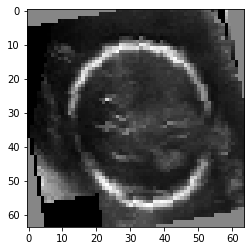

In [ ]:
%matplotlib inline 
from matplotlib import pyplot as plt

for x,_ in dataloader:
    plt.imshow(x.numpy()[0][0], cmap='gray')
    print(x.numpy()[0][0].shape)
    print(x.shape)
    break

## Generator

In [ ]:
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.002)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.002)
        nn.init.constant_(model.bias.data, 0)

In [ ]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

## Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

## Initialise network

In [ ]:
def save_checkpoint(state, output_file='../DCGAN64/org_params/800_training.pt'):
  """Function which saves a checkpoint containing model state into a file"""
  print("Saving checkpoint at epoch : ", state['epoch']-1)
  torch.save(state, output_file)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)
netD.apply(weights_init)

# Print the model
print(netG)
print(netD)

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 0.9
fake_label = 0.

# Hyperparameters
gen_lr = 2e-3
dis_lr = 2e-3

# wd_gen = 1e-2
# wd_dis = 1e-1

beta1 = 0.5

# Setup Adam optimizers for both G and D
optimizerG = optim.Adam(netG.parameters(), lr=gen_lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=dis_lr, betas=(beta1, 0.999))



Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Training

Starting Training Loop...
[0/1000][0/13]	Loss_D: 1.4063	Loss_G: 1.0488	D(x): 0.5163	D(G(z)): 0.5215 / 0.3404


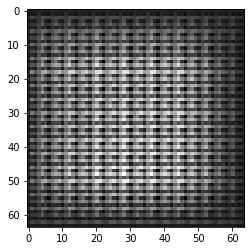

[0/1000] G_loss: 3.0526857376098633, D_loss: 1.7158452272415161
[1/1000][0/13]	Loss_D: 1.6075	Loss_G: 5.6170	D(x): 0.7700	D(G(z)): 0.5453 / 0.0049


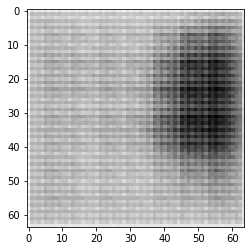

[1/1000] G_loss: 3.184797525405884, D_loss: 1.0191305875778198
[2/1000][0/13]	Loss_D: 1.3643	Loss_G: 4.0183	D(x): 0.8311	D(G(z)): 0.4679 / 0.0332


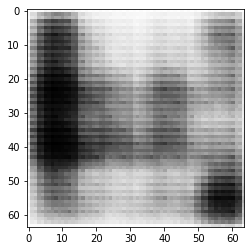

[2/1000] G_loss: 2.633122444152832, D_loss: 1.4663681983947754
[3/1000][0/13]	Loss_D: 1.0761	Loss_G: 2.7235	D(x): 0.4988	D(G(z)): 0.1771 / 0.0762


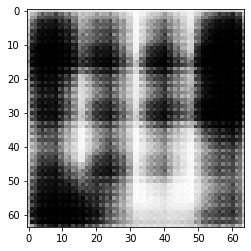

[3/1000] G_loss: 2.4483156204223633, D_loss: 1.5397576093673706
[4/1000][0/13]	Loss_D: 3.8578	Loss_G: 1.3000	D(x): 0.0283	D(G(z)): 0.0149 / 0.2900


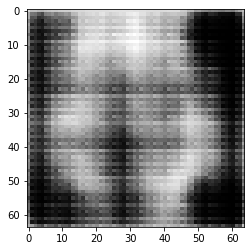

[4/1000] G_loss: 1.8736764192581177, D_loss: 1.46058189868927
Saving checkpoint at epoch :  4
[5/1000][0/13]	Loss_D: 1.8531	Loss_G: 1.4643	D(x): 0.3014	D(G(z)): 0.1575 / 0.2531


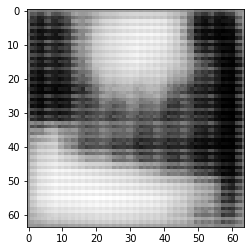

[5/1000] G_loss: 2.9096004962921143, D_loss: 1.4349923133850098
[6/1000][0/13]	Loss_D: 0.8188	Loss_G: 2.5869	D(x): 0.6567	D(G(z)): 0.1069 / 0.1052


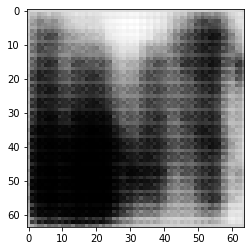

[6/1000] G_loss: 2.642202615737915, D_loss: 1.163491129875183
[7/1000][0/13]	Loss_D: 1.3398	Loss_G: 1.7842	D(x): 0.4817	D(G(z)): 0.2593 / 0.2142


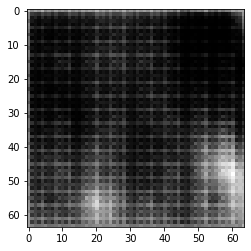

[7/1000] G_loss: 2.338564395904541, D_loss: 0.9502009749412537
[8/1000][0/13]	Loss_D: 0.7245	Loss_G: 3.2283	D(x): 0.9059	D(G(z)): 0.1818 / 0.0435


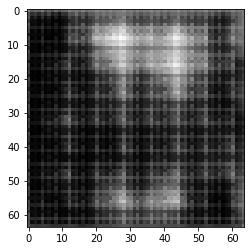

[8/1000] G_loss: 3.1876139640808105, D_loss: 1.0080361366271973
[9/1000][0/13]	Loss_D: 0.7555	Loss_G: 3.4082	D(x): 0.8409	D(G(z)): 0.1890 / 0.0814


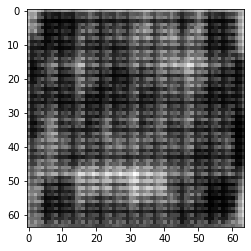

[9/1000] G_loss: 3.1504292488098145, D_loss: 1.3214384317398071
Saving checkpoint at epoch :  9
[10/1000][0/13]	Loss_D: 0.7575	Loss_G: 2.4237	D(x): 0.7064	D(G(z)): 0.1399 / 0.1034


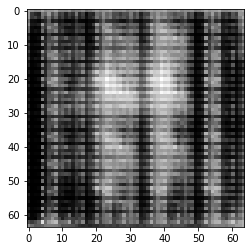

[10/1000] G_loss: 3.3859708309173584, D_loss: 1.1848390102386475
[11/1000][0/13]	Loss_D: 0.5978	Loss_G: 3.8162	D(x): 0.8809	D(G(z)): 0.1323 / 0.0222


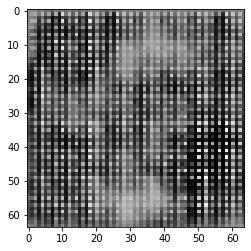

[11/1000] G_loss: 4.160930156707764, D_loss: 1.0981470346450806
[12/1000][0/13]	Loss_D: 0.6838	Loss_G: 3.9393	D(x): 0.9246	D(G(z)): 0.1453 / 0.0215


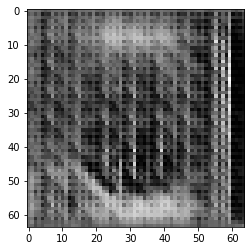

[12/1000] G_loss: 4.396188259124756, D_loss: 1.5067323446273804
[13/1000][0/13]	Loss_D: 1.4595	Loss_G: 2.0321	D(x): 0.4200	D(G(z)): 0.1026 / 0.1344


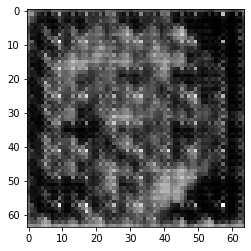

[13/1000] G_loss: 3.5022222995758057, D_loss: 1.157973051071167
[14/1000][0/13]	Loss_D: 1.2450	Loss_G: 2.2550	D(x): 0.4784	D(G(z)): 0.2691 / 0.1040


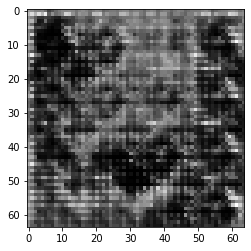

[14/1000] G_loss: 4.797246932983398, D_loss: 1.5840239524841309
Saving checkpoint at epoch :  14
[15/1000][0/13]	Loss_D: 1.0126	Loss_G: 4.1967	D(x): 0.9199	D(G(z)): 0.2901 / 0.0187


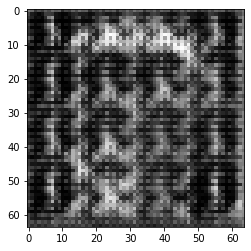

[15/1000] G_loss: 4.333107948303223, D_loss: 1.1487300395965576
[16/1000][0/13]	Loss_D: 0.9619	Loss_G: 2.7429	D(x): 0.6328	D(G(z)): 0.0942 / 0.1040


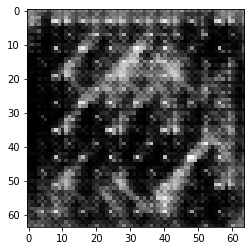

[16/1000] G_loss: 4.0160932540893555, D_loss: 1.568234920501709
[17/1000][0/13]	Loss_D: 1.0641	Loss_G: 4.4381	D(x): 0.9533	D(G(z)): 0.3309 / 0.0265


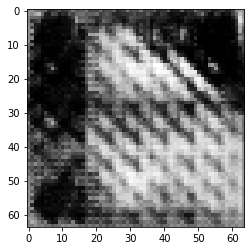

[17/1000] G_loss: 3.676372528076172, D_loss: 1.167632818222046
[18/1000][0/13]	Loss_D: 0.8153	Loss_G: 2.2259	D(x): 0.6364	D(G(z)): 0.1115 / 0.1147


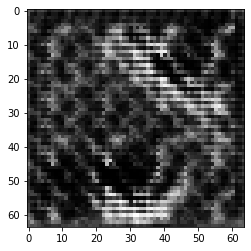

[18/1000] G_loss: 4.3799872398376465, D_loss: 1.3546624183654785
[19/1000][0/13]	Loss_D: 0.9206	Loss_G: 2.3467	D(x): 0.7534	D(G(z)): 0.3221 / 0.0976


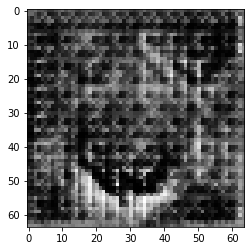

[19/1000] G_loss: 4.655146598815918, D_loss: 1.4227818250656128
Saving checkpoint at epoch :  19
[20/1000][0/13]	Loss_D: 3.5022	Loss_G: 5.3900	D(x): 0.1186	D(G(z)): 0.0015 / 0.0063


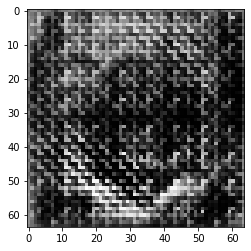

[20/1000] G_loss: 4.063571929931641, D_loss: 1.5328967571258545
[21/1000][0/13]	Loss_D: 1.7118	Loss_G: 6.2189	D(x): 0.8273	D(G(z)): 0.6500 / 0.0081


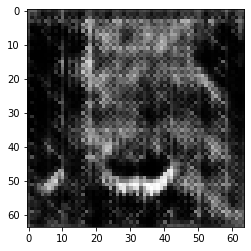

[21/1000] G_loss: 4.396889686584473, D_loss: 1.4804586172103882
[22/1000][0/13]	Loss_D: 0.8916	Loss_G: 3.1969	D(x): 0.6734	D(G(z)): 0.2724 / 0.0376


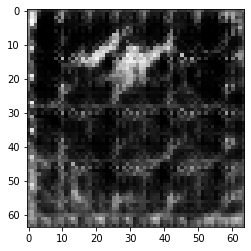

[22/1000] G_loss: 3.989093542098999, D_loss: 1.3386021852493286
[23/1000][0/13]	Loss_D: 1.7039	Loss_G: 2.1149	D(x): 0.2726	D(G(z)): 0.1056 / 0.1581


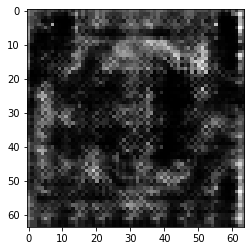

[23/1000] G_loss: 4.393799304962158, D_loss: 1.5537669658660889
[24/1000][0/13]	Loss_D: 1.5310	Loss_G: 1.9928	D(x): 0.3047	D(G(z)): 0.0543 / 0.1381


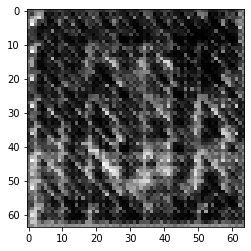

[24/1000] G_loss: 3.6686620712280273, D_loss: 1.0784237384796143
Saving checkpoint at epoch :  24
[25/1000][0/13]	Loss_D: 0.8569	Loss_G: 5.2251	D(x): 0.7930	D(G(z)): 0.3117 / 0.0045


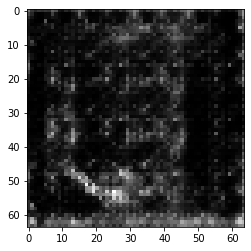

[25/1000] G_loss: 4.6577558517456055, D_loss: 1.4369874000549316
[26/1000][0/13]	Loss_D: 1.1306	Loss_G: 4.1054	D(x): 0.6076	D(G(z)): 0.3206 / 0.0237


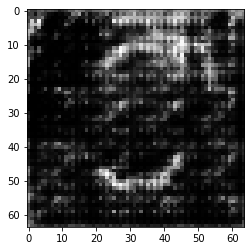

[26/1000] G_loss: 3.9097867012023926, D_loss: 1.1527618169784546
[27/1000][0/13]	Loss_D: 1.3629	Loss_G: 6.5432	D(x): 0.7472	D(G(z)): 0.5278 / 0.0010


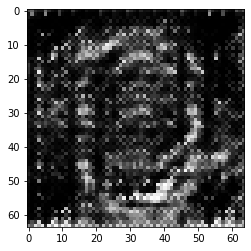

[27/1000] G_loss: 4.526865005493164, D_loss: 1.3475881814956665
[28/1000][0/13]	Loss_D: 1.0029	Loss_G: 3.2035	D(x): 0.4701	D(G(z)): 0.0214 / 0.0428


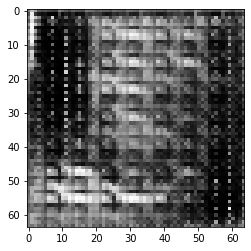

[28/1000] G_loss: 3.8745410442352295, D_loss: 1.04495108127594
[29/1000][0/13]	Loss_D: 1.3833	Loss_G: 2.8350	D(x): 0.2977	D(G(z)): 0.0219 / 0.0700


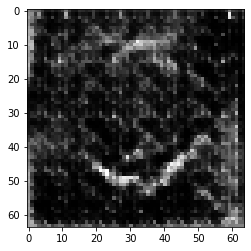

[29/1000] G_loss: 4.358026027679443, D_loss: 1.1120587587356567
Saving checkpoint at epoch :  29
[30/1000][0/13]	Loss_D: 0.9963	Loss_G: 5.3177	D(x): 0.8047	D(G(z)): 0.3809 / 0.0054


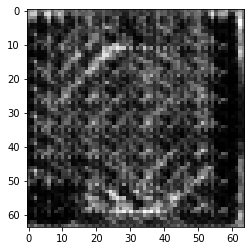

[30/1000] G_loss: 4.295464038848877, D_loss: 1.351407766342163
[31/1000][0/13]	Loss_D: 1.6732	Loss_G: 2.7994	D(x): 0.2601	D(G(z)): 0.0317 / 0.0845


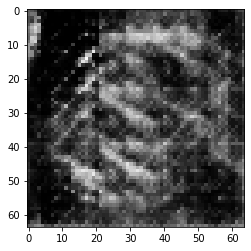

[31/1000] G_loss: 3.8927001953125, D_loss: 1.2554460763931274
[32/1000][0/13]	Loss_D: 1.5485	Loss_G: 7.9841	D(x): 0.7146	D(G(z)): 0.5774 / 0.0005


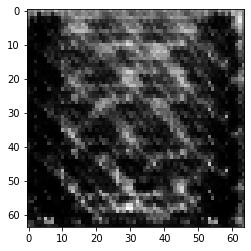

[32/1000] G_loss: 4.183594703674316, D_loss: 1.3257784843444824
[33/1000][0/13]	Loss_D: 0.8400	Loss_G: 2.6348	D(x): 0.5302	D(G(z)): 0.0898 / 0.0697


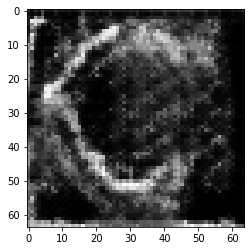

[33/1000] G_loss: 4.088068008422852, D_loss: 1.1532950401306152
[34/1000][0/13]	Loss_D: 1.8264	Loss_G: 3.0709	D(x): 0.2591	D(G(z)): 0.0217 / 0.0444


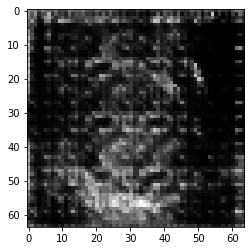

[34/1000] G_loss: 3.5888912677764893, D_loss: 1.2609432935714722
Saving checkpoint at epoch :  34
[35/1000][0/13]	Loss_D: 0.9300	Loss_G: 3.8154	D(x): 0.7601	D(G(z)): 0.3016 / 0.0329


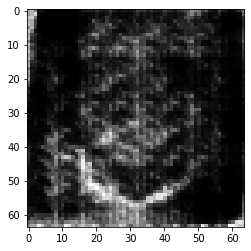

[35/1000] G_loss: 3.7716903686523438, D_loss: 1.2765644788742065
[36/1000][0/13]	Loss_D: 0.7737	Loss_G: 3.1758	D(x): 0.6463	D(G(z)): 0.1415 / 0.0377


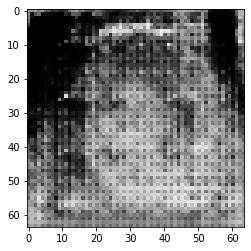

[36/1000] G_loss: 4.066131591796875, D_loss: 1.376001238822937
[37/1000][0/13]	Loss_D: 0.7955	Loss_G: 2.7078	D(x): 0.5556	D(G(z)): 0.0742 / 0.0890


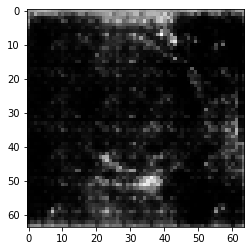

[37/1000] G_loss: 3.3334834575653076, D_loss: 0.902317464351654
[38/1000][0/13]	Loss_D: 0.9111	Loss_G: 2.6251	D(x): 0.6089	D(G(z)): 0.1422 / 0.0672


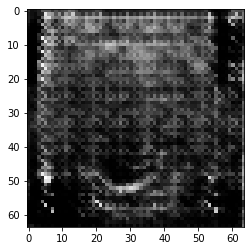

[38/1000] G_loss: 3.8122000694274902, D_loss: 1.18960440158844
[39/1000][0/13]	Loss_D: 1.6642	Loss_G: 4.7306	D(x): 0.2614	D(G(z)): 0.0076 / 0.0144


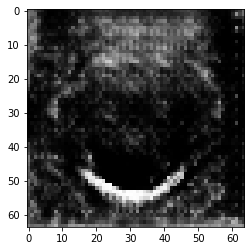

[39/1000] G_loss: 3.6876349449157715, D_loss: 1.1813571453094482
Saving checkpoint at epoch :  39
[40/1000][0/13]	Loss_D: 1.1362	Loss_G: 2.6052	D(x): 0.4034	D(G(z)): 0.0936 / 0.0977


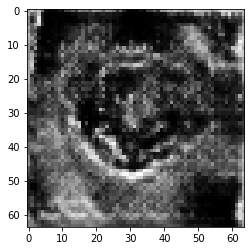

[40/1000] G_loss: 3.887592077255249, D_loss: 1.2252798080444336
[41/1000][0/13]	Loss_D: 1.4104	Loss_G: 3.7772	D(x): 0.3123	D(G(z)): 0.0242 / 0.0291


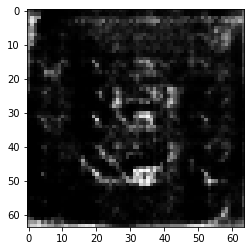

[41/1000] G_loss: 3.6328625679016113, D_loss: 1.119739294052124
[42/1000][0/13]	Loss_D: 0.8015	Loss_G: 3.6562	D(x): 0.6955	D(G(z)): 0.2133 / 0.0233


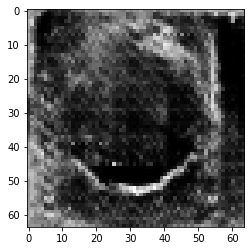

[42/1000] G_loss: 4.084096908569336, D_loss: 1.2900516986846924
[43/1000][0/13]	Loss_D: 0.6864	Loss_G: 2.4950	D(x): 0.6432	D(G(z)): 0.0549 / 0.0876


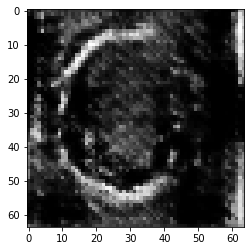

[43/1000] G_loss: 3.7116713523864746, D_loss: 0.9733917713165283
[44/1000][0/13]	Loss_D: 0.8980	Loss_G: 3.4983	D(x): 0.6950	D(G(z)): 0.2733 / 0.0310


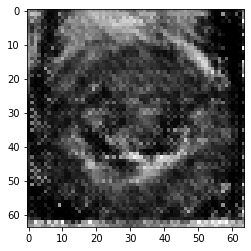

[44/1000] G_loss: 3.8428728580474854, D_loss: 1.1263103485107422
Saving checkpoint at epoch :  44
[45/1000][0/13]	Loss_D: 1.8515	Loss_G: 6.1383	D(x): 0.6627	D(G(z)): 0.6691 / 0.0021


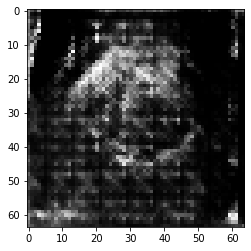

[45/1000] G_loss: 3.9131815433502197, D_loss: 0.9579254388809204
[46/1000][0/13]	Loss_D: 1.4028	Loss_G: 1.7392	D(x): 0.3409	D(G(z)): 0.0572 / 0.2096


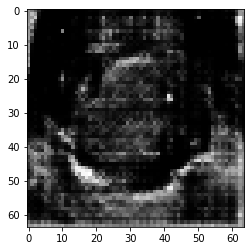

[46/1000] G_loss: 4.314150333404541, D_loss: 1.4204328060150146
[47/1000][0/13]	Loss_D: 1.1368	Loss_G: 4.2686	D(x): 0.8397	D(G(z)): 0.4392 / 0.0138


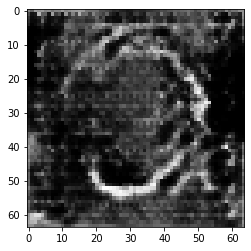

[47/1000] G_loss: 3.4151265621185303, D_loss: 0.8804816007614136
[48/1000][0/13]	Loss_D: 0.9868	Loss_G: 4.8142	D(x): 0.7659	D(G(z)): 0.3784 / 0.0078


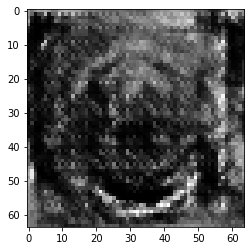

[48/1000] G_loss: 3.1988842487335205, D_loss: 1.0696470737457275
[49/1000][0/13]	Loss_D: 1.0392	Loss_G: 1.9864	D(x): 0.5202	D(G(z)): 0.1594 / 0.1775


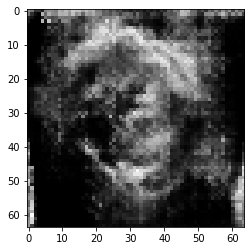

[49/1000] G_loss: 3.1338412761688232, D_loss: 1.1195127964019775
Saving checkpoint at epoch :  49
[50/1000][0/13]	Loss_D: 0.9065	Loss_G: 2.7896	D(x): 0.5597	D(G(z)): 0.1310 / 0.0714


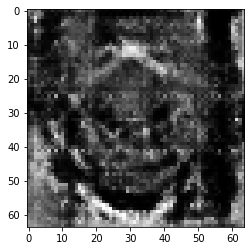

[50/1000] G_loss: 3.5376179218292236, D_loss: 1.04067063331604
[51/1000][0/13]	Loss_D: 0.9565	Loss_G: 3.9689	D(x): 0.6950	D(G(z)): 0.3238 / 0.0231


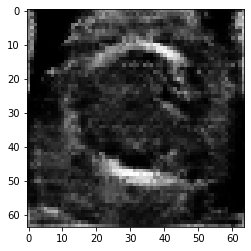

[51/1000] G_loss: 3.0195999145507812, D_loss: 1.132016658782959
[52/1000][0/13]	Loss_D: 1.3906	Loss_G: 5.6437	D(x): 0.8403	D(G(z)): 0.5737 / 0.0026


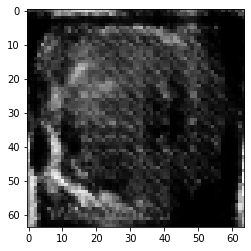

[52/1000] G_loss: 3.504455327987671, D_loss: 0.9592233300209045
[53/1000][0/13]	Loss_D: 0.9522	Loss_G: 3.3116	D(x): 0.6652	D(G(z)): 0.2627 / 0.0381


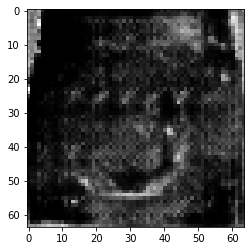

[53/1000] G_loss: 3.3664751052856445, D_loss: 0.9938627481460571
[54/1000][0/13]	Loss_D: 0.9579	Loss_G: 4.5510	D(x): 0.8819	D(G(z)): 0.3970 / 0.0132


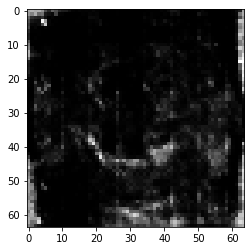

[54/1000] G_loss: 3.8346457481384277, D_loss: 1.0268155336380005
Saving checkpoint at epoch :  54
[55/1000][0/13]	Loss_D: 1.0796	Loss_G: 2.2550	D(x): 0.5306	D(G(z)): 0.1605 / 0.1052


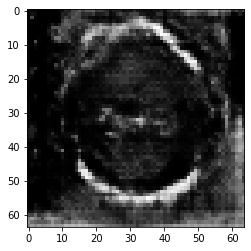

[55/1000] G_loss: 3.8112244606018066, D_loss: 0.8401319980621338
[56/1000][0/13]	Loss_D: 2.6204	Loss_G: 1.9730	D(x): 0.1147	D(G(z)): 0.0085 / 0.1645


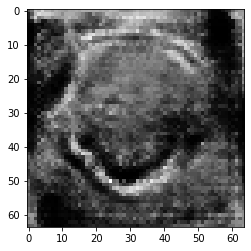

[56/1000] G_loss: 3.5569746494293213, D_loss: 1.1361968517303467
[57/1000][0/13]	Loss_D: 0.9404	Loss_G: 3.0153	D(x): 0.6041	D(G(z)): 0.1778 / 0.0547


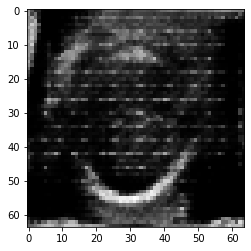

[57/1000] G_loss: 3.82822585105896, D_loss: 1.2466907501220703
[58/1000][0/13]	Loss_D: 1.4213	Loss_G: 2.6127	D(x): 0.3169	D(G(z)): 0.0355 / 0.0900


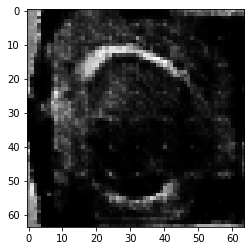

[58/1000] G_loss: 2.988924980163574, D_loss: 1.0222980976104736
[59/1000][0/13]	Loss_D: 0.8593	Loss_G: 3.1601	D(x): 0.6416	D(G(z)): 0.2124 / 0.0382


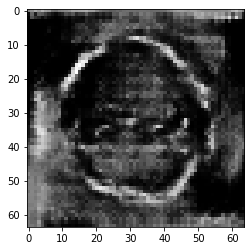

[59/1000] G_loss: 3.355573892593384, D_loss: 0.836716890335083
Saving checkpoint at epoch :  59
[60/1000][0/13]	Loss_D: 0.9840	Loss_G: 5.6448	D(x): 0.8200	D(G(z)): 0.3816 / 0.0029


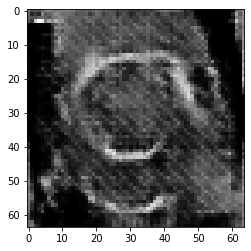

[60/1000] G_loss: 3.800607442855835, D_loss: 1.3125845193862915
[61/1000][0/13]	Loss_D: 0.9650	Loss_G: 3.6400	D(x): 0.7650	D(G(z)): 0.3485 / 0.0256


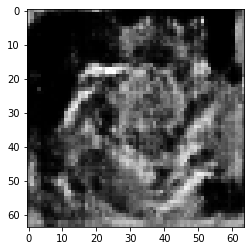

[61/1000] G_loss: 3.4727251529693604, D_loss: 1.2411125898361206
[62/1000][0/13]	Loss_D: 0.9546	Loss_G: 3.9517	D(x): 0.6796	D(G(z)): 0.2715 / 0.0191


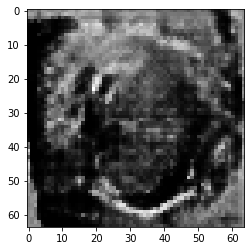

[62/1000] G_loss: 3.284820795059204, D_loss: 1.1211583614349365
[63/1000][0/13]	Loss_D: 0.8899	Loss_G: 2.9085	D(x): 0.7268	D(G(z)): 0.2799 / 0.0583


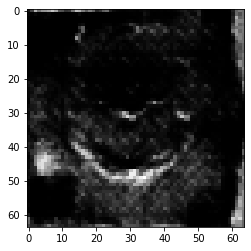

[63/1000] G_loss: 3.219845771789551, D_loss: 0.8539007902145386
[64/1000][0/13]	Loss_D: 0.9895	Loss_G: 5.2615	D(x): 0.8398	D(G(z)): 0.4104 / 0.0048


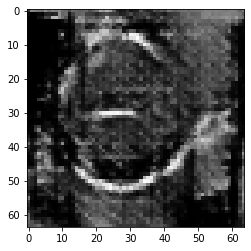

[64/1000] G_loss: 3.4175448417663574, D_loss: 0.9825429320335388
Saving checkpoint at epoch :  64
[65/1000][0/13]	Loss_D: 1.0536	Loss_G: 4.8297	D(x): 0.7760	D(G(z)): 0.4127 / 0.0063


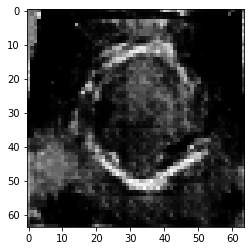

[65/1000] G_loss: 3.666242837905884, D_loss: 1.2309165000915527
[66/1000][0/13]	Loss_D: 0.8841	Loss_G: 2.0660	D(x): 0.5595	D(G(z)): 0.1169 / 0.1401


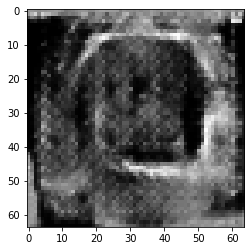

[66/1000] G_loss: 3.0397558212280273, D_loss: 1.204505443572998
[67/1000][0/13]	Loss_D: 1.1507	Loss_G: 4.0019	D(x): 0.8306	D(G(z)): 0.4766 / 0.0192


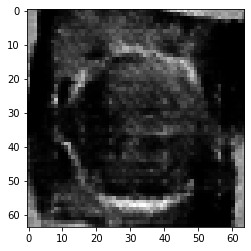

[67/1000] G_loss: 3.1818277835845947, D_loss: 1.1239373683929443
[68/1000][0/13]	Loss_D: 1.3541	Loss_G: 2.3644	D(x): 0.3683	D(G(z)): 0.0777 / 0.1021


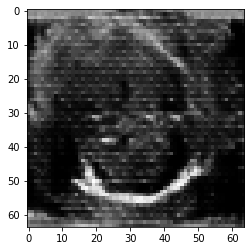

[68/1000] G_loss: 3.096421241760254, D_loss: 1.0700474977493286
[69/1000][0/13]	Loss_D: 1.0543	Loss_G: 2.0326	D(x): 0.5067	D(G(z)): 0.2000 / 0.1345


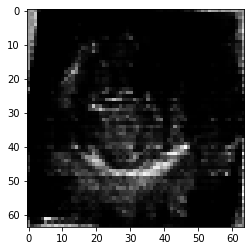

[69/1000] G_loss: 3.2523348331451416, D_loss: 1.0072389841079712
Saving checkpoint at epoch :  69
[70/1000][0/13]	Loss_D: 1.2337	Loss_G: 3.1419	D(x): 0.3738	D(G(z)): 0.0265 / 0.0621


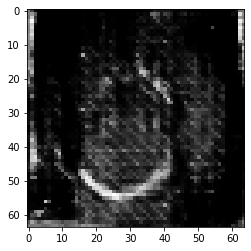

[70/1000] G_loss: 3.3393008708953857, D_loss: 0.8965572118759155
[71/1000][0/13]	Loss_D: 1.1015	Loss_G: 5.2897	D(x): 0.7990	D(G(z)): 0.4452 / 0.0039


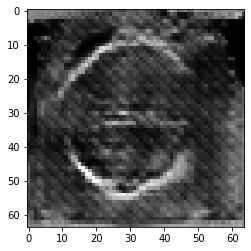

[71/1000] G_loss: 3.0047595500946045, D_loss: 1.0274760723114014
[72/1000][0/13]	Loss_D: 1.0367	Loss_G: 2.2905	D(x): 0.5660	D(G(z)): 0.2423 / 0.1019


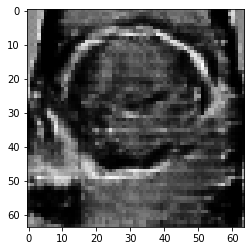

[72/1000] G_loss: 3.0513458251953125, D_loss: 1.0551376342773438
[73/1000][0/13]	Loss_D: 1.2018	Loss_G: 5.2311	D(x): 0.8245	D(G(z)): 0.4965 / 0.0052


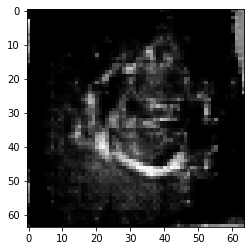

[73/1000] G_loss: 3.4047701358795166, D_loss: 1.0975764989852905
[74/1000][0/13]	Loss_D: 0.7475	Loss_G: 3.7654	D(x): 0.7427	D(G(z)): 0.1677 / 0.0213


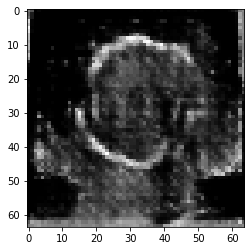

[74/1000] G_loss: 3.143765449523926, D_loss: 0.9669418931007385
Saving checkpoint at epoch :  74
[75/1000][0/13]	Loss_D: 1.2225	Loss_G: 0.9849	D(x): 0.3777	D(G(z)): 0.0645 / 0.4172


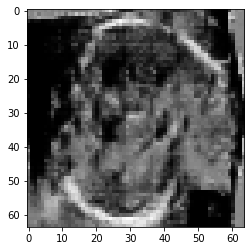

[75/1000] G_loss: 3.001755714416504, D_loss: 1.2411118745803833
[76/1000][0/13]	Loss_D: 0.9369	Loss_G: 2.4611	D(x): 0.7128	D(G(z)): 0.3044 / 0.0839


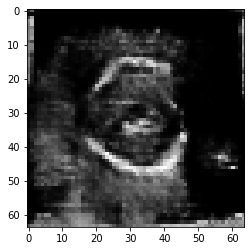

[76/1000] G_loss: 3.050507068634033, D_loss: 1.1376688480377197
[77/1000][0/13]	Loss_D: 0.7492	Loss_G: 3.2664	D(x): 0.7220	D(G(z)): 0.2065 / 0.0412


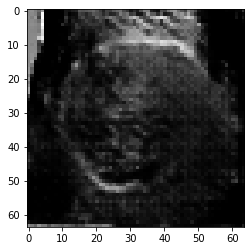

[77/1000] G_loss: 3.6246464252471924, D_loss: 0.9518662691116333
[78/1000][0/13]	Loss_D: 2.6960	Loss_G: 2.2016	D(x): 0.1012	D(G(z)): 0.0046 / 0.1336


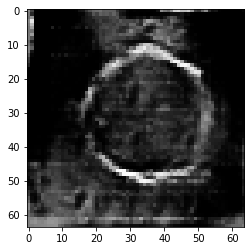

[78/1000] G_loss: 3.0929174423217773, D_loss: 1.108886957168579
[79/1000][0/13]	Loss_D: 1.2344	Loss_G: 2.4683	D(x): 0.3900	D(G(z)): 0.0685 / 0.1060


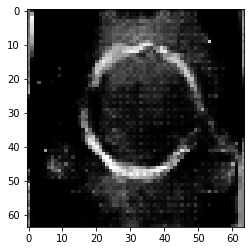

[79/1000] G_loss: 2.824636936187744, D_loss: 1.1451103687286377
Saving checkpoint at epoch :  79
[80/1000][0/13]	Loss_D: 1.0570	Loss_G: 3.4737	D(x): 0.6415	D(G(z)): 0.3337 / 0.0292


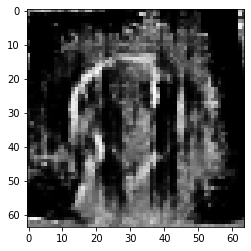

[80/1000] G_loss: 3.207953453063965, D_loss: 1.1211657524108887
[81/1000][0/13]	Loss_D: 0.9198	Loss_G: 2.4642	D(x): 0.5751	D(G(z)): 0.1550 / 0.0913


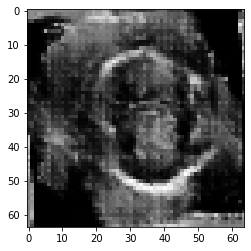

[81/1000] G_loss: 2.719435453414917, D_loss: 1.133386492729187
[82/1000][0/13]	Loss_D: 1.2006	Loss_G: 3.6125	D(x): 0.7795	D(G(z)): 0.4311 / 0.0336


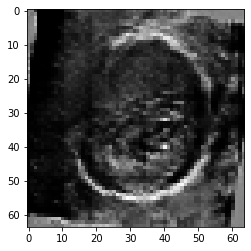

[82/1000] G_loss: 2.9552037715911865, D_loss: 1.1223057508468628
[83/1000][0/13]	Loss_D: 1.3049	Loss_G: 1.3294	D(x): 0.3640	D(G(z)): 0.0737 / 0.2851


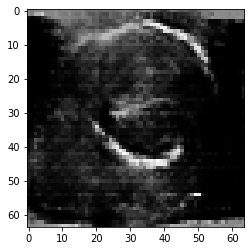

[83/1000] G_loss: 2.8331997394561768, D_loss: 1.1668339967727661
[84/1000][0/13]	Loss_D: 1.6147	Loss_G: 4.2172	D(x): 0.8782	D(G(z)): 0.6273 / 0.0188


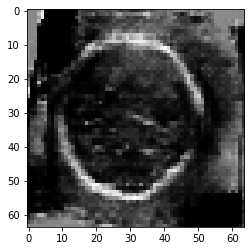

[84/1000] G_loss: 2.8822784423828125, D_loss: 1.0945557355880737
Saving checkpoint at epoch :  84
[85/1000][0/13]	Loss_D: 0.9432	Loss_G: 2.1130	D(x): 0.5222	D(G(z)): 0.1189 / 0.1429


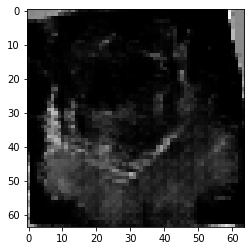

[85/1000] G_loss: 2.7647817134857178, D_loss: 1.1273571252822876
[86/1000][0/13]	Loss_D: 1.4038	Loss_G: 1.6605	D(x): 0.3575	D(G(z)): 0.1302 / 0.2302


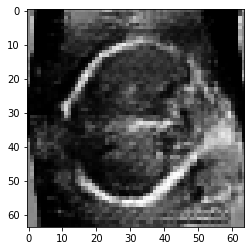

[86/1000] G_loss: 2.649033546447754, D_loss: 1.1853809356689453
[87/1000][0/13]	Loss_D: 0.8644	Loss_G: 1.9624	D(x): 0.5695	D(G(z)): 0.1447 / 0.1440


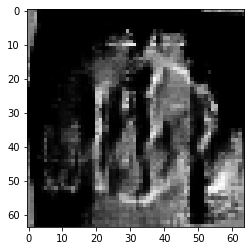

[87/1000] G_loss: 2.722578763961792, D_loss: 1.1013240814208984
[88/1000][0/13]	Loss_D: 1.1311	Loss_G: 1.3830	D(x): 0.3926	D(G(z)): 0.0863 / 0.2702


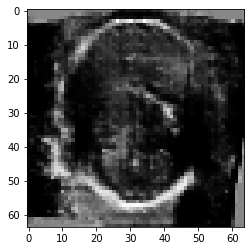

[88/1000] G_loss: 2.4983267784118652, D_loss: 1.189066767692566
[89/1000][0/13]	Loss_D: 1.1775	Loss_G: 3.7361	D(x): 0.7295	D(G(z)): 0.4318 / 0.0274


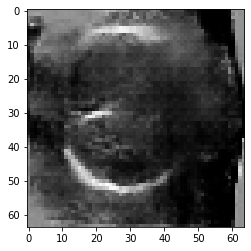

[89/1000] G_loss: 2.7711145877838135, D_loss: 1.1539387702941895
Saving checkpoint at epoch :  89
[90/1000][0/13]	Loss_D: 0.9090	Loss_G: 2.6200	D(x): 0.5247	D(G(z)): 0.1158 / 0.0889


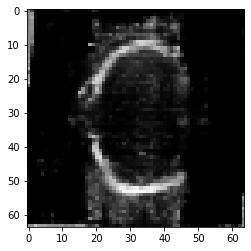

[90/1000] G_loss: 2.61561918258667, D_loss: 1.1420910358428955
[91/1000][0/13]	Loss_D: 1.2124	Loss_G: 3.7532	D(x): 0.6915	D(G(z)): 0.4642 / 0.0239


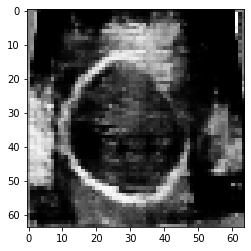

[91/1000] G_loss: 2.6489572525024414, D_loss: 1.2467414140701294
[92/1000][0/13]	Loss_D: 1.0555	Loss_G: 1.9564	D(x): 0.5586	D(G(z)): 0.2742 / 0.1488


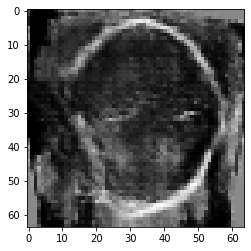

[92/1000] G_loss: 2.4693708419799805, D_loss: 1.060713529586792
[93/1000][0/13]	Loss_D: 1.2856	Loss_G: 4.3322	D(x): 0.7927	D(G(z)): 0.5271 / 0.0126


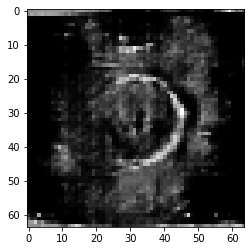

[93/1000] G_loss: 2.649531126022339, D_loss: 1.1836893558502197
[94/1000][0/13]	Loss_D: 1.1621	Loss_G: 3.2629	D(x): 0.6873	D(G(z)): 0.4071 / 0.0416


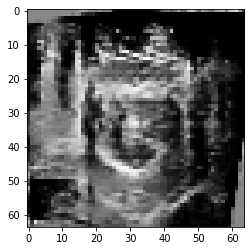

[94/1000] G_loss: 2.774162530899048, D_loss: 1.1783944368362427
Saving checkpoint at epoch :  94
[95/1000][0/13]	Loss_D: 1.6248	Loss_G: 1.6784	D(x): 0.2361	D(G(z)): 0.0347 / 0.2214


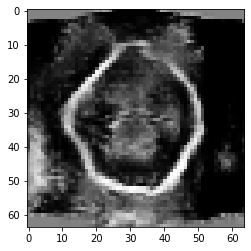

[95/1000] G_loss: 2.434569835662842, D_loss: 1.1547248363494873
[96/1000][0/13]	Loss_D: 1.1583	Loss_G: 3.7285	D(x): 0.6956	D(G(z)): 0.4323 / 0.0247


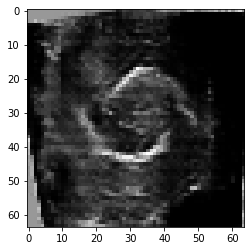

[96/1000] G_loss: 2.6011135578155518, D_loss: 1.0303858518600464
[97/1000][0/13]	Loss_D: 1.0099	Loss_G: 1.8498	D(x): 0.5235	D(G(z)): 0.2157 / 0.1552


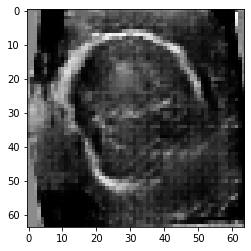

[97/1000] G_loss: 2.413686752319336, D_loss: 1.1195826530456543
[98/1000][0/13]	Loss_D: 1.2332	Loss_G: 3.3004	D(x): 0.7240	D(G(z)): 0.4857 / 0.0333


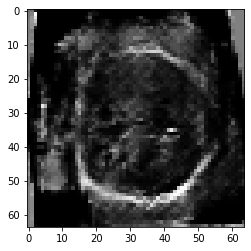

[98/1000] G_loss: 2.4637272357940674, D_loss: 1.108629584312439
[99/1000][0/13]	Loss_D: 1.5383	Loss_G: 4.8511	D(x): 0.8402	D(G(z)): 0.6345 / 0.0070


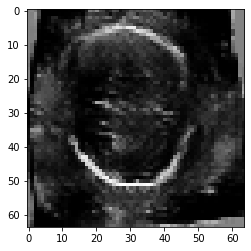

[99/1000] G_loss: 2.6589009761810303, D_loss: 1.1408652067184448
Saving checkpoint at epoch :  99
[100/1000][0/13]	Loss_D: 1.2023	Loss_G: 4.8549	D(x): 0.8624	D(G(z)): 0.4920 / 0.0062


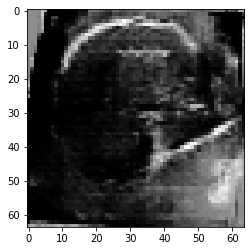

[100/1000] G_loss: 2.7094626426696777, D_loss: 1.117466688156128
[101/1000][0/13]	Loss_D: 1.1730	Loss_G: 3.8542	D(x): 0.7047	D(G(z)): 0.4533 / 0.0231


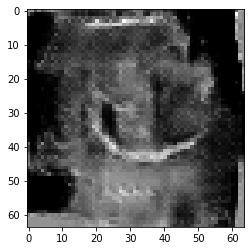

[101/1000] G_loss: 2.46966552734375, D_loss: 1.1783416271209717
[102/1000][0/13]	Loss_D: 1.3198	Loss_G: 3.6770	D(x): 0.8595	D(G(z)): 0.5225 / 0.0320


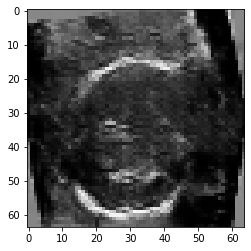

[102/1000] G_loss: 2.673187732696533, D_loss: 1.0325325727462769
[103/1000][0/13]	Loss_D: 1.5788	Loss_G: 1.2878	D(x): 0.2573	D(G(z)): 0.0312 / 0.3026


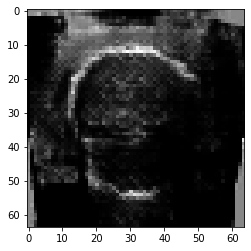

[103/1000] G_loss: 2.544950246810913, D_loss: 1.227460503578186
[104/1000][0/13]	Loss_D: 1.0102	Loss_G: 2.5782	D(x): 0.5924	D(G(z)): 0.2599 / 0.0766


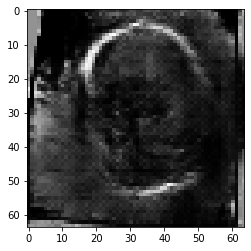

[104/1000] G_loss: 2.6350884437561035, D_loss: 1.1468709707260132
Saving checkpoint at epoch :  104
[105/1000][0/13]	Loss_D: 1.0410	Loss_G: 2.2899	D(x): 0.6374	D(G(z)): 0.3403 / 0.1032


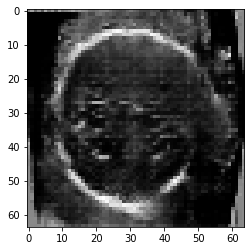

[105/1000] G_loss: 2.650146484375, D_loss: 1.009887933731079
[106/1000][0/13]	Loss_D: 0.9151	Loss_G: 2.6253	D(x): 0.6045	D(G(z)): 0.2252 / 0.0774


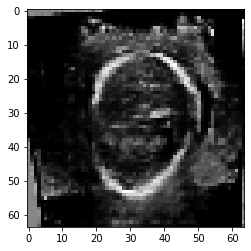

[106/1000] G_loss: 2.5397756099700928, D_loss: 1.0475245714187622
[107/1000][0/13]	Loss_D: 1.1006	Loss_G: 4.7186	D(x): 0.8440	D(G(z)): 0.4639 / 0.0077


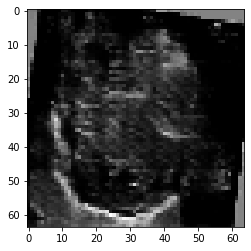

[107/1000] G_loss: 2.630977153778076, D_loss: 1.1643179655075073
[108/1000][0/13]	Loss_D: 0.9826	Loss_G: 2.9467	D(x): 0.6578	D(G(z)): 0.3104 / 0.0550


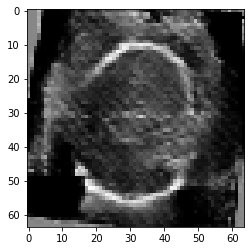

[108/1000] G_loss: 2.5713276863098145, D_loss: 1.079886794090271
[109/1000][0/13]	Loss_D: 1.3675	Loss_G: 5.5298	D(x): 0.8434	D(G(z)): 0.5682 / 0.0038


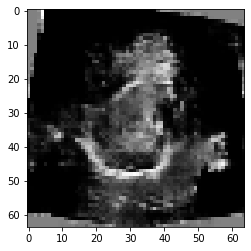

[109/1000] G_loss: 2.8289742469787598, D_loss: 1.1187126636505127
Saving checkpoint at epoch :  109
[110/1000][0/13]	Loss_D: 0.8215	Loss_G: 2.7693	D(x): 0.6332	D(G(z)): 0.1920 / 0.0706


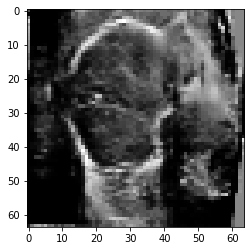

[110/1000] G_loss: 2.683082103729248, D_loss: 1.041340947151184
[111/1000][0/13]	Loss_D: 1.0236	Loss_G: 2.1023	D(x): 0.5999	D(G(z)): 0.2975 / 0.1331


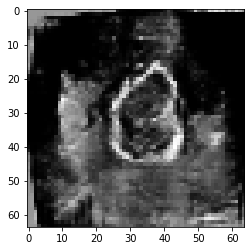

[111/1000] G_loss: 2.829693078994751, D_loss: 1.1690375804901123
[112/1000][0/13]	Loss_D: 0.9949	Loss_G: 1.6517	D(x): 0.5116	D(G(z)): 0.1969 / 0.2095


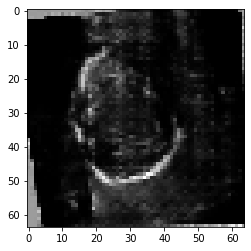

[112/1000] G_loss: 2.473320960998535, D_loss: 1.1442484855651855
[113/1000][0/13]	Loss_D: 1.0542	Loss_G: 1.9986	D(x): 0.4262	D(G(z)): 0.1061 / 0.1687


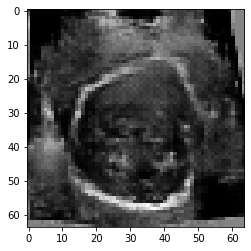

[113/1000] G_loss: 2.524515390396118, D_loss: 1.044630765914917
[114/1000][0/13]	Loss_D: 0.9791	Loss_G: 2.4166	D(x): 0.7131	D(G(z)): 0.3256 / 0.1074


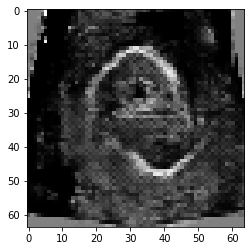

[114/1000] G_loss: 2.691577672958374, D_loss: 1.0757887363433838
Saving checkpoint at epoch :  114
[115/1000][0/13]	Loss_D: 0.8416	Loss_G: 1.9592	D(x): 0.6487	D(G(z)): 0.2281 / 0.1419


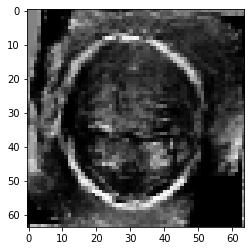

[115/1000] G_loss: 2.509585380554199, D_loss: 1.088622808456421
[116/1000][0/13]	Loss_D: 1.2805	Loss_G: 4.0968	D(x): 0.7564	D(G(z)): 0.5221 / 0.0159


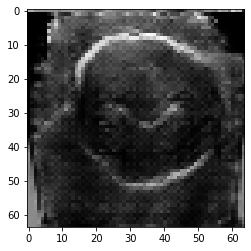

[116/1000] G_loss: 2.577267646789551, D_loss: 1.0318413972854614
[117/1000][0/13]	Loss_D: 1.1087	Loss_G: 2.8042	D(x): 0.7041	D(G(z)): 0.4090 / 0.0639


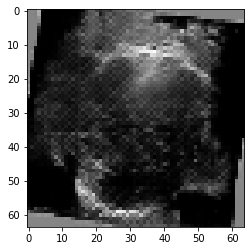

[117/1000] G_loss: 2.6705703735351562, D_loss: 1.0474690198898315
[118/1000][0/13]	Loss_D: 1.1315	Loss_G: 2.0322	D(x): 0.5217	D(G(z)): 0.2513 / 0.1489


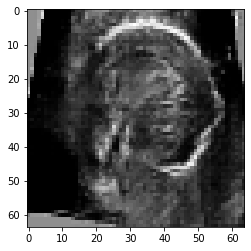

[118/1000] G_loss: 2.410297155380249, D_loss: 1.0567229986190796
[119/1000][0/13]	Loss_D: 2.1827	Loss_G: 5.3306	D(x): 0.9317	D(G(z)): 0.7613 / 0.0068


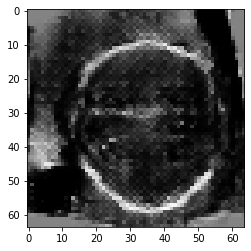

[119/1000] G_loss: 2.8610754013061523, D_loss: 1.1550990343093872
Saving checkpoint at epoch :  119
[120/1000][0/13]	Loss_D: 1.0709	Loss_G: 2.2317	D(x): 0.5582	D(G(z)): 0.2562 / 0.1156


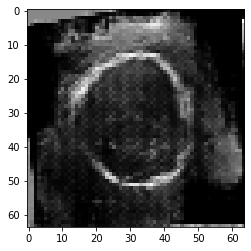

[120/1000] G_loss: 2.7706692218780518, D_loss: 1.186967134475708
[121/1000][0/13]	Loss_D: 1.1228	Loss_G: 1.6861	D(x): 0.4800	D(G(z)): 0.1540 / 0.2011


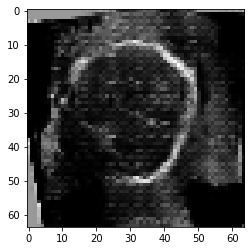

[121/1000] G_loss: 2.6236116886138916, D_loss: 1.087061882019043
[122/1000][0/13]	Loss_D: 0.9217	Loss_G: 2.1878	D(x): 0.5629	D(G(z)): 0.1792 / 0.1240


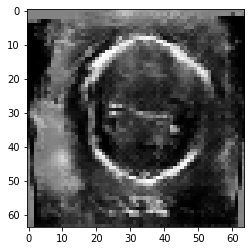

[122/1000] G_loss: 2.512664794921875, D_loss: 1.0539908409118652
[123/1000][0/13]	Loss_D: 0.8019	Loss_G: 3.1478	D(x): 0.7416	D(G(z)): 0.2733 / 0.0398


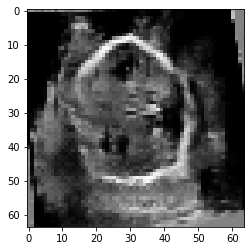

[123/1000] G_loss: 2.724915027618408, D_loss: 1.0720348358154297
[124/1000][0/13]	Loss_D: 1.3999	Loss_G: 2.2731	D(x): 0.3760	D(G(z)): 0.0836 / 0.1123


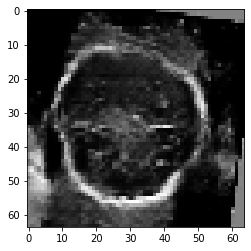

[124/1000] G_loss: 2.5335583686828613, D_loss: 1.0679004192352295
Saving checkpoint at epoch :  124
[125/1000][0/13]	Loss_D: 1.0687	Loss_G: 1.2866	D(x): 0.4463	D(G(z)): 0.1182 / 0.2951


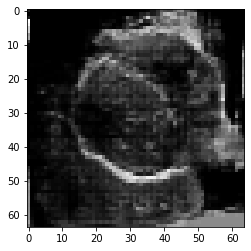

[125/1000] G_loss: 2.7332539558410645, D_loss: 1.077704906463623
[126/1000][0/13]	Loss_D: 1.2137	Loss_G: 1.4802	D(x): 0.3775	D(G(z)): 0.1282 / 0.2576


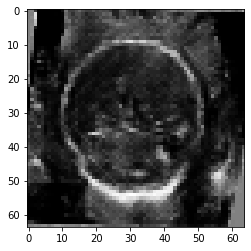

[126/1000] G_loss: 2.5425257682800293, D_loss: 0.9387056827545166
[127/1000][0/13]	Loss_D: 0.9339	Loss_G: 2.1343	D(x): 0.5774	D(G(z)): 0.2238 / 0.1297


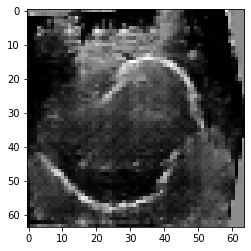

[127/1000] G_loss: 2.7989447116851807, D_loss: 1.2370975017547607
[128/1000][0/13]	Loss_D: 0.9199	Loss_G: 2.0357	D(x): 0.5913	D(G(z)): 0.2134 / 0.1398


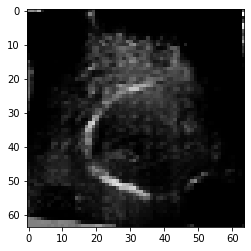

[128/1000] G_loss: 2.6321840286254883, D_loss: 1.0003924369812012
[129/1000][0/13]	Loss_D: 1.2060	Loss_G: 1.7542	D(x): 0.3646	D(G(z)): 0.0706 / 0.1948


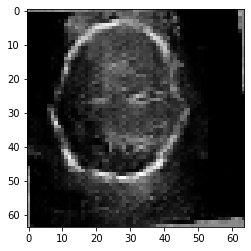

[129/1000] G_loss: 2.6051735877990723, D_loss: 1.0927256345748901
Saving checkpoint at epoch :  129
[130/1000][0/13]	Loss_D: 1.0188	Loss_G: 2.1749	D(x): 0.5827	D(G(z)): 0.2579 / 0.1209


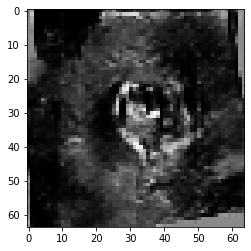

[130/1000] G_loss: 2.8370401859283447, D_loss: 1.0123921632766724
[131/1000][0/13]	Loss_D: 1.5015	Loss_G: 1.8698	D(x): 0.3448	D(G(z)): 0.0449 / 0.1626


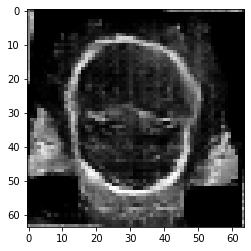

[131/1000] G_loss: 2.604868173599243, D_loss: 0.9748218059539795
[132/1000][0/13]	Loss_D: 1.0117	Loss_G: 3.0764	D(x): 0.6922	D(G(z)): 0.3276 / 0.0463


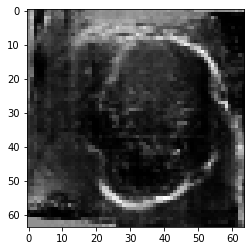

[132/1000] G_loss: 2.839050769805908, D_loss: 1.0759367942810059
[133/1000][0/13]	Loss_D: 0.9395	Loss_G: 3.2078	D(x): 0.7038	D(G(z)): 0.2953 / 0.0453


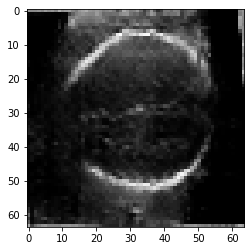

[133/1000] G_loss: 2.531553030014038, D_loss: 1.0285478830337524
[134/1000][0/13]	Loss_D: 0.9691	Loss_G: 3.9260	D(x): 0.7622	D(G(z)): 0.3802 / 0.0197


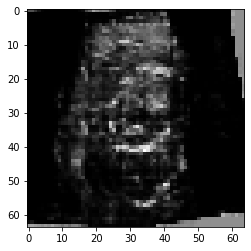

[134/1000] G_loss: 2.86844801902771, D_loss: 1.0383104085922241
Saving checkpoint at epoch :  134
[135/1000][0/13]	Loss_D: 0.8883	Loss_G: 2.7497	D(x): 0.6471	D(G(z)): 0.2146 / 0.0634


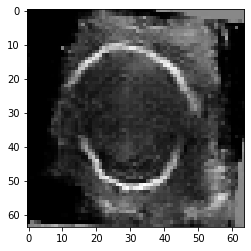

[135/1000] G_loss: 2.6516571044921875, D_loss: 0.9948145151138306
[136/1000][0/13]	Loss_D: 1.1269	Loss_G: 1.3205	D(x): 0.4446	D(G(z)): 0.1644 / 0.3058


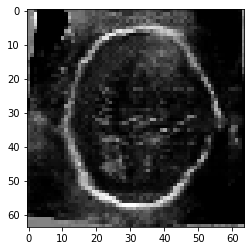

[136/1000] G_loss: 2.631115198135376, D_loss: 1.1061946153640747
[137/1000][0/13]	Loss_D: 1.1855	Loss_G: 2.0859	D(x): 0.5787	D(G(z)): 0.2958 / 0.1365


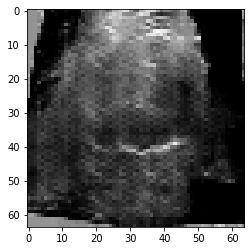

[137/1000] G_loss: 2.782074451446533, D_loss: 1.1655313968658447
[138/1000][0/13]	Loss_D: 0.9926	Loss_G: 2.8199	D(x): 0.7890	D(G(z)): 0.4042 / 0.0589


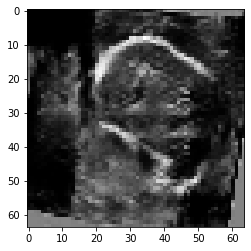

[138/1000] G_loss: 2.6802287101745605, D_loss: 0.9591462016105652
[139/1000][0/13]	Loss_D: 0.8697	Loss_G: 2.1751	D(x): 0.5488	D(G(z)): 0.1109 / 0.1308


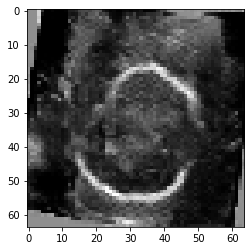

[139/1000] G_loss: 2.6614954471588135, D_loss: 0.9962291717529297
Saving checkpoint at epoch :  139
[140/1000][0/13]	Loss_D: 0.9735	Loss_G: 3.0355	D(x): 0.7113	D(G(z)): 0.3255 / 0.0521


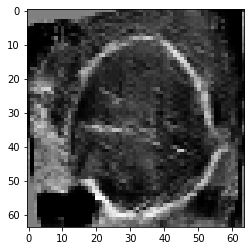

[140/1000] G_loss: 2.670945644378662, D_loss: 0.941299319267273
[141/1000][0/13]	Loss_D: 0.9811	Loss_G: 3.5828	D(x): 0.8035	D(G(z)): 0.3805 / 0.0330


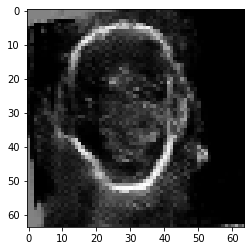

[141/1000] G_loss: 2.8765759468078613, D_loss: 1.0575768947601318
[142/1000][0/13]	Loss_D: 0.9405	Loss_G: 2.7564	D(x): 0.7703	D(G(z)): 0.3282 / 0.0616


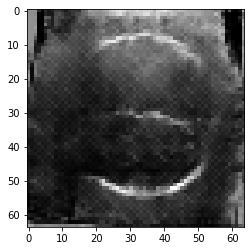

[142/1000] G_loss: 2.9963419437408447, D_loss: 0.9649327993392944
[143/1000][0/13]	Loss_D: 1.8185	Loss_G: 1.3410	D(x): 0.2353	D(G(z)): 0.0253 / 0.3516


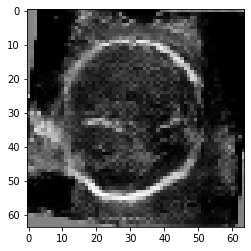

[143/1000] G_loss: 2.5838406085968018, D_loss: 1.1380393505096436
[144/1000][0/13]	Loss_D: 1.0060	Loss_G: 4.0792	D(x): 0.7681	D(G(z)): 0.3966 / 0.0226


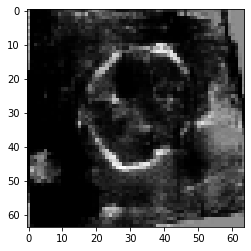

[144/1000] G_loss: 2.9662084579467773, D_loss: 1.0785293579101562
Saving checkpoint at epoch :  144
[145/1000][0/13]	Loss_D: 1.0559	Loss_G: 1.9245	D(x): 0.5038	D(G(z)): 0.1480 / 0.1679


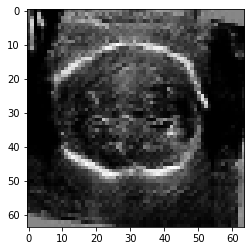

[145/1000] G_loss: 2.690054416656494, D_loss: 0.9888640642166138
[146/1000][0/13]	Loss_D: 0.8450	Loss_G: 3.1350	D(x): 0.7651	D(G(z)): 0.2978 / 0.0476


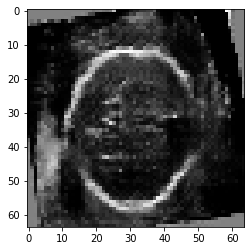

[146/1000] G_loss: 2.9109280109405518, D_loss: 1.1659600734710693
[147/1000][0/13]	Loss_D: 1.1927	Loss_G: 3.1706	D(x): 0.7218	D(G(z)): 0.4420 / 0.0480


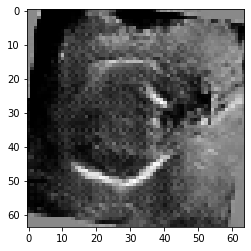

[147/1000] G_loss: 2.654388666152954, D_loss: 1.0904102325439453
[148/1000][0/13]	Loss_D: 1.0341	Loss_G: 2.0041	D(x): 0.4560	D(G(z)): 0.1072 / 0.1356


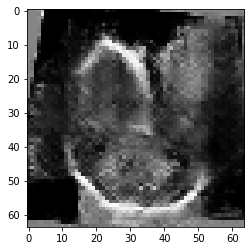

[148/1000] G_loss: 2.5104784965515137, D_loss: 0.9509325623512268
[149/1000][0/13]	Loss_D: 0.9636	Loss_G: 2.6469	D(x): 0.6992	D(G(z)): 0.3060 / 0.0765


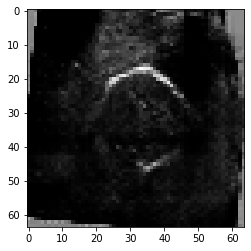

[149/1000] G_loss: 2.624558687210083, D_loss: 0.9567736983299255
Saving checkpoint at epoch :  149
[150/1000][0/13]	Loss_D: 0.9847	Loss_G: 3.8277	D(x): 0.8077	D(G(z)): 0.3816 / 0.0228


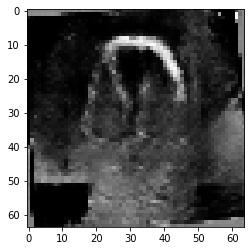

[150/1000] G_loss: 2.69745135307312, D_loss: 1.0767848491668701
[151/1000][0/13]	Loss_D: 0.9001	Loss_G: 2.7138	D(x): 0.6611	D(G(z)): 0.2597 / 0.0760


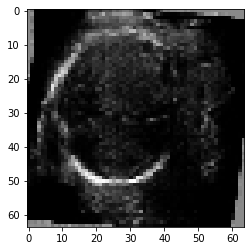

[151/1000] G_loss: 2.687171459197998, D_loss: 0.8989483714103699
[152/1000][0/13]	Loss_D: 0.9302	Loss_G: 1.9543	D(x): 0.5513	D(G(z)): 0.1573 / 0.1669


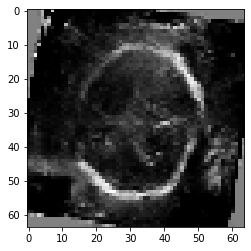

[152/1000] G_loss: 2.904245138168335, D_loss: 0.9904951453208923
[153/1000][0/13]	Loss_D: 1.0487	Loss_G: 1.3388	D(x): 0.4523	D(G(z)): 0.0961 / 0.2800


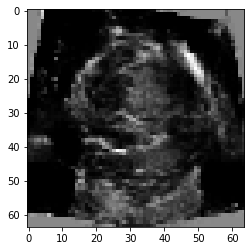

[153/1000] G_loss: 2.7458817958831787, D_loss: 1.000019907951355
[154/1000][0/13]	Loss_D: 0.9391	Loss_G: 4.3261	D(x): 0.7714	D(G(z)): 0.3651 / 0.0122


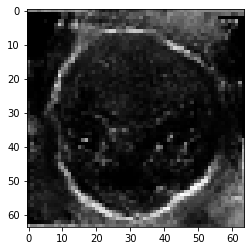

[154/1000] G_loss: 2.89309024810791, D_loss: 1.0291870832443237
Saving checkpoint at epoch :  154
[155/1000][0/13]	Loss_D: 0.8318	Loss_G: 2.5344	D(x): 0.6331	D(G(z)): 0.1708 / 0.0989


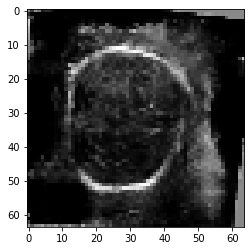

[155/1000] G_loss: 2.832366943359375, D_loss: 1.045163631439209
[156/1000][0/13]	Loss_D: 0.9787	Loss_G: 4.3352	D(x): 0.7967	D(G(z)): 0.3925 / 0.0141


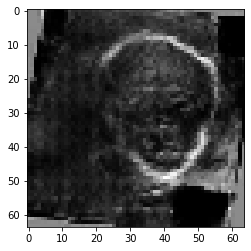

[156/1000] G_loss: 2.739973783493042, D_loss: 0.9438868761062622
[157/1000][0/13]	Loss_D: 0.9679	Loss_G: 1.3513	D(x): 0.4661	D(G(z)): 0.1042 / 0.2952


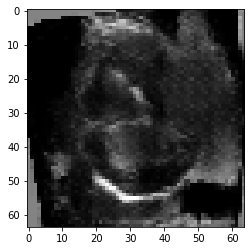

[157/1000] G_loss: 2.5978097915649414, D_loss: 1.0089589357376099
[158/1000][0/13]	Loss_D: 1.0963	Loss_G: 3.8803	D(x): 0.8584	D(G(z)): 0.4541 / 0.0225


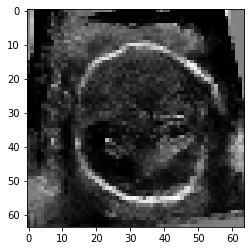

[158/1000] G_loss: 2.7902026176452637, D_loss: 0.9586585164070129
[159/1000][0/13]	Loss_D: 0.9367	Loss_G: 2.3742	D(x): 0.5754	D(G(z)): 0.2223 / 0.1020


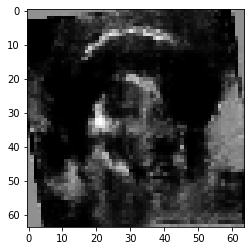

[159/1000] G_loss: 2.9175655841827393, D_loss: 0.8922260999679565
Saving checkpoint at epoch :  159
[160/1000][0/13]	Loss_D: 1.2830	Loss_G: 1.9982	D(x): 0.3311	D(G(z)): 0.0385 / 0.2141


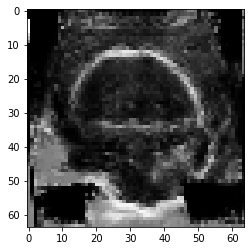

[160/1000] G_loss: 2.8423585891723633, D_loss: 1.005338191986084
[161/1000][0/13]	Loss_D: 0.8456	Loss_G: 2.4538	D(x): 0.5557	D(G(z)): 0.1063 / 0.0942


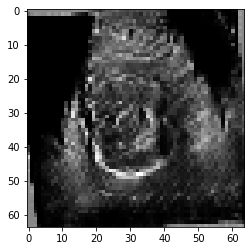

[161/1000] G_loss: 2.8040432929992676, D_loss: 0.9064005613327026
[162/1000][0/13]	Loss_D: 0.7979	Loss_G: 3.2413	D(x): 0.7253	D(G(z)): 0.2389 / 0.0372


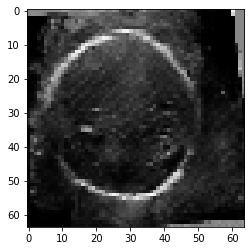

[162/1000] G_loss: 3.136664867401123, D_loss: 1.067215919494629
[163/1000][0/13]	Loss_D: 1.1190	Loss_G: 3.2402	D(x): 0.8451	D(G(z)): 0.4435 / 0.0393


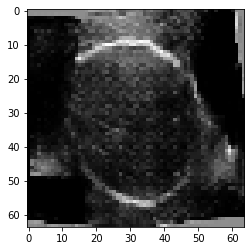

[163/1000] G_loss: 2.950669765472412, D_loss: 1.012028694152832
[164/1000][0/13]	Loss_D: 1.2295	Loss_G: 1.9071	D(x): 0.3574	D(G(z)): 0.0346 / 0.1880


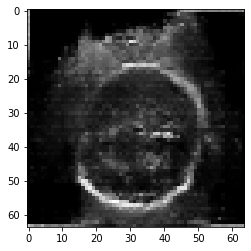

[164/1000] G_loss: 2.852871894836426, D_loss: 1.0242345333099365
Saving checkpoint at epoch :  164
[165/1000][0/13]	Loss_D: 1.0195	Loss_G: 4.0024	D(x): 0.8284	D(G(z)): 0.4070 / 0.0179


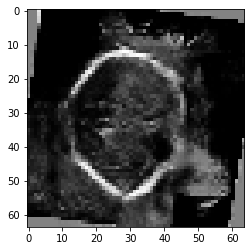

[165/1000] G_loss: 2.910431385040283, D_loss: 0.9881022572517395
[166/1000][0/13]	Loss_D: 0.8830	Loss_G: 3.2286	D(x): 0.6048	D(G(z)): 0.1731 / 0.0487


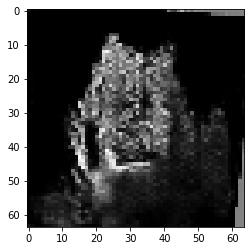

[166/1000] G_loss: 2.865642547607422, D_loss: 1.0295571088790894
[167/1000][0/13]	Loss_D: 0.8622	Loss_G: 3.2227	D(x): 0.7197	D(G(z)): 0.2822 / 0.0410


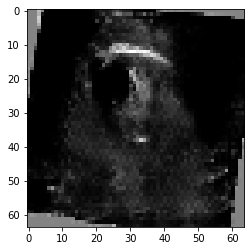

[167/1000] G_loss: 2.8063974380493164, D_loss: 0.857356071472168
[168/1000][0/13]	Loss_D: 0.9891	Loss_G: 1.4208	D(x): 0.4639	D(G(z)): 0.0785 / 0.2719


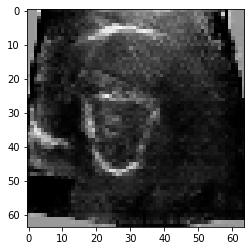

[168/1000] G_loss: 2.860600709915161, D_loss: 0.9476943612098694
[169/1000][0/13]	Loss_D: 0.8742	Loss_G: 2.7306	D(x): 0.7107	D(G(z)): 0.2554 / 0.0649


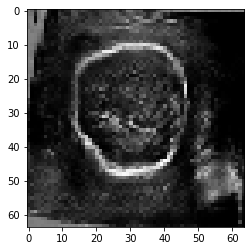

[169/1000] G_loss: 2.9404797554016113, D_loss: 0.9955775141716003
Saving checkpoint at epoch :  169
[170/1000][0/13]	Loss_D: 1.0794	Loss_G: 3.5131	D(x): 0.8149	D(G(z)): 0.3978 / 0.0285


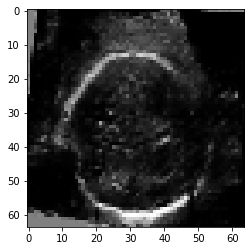

[170/1000] G_loss: 2.9745359420776367, D_loss: 0.9667248129844666
[171/1000][0/13]	Loss_D: 0.8355	Loss_G: 4.1875	D(x): 0.7471	D(G(z)): 0.2859 / 0.0150


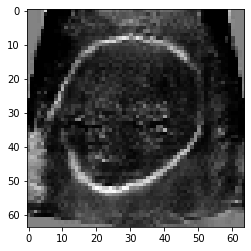

[171/1000] G_loss: 2.9097542762756348, D_loss: 1.0203959941864014
[172/1000][0/13]	Loss_D: 0.9150	Loss_G: 3.6988	D(x): 0.7743	D(G(z)): 0.3208 / 0.0298


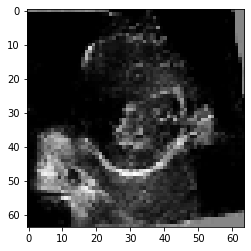

[172/1000] G_loss: 2.991807222366333, D_loss: 0.8975861072540283
[173/1000][0/13]	Loss_D: 1.0459	Loss_G: 1.2919	D(x): 0.4826	D(G(z)): 0.0931 / 0.3263


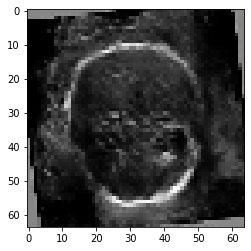

[173/1000] G_loss: 2.8656885623931885, D_loss: 1.0195988416671753
[174/1000][0/13]	Loss_D: 0.9482	Loss_G: 2.7646	D(x): 0.7195	D(G(z)): 0.3119 / 0.0564


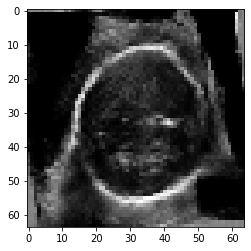

[174/1000] G_loss: 2.684706449508667, D_loss: 0.8417949676513672
Saving checkpoint at epoch :  174
[175/1000][0/13]	Loss_D: 0.8529	Loss_G: 3.6088	D(x): 0.7324	D(G(z)): 0.2772 / 0.0278


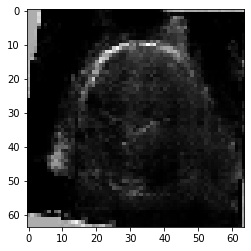

[175/1000] G_loss: 3.0914177894592285, D_loss: 0.9860694408416748
[176/1000][0/13]	Loss_D: 1.6628	Loss_G: 1.1760	D(x): 0.2463	D(G(z)): 0.0372 / 0.3454


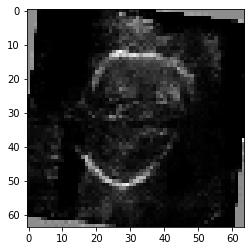

[176/1000] G_loss: 2.747114419937134, D_loss: 0.9837241768836975
[177/1000][0/13]	Loss_D: 0.9179	Loss_G: 3.3246	D(x): 0.7849	D(G(z)): 0.3015 / 0.0364


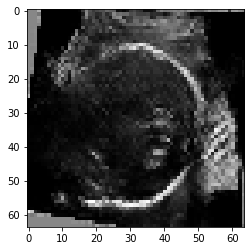

[177/1000] G_loss: 2.841364860534668, D_loss: 0.8401546478271484
[178/1000][0/13]	Loss_D: 0.8304	Loss_G: 4.4967	D(x): 0.7869	D(G(z)): 0.2726 / 0.0097


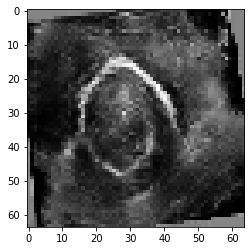

[178/1000] G_loss: 3.176464319229126, D_loss: 1.250844955444336
[179/1000][0/13]	Loss_D: 0.9269	Loss_G: 2.4961	D(x): 0.5356	D(G(z)): 0.1115 / 0.0917


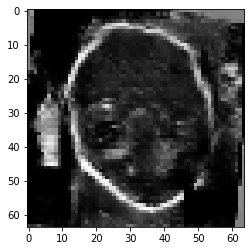

[179/1000] G_loss: 2.8563714027404785, D_loss: 0.8685933351516724
Saving checkpoint at epoch :  179
[180/1000][0/13]	Loss_D: 1.4013	Loss_G: 1.3994	D(x): 0.3031	D(G(z)): 0.0605 / 0.2733


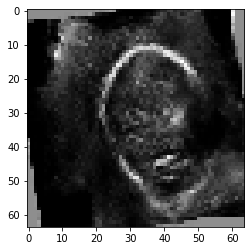

[180/1000] G_loss: 2.812399387359619, D_loss: 1.082327127456665
[181/1000][0/13]	Loss_D: 0.8657	Loss_G: 2.1190	D(x): 0.5675	D(G(z)): 0.1568 / 0.1222


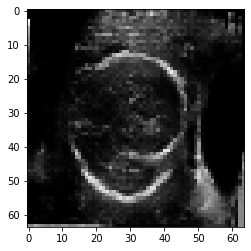

[181/1000] G_loss: 2.8130087852478027, D_loss: 0.9002074003219604
[182/1000][0/13]	Loss_D: 0.8873	Loss_G: 2.7091	D(x): 0.5436	D(G(z)): 0.0620 / 0.0754


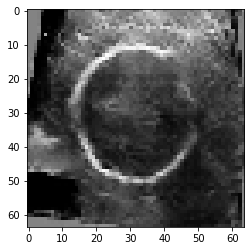

[182/1000] G_loss: 2.762126922607422, D_loss: 0.9586544036865234
[183/1000][0/13]	Loss_D: 1.0962	Loss_G: 4.3817	D(x): 0.8463	D(G(z)): 0.4380 / 0.0111


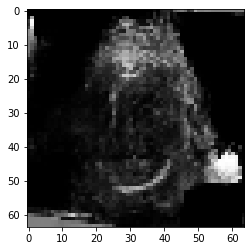

[183/1000] G_loss: 2.8261396884918213, D_loss: 0.8771130442619324
[184/1000][0/13]	Loss_D: 1.1541	Loss_G: 5.1384	D(x): 0.9045	D(G(z)): 0.4732 / 0.0048


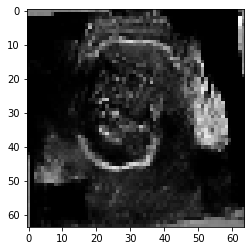

[184/1000] G_loss: 2.8467791080474854, D_loss: 0.8980848789215088
Saving checkpoint at epoch :  184
[185/1000][0/13]	Loss_D: 1.3244	Loss_G: 5.2535	D(x): 0.8829	D(G(z)): 0.4938 / 0.0054


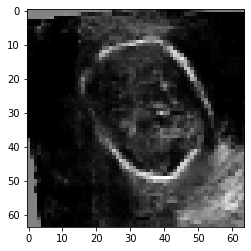

[185/1000] G_loss: 2.9652280807495117, D_loss: 0.9680837392807007
[186/1000][0/13]	Loss_D: 0.9029	Loss_G: 3.2239	D(x): 0.8456	D(G(z)): 0.3049 / 0.0438


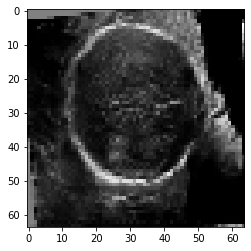

[186/1000] G_loss: 2.8139190673828125, D_loss: 0.8752604126930237
[187/1000][0/13]	Loss_D: 1.0917	Loss_G: 4.6211	D(x): 0.8891	D(G(z)): 0.4249 / 0.0080


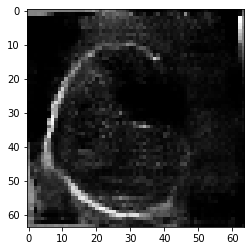

[187/1000] G_loss: 3.092240333557129, D_loss: 0.8413876891136169
[188/1000][0/13]	Loss_D: 0.7877	Loss_G: 3.5479	D(x): 0.7750	D(G(z)): 0.2564 / 0.0310


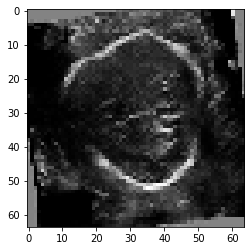

[188/1000] G_loss: 3.088712453842163, D_loss: 0.9710744023323059
[189/1000][0/13]	Loss_D: 0.9531	Loss_G: 3.5330	D(x): 0.7724	D(G(z)): 0.3338 / 0.0315


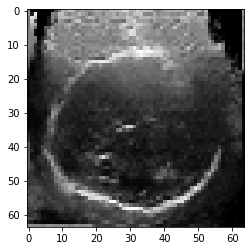

[189/1000] G_loss: 2.88344407081604, D_loss: 0.8783578276634216
Saving checkpoint at epoch :  189
[190/1000][0/13]	Loss_D: 0.8111	Loss_G: 3.5654	D(x): 0.7559	D(G(z)): 0.2598 / 0.0316


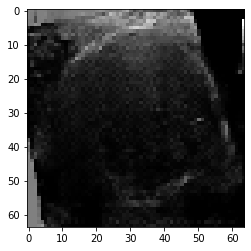

[190/1000] G_loss: 3.1542930603027344, D_loss: 0.9645329713821411
[191/1000][0/13]	Loss_D: 0.7313	Loss_G: 2.3157	D(x): 0.6499	D(G(z)): 0.1320 / 0.1025


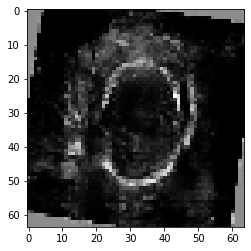

[191/1000] G_loss: 2.786026954650879, D_loss: 0.779810905456543
[192/1000][0/13]	Loss_D: 1.0436	Loss_G: 4.8232	D(x): 0.8725	D(G(z)): 0.4228 / 0.0072


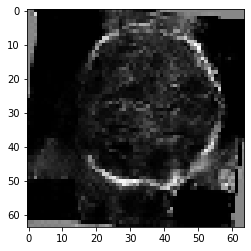

[192/1000] G_loss: 3.0063843727111816, D_loss: 0.9109579920768738
[193/1000][0/13]	Loss_D: 0.8935	Loss_G: 4.7690	D(x): 0.8784	D(G(z)): 0.3545 / 0.0086


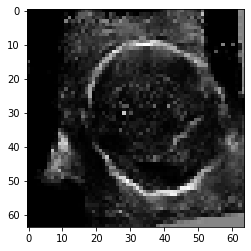

[193/1000] G_loss: 3.2630159854888916, D_loss: 0.9519782662391663
[194/1000][0/13]	Loss_D: 0.8671	Loss_G: 2.1974	D(x): 0.5278	D(G(z)): 0.0651 / 0.1250


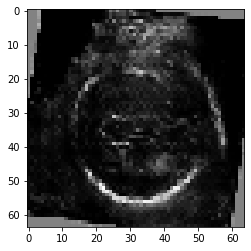

[194/1000] G_loss: 2.9712510108947754, D_loss: 0.8085013031959534
Saving checkpoint at epoch :  194
[195/1000][0/13]	Loss_D: 0.7561	Loss_G: 3.2260	D(x): 0.7508	D(G(z)): 0.2047 / 0.0404


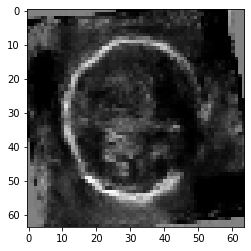

[195/1000] G_loss: 3.206218719482422, D_loss: 0.9620411992073059
[196/1000][0/13]	Loss_D: 0.8267	Loss_G: 3.3219	D(x): 0.6849	D(G(z)): 0.1984 / 0.0427


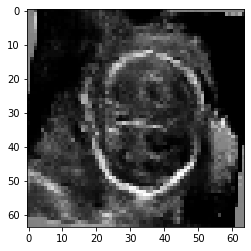

[196/1000] G_loss: 2.866856098175049, D_loss: 0.8552953004837036
[197/1000][0/13]	Loss_D: 0.6891	Loss_G: 2.3935	D(x): 0.6462	D(G(z)): 0.1178 / 0.1005


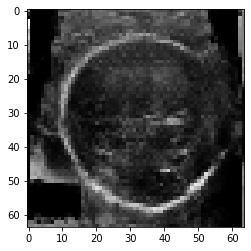

[197/1000] G_loss: 3.0650851726531982, D_loss: 0.9186522960662842
[198/1000][0/13]	Loss_D: 0.7357	Loss_G: 3.5305	D(x): 0.7456	D(G(z)): 0.1853 / 0.0347


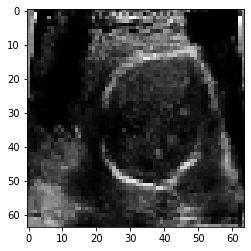

[198/1000] G_loss: 3.115584135055542, D_loss: 0.8737689256668091
[199/1000][0/13]	Loss_D: 0.6692	Loss_G: 3.0683	D(x): 0.7941	D(G(z)): 0.1989 / 0.0439


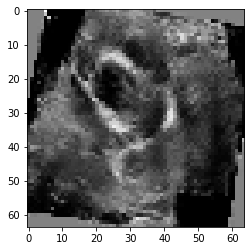

[199/1000] G_loss: 3.0174496173858643, D_loss: 0.853491485118866
Saving checkpoint at epoch :  199
[200/1000][0/13]	Loss_D: 0.8485	Loss_G: 4.3441	D(x): 0.8539	D(G(z)): 0.3178 / 0.0125


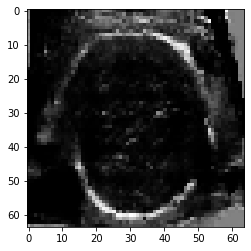

[200/1000] G_loss: 3.162405252456665, D_loss: 0.94813472032547
[201/1000][0/13]	Loss_D: 0.7331	Loss_G: 3.0830	D(x): 0.7137	D(G(z)): 0.2033 / 0.0416


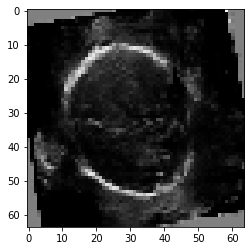

[201/1000] G_loss: 3.2205443382263184, D_loss: 0.9003949761390686
[202/1000][0/13]	Loss_D: 1.0954	Loss_G: 1.5700	D(x): 0.4190	D(G(z)): 0.0917 / 0.2323


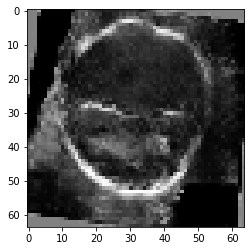

[202/1000] G_loss: 3.037904977798462, D_loss: 0.8625575304031372
[203/1000][0/13]	Loss_D: 1.3725	Loss_G: 1.4191	D(x): 0.3461	D(G(z)): 0.0477 / 0.3063


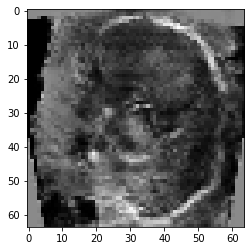

[203/1000] G_loss: 2.9355697631835938, D_loss: 1.009811282157898
[204/1000][0/13]	Loss_D: 0.8995	Loss_G: 3.8939	D(x): 0.8230	D(G(z)): 0.3447 / 0.0202


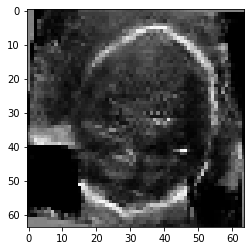

[204/1000] G_loss: 3.146800994873047, D_loss: 0.8676784038543701
Saving checkpoint at epoch :  204
[205/1000][0/13]	Loss_D: 1.0790	Loss_G: 1.4722	D(x): 0.4331	D(G(z)): 0.0496 / 0.2745


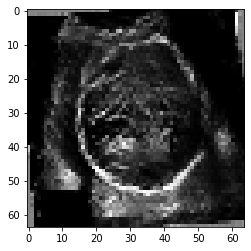

[205/1000] G_loss: 2.9502432346343994, D_loss: 0.9038162231445312
[206/1000][0/13]	Loss_D: 0.6416	Loss_G: 3.4520	D(x): 0.7817	D(G(z)): 0.1772 / 0.0300


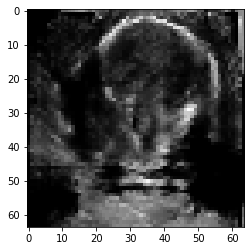

[206/1000] G_loss: 3.104790210723877, D_loss: 0.7883301973342896
[207/1000][0/13]	Loss_D: 0.9833	Loss_G: 3.9230	D(x): 0.8000	D(G(z)): 0.3534 / 0.0253


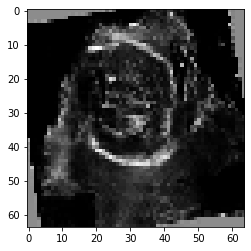

[207/1000] G_loss: 3.08020281791687, D_loss: 0.8072479963302612
[208/1000][0/13]	Loss_D: 0.6531	Loss_G: 3.1792	D(x): 0.7764	D(G(z)): 0.1760 / 0.0362


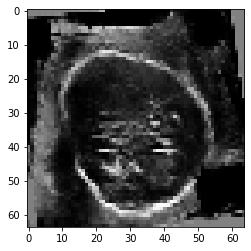

[208/1000] G_loss: 3.175941228866577, D_loss: 0.7585687041282654
[209/1000][0/13]	Loss_D: 0.6711	Loss_G: 3.1866	D(x): 0.7121	D(G(z)): 0.1202 / 0.0433


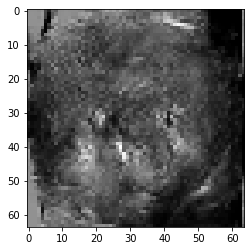

[209/1000] G_loss: 2.988114595413208, D_loss: 0.8476566076278687
Saving checkpoint at epoch :  209
[210/1000][0/13]	Loss_D: 2.0799	Loss_G: 7.3720	D(x): 0.9745	D(G(z)): 0.7088 / 0.0010


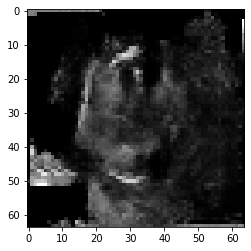

[210/1000] G_loss: 3.348252773284912, D_loss: 1.14106285572052
[211/1000][0/13]	Loss_D: 0.8063	Loss_G: 2.9412	D(x): 0.7133	D(G(z)): 0.2409 / 0.0536


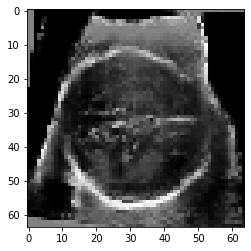

[211/1000] G_loss: 2.9337615966796875, D_loss: 0.8387564420700073
[212/1000][0/13]	Loss_D: 0.8160	Loss_G: 2.3322	D(x): 0.6337	D(G(z)): 0.1539 / 0.1053


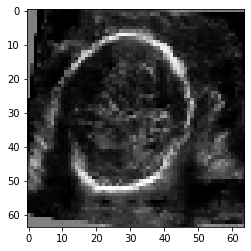

[212/1000] G_loss: 3.1584959030151367, D_loss: 0.7968835234642029
[213/1000][0/13]	Loss_D: 0.7818	Loss_G: 3.2332	D(x): 0.7191	D(G(z)): 0.1629 / 0.0525


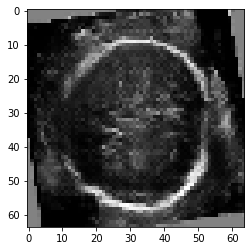

[213/1000] G_loss: 3.207638740539551, D_loss: 1.013053059577942
[214/1000][0/13]	Loss_D: 0.7518	Loss_G: 2.5768	D(x): 0.6564	D(G(z)): 0.1629 / 0.0822


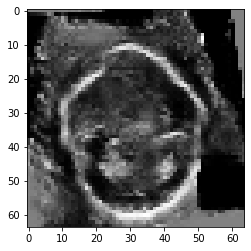

[214/1000] G_loss: 3.1576385498046875, D_loss: 0.7661198377609253
Saving checkpoint at epoch :  214
[215/1000][0/13]	Loss_D: 0.7971	Loss_G: 2.5403	D(x): 0.5586	D(G(z)): 0.0587 / 0.0962


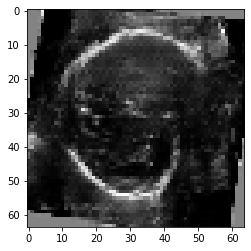

[215/1000] G_loss: 3.2838072776794434, D_loss: 0.7995086312294006
[216/1000][0/13]	Loss_D: 0.6188	Loss_G: 3.8233	D(x): 0.7913	D(G(z)): 0.1449 / 0.0231


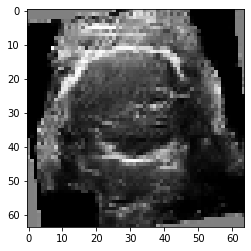

[216/1000] G_loss: 3.2722203731536865, D_loss: 0.7565816044807434
[217/1000][0/13]	Loss_D: 0.8769	Loss_G: 2.0014	D(x): 0.5384	D(G(z)): 0.0646 / 0.1476


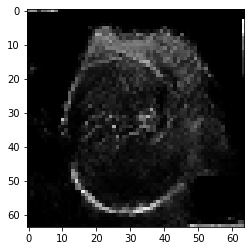

[217/1000] G_loss: 3.3702516555786133, D_loss: 0.7976847290992737
[218/1000][0/13]	Loss_D: 0.6894	Loss_G: 2.3540	D(x): 0.6854	D(G(z)): 0.1153 / 0.1037


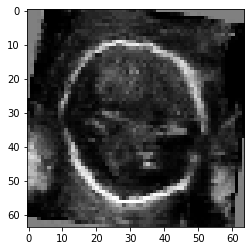

[218/1000] G_loss: 3.127194881439209, D_loss: 0.7441281676292419
[219/1000][0/13]	Loss_D: 0.7499	Loss_G: 4.1224	D(x): 0.8540	D(G(z)): 0.2573 / 0.0188


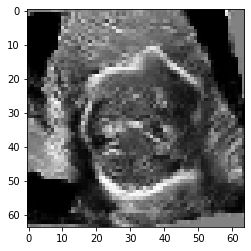

[219/1000] G_loss: 3.323317527770996, D_loss: 0.8158900141716003
Saving checkpoint at epoch :  219
[220/1000][0/13]	Loss_D: 0.6619	Loss_G: 2.6539	D(x): 0.7078	D(G(z)): 0.0807 / 0.0795


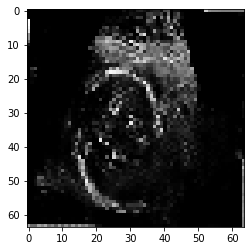

[220/1000] G_loss: 3.412830352783203, D_loss: 0.8371776938438416
[221/1000][0/13]	Loss_D: 0.7569	Loss_G: 3.6800	D(x): 0.7478	D(G(z)): 0.2078 / 0.0294


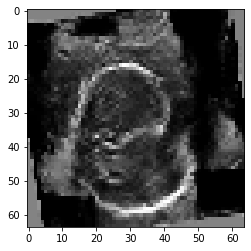

[221/1000] G_loss: 3.166801929473877, D_loss: 0.7818945646286011
[222/1000][0/13]	Loss_D: 0.8586	Loss_G: 3.1383	D(x): 0.7925	D(G(z)): 0.2802 / 0.0499


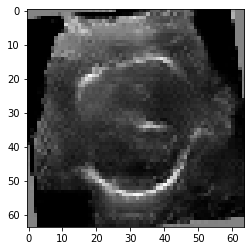

[222/1000] G_loss: 3.5730092525482178, D_loss: 0.8116902112960815
[223/1000][0/13]	Loss_D: 0.9804	Loss_G: 2.6517	D(x): 0.4536	D(G(z)): 0.0174 / 0.0904


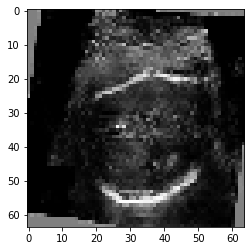

[223/1000] G_loss: 3.4012362957000732, D_loss: 0.7877865433692932
[224/1000][0/13]	Loss_D: 1.1009	Loss_G: 2.4007	D(x): 0.4331	D(G(z)): 0.0430 / 0.1186


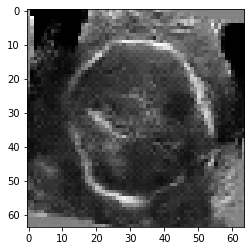

[224/1000] G_loss: 3.4325828552246094, D_loss: 0.806191086769104
Saving checkpoint at epoch :  224
[225/1000][0/13]	Loss_D: 0.8572	Loss_G: 3.8862	D(x): 0.7642	D(G(z)): 0.2663 / 0.0216


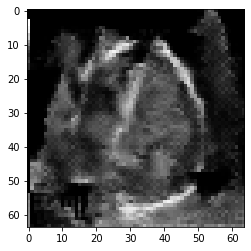

[225/1000] G_loss: 3.479842185974121, D_loss: 0.8776540756225586
[226/1000][0/13]	Loss_D: 0.8045	Loss_G: 2.7811	D(x): 0.5490	D(G(z)): 0.0586 / 0.0861


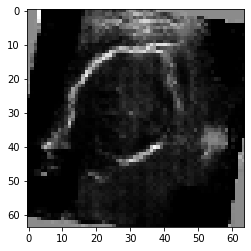

[226/1000] G_loss: 3.266117572784424, D_loss: 0.8205581307411194
[227/1000][0/13]	Loss_D: 0.8938	Loss_G: 2.5133	D(x): 0.5465	D(G(z)): 0.0936 / 0.1156


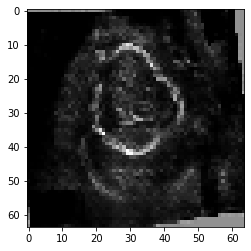

[227/1000] G_loss: 3.0253148078918457, D_loss: 0.7038344740867615
[228/1000][0/13]	Loss_D: 0.7007	Loss_G: 3.2866	D(x): 0.6980	D(G(z)): 0.1527 / 0.0360


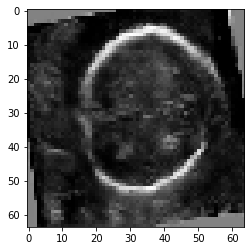

[228/1000] G_loss: 3.4677200317382812, D_loss: 0.881121039390564
[229/1000][0/13]	Loss_D: 0.6785	Loss_G: 3.9460	D(x): 0.8161	D(G(z)): 0.2035 / 0.0210


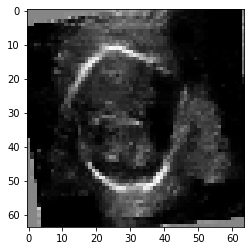

[229/1000] G_loss: 3.261793613433838, D_loss: 0.7492228746414185
Saving checkpoint at epoch :  229
[230/1000][0/13]	Loss_D: 0.9071	Loss_G: 3.6695	D(x): 0.7870	D(G(z)): 0.3080 / 0.0404


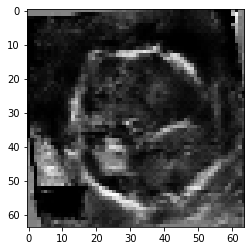

[230/1000] G_loss: 3.281698703765869, D_loss: 0.7930809259414673
[231/1000][0/13]	Loss_D: 0.9705	Loss_G: 4.7929	D(x): 0.9254	D(G(z)): 0.3729 / 0.0110


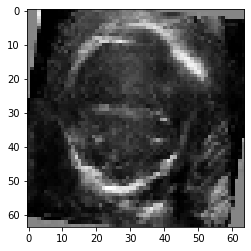

[231/1000] G_loss: 3.3754515647888184, D_loss: 0.7240458726882935
[232/1000][0/13]	Loss_D: 0.6567	Loss_G: 2.9738	D(x): 0.7016	D(G(z)): 0.1085 / 0.0572


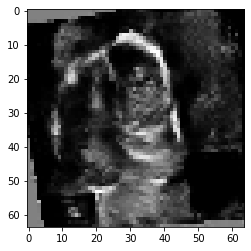

[232/1000] G_loss: 3.6273980140686035, D_loss: 0.8433614373207092
[233/1000][0/13]	Loss_D: 1.0063	Loss_G: 2.1377	D(x): 0.4949	D(G(z)): 0.0435 / 0.1522


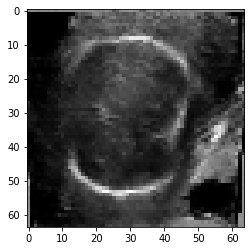

[233/1000] G_loss: 3.2369534969329834, D_loss: 0.8802158832550049
[234/1000][0/13]	Loss_D: 1.0540	Loss_G: 5.4289	D(x): 0.8813	D(G(z)): 0.3992 / 0.0054


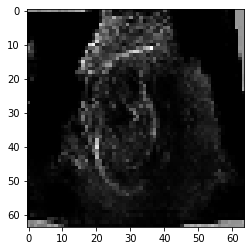

[234/1000] G_loss: 3.589418888092041, D_loss: 0.8435746431350708
Saving checkpoint at epoch :  234
[235/1000][0/13]	Loss_D: 0.9260	Loss_G: 2.4702	D(x): 0.5298	D(G(z)): 0.0650 / 0.1193


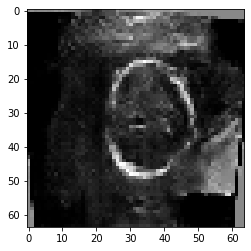

[235/1000] G_loss: 3.4961814880371094, D_loss: 0.7472292184829712
[236/1000][0/13]	Loss_D: 1.3143	Loss_G: 2.4805	D(x): 0.3314	D(G(z)): 0.0219 / 0.1638


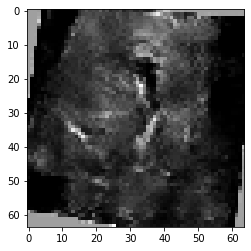

[236/1000] G_loss: 3.3681893348693848, D_loss: 0.8552828431129456
[237/1000][0/13]	Loss_D: 0.7243	Loss_G: 3.1830	D(x): 0.6305	D(G(z)): 0.0785 / 0.0583


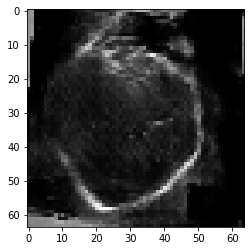

[237/1000] G_loss: 3.3359384536743164, D_loss: 0.6774044036865234
[238/1000][0/13]	Loss_D: 0.7386	Loss_G: 3.1662	D(x): 0.7279	D(G(z)): 0.1895 / 0.0428


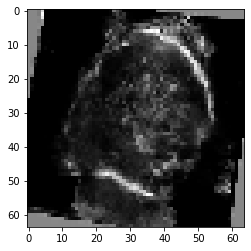

[238/1000] G_loss: 3.592041492462158, D_loss: 0.7168354392051697
[239/1000][0/13]	Loss_D: 0.7394	Loss_G: 2.6456	D(x): 0.6128	D(G(z)): 0.0551 / 0.0955


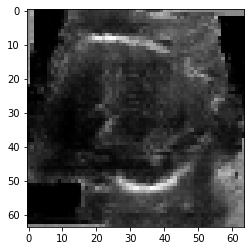

[239/1000] G_loss: 3.3225910663604736, D_loss: 0.653718113899231
Saving checkpoint at epoch :  239
[240/1000][0/13]	Loss_D: 0.6112	Loss_G: 4.5881	D(x): 0.7956	D(G(z)): 0.1699 / 0.0100


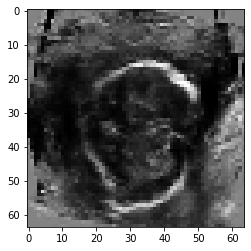

[240/1000] G_loss: 3.4403111934661865, D_loss: 0.7410493493080139
[241/1000][0/13]	Loss_D: 1.0039	Loss_G: 4.9085	D(x): 0.9541	D(G(z)): 0.3626 / 0.0078


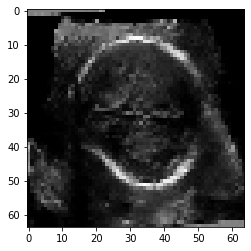

[241/1000] G_loss: 3.4342586994171143, D_loss: 0.8445030450820923
[242/1000][0/13]	Loss_D: 0.6690	Loss_G: 4.3376	D(x): 0.8627	D(G(z)): 0.2214 / 0.0151


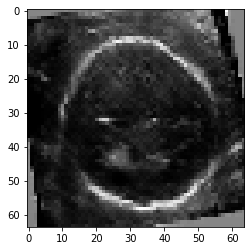

[242/1000] G_loss: 3.370807409286499, D_loss: 0.8032965064048767
[243/1000][0/13]	Loss_D: 0.7199	Loss_G: 3.7342	D(x): 0.9253	D(G(z)): 0.2515 / 0.0187


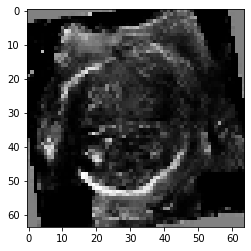

[243/1000] G_loss: 3.3525962829589844, D_loss: 0.667669951915741
[244/1000][0/13]	Loss_D: 0.8468	Loss_G: 5.8361	D(x): 0.8854	D(G(z)): 0.3063 / 0.0027


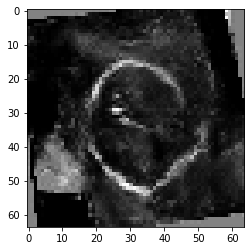

[244/1000] G_loss: 3.4561820030212402, D_loss: 0.8649851083755493
Saving checkpoint at epoch :  244
[245/1000][0/13]	Loss_D: 0.6695	Loss_G: 3.7534	D(x): 0.7745	D(G(z)): 0.1755 / 0.0210


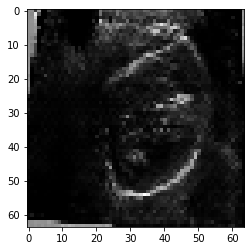

[245/1000] G_loss: 3.2915098667144775, D_loss: 0.7122441530227661
[246/1000][0/13]	Loss_D: 1.2692	Loss_G: 6.5902	D(x): 0.9441	D(G(z)): 0.4846 / 0.0017


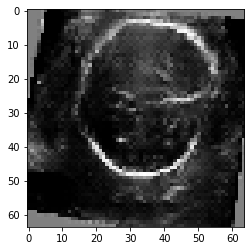

[246/1000] G_loss: 3.580604314804077, D_loss: 0.831486165523529
[247/1000][0/13]	Loss_D: 0.6536	Loss_G: 4.0050	D(x): 0.8052	D(G(z)): 0.1630 / 0.0228


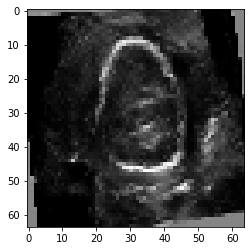

[247/1000] G_loss: 3.895897388458252, D_loss: 1.1225392818450928
[248/1000][0/13]	Loss_D: 0.8870	Loss_G: 4.5332	D(x): 0.8414	D(G(z)): 0.3005 / 0.0096


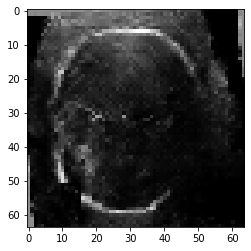

[248/1000] G_loss: 3.326321840286255, D_loss: 0.8224209547042847
[249/1000][0/13]	Loss_D: 0.7845	Loss_G: 3.1208	D(x): 0.6895	D(G(z)): 0.1689 / 0.0524


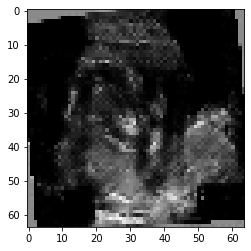

[249/1000] G_loss: 3.494962215423584, D_loss: 0.7774165868759155
Saving checkpoint at epoch :  249
[250/1000][0/13]	Loss_D: 0.7236	Loss_G: 3.6989	D(x): 0.8080	D(G(z)): 0.2257 / 0.0228


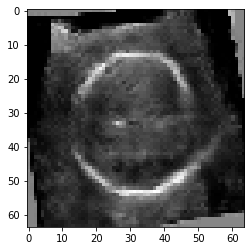

[250/1000] G_loss: 3.3800318241119385, D_loss: 0.6845253705978394
[251/1000][0/13]	Loss_D: 0.6843	Loss_G: 3.4033	D(x): 0.7398	D(G(z)): 0.1397 / 0.0367


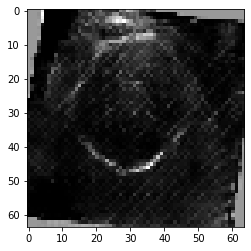

[251/1000] G_loss: 3.478339195251465, D_loss: 0.7700657248497009
[252/1000][0/13]	Loss_D: 0.5754	Loss_G: 3.2975	D(x): 0.8183	D(G(z)): 0.1175 / 0.0394


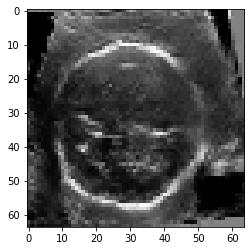

[252/1000] G_loss: 3.329404592514038, D_loss: 0.6559601426124573
[253/1000][0/13]	Loss_D: 0.5833	Loss_G: 3.6685	D(x): 0.8000	D(G(z)): 0.1372 / 0.0222


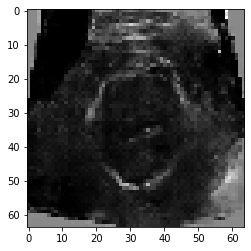

[253/1000] G_loss: 3.48451566696167, D_loss: 0.7734018564224243
[254/1000][0/13]	Loss_D: 0.6442	Loss_G: 3.2287	D(x): 0.8047	D(G(z)): 0.1885 / 0.0429


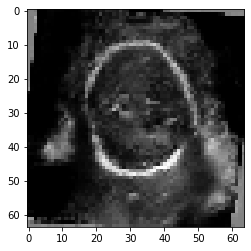

[254/1000] G_loss: 3.677372932434082, D_loss: 0.7120295166969299
Saving checkpoint at epoch :  254
[255/1000][0/13]	Loss_D: 0.7859	Loss_G: 3.8545	D(x): 0.7969	D(G(z)): 0.2541 / 0.0297


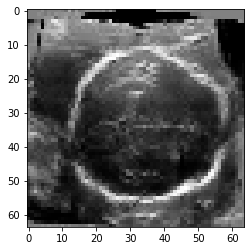

[255/1000] G_loss: 3.586303234100342, D_loss: 0.7190083861351013
[256/1000][0/13]	Loss_D: 0.8430	Loss_G: 5.1559	D(x): 0.9364	D(G(z)): 0.2937 / 0.0080


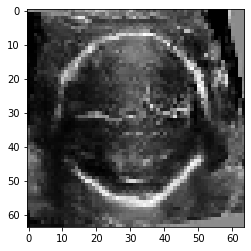

[256/1000] G_loss: 3.6092782020568848, D_loss: 0.675387442111969
[257/1000][0/13]	Loss_D: 0.6429	Loss_G: 2.3863	D(x): 0.6860	D(G(z)): 0.0965 / 0.1201


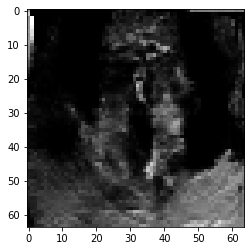

[257/1000] G_loss: 3.7253687381744385, D_loss: 0.9844163656234741
[258/1000][0/13]	Loss_D: 0.6712	Loss_G: 4.3927	D(x): 0.8811	D(G(z)): 0.1797 / 0.0115


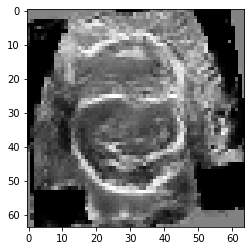

[258/1000] G_loss: 3.348057746887207, D_loss: 0.7410537004470825
[259/1000][0/13]	Loss_D: 0.6866	Loss_G: 3.9603	D(x): 0.8715	D(G(z)): 0.2098 / 0.0220


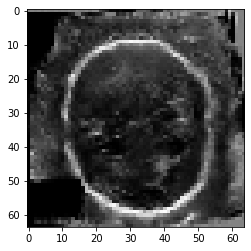

[259/1000] G_loss: 3.3228023052215576, D_loss: 0.7062916159629822
Saving checkpoint at epoch :  259
[260/1000][0/13]	Loss_D: 0.6182	Loss_G: 3.8099	D(x): 0.7873	D(G(z)): 0.1501 / 0.0215


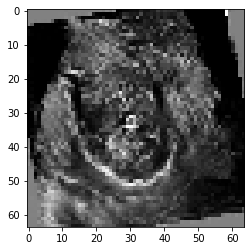

[260/1000] G_loss: 3.450895071029663, D_loss: 0.6194607615470886
[261/1000][0/13]	Loss_D: 0.5796	Loss_G: 2.7905	D(x): 0.7224	D(G(z)): 0.0897 / 0.0628


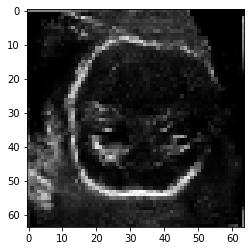

[261/1000] G_loss: 3.419050931930542, D_loss: 0.6105347275733948
[262/1000][0/13]	Loss_D: 0.5475	Loss_G: 3.3314	D(x): 0.7978	D(G(z)): 0.0946 / 0.0360


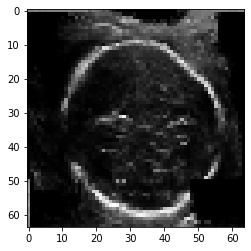

[262/1000] G_loss: 3.523301124572754, D_loss: 0.6746390461921692
[263/1000][0/13]	Loss_D: 0.7003	Loss_G: 1.9330	D(x): 0.6173	D(G(z)): 0.0545 / 0.1829


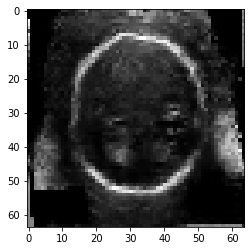

[263/1000] G_loss: 3.590862512588501, D_loss: 0.7693624496459961
[264/1000][0/13]	Loss_D: 0.7662	Loss_G: 4.4812	D(x): 0.9009	D(G(z)): 0.2727 / 0.0124


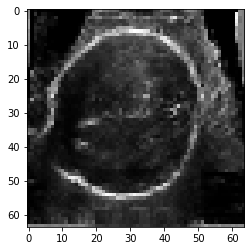

[264/1000] G_loss: 3.8511037826538086, D_loss: 0.7771211862564087
Saving checkpoint at epoch :  264
[265/1000][0/13]	Loss_D: 0.9752	Loss_G: 2.3958	D(x): 0.6255	D(G(z)): 0.1666 / 0.1080


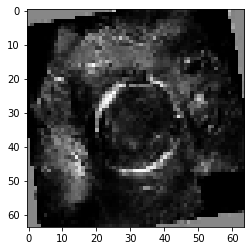

[265/1000] G_loss: 3.6301398277282715, D_loss: 0.8279997110366821
[266/1000][0/13]	Loss_D: 0.6856	Loss_G: 2.5143	D(x): 0.6808	D(G(z)): 0.0938 / 0.0894


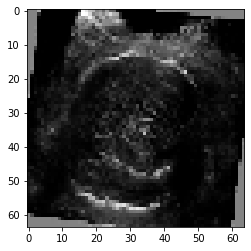

[266/1000] G_loss: 3.409403085708618, D_loss: 0.6732310056686401
[267/1000][0/13]	Loss_D: 1.0273	Loss_G: 6.3080	D(x): 0.9332	D(G(z)): 0.4031 / 0.0024


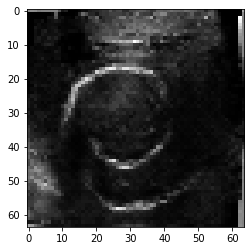

[267/1000] G_loss: 3.920586109161377, D_loss: 0.7395634055137634
[268/1000][0/13]	Loss_D: 0.6601	Loss_G: 3.8938	D(x): 0.7190	D(G(z)): 0.0808 / 0.0228


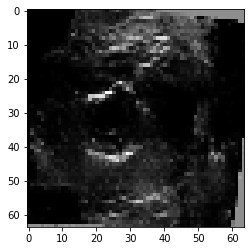

[268/1000] G_loss: 3.624561071395874, D_loss: 0.6692952513694763
[269/1000][0/13]	Loss_D: 0.6542	Loss_G: 4.4336	D(x): 0.8630	D(G(z)): 0.1971 / 0.0151


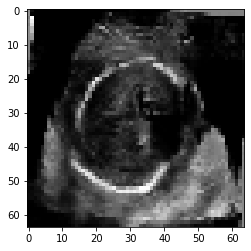

[269/1000] G_loss: 3.474905252456665, D_loss: 0.6745515465736389
Saving checkpoint at epoch :  269
[270/1000][0/13]	Loss_D: 0.6277	Loss_G: 4.3802	D(x): 0.8070	D(G(z)): 0.1533 / 0.0140


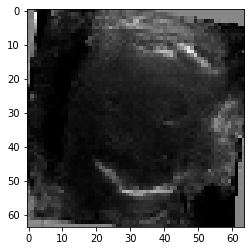

[270/1000] G_loss: 3.5353846549987793, D_loss: 0.6320420503616333
[271/1000][0/13]	Loss_D: 0.5103	Loss_G: 4.0645	D(x): 0.8235	D(G(z)): 0.0828 / 0.0163


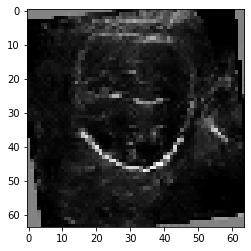

[271/1000] G_loss: 3.5435023307800293, D_loss: 0.6005366444587708
[272/1000][0/13]	Loss_D: 0.6227	Loss_G: 5.1610	D(x): 0.8675	D(G(z)): 0.1840 / 0.0054


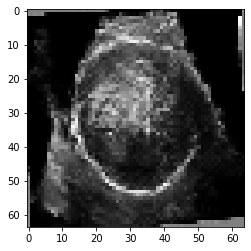

[272/1000] G_loss: 3.8691906929016113, D_loss: 0.6962697505950928
[273/1000][0/13]	Loss_D: 1.0391	Loss_G: 1.5603	D(x): 0.4620	D(G(z)): 0.0282 / 0.2928


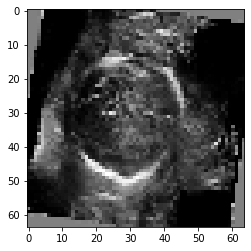

[273/1000] G_loss: 3.5498099327087402, D_loss: 0.6908738613128662
[274/1000][0/13]	Loss_D: 0.7414	Loss_G: 4.8158	D(x): 0.8777	D(G(z)): 0.2327 / 0.0072


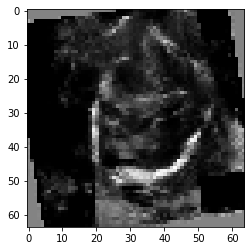

[274/1000] G_loss: 3.6225926876068115, D_loss: 0.6559528708457947
Saving checkpoint at epoch :  274
[275/1000][0/13]	Loss_D: 0.5532	Loss_G: 4.1306	D(x): 0.8869	D(G(z)): 0.1519 / 0.0141


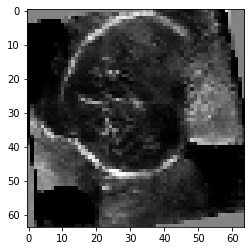

[275/1000] G_loss: 3.6606292724609375, D_loss: 0.6178082227706909
[276/1000][0/13]	Loss_D: 0.5679	Loss_G: 3.0674	D(x): 0.7371	D(G(z)): 0.0556 / 0.0489


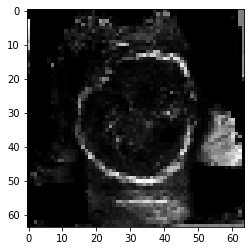

[276/1000] G_loss: 3.8579630851745605, D_loss: 0.6674728989601135
[277/1000][0/13]	Loss_D: 1.1361	Loss_G: 1.5918	D(x): 0.4461	D(G(z)): 0.0209 / 0.2650


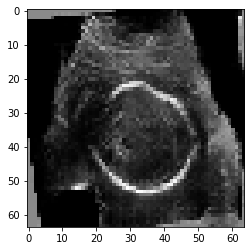

[277/1000] G_loss: 3.410834312438965, D_loss: 0.746009111404419
[278/1000][0/13]	Loss_D: 1.2312	Loss_G: 6.7612	D(x): 0.9314	D(G(z)): 0.4468 / 0.0012


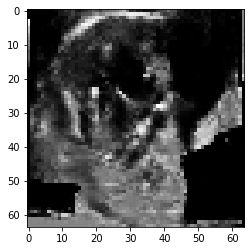

[278/1000] G_loss: 3.7221601009368896, D_loss: 0.7836383581161499
[279/1000][0/13]	Loss_D: 0.6601	Loss_G: 2.9153	D(x): 0.7046	D(G(z)): 0.1104 / 0.0650


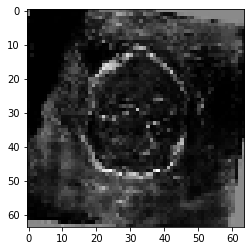

[279/1000] G_loss: 3.6472156047821045, D_loss: 0.715739369392395
Saving checkpoint at epoch :  279
[280/1000][0/13]	Loss_D: 0.7557	Loss_G: 4.9577	D(x): 0.8293	D(G(z)): 0.2248 / 0.0166


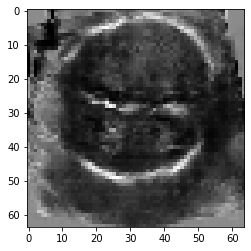

[280/1000] G_loss: 3.8698577880859375, D_loss: 0.6172433495521545
[281/1000][0/13]	Loss_D: 0.6933	Loss_G: 2.7595	D(x): 0.6276	D(G(z)): 0.0344 / 0.0969


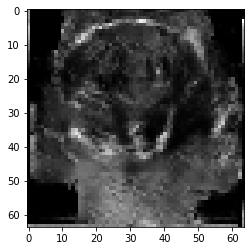

[281/1000] G_loss: 3.7762856483459473, D_loss: 0.6830647587776184
[282/1000][0/13]	Loss_D: 0.6389	Loss_G: 3.6773	D(x): 0.7525	D(G(z)): 0.1269 / 0.0295


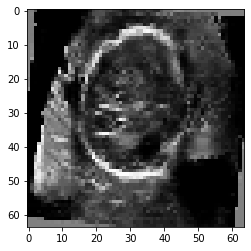

[282/1000] G_loss: 4.038002014160156, D_loss: 1.1056427955627441
[283/1000][0/13]	Loss_D: 0.6522	Loss_G: 4.0498	D(x): 0.7742	D(G(z)): 0.1302 / 0.0193


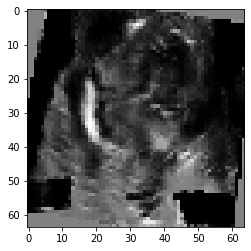

[283/1000] G_loss: 3.553898334503174, D_loss: 0.7690035104751587
[284/1000][0/13]	Loss_D: 0.8885	Loss_G: 5.9471	D(x): 0.9045	D(G(z)): 0.3316 / 0.0023


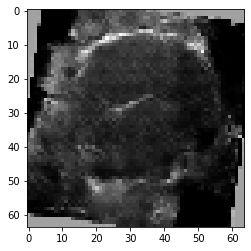

[284/1000] G_loss: 3.8882570266723633, D_loss: 0.7404154539108276
Saving checkpoint at epoch :  284
[285/1000][0/13]	Loss_D: 0.5957	Loss_G: 3.3542	D(x): 0.7397	D(G(z)): 0.0859 / 0.0402


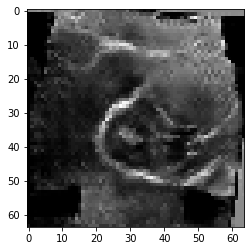

[285/1000] G_loss: 3.4161901473999023, D_loss: 0.6157938838005066
[286/1000][0/13]	Loss_D: 0.6040	Loss_G: 4.3462	D(x): 0.8316	D(G(z)): 0.1673 / 0.0127


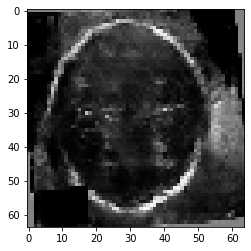

[286/1000] G_loss: 3.7395248413085938, D_loss: 0.6322848796844482
[287/1000][0/13]	Loss_D: 0.5783	Loss_G: 2.9858	D(x): 0.7488	D(G(z)): 0.0927 / 0.0582


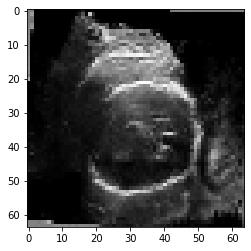

[287/1000] G_loss: 3.6217634677886963, D_loss: 0.6519697904586792
[288/1000][0/13]	Loss_D: 0.6047	Loss_G: 4.0023	D(x): 0.8129	D(G(z)): 0.1422 / 0.0188


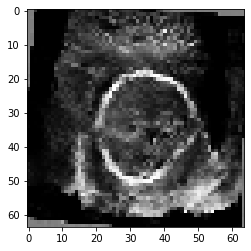

[288/1000] G_loss: 3.565723419189453, D_loss: 0.5869332551956177
[289/1000][0/13]	Loss_D: 0.6082	Loss_G: 4.0746	D(x): 0.8238	D(G(z)): 0.1654 / 0.0150


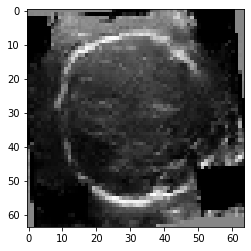

[289/1000] G_loss: 3.70359206199646, D_loss: 0.7224277257919312
Saving checkpoint at epoch :  289
[290/1000][0/13]	Loss_D: 0.9639	Loss_G: 4.7436	D(x): 0.9299	D(G(z)): 0.3189 / 0.0073


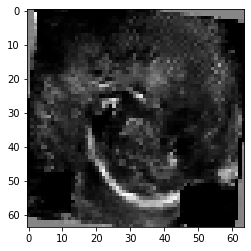

[290/1000] G_loss: 3.8565688133239746, D_loss: 0.7181323170661926
[291/1000][0/13]	Loss_D: 0.6554	Loss_G: 3.0299	D(x): 0.7013	D(G(z)): 0.0955 / 0.0616


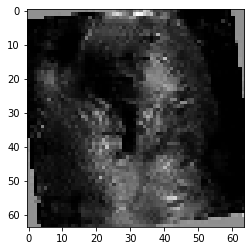

[291/1000] G_loss: 3.701223134994507, D_loss: 0.6087757349014282
[292/1000][0/13]	Loss_D: 1.0739	Loss_G: 1.9379	D(x): 0.4763	D(G(z)): 0.0309 / 0.1896


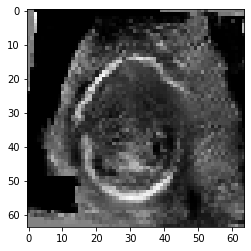

[292/1000] G_loss: 3.6725478172302246, D_loss: 0.6834537982940674
[293/1000][0/13]	Loss_D: 0.5554	Loss_G: 2.6208	D(x): 0.7152	D(G(z)): 0.0406 / 0.0813


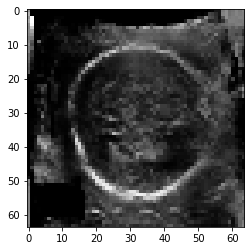

[293/1000] G_loss: 3.6377639770507812, D_loss: 0.5844787359237671
[294/1000][0/13]	Loss_D: 0.6517	Loss_G: 2.2781	D(x): 0.6701	D(G(z)): 0.0554 / 0.1102


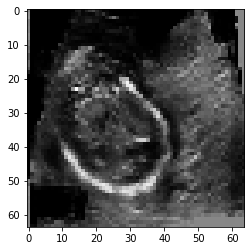

[294/1000] G_loss: 3.577272891998291, D_loss: 0.5829668641090393
Saving checkpoint at epoch :  294
[295/1000][0/13]	Loss_D: 0.6704	Loss_G: 5.5981	D(x): 0.8791	D(G(z)): 0.2078 / 0.0046


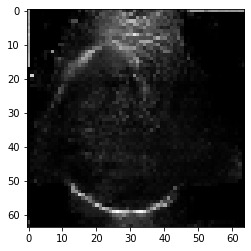

[295/1000] G_loss: 4.000466346740723, D_loss: 0.6891613006591797
[296/1000][0/13]	Loss_D: 0.6913	Loss_G: 3.1066	D(x): 0.6101	D(G(z)): 0.0293 / 0.0674


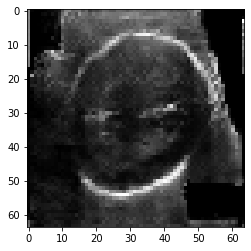

[296/1000] G_loss: 3.5127787590026855, D_loss: 0.6256130933761597
[297/1000][0/13]	Loss_D: 1.2112	Loss_G: 6.9892	D(x): 0.9647	D(G(z)): 0.4441 / 0.0011


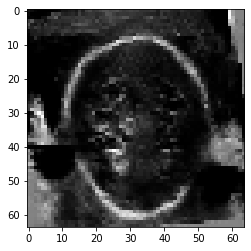

[297/1000] G_loss: 4.1341166496276855, D_loss: 0.7942212820053101
[298/1000][0/13]	Loss_D: 0.6904	Loss_G: 3.2083	D(x): 0.7401	D(G(z)): 0.1256 / 0.0566


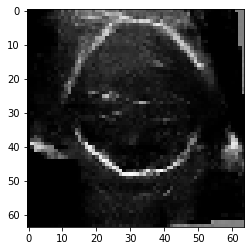

[298/1000] G_loss: 3.870059013366699, D_loss: 0.8485187888145447
[299/1000][0/13]	Loss_D: 0.6024	Loss_G: 4.2946	D(x): 0.8259	D(G(z)): 0.1507 / 0.0140


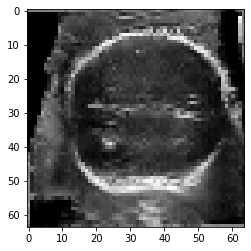

[299/1000] G_loss: 3.7057254314422607, D_loss: 0.6780824065208435
Saving checkpoint at epoch :  299
Saving checkpoint at epoch :  299
[300/1000][0/13]	Loss_D: 0.7967	Loss_G: 4.8703	D(x): 0.9189	D(G(z)): 0.2607 / 0.0089


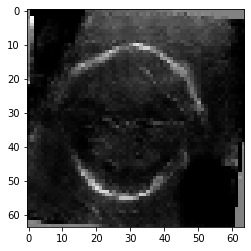

[300/1000] G_loss: 3.7611849308013916, D_loss: 0.6354665756225586
[301/1000][0/13]	Loss_D: 0.5210	Loss_G: 3.6462	D(x): 0.7951	D(G(z)): 0.0646 / 0.0297


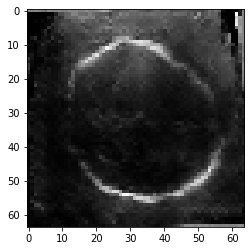

[301/1000] G_loss: 3.6656293869018555, D_loss: 0.6217682361602783
[302/1000][0/13]	Loss_D: 0.5202	Loss_G: 3.2427	D(x): 0.7992	D(G(z)): 0.0830 / 0.0417


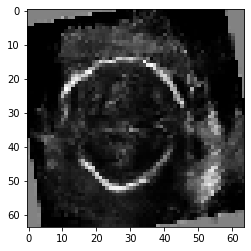

[302/1000] G_loss: 3.756147623062134, D_loss: 0.5752836465835571
[303/1000][0/13]	Loss_D: 0.8155	Loss_G: 2.4079	D(x): 0.5821	D(G(z)): 0.0332 / 0.1365


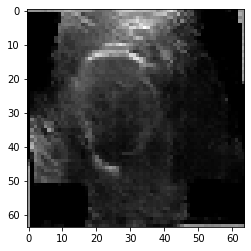

[303/1000] G_loss: 3.726611852645874, D_loss: 0.626262903213501
[304/1000][0/13]	Loss_D: 0.5243	Loss_G: 3.7205	D(x): 0.8093	D(G(z)): 0.0784 / 0.0274


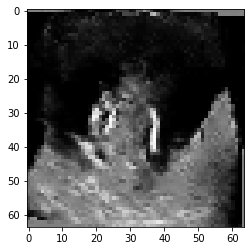

[304/1000] G_loss: 3.585822105407715, D_loss: 0.593975305557251
Saving checkpoint at epoch :  304
[305/1000][0/13]	Loss_D: 0.9358	Loss_G: 5.9837	D(x): 0.9348	D(G(z)): 0.3396 / 0.0021


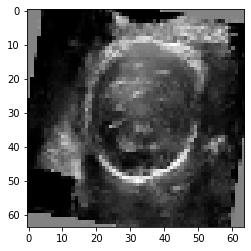

[305/1000] G_loss: 3.8250393867492676, D_loss: 0.6226697564125061
[306/1000][0/13]	Loss_D: 0.6257	Loss_G: 2.2818	D(x): 0.6704	D(G(z)): 0.0567 / 0.1242


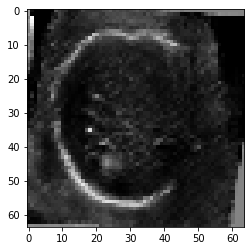

[306/1000] G_loss: 3.5645811557769775, D_loss: 0.5865492224693298
[307/1000][0/13]	Loss_D: 0.5791	Loss_G: 4.7594	D(x): 0.8855	D(G(z)): 0.1560 / 0.0075


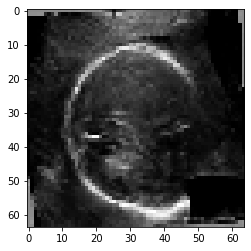

[307/1000] G_loss: 3.806087017059326, D_loss: 0.5973424315452576
[308/1000][0/13]	Loss_D: 0.5359	Loss_G: 4.6619	D(x): 0.8431	D(G(z)): 0.1126 / 0.0087


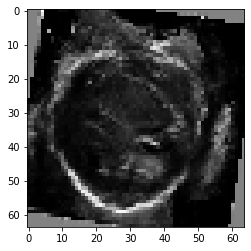

[308/1000] G_loss: 3.743932008743286, D_loss: 0.5662362575531006
[309/1000][0/13]	Loss_D: 0.8032	Loss_G: 5.5463	D(x): 0.9506	D(G(z)): 0.2437 / 0.0034


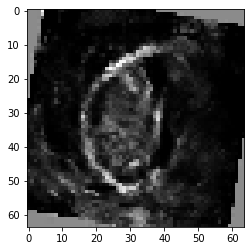

[309/1000] G_loss: 4.073429584503174, D_loss: 0.5992678999900818
Saving checkpoint at epoch :  309
[310/1000][0/13]	Loss_D: 0.7546	Loss_G: 2.0232	D(x): 0.5646	D(G(z)): 0.0242 / 0.2034


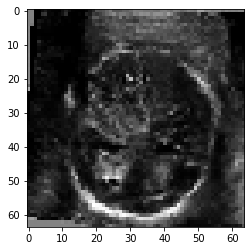

[310/1000] G_loss: 3.8918497562408447, D_loss: 0.683667778968811
[311/1000][0/13]	Loss_D: 0.5844	Loss_G: 2.9645	D(x): 0.7709	D(G(z)): 0.0871 / 0.0706


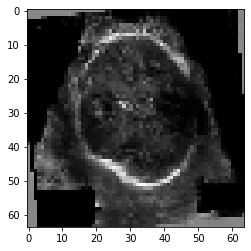

[311/1000] G_loss: 4.001896381378174, D_loss: 0.719196617603302
[312/1000][0/13]	Loss_D: 0.7592	Loss_G: 5.3430	D(x): 0.9162	D(G(z)): 0.2512 / 0.0055


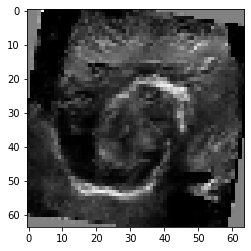

[312/1000] G_loss: 3.855721950531006, D_loss: 0.660742461681366
[313/1000][0/13]	Loss_D: 0.4915	Loss_G: 4.1150	D(x): 0.7910	D(G(z)): 0.0326 / 0.0180


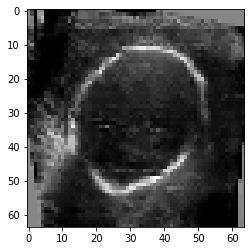

[313/1000] G_loss: 3.8178369998931885, D_loss: 0.6938698887825012
[314/1000][0/13]	Loss_D: 0.9928	Loss_G: 6.0315	D(x): 0.9161	D(G(z)): 0.3098 / 0.0035


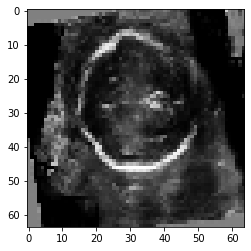

[314/1000] G_loss: 3.9664270877838135, D_loss: 0.743700385093689
Saving checkpoint at epoch :  314
[315/1000][0/13]	Loss_D: 0.5591	Loss_G: 3.5481	D(x): 0.8111	D(G(z)): 0.0912 / 0.0310


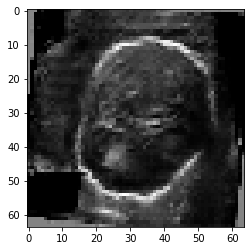

[315/1000] G_loss: 3.8132379055023193, D_loss: 0.574418306350708
[316/1000][0/13]	Loss_D: 0.5749	Loss_G: 4.9971	D(x): 0.8479	D(G(z)): 0.1126 / 0.0126


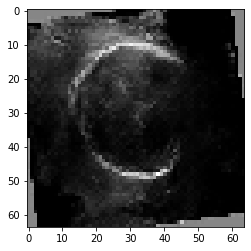

[316/1000] G_loss: 3.899104595184326, D_loss: 0.5789505839347839
[317/1000][0/13]	Loss_D: 0.5452	Loss_G: 4.3239	D(x): 0.8206	D(G(z)): 0.1190 / 0.0134


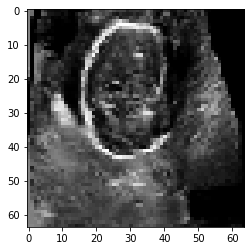

[317/1000] G_loss: 3.8300552368164062, D_loss: 0.5511448383331299
[318/1000][0/13]	Loss_D: 0.6055	Loss_G: 4.8582	D(x): 0.9015	D(G(z)): 0.1631 / 0.0073


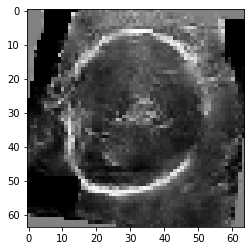

[318/1000] G_loss: 3.767094612121582, D_loss: 0.5589057803153992
[319/1000][0/13]	Loss_D: 0.6054	Loss_G: 4.8488	D(x): 0.9285	D(G(z)): 0.1488 / 0.0078


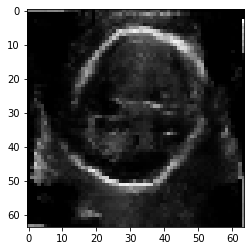

[319/1000] G_loss: 3.9977662563323975, D_loss: 0.5660443902015686
Saving checkpoint at epoch :  319
[320/1000][0/13]	Loss_D: 0.5248	Loss_G: 2.9172	D(x): 0.7491	D(G(z)): 0.0416 / 0.0631


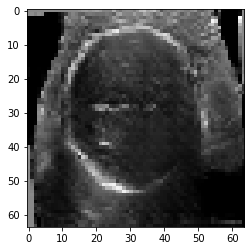

[320/1000] G_loss: 3.9729838371276855, D_loss: 0.6218372583389282
[321/1000][0/13]	Loss_D: 0.5920	Loss_G: 3.8482	D(x): 0.8207	D(G(z)): 0.1197 / 0.0222


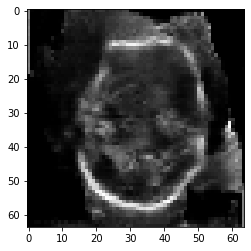

[321/1000] G_loss: 3.868800163269043, D_loss: 0.6560103893280029
[322/1000][0/13]	Loss_D: 0.9453	Loss_G: 5.4540	D(x): 0.9119	D(G(z)): 0.2759 / 0.0043


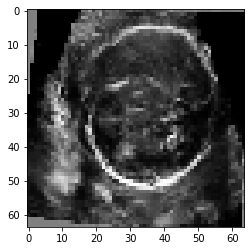

[322/1000] G_loss: 4.022623062133789, D_loss: 0.6585096120834351
[323/1000][0/13]	Loss_D: 0.5994	Loss_G: 4.4292	D(x): 0.8792	D(G(z)): 0.1516 / 0.0118


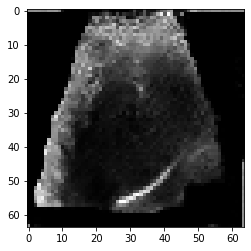

[323/1000] G_loss: 3.8800365924835205, D_loss: 0.5616278648376465
[324/1000][0/13]	Loss_D: 0.5422	Loss_G: 3.9724	D(x): 0.8240	D(G(z)): 0.1083 / 0.0217


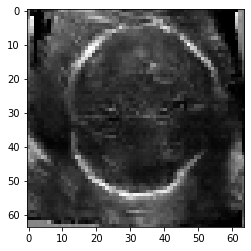

[324/1000] G_loss: 3.75972318649292, D_loss: 0.5327440500259399
Saving checkpoint at epoch :  324
[325/1000][0/13]	Loss_D: 0.6071	Loss_G: 3.9727	D(x): 0.8373	D(G(z)): 0.1497 / 0.0227


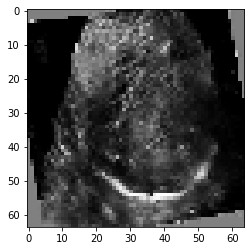

[325/1000] G_loss: 3.837008476257324, D_loss: 0.5631570219993591
[326/1000][0/13]	Loss_D: 0.6471	Loss_G: 5.3641	D(x): 0.9270	D(G(z)): 0.1737 / 0.0034


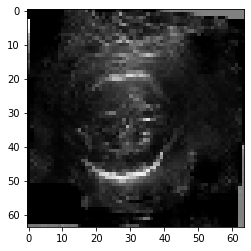

[326/1000] G_loss: 4.050126552581787, D_loss: 0.636160135269165
[327/1000][0/13]	Loss_D: 0.5379	Loss_G: 3.7786	D(x): 0.7977	D(G(z)): 0.0808 / 0.0430


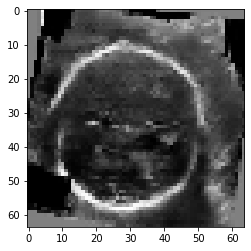

[327/1000] G_loss: 4.009536266326904, D_loss: 0.5901444554328918
[328/1000][0/13]	Loss_D: 0.4780	Loss_G: 4.6014	D(x): 0.8215	D(G(z)): 0.0433 / 0.0121


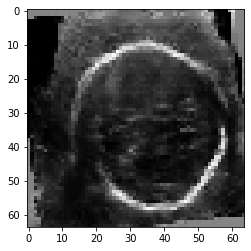

[328/1000] G_loss: 4.006058692932129, D_loss: 0.7585206627845764
[329/1000][0/13]	Loss_D: 1.1907	Loss_G: 7.6510	D(x): 0.9873	D(G(z)): 0.4014 / 0.0006


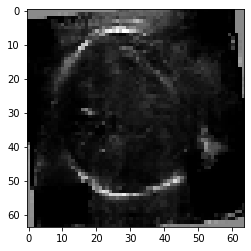

[329/1000] G_loss: 4.523889064788818, D_loss: 1.4089395999908447
Saving checkpoint at epoch :  329
[330/1000][0/13]	Loss_D: 0.6933	Loss_G: 3.0129	D(x): 0.7546	D(G(z)): 0.1321 / 0.0555


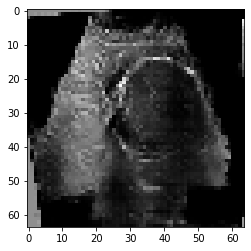

[330/1000] G_loss: 3.924823522567749, D_loss: 0.794324517250061
[331/1000][0/13]	Loss_D: 0.8596	Loss_G: 3.0889	D(x): 0.6020	D(G(z)): 0.0870 / 0.0681


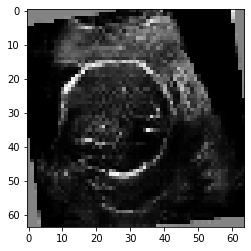

[331/1000] G_loss: 3.7375552654266357, D_loss: 0.6663742661476135
[332/1000][0/13]	Loss_D: 0.6058	Loss_G: 4.0873	D(x): 0.8718	D(G(z)): 0.1480 / 0.0185


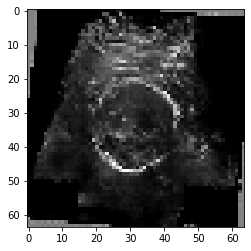

[332/1000] G_loss: 3.803356409072876, D_loss: 0.6067381501197815
[333/1000][0/13]	Loss_D: 0.4661	Loss_G: 3.6491	D(x): 0.8560	D(G(z)): 0.0597 / 0.0281


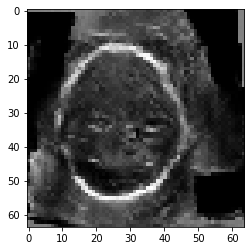

[333/1000] G_loss: 3.805943727493286, D_loss: 0.6516176462173462
[334/1000][0/13]	Loss_D: 0.6511	Loss_G: 3.1684	D(x): 0.6704	D(G(z)): 0.0639 / 0.0824


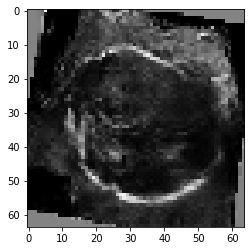

[334/1000] G_loss: 3.566157817840576, D_loss: 0.5772732496261597
Saving checkpoint at epoch :  334
[335/1000][0/13]	Loss_D: 0.5043	Loss_G: 3.6397	D(x): 0.8198	D(G(z)): 0.0877 / 0.0254


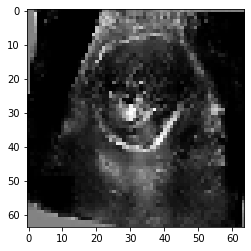

[335/1000] G_loss: 3.677974224090576, D_loss: 0.571159303188324
[336/1000][0/13]	Loss_D: 0.5688	Loss_G: 4.7463	D(x): 0.8829	D(G(z)): 0.1435 / 0.0087


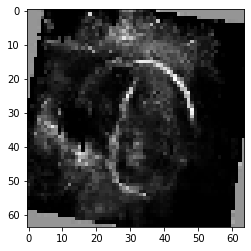

[336/1000] G_loss: 3.7701528072357178, D_loss: 0.6323297023773193
[337/1000][0/13]	Loss_D: 0.5360	Loss_G: 2.9463	D(x): 0.8065	D(G(z)): 0.0903 / 0.0615


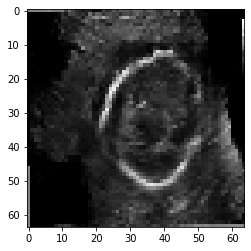

[337/1000] G_loss: 3.6718647480010986, D_loss: 0.595066487789154
[338/1000][0/13]	Loss_D: 0.5886	Loss_G: 3.5894	D(x): 0.8130	D(G(z)): 0.1171 / 0.0318


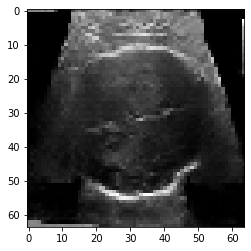

[338/1000] G_loss: 3.7613935470581055, D_loss: 0.6021823287010193
[339/1000][0/13]	Loss_D: 1.0017	Loss_G: 5.7612	D(x): 0.9267	D(G(z)): 0.3129 / 0.0041


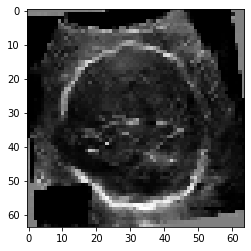

[339/1000] G_loss: 4.276806831359863, D_loss: 0.6652356386184692
Saving checkpoint at epoch :  339
[340/1000][0/13]	Loss_D: 0.5872	Loss_G: 3.6914	D(x): 0.7497	D(G(z)): 0.0709 / 0.0364


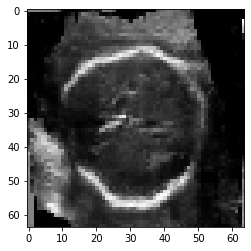

[340/1000] G_loss: 3.7348978519439697, D_loss: 0.5847357511520386
[341/1000][0/13]	Loss_D: 0.5972	Loss_G: 4.9027	D(x): 0.8980	D(G(z)): 0.1689 / 0.0078


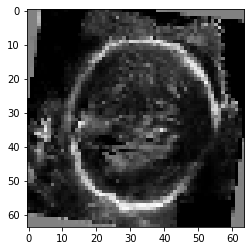

[341/1000] G_loss: 3.8870620727539062, D_loss: 0.5557312965393066
[342/1000][0/13]	Loss_D: 0.6087	Loss_G: 3.7358	D(x): 0.7719	D(G(z)): 0.1248 / 0.0241


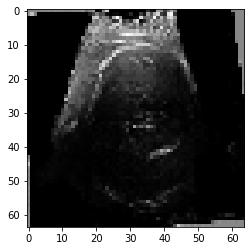

[342/1000] G_loss: 3.793294668197632, D_loss: 0.5614729523658752
[343/1000][0/13]	Loss_D: 0.5296	Loss_G: 4.5159	D(x): 0.7945	D(G(z)): 0.0795 / 0.0143


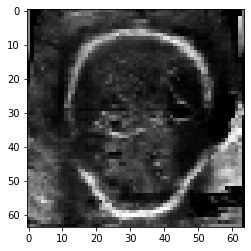

[343/1000] G_loss: 4.0342888832092285, D_loss: 0.5742737054824829
[344/1000][0/13]	Loss_D: 0.4908	Loss_G: 3.7644	D(x): 0.8716	D(G(z)): 0.0746 / 0.0258


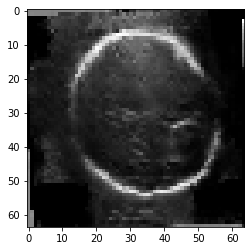

[344/1000] G_loss: 3.7031400203704834, D_loss: 0.5298756957054138
Saving checkpoint at epoch :  344
[345/1000][0/13]	Loss_D: 0.5282	Loss_G: 4.1086	D(x): 0.8579	D(G(z)): 0.0838 / 0.0170


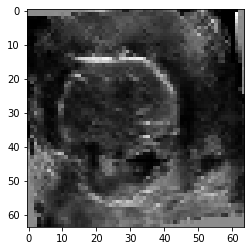

[345/1000] G_loss: 3.7533578872680664, D_loss: 0.6044200658798218
[346/1000][0/13]	Loss_D: 0.9591	Loss_G: 6.8137	D(x): 0.9433	D(G(z)): 0.3534 / 0.0011


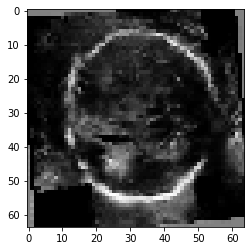

[346/1000] G_loss: 3.9941277503967285, D_loss: 0.7174122333526611
[347/1000][0/13]	Loss_D: 0.7536	Loss_G: 5.5354	D(x): 0.9057	D(G(z)): 0.2303 / 0.0065


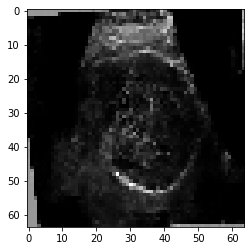

[347/1000] G_loss: 4.008707046508789, D_loss: 0.7048117518424988
[348/1000][0/13]	Loss_D: 1.0526	Loss_G: 7.0525	D(x): 0.9806	D(G(z)): 0.3544 / 0.0011


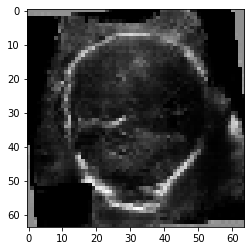

[348/1000] G_loss: 4.151548385620117, D_loss: 0.6757981181144714
[349/1000][0/13]	Loss_D: 0.5402	Loss_G: 3.8659	D(x): 0.8094	D(G(z)): 0.0909 / 0.0245


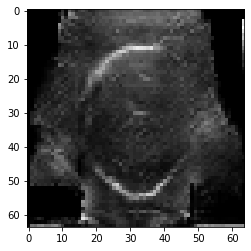

[349/1000] G_loss: 3.89475417137146, D_loss: 0.7019456028938293
Saving checkpoint at epoch :  349
[350/1000][0/13]	Loss_D: 0.8032	Loss_G: 6.1110	D(x): 0.9270	D(G(z)): 0.2677 / 0.0024


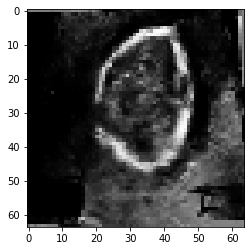

[350/1000] G_loss: 3.9482884407043457, D_loss: 0.6025968194007874
[351/1000][0/13]	Loss_D: 0.5358	Loss_G: 3.2244	D(x): 0.7750	D(G(z)): 0.0603 / 0.0424


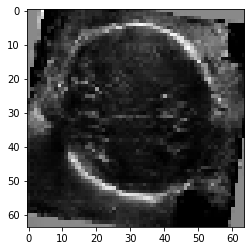

[351/1000] G_loss: 3.6966328620910645, D_loss: 0.5857446789741516
[352/1000][0/13]	Loss_D: 0.6790	Loss_G: 4.5037	D(x): 0.8770	D(G(z)): 0.1797 / 0.0100


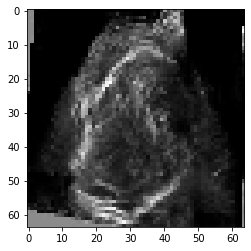

[352/1000] G_loss: 3.8120343685150146, D_loss: 0.6058312654495239
[353/1000][0/13]	Loss_D: 0.6250	Loss_G: 4.7859	D(x): 0.9152	D(G(z)): 0.1397 / 0.0080


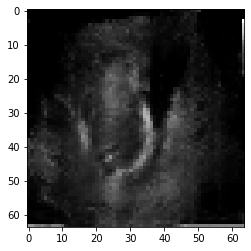

[353/1000] G_loss: 3.6921212673187256, D_loss: 0.5393427610397339
[354/1000][0/13]	Loss_D: 0.5796	Loss_G: 4.5888	D(x): 0.9326	D(G(z)): 0.1452 / 0.0094


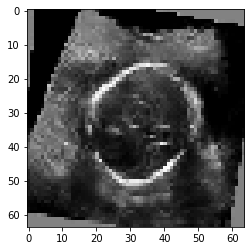

[354/1000] G_loss: 3.780856132507324, D_loss: 0.5124083161354065
Saving checkpoint at epoch :  354
[355/1000][0/13]	Loss_D: 0.4955	Loss_G: 4.6235	D(x): 0.9371	D(G(z)): 0.0996 / 0.0087


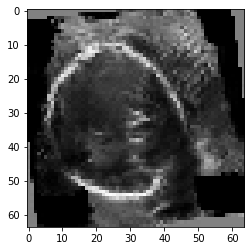

[355/1000] G_loss: 4.000384330749512, D_loss: 0.5529712438583374
[356/1000][0/13]	Loss_D: 0.4381	Loss_G: 4.4522	D(x): 0.9027	D(G(z)): 0.0486 / 0.0118


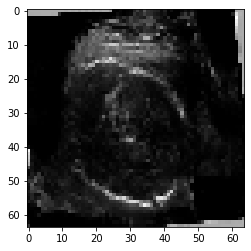

[356/1000] G_loss: 3.73797607421875, D_loss: 0.5200760364532471
[357/1000][0/13]	Loss_D: 0.4834	Loss_G: 4.1318	D(x): 0.8616	D(G(z)): 0.0706 / 0.0184


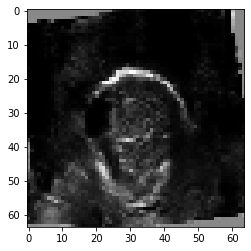

[357/1000] G_loss: 3.950979709625244, D_loss: 0.5379621982574463
[358/1000][0/13]	Loss_D: 0.4252	Loss_G: 3.9823	D(x): 0.8518	D(G(z)): 0.0396 / 0.0197


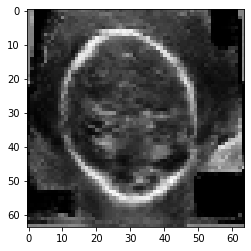

[358/1000] G_loss: 3.9436464309692383, D_loss: 0.5067418813705444
[359/1000][0/13]	Loss_D: 0.4816	Loss_G: 3.5641	D(x): 0.8428	D(G(z)): 0.0733 / 0.0298


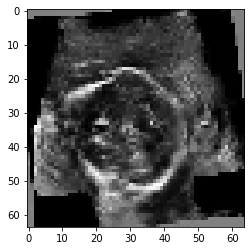

[359/1000] G_loss: 4.076406002044678, D_loss: 0.6337657570838928
Saving checkpoint at epoch :  359
[360/1000][0/13]	Loss_D: 0.5158	Loss_G: 2.9858	D(x): 0.7591	D(G(z)): 0.0410 / 0.0617


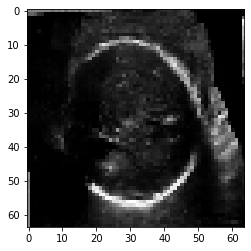

[360/1000] G_loss: 3.8417229652404785, D_loss: 0.5881493091583252
[361/1000][0/13]	Loss_D: 0.8735	Loss_G: 6.3613	D(x): 0.9539	D(G(z)): 0.3060 / 0.0023


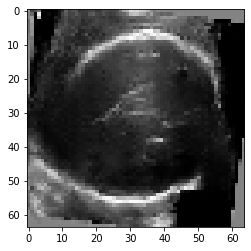

[361/1000] G_loss: 3.976926326751709, D_loss: 0.6459073424339294
[362/1000][0/13]	Loss_D: 0.5452	Loss_G: 4.9454	D(x): 0.9090	D(G(z)): 0.1160 / 0.0068


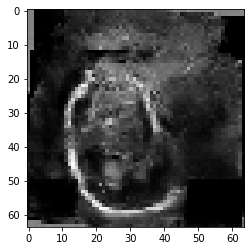

[362/1000] G_loss: 3.8963851928710938, D_loss: 0.5361958742141724
[363/1000][0/13]	Loss_D: 0.4934	Loss_G: 2.6775	D(x): 0.7787	D(G(z)): 0.0336 / 0.0780


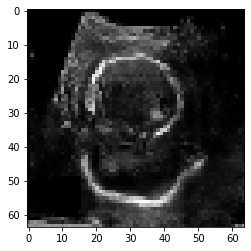

[363/1000] G_loss: 4.069926738739014, D_loss: 0.6229057908058167
[364/1000][0/13]	Loss_D: 0.5087	Loss_G: 4.8973	D(x): 0.9006	D(G(z)): 0.0920 / 0.0065


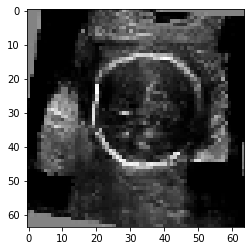

[364/1000] G_loss: 3.861433982849121, D_loss: 0.5267015099525452
Saving checkpoint at epoch :  364
[365/1000][0/13]	Loss_D: 0.5613	Loss_G: 5.0329	D(x): 0.9176	D(G(z)): 0.1196 / 0.0073


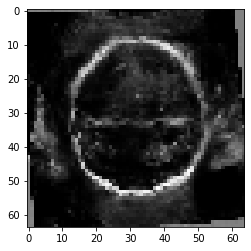

[365/1000] G_loss: 3.9606921672821045, D_loss: 0.5014418959617615
[366/1000][0/13]	Loss_D: 0.4715	Loss_G: 3.5641	D(x): 0.8450	D(G(z)): 0.0550 / 0.0286


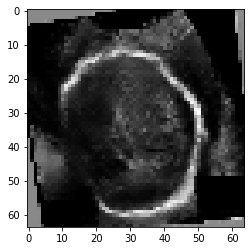

[366/1000] G_loss: 3.8972702026367188, D_loss: 0.525663435459137
[367/1000][0/13]	Loss_D: 0.6315	Loss_G: 2.8138	D(x): 0.6562	D(G(z)): 0.0147 / 0.0760


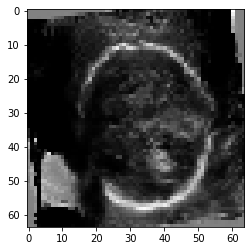

[367/1000] G_loss: 3.9469473361968994, D_loss: 0.5532393455505371
[368/1000][0/13]	Loss_D: 0.6424	Loss_G: 5.4878	D(x): 0.9637	D(G(z)): 0.1822 / 0.0041


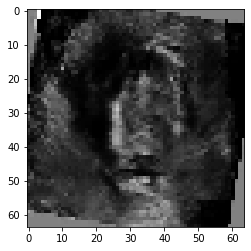

[368/1000] G_loss: 4.060673236846924, D_loss: 0.5179928541183472
[369/1000][0/13]	Loss_D: 0.5165	Loss_G: 3.9745	D(x): 0.8280	D(G(z)): 0.0517 / 0.0195


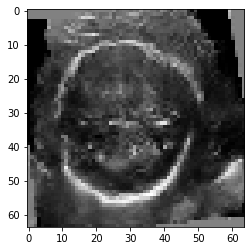

[369/1000] G_loss: 3.893000364303589, D_loss: 0.5168997645378113
Saving checkpoint at epoch :  369
[370/1000][0/13]	Loss_D: 0.6709	Loss_G: 4.8881	D(x): 0.8744	D(G(z)): 0.1765 / 0.0090


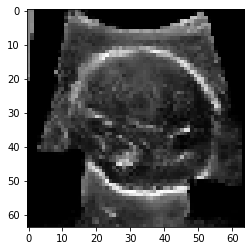

[370/1000] G_loss: 4.066157341003418, D_loss: 0.5440624952316284
[371/1000][0/13]	Loss_D: 0.4937	Loss_G: 3.5693	D(x): 0.8291	D(G(z)): 0.0693 / 0.0295


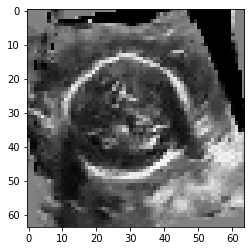

[371/1000] G_loss: 3.8282954692840576, D_loss: 0.48256558179855347
[372/1000][0/13]	Loss_D: 0.4884	Loss_G: 3.3306	D(x): 0.7962	D(G(z)): 0.0369 / 0.0346


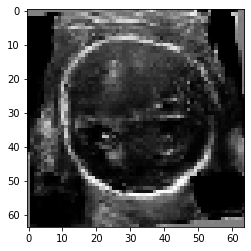

[372/1000] G_loss: 4.275512218475342, D_loss: 0.5729977488517761
[373/1000][0/13]	Loss_D: 0.8818	Loss_G: 3.4366	D(x): 0.5274	D(G(z)): 0.0051 / 0.0716


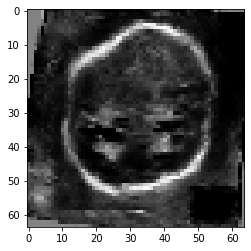

[373/1000] G_loss: 4.091814041137695, D_loss: 0.570534348487854
[374/1000][0/13]	Loss_D: 0.6611	Loss_G: 2.2730	D(x): 0.6743	D(G(z)): 0.0336 / 0.1295


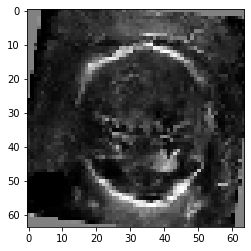

[374/1000] G_loss: 4.076760292053223, D_loss: 0.7109471559524536
Saving checkpoint at epoch :  374
[375/1000][0/13]	Loss_D: 0.6477	Loss_G: 4.9927	D(x): 0.9532	D(G(z)): 0.1594 / 0.0085


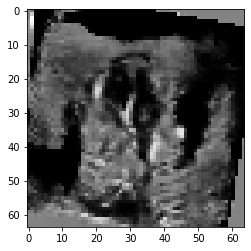

[375/1000] G_loss: 4.095576763153076, D_loss: 0.5380823612213135
[376/1000][0/13]	Loss_D: 0.4931	Loss_G: 5.6990	D(x): 0.9185	D(G(z)): 0.0912 / 0.0028


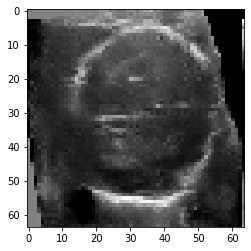

[376/1000] G_loss: 4.223986625671387, D_loss: 0.6216632127761841
[377/1000][0/13]	Loss_D: 0.7210	Loss_G: 5.7416	D(x): 0.9313	D(G(z)): 0.2088 / 0.0039


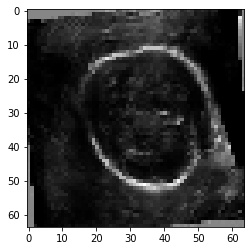

[377/1000] G_loss: 4.9420647621154785, D_loss: 1.1485556364059448
[378/1000][0/13]	Loss_D: 2.6976	Loss_G: 1.0124	D(x): 0.1541	D(G(z)): 0.0089 / 0.5858


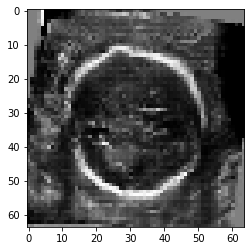

[378/1000] G_loss: 3.5560402870178223, D_loss: 2.381060838699341
[379/1000][0/13]	Loss_D: 2.9246	Loss_G: 8.9664	D(x): 0.8553	D(G(z)): 0.7670 / 0.0004


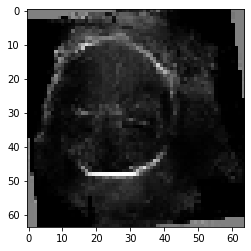

[379/1000] G_loss: 3.6274542808532715, D_loss: 1.6260054111480713
Saving checkpoint at epoch :  379
[380/1000][0/13]	Loss_D: 0.8895	Loss_G: 3.4420	D(x): 0.7627	D(G(z)): 0.2935 / 0.0299


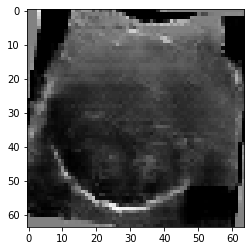

[380/1000] G_loss: 3.321265697479248, D_loss: 0.8442391753196716
[381/1000][0/13]	Loss_D: 0.7888	Loss_G: 4.5373	D(x): 0.8782	D(G(z)): 0.2755 / 0.0099


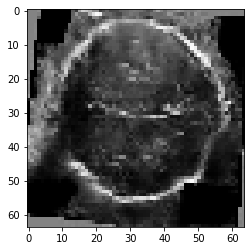

[381/1000] G_loss: 3.608996868133545, D_loss: 0.8467233180999756
[382/1000][0/13]	Loss_D: 0.7900	Loss_G: 2.9442	D(x): 0.5896	D(G(z)): 0.0528 / 0.0682


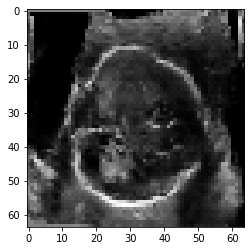

[382/1000] G_loss: 3.4465270042419434, D_loss: 0.6728149652481079
[383/1000][0/13]	Loss_D: 0.5124	Loss_G: 3.7540	D(x): 0.8298	D(G(z)): 0.0996 / 0.0229


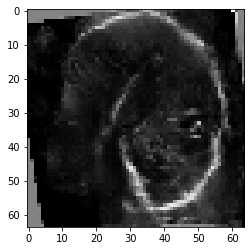

[383/1000] G_loss: 3.372633457183838, D_loss: 0.6023143529891968
[384/1000][0/13]	Loss_D: 0.7501	Loss_G: 4.8535	D(x): 0.9002	D(G(z)): 0.2321 / 0.0091


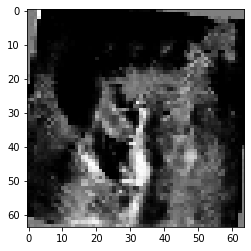

[384/1000] G_loss: 3.5652480125427246, D_loss: 0.6134889721870422
Saving checkpoint at epoch :  384
[385/1000][0/13]	Loss_D: 0.6119	Loss_G: 4.2703	D(x): 0.8725	D(G(z)): 0.1678 / 0.0131


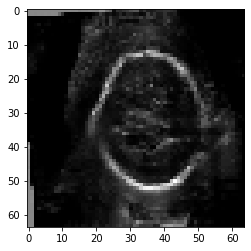

[385/1000] G_loss: 3.508171558380127, D_loss: 0.5804551243782043
[386/1000][0/13]	Loss_D: 0.5159	Loss_G: 3.4462	D(x): 0.8205	D(G(z)): 0.0861 / 0.0305


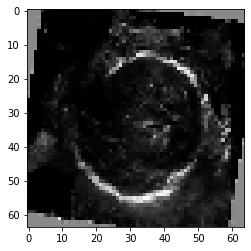

[386/1000] G_loss: 3.4163362979888916, D_loss: 0.5501269698143005
[387/1000][0/13]	Loss_D: 0.7063	Loss_G: 5.1434	D(x): 0.9051	D(G(z)): 0.2333 / 0.0061


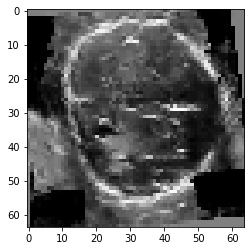

[387/1000] G_loss: 3.5124382972717285, D_loss: 0.5811029672622681
[388/1000][0/13]	Loss_D: 0.5788	Loss_G: 4.2217	D(x): 0.9125	D(G(z)): 0.1711 / 0.0124


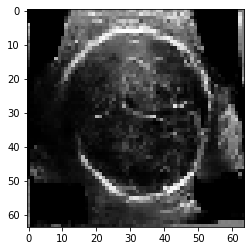

[388/1000] G_loss: 3.599712371826172, D_loss: 0.5558816194534302
[389/1000][0/13]	Loss_D: 0.5470	Loss_G: 2.6512	D(x): 0.7195	D(G(z)): 0.0520 / 0.0930


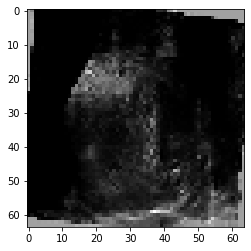

[389/1000] G_loss: 3.5015482902526855, D_loss: 0.5500611066818237
Saving checkpoint at epoch :  389
[390/1000][0/13]	Loss_D: 0.8311	Loss_G: 5.1246	D(x): 0.9050	D(G(z)): 0.2650 / 0.0079


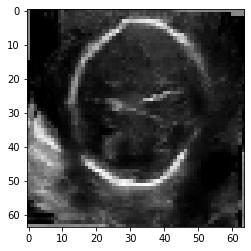

[390/1000] G_loss: 3.844202756881714, D_loss: 0.5556556582450867
[391/1000][0/13]	Loss_D: 0.6277	Loss_G: 2.3446	D(x): 0.6307	D(G(z)): 0.0351 / 0.1248


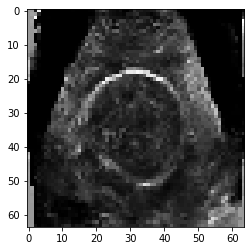

[391/1000] G_loss: 3.5535597801208496, D_loss: 0.5734259486198425
[392/1000][0/13]	Loss_D: 0.7821	Loss_G: 5.1472	D(x): 0.9616	D(G(z)): 0.2365 / 0.0058


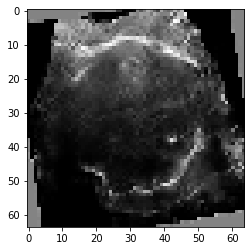

[392/1000] G_loss: 3.7204394340515137, D_loss: 0.5514317154884338
[393/1000][0/13]	Loss_D: 0.5769	Loss_G: 4.3533	D(x): 0.9127	D(G(z)): 0.1396 / 0.0125


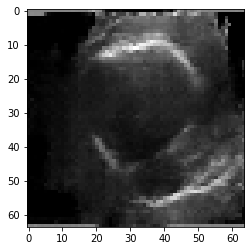

[393/1000] G_loss: 4.009797096252441, D_loss: 0.6122375726699829
[394/1000][0/13]	Loss_D: 0.5327	Loss_G: 3.2765	D(x): 0.8305	D(G(z)): 0.0735 / 0.0401


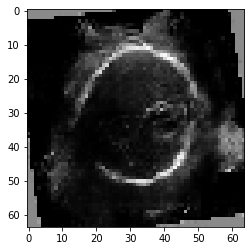

[394/1000] G_loss: 3.7166757583618164, D_loss: 0.5481885075569153
Saving checkpoint at epoch :  394
[395/1000][0/13]	Loss_D: 0.5159	Loss_G: 3.1966	D(x): 0.7530	D(G(z)): 0.0341 / 0.0606


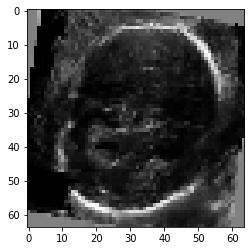

[395/1000] G_loss: 3.838623046875, D_loss: 0.5246182084083557
[396/1000][0/13]	Loss_D: 0.4872	Loss_G: 4.0288	D(x): 0.8298	D(G(z)): 0.0456 / 0.0225


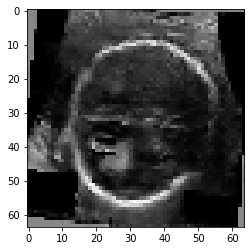

[396/1000] G_loss: 3.810516595840454, D_loss: 0.5261729955673218
[397/1000][0/13]	Loss_D: 0.5139	Loss_G: 4.4587	D(x): 0.8922	D(G(z)): 0.0995 / 0.0098


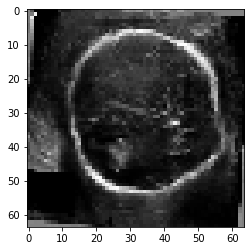

[397/1000] G_loss: 3.717900276184082, D_loss: 0.5119667649269104
[398/1000][0/13]	Loss_D: 0.5838	Loss_G: 4.9511	D(x): 0.9333	D(G(z)): 0.1411 / 0.0060


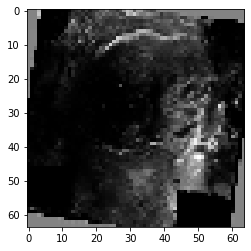

[398/1000] G_loss: 3.7433245182037354, D_loss: 0.5047686696052551
[399/1000][0/13]	Loss_D: 0.5687	Loss_G: 4.1607	D(x): 0.8323	D(G(z)): 0.1145 / 0.0146


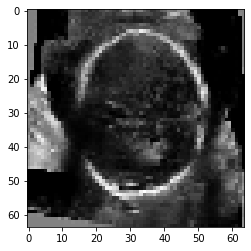

[399/1000] G_loss: 3.894073486328125, D_loss: 0.5716214776039124
Saving checkpoint at epoch :  399
[400/1000][0/13]	Loss_D: 0.8793	Loss_G: 6.8104	D(x): 0.9625	D(G(z)): 0.2893 / 0.0010


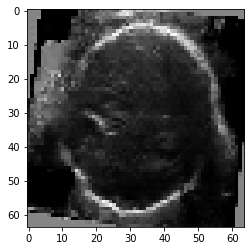

[400/1000] G_loss: 4.092552661895752, D_loss: 0.5555657148361206
[401/1000][0/13]	Loss_D: 0.8107	Loss_G: 6.4163	D(x): 0.9371	D(G(z)): 0.2747 / 0.0014


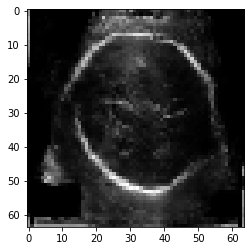

[401/1000] G_loss: 4.057088851928711, D_loss: 0.5728738307952881
[402/1000][0/13]	Loss_D: 0.5159	Loss_G: 3.9985	D(x): 0.8937	D(G(z)): 0.1007 / 0.0210


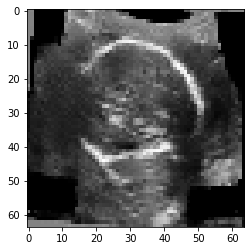

[402/1000] G_loss: 3.7910635471343994, D_loss: 0.5229542255401611
[403/1000][0/13]	Loss_D: 0.4863	Loss_G: 4.1154	D(x): 0.8578	D(G(z)): 0.0749 / 0.0165


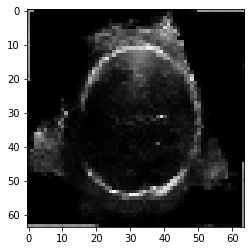

[403/1000] G_loss: 3.998321771621704, D_loss: 0.4903697371482849
[404/1000][0/13]	Loss_D: 0.6093	Loss_G: 2.0053	D(x): 0.6746	D(G(z)): 0.0298 / 0.1543


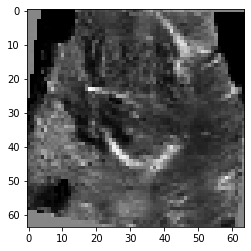

[404/1000] G_loss: 3.9497568607330322, D_loss: 0.5473557114601135
Saving checkpoint at epoch :  404
[405/1000][0/13]	Loss_D: 0.5320	Loss_G: 4.8035	D(x): 0.9038	D(G(z)): 0.1074 / 0.0071


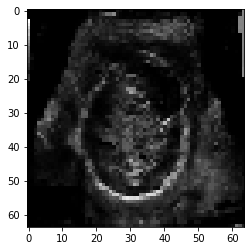

[405/1000] G_loss: 4.152374744415283, D_loss: 0.5975658297538757
[406/1000][0/13]	Loss_D: 1.0554	Loss_G: 2.8458	D(x): 0.4609	D(G(z)): 0.0079 / 0.1276


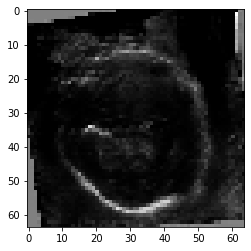

[406/1000] G_loss: 3.9743728637695312, D_loss: 0.5943363904953003
[407/1000][0/13]	Loss_D: 0.5079	Loss_G: 3.1945	D(x): 0.7433	D(G(z)): 0.0432 / 0.0567


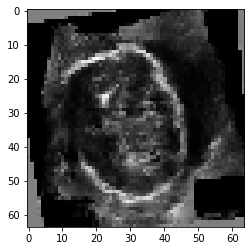

[407/1000] G_loss: 3.9497337341308594, D_loss: 0.5294442772865295
[408/1000][0/13]	Loss_D: 0.5305	Loss_G: 4.5833	D(x): 0.8166	D(G(z)): 0.0805 / 0.0118


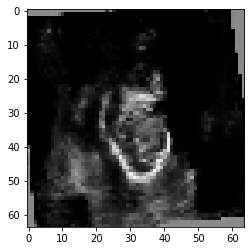

[408/1000] G_loss: 3.9416627883911133, D_loss: 0.5559220314025879
[409/1000][0/13]	Loss_D: 0.5270	Loss_G: 3.8414	D(x): 0.8958	D(G(z)): 0.1125 / 0.0195


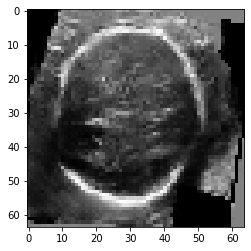

[409/1000] G_loss: 3.938202142715454, D_loss: 0.5430735945701599
Saving checkpoint at epoch :  409
[410/1000][0/13]	Loss_D: 0.6327	Loss_G: 2.8182	D(x): 0.6489	D(G(z)): 0.0234 / 0.0758


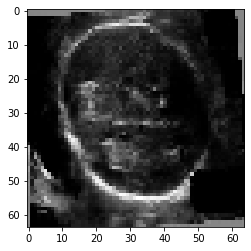

[410/1000] G_loss: 4.058703899383545, D_loss: 0.5980174541473389
[411/1000][0/13]	Loss_D: 0.4813	Loss_G: 4.2768	D(x): 0.8732	D(G(z)): 0.0743 / 0.0140


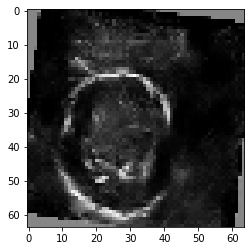

[411/1000] G_loss: 3.795867681503296, D_loss: 0.5539880394935608
[412/1000][0/13]	Loss_D: 0.6215	Loss_G: 5.4024	D(x): 0.9124	D(G(z)): 0.1589 / 0.0040


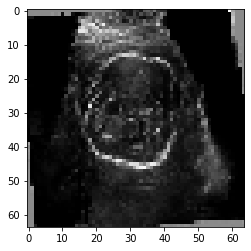

[412/1000] G_loss: 4.126753807067871, D_loss: 0.5924652814865112
[413/1000][0/13]	Loss_D: 0.4850	Loss_G: 3.7656	D(x): 0.8514	D(G(z)): 0.0803 / 0.0221


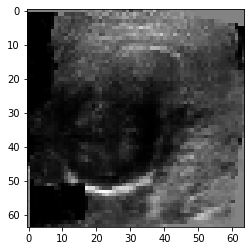

[413/1000] G_loss: 3.779874086380005, D_loss: 0.5067917704582214
[414/1000][0/13]	Loss_D: 0.7198	Loss_G: 5.6898	D(x): 0.9623	D(G(z)): 0.2162 / 0.0037


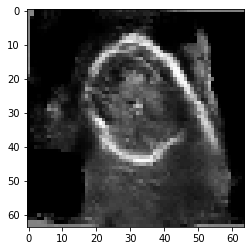

[414/1000] G_loss: 3.9577856063842773, D_loss: 0.5452032089233398
Saving checkpoint at epoch :  414
[415/1000][0/13]	Loss_D: 0.8330	Loss_G: 6.6013	D(x): 0.9376	D(G(z)): 0.2410 / 0.0011


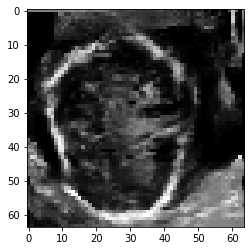

[415/1000] G_loss: 4.183265209197998, D_loss: 0.5871105790138245
[416/1000][0/13]	Loss_D: 0.5474	Loss_G: 4.3482	D(x): 0.8983	D(G(z)): 0.1247 / 0.0139


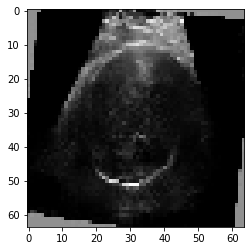

[416/1000] G_loss: 4.065812110900879, D_loss: 0.5820207595825195
[417/1000][0/13]	Loss_D: 0.6451	Loss_G: 5.5081	D(x): 0.9242	D(G(z)): 0.1870 / 0.0036


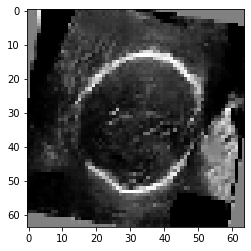

[417/1000] G_loss: 3.915693521499634, D_loss: 0.5799431800842285
[418/1000][0/13]	Loss_D: 0.6413	Loss_G: 4.9467	D(x): 0.9381	D(G(z)): 0.1617 / 0.0087


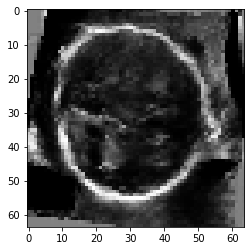

[418/1000] G_loss: 4.102733135223389, D_loss: 0.5307527780532837
[419/1000][0/13]	Loss_D: 0.4917	Loss_G: 4.4991	D(x): 0.8686	D(G(z)): 0.0897 / 0.0112


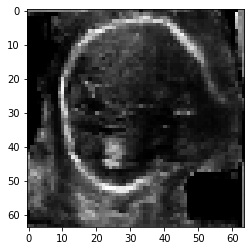

[419/1000] G_loss: 3.826434850692749, D_loss: 0.4891216456890106
Saving checkpoint at epoch :  419
[420/1000][0/13]	Loss_D: 0.5384	Loss_G: 4.2663	D(x): 0.8646	D(G(z)): 0.1082 / 0.0131


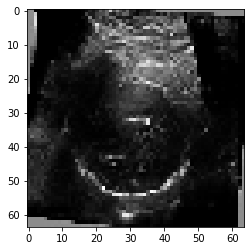

[420/1000] G_loss: 4.097239971160889, D_loss: 0.5918383598327637
[421/1000][0/13]	Loss_D: 0.5161	Loss_G: 4.1914	D(x): 0.7814	D(G(z)): 0.0391 / 0.0250


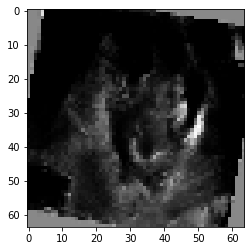

[421/1000] G_loss: 3.953256130218506, D_loss: 0.495104044675827
[422/1000][0/13]	Loss_D: 0.5276	Loss_G: 4.8203	D(x): 0.8914	D(G(z)): 0.1117 / 0.0092


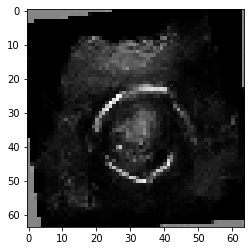

[422/1000] G_loss: 4.221045970916748, D_loss: 0.5583834052085876
[423/1000][0/13]	Loss_D: 0.6195	Loss_G: 2.5197	D(x): 0.6405	D(G(z)): 0.0129 / 0.1306


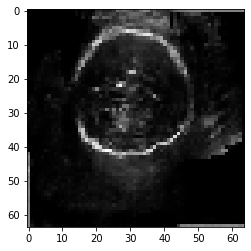

[423/1000] G_loss: 4.064105987548828, D_loss: 0.5841358304023743
[424/1000][0/13]	Loss_D: 0.5446	Loss_G: 3.4919	D(x): 0.7233	D(G(z)): 0.0227 / 0.0476


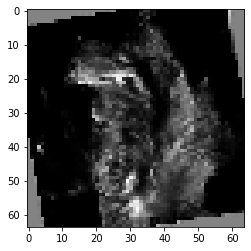

[424/1000] G_loss: 3.9273476600646973, D_loss: 0.5091952681541443
Saving checkpoint at epoch :  424
[425/1000][0/13]	Loss_D: 0.5538	Loss_G: 2.8998	D(x): 0.7395	D(G(z)): 0.0483 / 0.0659


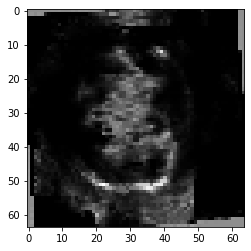

[425/1000] G_loss: 3.9310858249664307, D_loss: 0.49088045954704285
[426/1000][0/13]	Loss_D: 0.4456	Loss_G: 4.2271	D(x): 0.8838	D(G(z)): 0.0575 / 0.0158


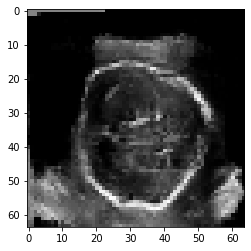

[426/1000] G_loss: 4.130475044250488, D_loss: 0.4871179461479187
[427/1000][0/13]	Loss_D: 0.5197	Loss_G: 3.1943	D(x): 0.7206	D(G(z)): 0.0273 / 0.0555


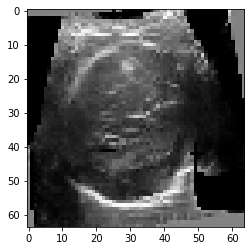

[427/1000] G_loss: 4.025636672973633, D_loss: 0.4872206449508667
[428/1000][0/13]	Loss_D: 0.5243	Loss_G: 3.7204	D(x): 0.7990	D(G(z)): 0.0520 / 0.0278


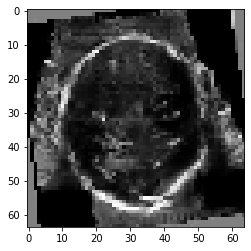

[428/1000] G_loss: 3.9255902767181396, D_loss: 0.49621355533599854
[429/1000][0/13]	Loss_D: 0.5331	Loss_G: 4.0190	D(x): 0.8027	D(G(z)): 0.0761 / 0.0246


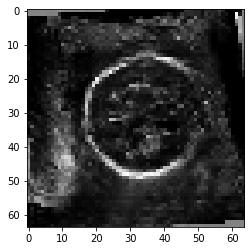

[429/1000] G_loss: 3.923469066619873, D_loss: 0.5069331526756287
Saving checkpoint at epoch :  429
[430/1000][0/13]	Loss_D: 0.7777	Loss_G: 7.1559	D(x): 0.9531	D(G(z)): 0.2566 / 0.0009


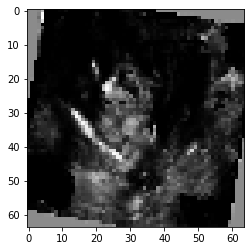

[430/1000] G_loss: 4.3688859939575195, D_loss: 0.5403032898902893
[431/1000][0/13]	Loss_D: 0.4592	Loss_G: 3.8080	D(x): 0.8272	D(G(z)): 0.0388 / 0.0293


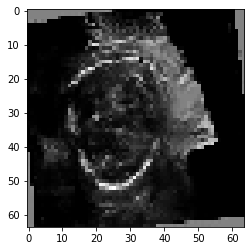

[431/1000] G_loss: 4.030571460723877, D_loss: 0.510577917098999
[432/1000][0/13]	Loss_D: 0.4121	Loss_G: 4.6085	D(x): 0.8938	D(G(z)): 0.0302 / 0.0119


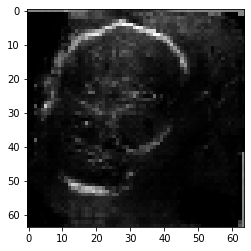

[432/1000] G_loss: 4.212483882904053, D_loss: 0.471504271030426
[433/1000][0/13]	Loss_D: 0.4766	Loss_G: 3.1857	D(x): 0.7820	D(G(z)): 0.0289 / 0.0497


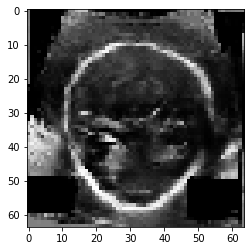

[433/1000] G_loss: 3.942718267440796, D_loss: 0.4959082007408142
[434/1000][0/13]	Loss_D: 0.5240	Loss_G: 3.7281	D(x): 0.8846	D(G(z)): 0.0878 / 0.0229


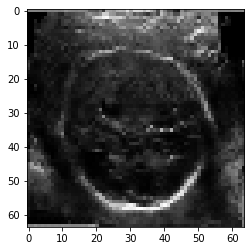

[434/1000] G_loss: 4.259469985961914, D_loss: 0.5179351568222046
Saving checkpoint at epoch :  434
[435/1000][0/13]	Loss_D: 0.4700	Loss_G: 4.3151	D(x): 0.8948	D(G(z)): 0.0871 / 0.0117


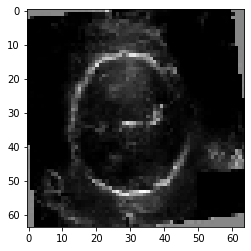

[435/1000] G_loss: 3.8577630519866943, D_loss: 0.5108992457389832
[436/1000][0/13]	Loss_D: 1.0907	Loss_G: 8.4834	D(x): 0.9805	D(G(z)): 0.3607 / 0.0002


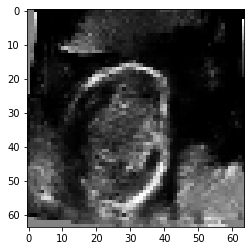

[436/1000] G_loss: 4.415750503540039, D_loss: 0.7649406790733337
[437/1000][0/13]	Loss_D: 0.6240	Loss_G: 5.5353	D(x): 0.9059	D(G(z)): 0.1415 / 0.0058


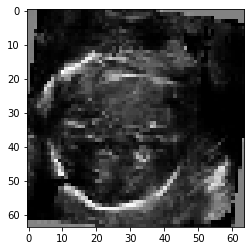

[437/1000] G_loss: 4.344176292419434, D_loss: 0.6698917746543884
[438/1000][0/13]	Loss_D: 0.6110	Loss_G: 4.3504	D(x): 0.8572	D(G(z)): 0.1404 / 0.0156


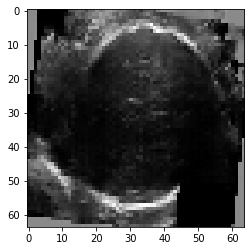

[438/1000] G_loss: 4.042482852935791, D_loss: 0.545818567276001
[439/1000][0/13]	Loss_D: 0.4891	Loss_G: 3.6815	D(x): 0.8171	D(G(z)): 0.0363 / 0.0271


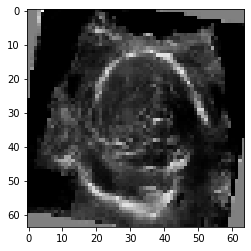

[439/1000] G_loss: 4.023306846618652, D_loss: 0.503994882106781
Saving checkpoint at epoch :  439
[440/1000][0/13]	Loss_D: 0.5010	Loss_G: 4.7493	D(x): 0.9025	D(G(z)): 0.0683 / 0.0086


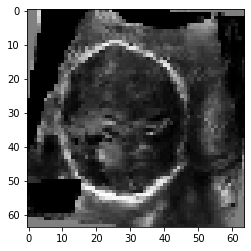

[440/1000] G_loss: 4.193197250366211, D_loss: 0.5956087708473206
[441/1000][0/13]	Loss_D: 0.6078	Loss_G: 5.2201	D(x): 0.9303	D(G(z)): 0.1516 / 0.0049


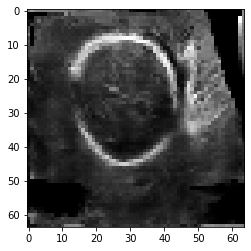

[441/1000] G_loss: 4.276339530944824, D_loss: 0.5841476321220398
[442/1000][0/13]	Loss_D: 0.5115	Loss_G: 4.0633	D(x): 0.8724	D(G(z)): 0.0747 / 0.0200


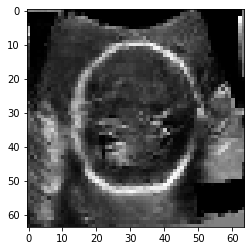

[442/1000] G_loss: 3.853999137878418, D_loss: 0.5052735209465027
[443/1000][0/13]	Loss_D: 0.5942	Loss_G: 4.7029	D(x): 0.9505	D(G(z)): 0.1376 / 0.0082


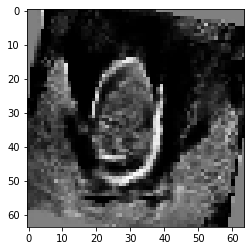

[443/1000] G_loss: 4.138966083526611, D_loss: 0.4747864007949829
[444/1000][0/13]	Loss_D: 0.4567	Loss_G: 4.2342	D(x): 0.9027	D(G(z)): 0.0498 / 0.0126


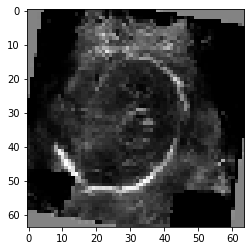

[444/1000] G_loss: 4.128252983093262, D_loss: 0.5856760740280151
Saving checkpoint at epoch :  444
[445/1000][0/13]	Loss_D: 0.7163	Loss_G: 4.4113	D(x): 0.9129	D(G(z)): 0.1587 / 0.0153


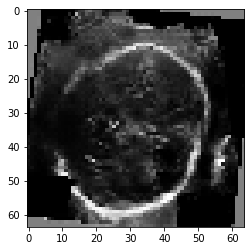

[445/1000] G_loss: 4.35481595993042, D_loss: 0.6208293437957764
[446/1000][0/13]	Loss_D: 0.6367	Loss_G: 3.7059	D(x): 0.6826	D(G(z)): 0.0220 / 0.0340


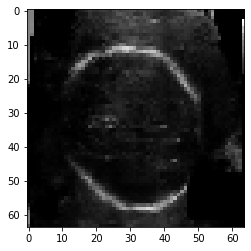

[446/1000] G_loss: 4.1699748039245605, D_loss: 0.5343102812767029
[447/1000][0/13]	Loss_D: 0.4014	Loss_G: 5.0992	D(x): 0.8781	D(G(z)): 0.0193 / 0.0062


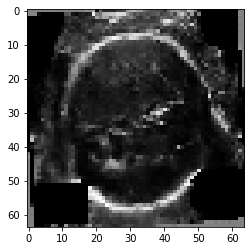

[447/1000] G_loss: 4.220823287963867, D_loss: 0.6611667275428772
[448/1000][0/13]	Loss_D: 0.5174	Loss_G: 3.6271	D(x): 0.8070	D(G(z)): 0.0492 / 0.0291


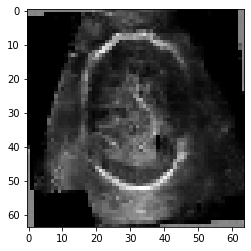

[448/1000] G_loss: 4.1767778396606445, D_loss: 0.5249320864677429
[449/1000][0/13]	Loss_D: 0.6187	Loss_G: 3.3709	D(x): 0.7016	D(G(z)): 0.0294 / 0.0368


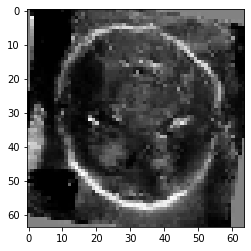

[449/1000] G_loss: 4.036381244659424, D_loss: 0.5099642872810364
Saving checkpoint at epoch :  449
[450/1000][0/13]	Loss_D: 0.6230	Loss_G: 2.4230	D(x): 0.6345	D(G(z)): 0.0141 / 0.1172


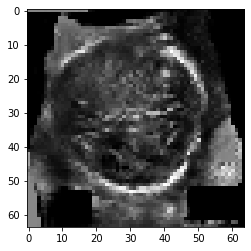

[450/1000] G_loss: 4.098536968231201, D_loss: 0.5461397767066956
[451/1000][0/13]	Loss_D: 0.6816	Loss_G: 5.6158	D(x): 0.9671	D(G(z)): 0.1728 / 0.0025


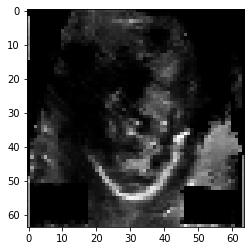

[451/1000] G_loss: 4.140562057495117, D_loss: 0.5491795539855957
[452/1000][0/13]	Loss_D: 0.5323	Loss_G: 5.0638	D(x): 0.9555	D(G(z)): 0.0980 / 0.0049


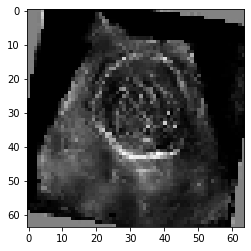

[452/1000] G_loss: 4.11769437789917, D_loss: 0.5021439790725708
[453/1000][0/13]	Loss_D: 0.4879	Loss_G: 5.6128	D(x): 0.9352	D(G(z)): 0.0773 / 0.0035


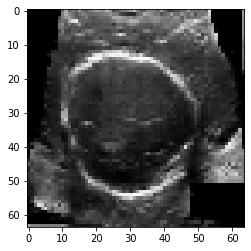

[453/1000] G_loss: 4.203681945800781, D_loss: 0.5375301837921143
[454/1000][0/13]	Loss_D: 0.4803	Loss_G: 4.0969	D(x): 0.8289	D(G(z)): 0.0378 / 0.0181


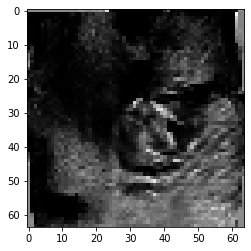

[454/1000] G_loss: 4.218791961669922, D_loss: 0.5369712114334106
Saving checkpoint at epoch :  454
[455/1000][0/13]	Loss_D: 0.5946	Loss_G: 3.6844	D(x): 0.7135	D(G(z)): 0.0231 / 0.0369


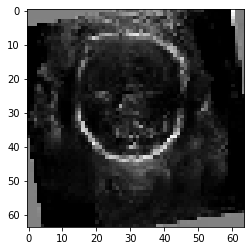

[455/1000] G_loss: 3.885847568511963, D_loss: 0.4991911053657532
[456/1000][0/13]	Loss_D: 0.5287	Loss_G: 4.8252	D(x): 0.9002	D(G(z)): 0.1034 / 0.0092


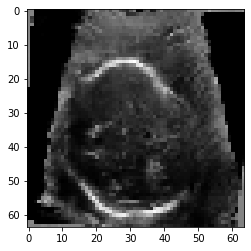

[456/1000] G_loss: 4.160772800445557, D_loss: 0.5260944366455078
[457/1000][0/13]	Loss_D: 0.5489	Loss_G: 3.5425	D(x): 0.8008	D(G(z)): 0.0597 / 0.0397


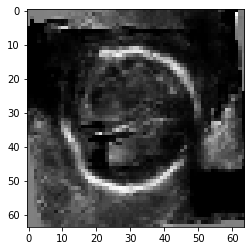

[457/1000] G_loss: 4.110465049743652, D_loss: 0.4948901832103729
[458/1000][0/13]	Loss_D: 0.5119	Loss_G: 4.6003	D(x): 0.8818	D(G(z)): 0.0844 / 0.0102


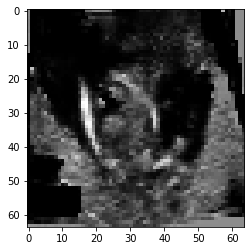

[458/1000] G_loss: 4.152456283569336, D_loss: 0.4791332483291626
[459/1000][0/13]	Loss_D: 0.4826	Loss_G: 4.8433	D(x): 0.8746	D(G(z)): 0.0512 / 0.0079


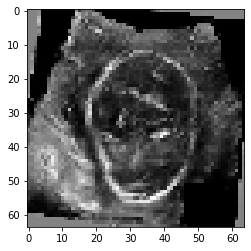

[459/1000] G_loss: 4.169155597686768, D_loss: 0.490450918674469
Saving checkpoint at epoch :  459
[460/1000][0/13]	Loss_D: 0.5188	Loss_G: 5.5033	D(x): 0.9519	D(G(z)): 0.0911 / 0.0030


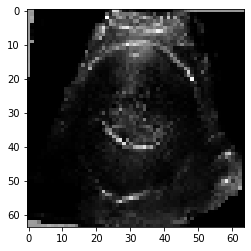

[460/1000] G_loss: 4.321227550506592, D_loss: 0.5090440511703491
[461/1000][0/13]	Loss_D: 0.5040	Loss_G: 3.2993	D(x): 0.7672	D(G(z)): 0.0271 / 0.0406


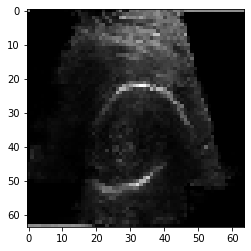

[461/1000] G_loss: 4.08405876159668, D_loss: 0.5017384886741638
[462/1000][0/13]	Loss_D: 0.5187	Loss_G: 4.8901	D(x): 0.9514	D(G(z)): 0.1075 / 0.0063


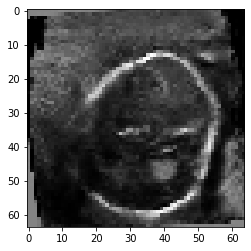

[462/1000] G_loss: 4.304464817047119, D_loss: 0.4967101216316223
[463/1000][0/13]	Loss_D: 0.5853	Loss_G: 3.2894	D(x): 0.7667	D(G(z)): 0.0469 / 0.0491


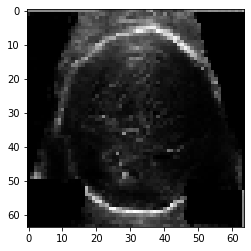

[463/1000] G_loss: 4.308899402618408, D_loss: 0.5155097842216492
[464/1000][0/13]	Loss_D: 0.4798	Loss_G: 4.3223	D(x): 0.8290	D(G(z)): 0.0276 / 0.0137


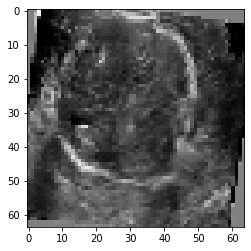

[464/1000] G_loss: 4.084396839141846, D_loss: 0.4588473439216614
Saving checkpoint at epoch :  464
[465/1000][0/13]	Loss_D: 0.4312	Loss_G: 4.8120	D(x): 0.8957	D(G(z)): 0.0454 / 0.0075


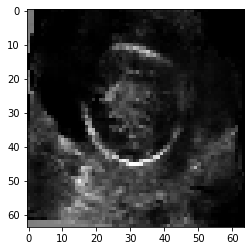

[465/1000] G_loss: 4.308480262756348, D_loss: 0.5185973644256592
[466/1000][0/13]	Loss_D: 0.4838	Loss_G: 3.5173	D(x): 0.8736	D(G(z)): 0.0727 / 0.0303


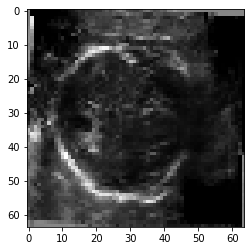

[466/1000] G_loss: 4.271330833435059, D_loss: 0.4905751645565033
[467/1000][0/13]	Loss_D: 0.4399	Loss_G: 4.4982	D(x): 0.8622	D(G(z)): 0.0346 / 0.0115


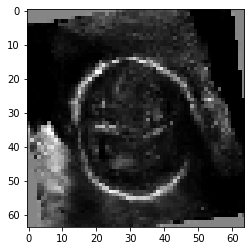

[467/1000] G_loss: 4.152037143707275, D_loss: 0.46786466240882874
[468/1000][0/13]	Loss_D: 0.4096	Loss_G: 3.9100	D(x): 0.8544	D(G(z)): 0.0175 / 0.0216


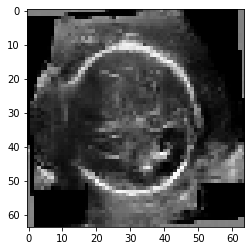

[468/1000] G_loss: 4.502681255340576, D_loss: 0.5509821176528931
[469/1000][0/13]	Loss_D: 0.5138	Loss_G: 4.6022	D(x): 0.8665	D(G(z)): 0.0862 / 0.0124


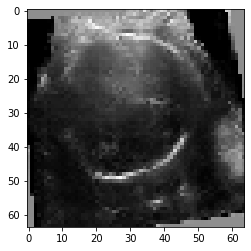

[469/1000] G_loss: 4.200449466705322, D_loss: 0.4723021686077118
Saving checkpoint at epoch :  469
[470/1000][0/13]	Loss_D: 0.4488	Loss_G: 3.3670	D(x): 0.8103	D(G(z)): 0.0288 / 0.0415


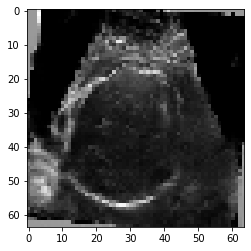

[470/1000] G_loss: 4.174302577972412, D_loss: 0.5123719573020935
[471/1000][0/13]	Loss_D: 0.4628	Loss_G: 3.8255	D(x): 0.8339	D(G(z)): 0.0265 / 0.0274


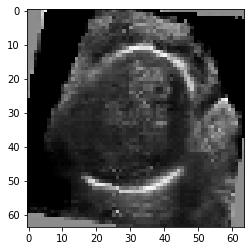

[471/1000] G_loss: 4.265998363494873, D_loss: 0.47090592980384827
[472/1000][0/13]	Loss_D: 0.5132	Loss_G: 3.8803	D(x): 0.7650	D(G(z)): 0.0137 / 0.0356


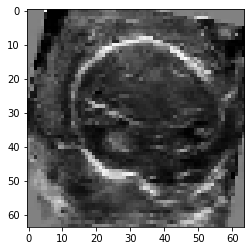

[472/1000] G_loss: 4.280096054077148, D_loss: 0.5103586912155151
[473/1000][0/13]	Loss_D: 0.6235	Loss_G: 2.5034	D(x): 0.6739	D(G(z)): 0.0216 / 0.1207


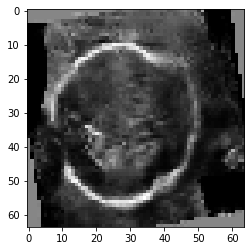

[473/1000] G_loss: 4.3493757247924805, D_loss: 0.5429036021232605
[474/1000][0/13]	Loss_D: 0.4603	Loss_G: 3.6563	D(x): 0.8409	D(G(z)): 0.0432 / 0.0288


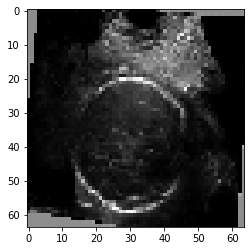

[474/1000] G_loss: 4.265660762786865, D_loss: 0.4666622281074524
Saving checkpoint at epoch :  474
[475/1000][0/13]	Loss_D: 0.5076	Loss_G: 3.7380	D(x): 0.8219	D(G(z)): 0.0241 / 0.0282


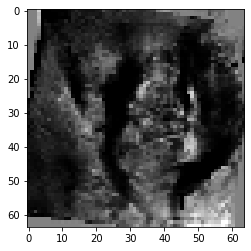

[475/1000] G_loss: 4.335710525512695, D_loss: 0.5892716646194458
[476/1000][0/13]	Loss_D: 0.4771	Loss_G: 4.5046	D(x): 0.9003	D(G(z)): 0.0710 / 0.0101


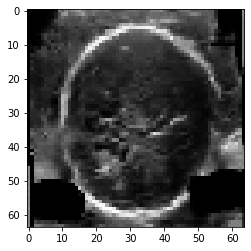

[476/1000] G_loss: 4.154119491577148, D_loss: 0.5027763843536377
[477/1000][0/13]	Loss_D: 0.4546	Loss_G: 5.2957	D(x): 0.9062	D(G(z)): 0.0611 / 0.0042


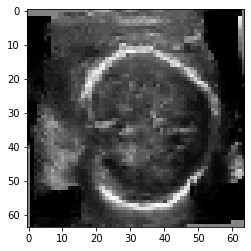

[477/1000] G_loss: 4.237320899963379, D_loss: 0.468671590089798
[478/1000][0/13]	Loss_D: 0.5298	Loss_G: 4.8931	D(x): 0.9034	D(G(z)): 0.1001 / 0.0066


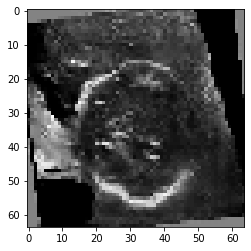

[478/1000] G_loss: 4.394754409790039, D_loss: 0.5238553285598755
[479/1000][0/13]	Loss_D: 0.4773	Loss_G: 4.5114	D(x): 0.9441	D(G(z)): 0.0625 / 0.0100


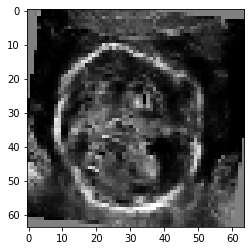

[479/1000] G_loss: 4.226467609405518, D_loss: 0.5150246024131775
Saving checkpoint at epoch :  479
[480/1000][0/13]	Loss_D: 1.2340	Loss_G: 9.3895	D(x): 0.9904	D(G(z)): 0.3706 / 0.0002


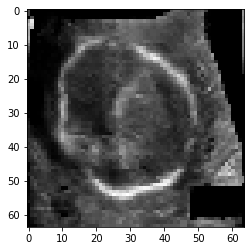

[480/1000] G_loss: 4.817986488342285, D_loss: 0.714758038520813
[481/1000][0/13]	Loss_D: 0.5143	Loss_G: 3.9289	D(x): 0.8227	D(G(z)): 0.0508 / 0.0254


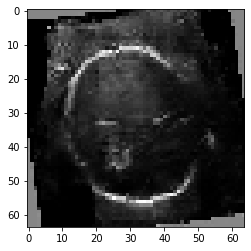

[481/1000] G_loss: 4.116326808929443, D_loss: 0.5362818241119385
[482/1000][0/13]	Loss_D: 0.5107	Loss_G: 5.1910	D(x): 0.9454	D(G(z)): 0.0992 / 0.0055


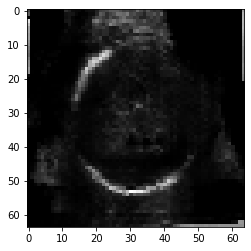

[482/1000] G_loss: 4.354561805725098, D_loss: 0.49228736758232117
[483/1000][0/13]	Loss_D: 0.4782	Loss_G: 3.9781	D(x): 0.8647	D(G(z)): 0.0558 / 0.0198


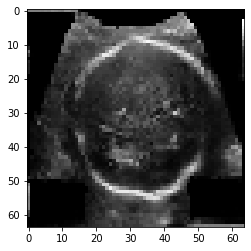

[483/1000] G_loss: 4.102157115936279, D_loss: 0.575523316860199
[484/1000][0/13]	Loss_D: 0.7754	Loss_G: 6.2444	D(x): 0.9811	D(G(z)): 0.2100 / 0.0014


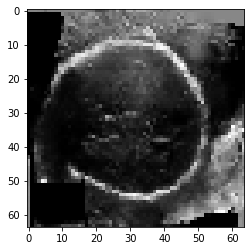

[484/1000] G_loss: 4.485986709594727, D_loss: 0.5508491396903992
Saving checkpoint at epoch :  484
[485/1000][0/13]	Loss_D: 0.5911	Loss_G: 4.1731	D(x): 0.7932	D(G(z)): 0.0866 / 0.0174


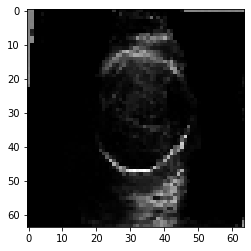

[485/1000] G_loss: 4.628806114196777, D_loss: 1.06850004196167
[486/1000][0/13]	Loss_D: 1.5740	Loss_G: 9.3657	D(x): 0.9603	D(G(z)): 0.4715 / 0.0007


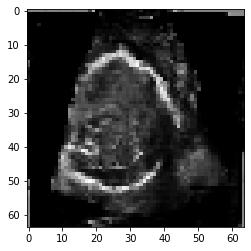

[486/1000] G_loss: 4.412396430969238, D_loss: 1.7297827005386353
[487/1000][0/13]	Loss_D: 1.3859	Loss_G: 5.2403	D(x): 0.9092	D(G(z)): 0.3788 / 0.0122


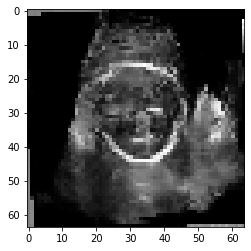

[487/1000] G_loss: 4.119414329528809, D_loss: 0.9013081192970276
[488/1000][0/13]	Loss_D: 0.7975	Loss_G: 3.5355	D(x): 0.7793	D(G(z)): 0.1878 / 0.0501


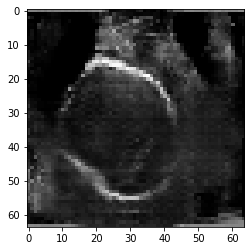

[488/1000] G_loss: 3.9632365703582764, D_loss: 0.657461404800415
[489/1000][0/13]	Loss_D: 0.7990	Loss_G: 3.4319	D(x): 0.5862	D(G(z)): 0.0178 / 0.0535


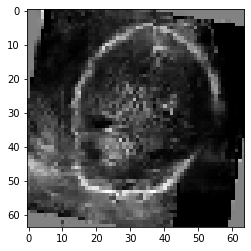

[489/1000] G_loss: 3.6690783500671387, D_loss: 0.609042227268219
Saving checkpoint at epoch :  489
[490/1000][0/13]	Loss_D: 1.1742	Loss_G: 6.6444	D(x): 0.9721	D(G(z)): 0.4119 / 0.0019


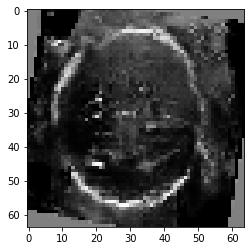

[490/1000] G_loss: 3.974395275115967, D_loss: 0.6806656718254089
[491/1000][0/13]	Loss_D: 0.6062	Loss_G: 4.4893	D(x): 0.8991	D(G(z)): 0.1547 / 0.0116


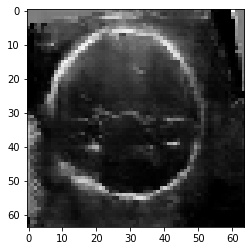

[491/1000] G_loss: 3.945035696029663, D_loss: 0.6088390946388245
[492/1000][0/13]	Loss_D: 0.4700	Loss_G: 3.7311	D(x): 0.8221	D(G(z)): 0.0414 / 0.0264


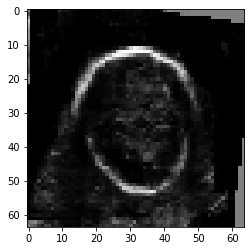

[492/1000] G_loss: 3.7668206691741943, D_loss: 0.5334317684173584
[493/1000][0/13]	Loss_D: 0.5370	Loss_G: 4.4748	D(x): 0.8887	D(G(z)): 0.1184 / 0.0116


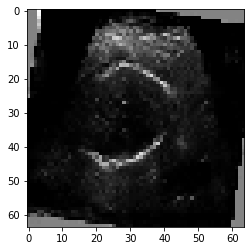

[493/1000] G_loss: 3.8869271278381348, D_loss: 0.5302832126617432
[494/1000][0/13]	Loss_D: 0.5646	Loss_G: 4.0562	D(x): 0.8294	D(G(z)): 0.1314 / 0.0169


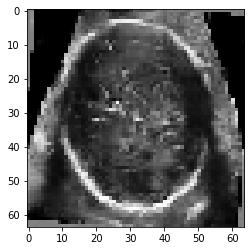

[494/1000] G_loss: 3.7911386489868164, D_loss: 0.5288981795310974
Saving checkpoint at epoch :  494
[495/1000][0/13]	Loss_D: 0.5367	Loss_G: 4.0384	D(x): 0.8729	D(G(z)): 0.1045 / 0.0180


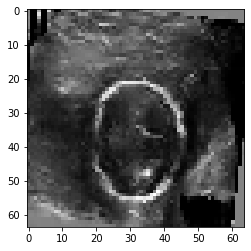

[495/1000] G_loss: 3.8898813724517822, D_loss: 0.5103978514671326
[496/1000][0/13]	Loss_D: 0.4995	Loss_G: 3.2548	D(x): 0.7771	D(G(z)): 0.0314 / 0.0371


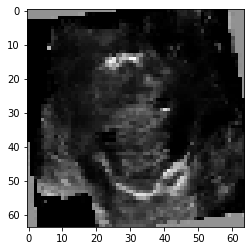

[496/1000] G_loss: 3.8661394119262695, D_loss: 0.5083886981010437
[497/1000][0/13]	Loss_D: 0.4599	Loss_G: 3.3531	D(x): 0.8147	D(G(z)): 0.0332 / 0.0413


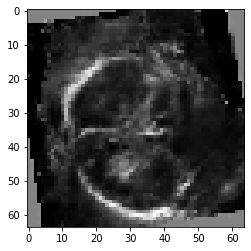

[497/1000] G_loss: 3.900512218475342, D_loss: 0.49173226952552795
[498/1000][0/13]	Loss_D: 0.4476	Loss_G: 3.9193	D(x): 0.8360	D(G(z)): 0.0461 / 0.0209


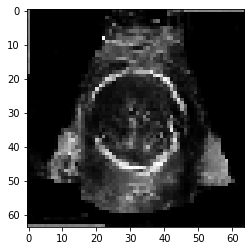

[498/1000] G_loss: 3.899475574493408, D_loss: 0.4664750397205353
[499/1000][0/13]	Loss_D: 0.4858	Loss_G: 2.8555	D(x): 0.7653	D(G(z)): 0.0314 / 0.0702


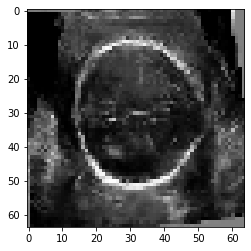

[499/1000] G_loss: 3.7643964290618896, D_loss: 0.4813016355037689
Saving checkpoint at epoch :  499
Saving checkpoint at epoch :  499
[500/1000][0/13]	Loss_D: 0.4332	Loss_G: 4.4834	D(x): 0.8874	D(G(z)): 0.0659 / 0.0115


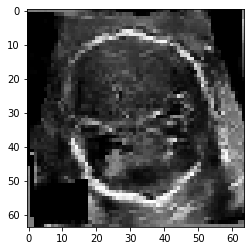

[500/1000] G_loss: 3.797933340072632, D_loss: 0.4840272068977356
[501/1000][0/13]	Loss_D: 0.4781	Loss_G: 4.2375	D(x): 0.9368	D(G(z)): 0.0850 / 0.0158


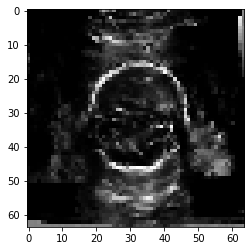

[501/1000] G_loss: 4.0310797691345215, D_loss: 0.500555157661438
[502/1000][0/13]	Loss_D: 0.4808	Loss_G: 4.0858	D(x): 0.8804	D(G(z)): 0.0690 / 0.0162


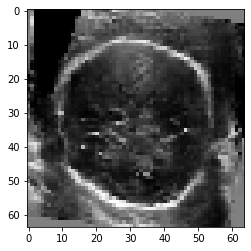

[502/1000] G_loss: 4.169543743133545, D_loss: 0.4659953713417053
[503/1000][0/13]	Loss_D: 0.4749	Loss_G: 3.0614	D(x): 0.7488	D(G(z)): 0.0265 / 0.0575


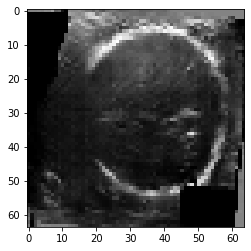

[503/1000] G_loss: 3.9473376274108887, D_loss: 0.494576632976532
[504/1000][0/13]	Loss_D: 0.6159	Loss_G: 5.1033	D(x): 0.9138	D(G(z)): 0.1497 / 0.0072


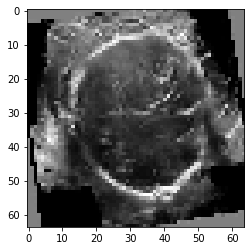

[504/1000] G_loss: 3.9444143772125244, D_loss: 0.46829846501350403
Saving checkpoint at epoch :  504
[505/1000][0/13]	Loss_D: 0.7424	Loss_G: 6.1859	D(x): 0.9737	D(G(z)): 0.2145 / 0.0020


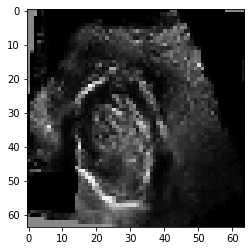

[505/1000] G_loss: 4.544384002685547, D_loss: 0.5208346843719482
[506/1000][0/13]	Loss_D: 0.6676	Loss_G: 4.5758	D(x): 0.6429	D(G(z)): 0.0062 / 0.0220


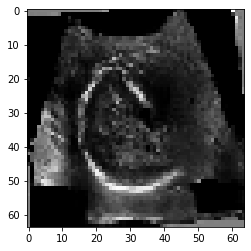

[506/1000] G_loss: 4.328972339630127, D_loss: 0.5952457785606384
[507/1000][0/13]	Loss_D: 0.4719	Loss_G: 4.3530	D(x): 0.8989	D(G(z)): 0.0659 / 0.0114


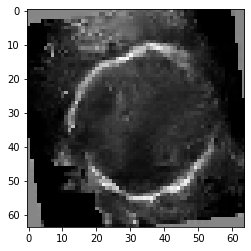

[507/1000] G_loss: 4.016668796539307, D_loss: 0.5081563591957092
[508/1000][0/13]	Loss_D: 0.4908	Loss_G: 4.0962	D(x): 0.8054	D(G(z)): 0.0565 / 0.0233


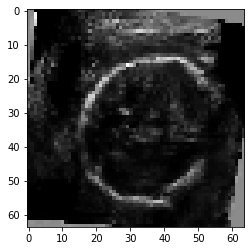

[508/1000] G_loss: 4.267634868621826, D_loss: 0.5181615352630615
[509/1000][0/13]	Loss_D: 0.4627	Loss_G: 5.4074	D(x): 0.7732	D(G(z)): 0.0099 / 0.0062


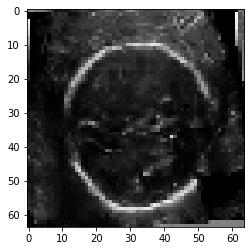

[509/1000] G_loss: 4.182675838470459, D_loss: 0.5323038697242737
Saving checkpoint at epoch :  509
[510/1000][0/13]	Loss_D: 0.7928	Loss_G: 6.1384	D(x): 0.9612	D(G(z)): 0.2410 / 0.0027


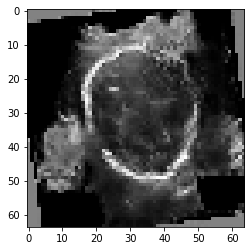

[510/1000] G_loss: 4.114070415496826, D_loss: 0.5289570093154907
[511/1000][0/13]	Loss_D: 0.4903	Loss_G: 4.8429	D(x): 0.9257	D(G(z)): 0.0942 / 0.0068


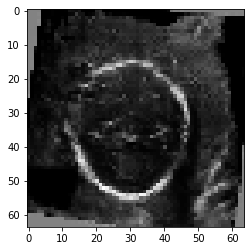

[511/1000] G_loss: 4.103614807128906, D_loss: 0.5168367028236389
[512/1000][0/13]	Loss_D: 0.4469	Loss_G: 5.5472	D(x): 0.8955	D(G(z)): 0.0468 / 0.0039


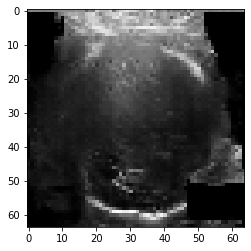

[512/1000] G_loss: 4.055979251861572, D_loss: 0.48877328634262085
[513/1000][0/13]	Loss_D: 0.5043	Loss_G: 3.7867	D(x): 0.8273	D(G(z)): 0.0522 / 0.0231


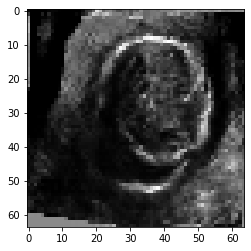

[513/1000] G_loss: 4.002246379852295, D_loss: 0.47486671805381775
[514/1000][0/13]	Loss_D: 0.4721	Loss_G: 4.1653	D(x): 0.8507	D(G(z)): 0.0568 / 0.0218


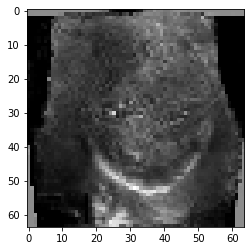

[514/1000] G_loss: 4.031583309173584, D_loss: 0.4595262408256531
Saving checkpoint at epoch :  514
[515/1000][0/13]	Loss_D: 0.4227	Loss_G: 4.9633	D(x): 0.8918	D(G(z)): 0.0418 / 0.0069


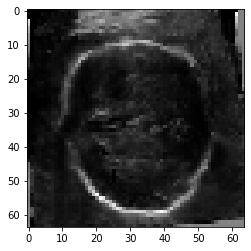

[515/1000] G_loss: 4.082666873931885, D_loss: 0.5317662954330444
[516/1000][0/13]	Loss_D: 0.4611	Loss_G: 4.7948	D(x): 0.9026	D(G(z)): 0.0673 / 0.0077


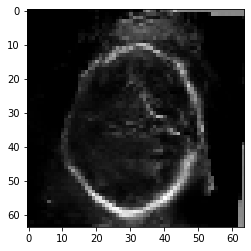

[516/1000] G_loss: 4.153547763824463, D_loss: 0.4549390971660614
[517/1000][0/13]	Loss_D: 0.4688	Loss_G: 3.9724	D(x): 0.8308	D(G(z)): 0.0610 / 0.0194


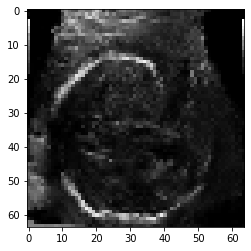

[517/1000] G_loss: 4.157125949859619, D_loss: 0.46512076258659363
[518/1000][0/13]	Loss_D: 0.4856	Loss_G: 3.6446	D(x): 0.7815	D(G(z)): 0.0239 / 0.0318


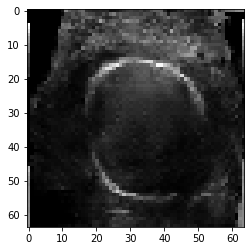

[518/1000] G_loss: 4.067215919494629, D_loss: 0.45151984691619873
[519/1000][0/13]	Loss_D: 0.6068	Loss_G: 5.9835	D(x): 0.9631	D(G(z)): 0.1596 / 0.0020


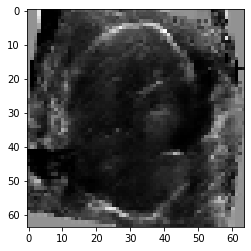

[519/1000] G_loss: 4.401636600494385, D_loss: 0.5325352549552917
Saving checkpoint at epoch :  519
[520/1000][0/13]	Loss_D: 0.4754	Loss_G: 5.7484	D(x): 0.8535	D(G(z)): 0.0357 / 0.0040


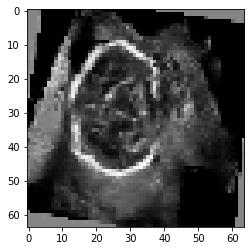

[520/1000] G_loss: 4.4580817222595215, D_loss: 0.5852985978126526
[521/1000][0/13]	Loss_D: 0.4870	Loss_G: 4.2789	D(x): 0.8158	D(G(z)): 0.0389 / 0.0185


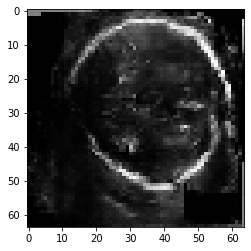

[521/1000] G_loss: 4.344813346862793, D_loss: 0.5077115297317505
[522/1000][0/13]	Loss_D: 0.4672	Loss_G: 3.5812	D(x): 0.8239	D(G(z)): 0.0295 / 0.0334


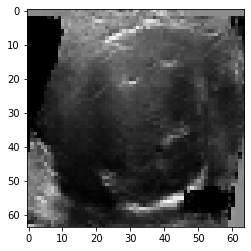

[522/1000] G_loss: 3.965360164642334, D_loss: 0.4743790924549103
[523/1000][0/13]	Loss_D: 0.4964	Loss_G: 4.2501	D(x): 0.9402	D(G(z)): 0.0930 / 0.0133


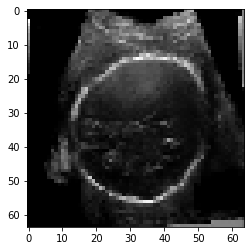

[523/1000] G_loss: 4.099486827850342, D_loss: 0.5191068053245544
[524/1000][0/13]	Loss_D: 0.5175	Loss_G: 5.0632	D(x): 0.9652	D(G(z)): 0.0707 / 0.0080


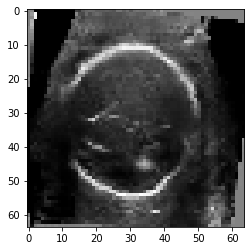

[524/1000] G_loss: 4.292248249053955, D_loss: 0.5398225784301758
Saving checkpoint at epoch :  524
[525/1000][0/13]	Loss_D: 0.4456	Loss_G: 3.6255	D(x): 0.8249	D(G(z)): 0.0323 / 0.0329


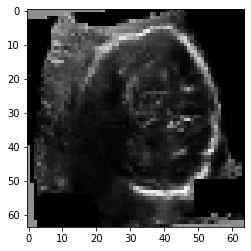

[525/1000] G_loss: 4.060748100280762, D_loss: 0.4505687952041626
[526/1000][0/13]	Loss_D: 0.4228	Loss_G: 4.3355	D(x): 0.8970	D(G(z)): 0.0450 / 0.0136


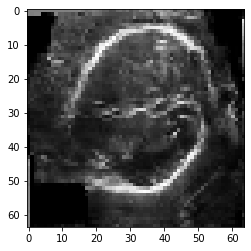

[526/1000] G_loss: 4.315133571624756, D_loss: 0.49691736698150635
[527/1000][0/13]	Loss_D: 0.5089	Loss_G: 3.1593	D(x): 0.7384	D(G(z)): 0.0137 / 0.0538


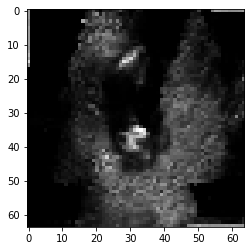

[527/1000] G_loss: 4.2033467292785645, D_loss: 0.47917094826698303
[528/1000][0/13]	Loss_D: 0.4757	Loss_G: 5.4863	D(x): 0.9155	D(G(z)): 0.0692 / 0.0042


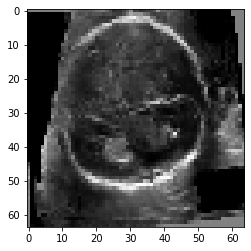

[528/1000] G_loss: 4.465075492858887, D_loss: 0.5724705457687378
[529/1000][0/13]	Loss_D: 0.5505	Loss_G: 3.5252	D(x): 0.7168	D(G(z)): 0.0151 / 0.0442


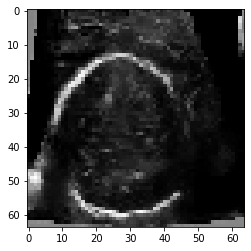

[529/1000] G_loss: 3.9068503379821777, D_loss: 0.47225409746170044
Saving checkpoint at epoch :  529
[530/1000][0/13]	Loss_D: 0.8670	Loss_G: 7.2143	D(x): 0.9682	D(G(z)): 0.2579 / 0.0007


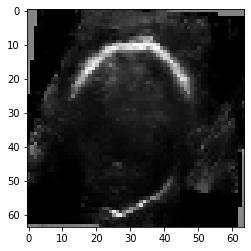

[530/1000] G_loss: 4.418334007263184, D_loss: 0.5543518662452698
[531/1000][0/13]	Loss_D: 0.5163	Loss_G: 4.1195	D(x): 0.9325	D(G(z)): 0.0847 / 0.0148


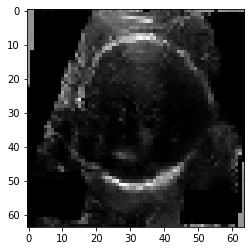

[531/1000] G_loss: 4.075053691864014, D_loss: 0.4930414855480194
[532/1000][0/13]	Loss_D: 0.4899	Loss_G: 5.5594	D(x): 0.9345	D(G(z)): 0.0803 / 0.0039


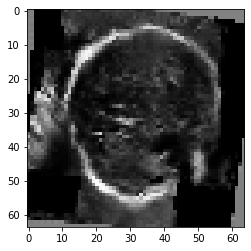

[532/1000] G_loss: 4.5794758796691895, D_loss: 0.5660825967788696
[533/1000][0/13]	Loss_D: 0.5655	Loss_G: 3.1487	D(x): 0.7405	D(G(z)): 0.0242 / 0.1186


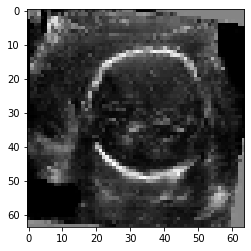

[533/1000] G_loss: 4.215850353240967, D_loss: 0.5631871819496155
[534/1000][0/13]	Loss_D: 0.4653	Loss_G: 4.1038	D(x): 0.8412	D(G(z)): 0.0339 / 0.0219


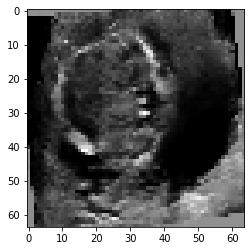

[534/1000] G_loss: 4.246311664581299, D_loss: 0.5084030032157898
Saving checkpoint at epoch :  534
[535/1000][0/13]	Loss_D: 0.4517	Loss_G: 4.0767	D(x): 0.8058	D(G(z)): 0.0232 / 0.0208


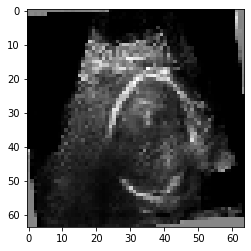

[535/1000] G_loss: 4.059314250946045, D_loss: 0.479812890291214
[536/1000][0/13]	Loss_D: 0.4973	Loss_G: 4.3408	D(x): 0.9310	D(G(z)): 0.0726 / 0.0113


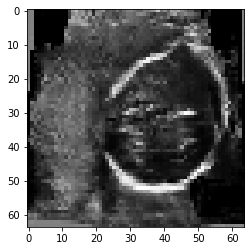

[536/1000] G_loss: 4.278125286102295, D_loss: 0.5110280513763428
[537/1000][0/13]	Loss_D: 0.5825	Loss_G: 5.2000	D(x): 0.9692	D(G(z)): 0.1106 / 0.0050


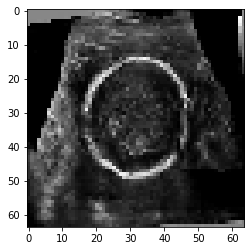

[537/1000] G_loss: 4.278417587280273, D_loss: 0.5062774419784546
[538/1000][0/13]	Loss_D: 0.5269	Loss_G: 5.0553	D(x): 0.9316	D(G(z)): 0.1137 / 0.0055


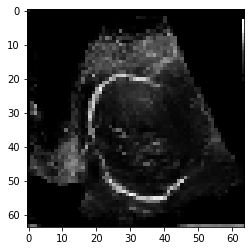

[538/1000] G_loss: 4.4063334465026855, D_loss: 0.4814964532852173
[539/1000][0/13]	Loss_D: 0.4133	Loss_G: 5.5458	D(x): 0.8844	D(G(z)): 0.0198 / 0.0040


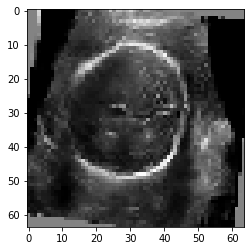

[539/1000] G_loss: 4.650960922241211, D_loss: 0.6291618347167969
Saving checkpoint at epoch :  539
[540/1000][0/13]	Loss_D: 0.5208	Loss_G: 4.0187	D(x): 0.8515	D(G(z)): 0.0743 / 0.0167


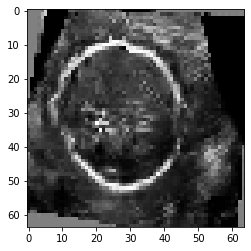

[540/1000] G_loss: 4.058879375457764, D_loss: 0.4893389344215393
[541/1000][0/13]	Loss_D: 0.5170	Loss_G: 2.8574	D(x): 0.7339	D(G(z)): 0.0440 / 0.0861


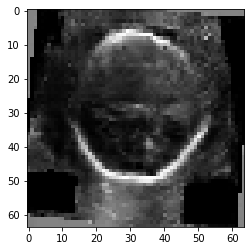

[541/1000] G_loss: 4.22632360458374, D_loss: 0.544655442237854
[542/1000][0/13]	Loss_D: 0.4724	Loss_G: 4.0042	D(x): 0.9008	D(G(z)): 0.0685 / 0.0183


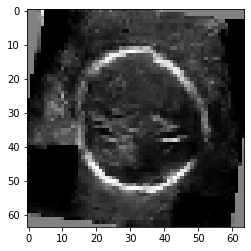

[542/1000] G_loss: 4.312548637390137, D_loss: 0.513064980506897
[543/1000][0/13]	Loss_D: 0.4649	Loss_G: 4.5436	D(x): 0.8588	D(G(z)): 0.0511 / 0.0150


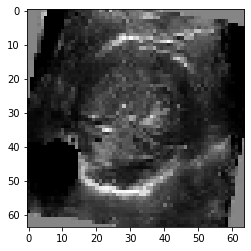

[543/1000] G_loss: 3.983783483505249, D_loss: 0.46657684445381165
[544/1000][0/13]	Loss_D: 0.5441	Loss_G: 5.4730	D(x): 0.9466	D(G(z)): 0.1256 / 0.0051


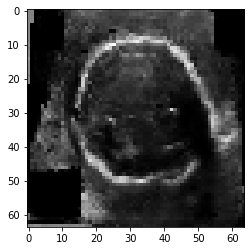

[544/1000] G_loss: 4.196959495544434, D_loss: 0.47670242190361023
Saving checkpoint at epoch :  544
[545/1000][0/13]	Loss_D: 0.7422	Loss_G: 6.5154	D(x): 0.9548	D(G(z)): 0.2107 / 0.0021


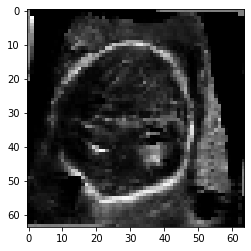

[545/1000] G_loss: 4.312870979309082, D_loss: 0.5267861485481262
[546/1000][0/13]	Loss_D: 0.4900	Loss_G: 4.5454	D(x): 0.8990	D(G(z)): 0.0825 / 0.0098


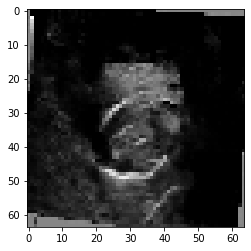

[546/1000] G_loss: 4.206076145172119, D_loss: 0.4693308174610138
[547/1000][0/13]	Loss_D: 0.4470	Loss_G: 4.9072	D(x): 0.9024	D(G(z)): 0.0365 / 0.0077


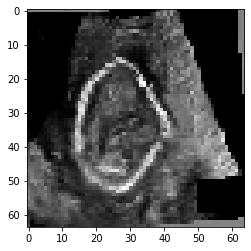

[547/1000] G_loss: 4.007286548614502, D_loss: 0.5017374753952026
[548/1000][0/13]	Loss_D: 1.0207	Loss_G: 7.6183	D(x): 0.9847	D(G(z)): 0.3117 / 0.0005


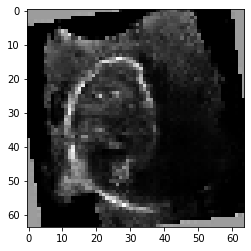

[548/1000] G_loss: 4.641563892364502, D_loss: 0.5420969724655151
[549/1000][0/13]	Loss_D: 0.5140	Loss_G: 4.2091	D(x): 0.8582	D(G(z)): 0.0733 / 0.0174


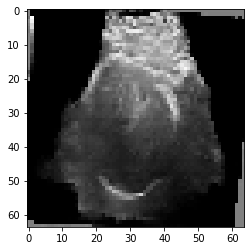

[549/1000] G_loss: 4.2889580726623535, D_loss: 0.4905696511268616
Saving checkpoint at epoch :  549
[550/1000][0/13]	Loss_D: 0.4944	Loss_G: 4.1087	D(x): 0.7980	D(G(z)): 0.0379 / 0.0230


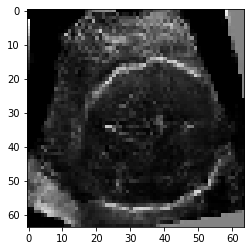

[550/1000] G_loss: 4.363112926483154, D_loss: 0.4728585481643677
[551/1000][0/13]	Loss_D: 0.6402	Loss_G: 2.3262	D(x): 0.6595	D(G(z)): 0.0114 / 0.1461


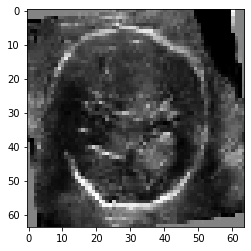

[551/1000] G_loss: 4.288169860839844, D_loss: 0.577394425868988
[552/1000][0/13]	Loss_D: 0.4973	Loss_G: 3.7809	D(x): 0.7712	D(G(z)): 0.0237 / 0.0356


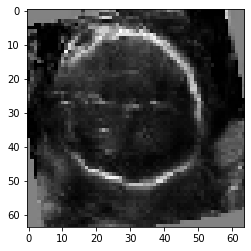

[552/1000] G_loss: 4.103906631469727, D_loss: 0.4742355942726135
[553/1000][0/13]	Loss_D: 0.4804	Loss_G: 4.6093	D(x): 0.8964	D(G(z)): 0.0592 / 0.0087


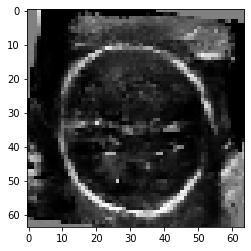

[553/1000] G_loss: 4.0042219161987305, D_loss: 0.46230271458625793
[554/1000][0/13]	Loss_D: 0.4148	Loss_G: 4.6290	D(x): 0.8916	D(G(z)): 0.0273 / 0.0094


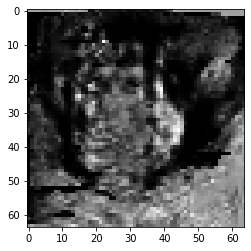

[554/1000] G_loss: 4.261453628540039, D_loss: 0.46428239345550537
Saving checkpoint at epoch :  554
[555/1000][0/13]	Loss_D: 0.4787	Loss_G: 3.7949	D(x): 0.7898	D(G(z)): 0.0248 / 0.0348


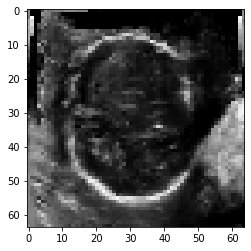

[555/1000] G_loss: 4.046135902404785, D_loss: 0.4635000228881836
[556/1000][0/13]	Loss_D: 0.4494	Loss_G: 4.1458	D(x): 0.8721	D(G(z)): 0.0637 / 0.0160


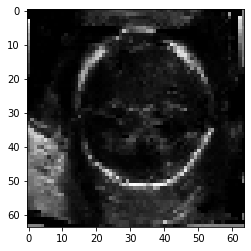

[556/1000] G_loss: 4.204650402069092, D_loss: 0.4588486850261688
[557/1000][0/13]	Loss_D: 0.4501	Loss_G: 5.0382	D(x): 0.8892	D(G(z)): 0.0484 / 0.0073


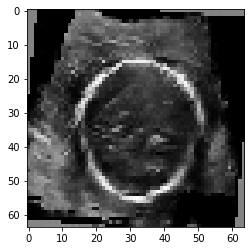

[557/1000] G_loss: 4.381587028503418, D_loss: 0.5171252489089966
[558/1000][0/13]	Loss_D: 0.5216	Loss_G: 5.2233	D(x): 0.9568	D(G(z)): 0.0854 / 0.0049


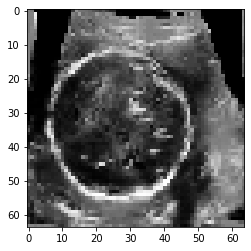

[558/1000] G_loss: 4.262059211730957, D_loss: 0.49742192029953003
[559/1000][0/13]	Loss_D: 0.5726	Loss_G: 4.9377	D(x): 0.9664	D(G(z)): 0.0974 / 0.0060


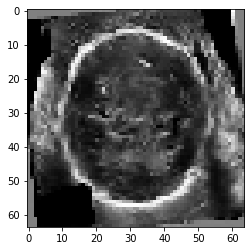

[559/1000] G_loss: 4.304415702819824, D_loss: 0.4961116909980774
Saving checkpoint at epoch :  559
[560/1000][0/13]	Loss_D: 0.4386	Loss_G: 4.0771	D(x): 0.8252	D(G(z)): 0.0187 / 0.0274


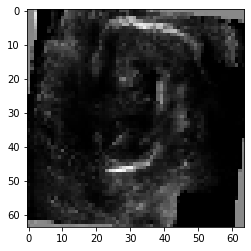

[560/1000] G_loss: 4.3108673095703125, D_loss: 0.46521836519241333
[561/1000][0/13]	Loss_D: 0.5366	Loss_G: 4.9320	D(x): 0.9508	D(G(z)): 0.0982 / 0.0074


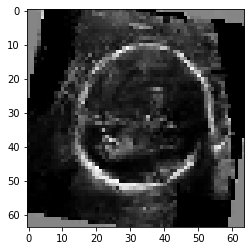

[561/1000] G_loss: 4.449480056762695, D_loss: 0.5140939354896545
[562/1000][0/13]	Loss_D: 0.6505	Loss_G: 5.5232	D(x): 0.9308	D(G(z)): 0.1085 / 0.0055


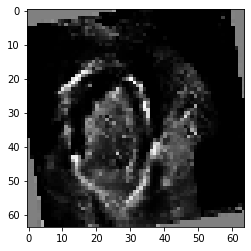

[562/1000] G_loss: 4.520263195037842, D_loss: 0.5116158127784729
[563/1000][0/13]	Loss_D: 0.4337	Loss_G: 5.4308	D(x): 0.8735	D(G(z)): 0.0415 / 0.0049


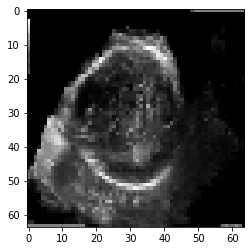

[563/1000] G_loss: 4.382896900177002, D_loss: 0.5532616376876831
[564/1000][0/13]	Loss_D: 0.4146	Loss_G: 5.4170	D(x): 0.9243	D(G(z)): 0.0404 / 0.0050


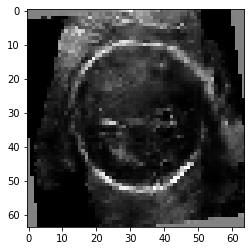

[564/1000] G_loss: 4.264194011688232, D_loss: 0.4565865695476532
Saving checkpoint at epoch :  564
[565/1000][0/13]	Loss_D: 0.5145	Loss_G: 5.3489	D(x): 0.9208	D(G(z)): 0.0719 / 0.0048


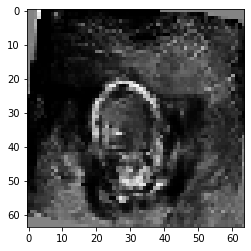

[565/1000] G_loss: 4.290712833404541, D_loss: 0.5240026712417603
[566/1000][0/13]	Loss_D: 0.4473	Loss_G: 5.1006	D(x): 0.8512	D(G(z)): 0.0421 / 0.0082


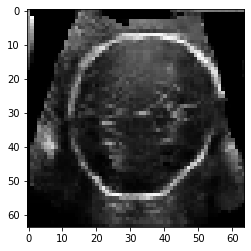

[566/1000] G_loss: 4.432076454162598, D_loss: 0.5351929664611816
[567/1000][0/13]	Loss_D: 0.5432	Loss_G: 4.6512	D(x): 0.7348	D(G(z)): 0.0095 / 0.0195


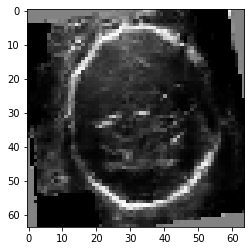

[567/1000] G_loss: 4.274064540863037, D_loss: 0.48196175694465637
[568/1000][0/13]	Loss_D: 0.4726	Loss_G: 4.7478	D(x): 0.8494	D(G(z)): 0.0281 / 0.0104


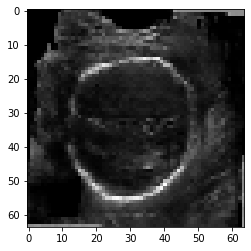

[568/1000] G_loss: 4.1464667320251465, D_loss: 0.4826216399669647
[569/1000][0/13]	Loss_D: 0.4270	Loss_G: 4.3492	D(x): 0.8861	D(G(z)): 0.0380 / 0.0156


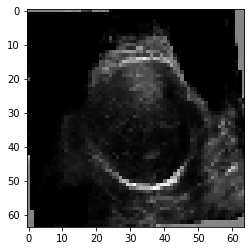

[569/1000] G_loss: 4.419500827789307, D_loss: 0.5001753568649292
Saving checkpoint at epoch :  569
[570/1000][0/13]	Loss_D: 0.4545	Loss_G: 4.0739	D(x): 0.8319	D(G(z)): 0.0369 / 0.0197


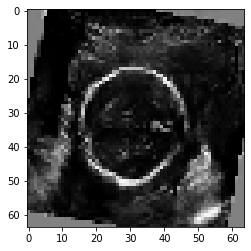

[570/1000] G_loss: 4.3878703117370605, D_loss: 0.5362530946731567
[571/1000][0/13]	Loss_D: 0.4494	Loss_G: 5.3314	D(x): 0.8402	D(G(z)): 0.0227 / 0.0062


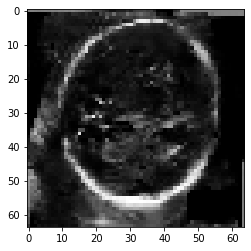

[571/1000] G_loss: 4.563865661621094, D_loss: 0.6048308610916138
[572/1000][0/13]	Loss_D: 0.5520	Loss_G: 3.4949	D(x): 0.7742	D(G(z)): 0.0363 / 0.0405


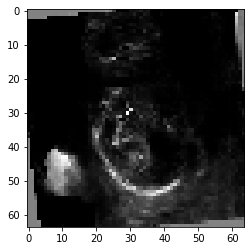

[572/1000] G_loss: 4.351312160491943, D_loss: 0.5805027484893799
[573/1000][0/13]	Loss_D: 0.9828	Loss_G: 7.4476	D(x): 0.9831	D(G(z)): 0.2769 / 0.0015


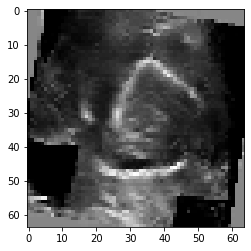

[573/1000] G_loss: 4.718025207519531, D_loss: 0.5903753042221069
[574/1000][0/13]	Loss_D: 0.6286	Loss_G: 2.2992	D(x): 0.6683	D(G(z)): 0.0204 / 0.1787


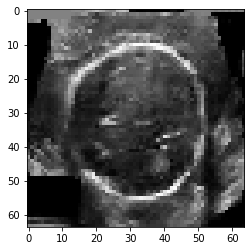

[574/1000] G_loss: 4.181118965148926, D_loss: 0.5410609841346741
Saving checkpoint at epoch :  574
[575/1000][0/13]	Loss_D: 0.5881	Loss_G: 5.3719	D(x): 0.9425	D(G(z)): 0.1411 / 0.0037


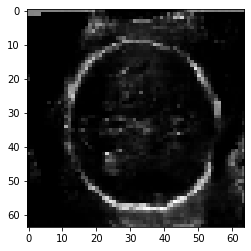

[575/1000] G_loss: 4.5174455642700195, D_loss: 0.5479937195777893
[576/1000][0/13]	Loss_D: 0.4322	Loss_G: 4.2676	D(x): 0.8524	D(G(z)): 0.0336 / 0.0192


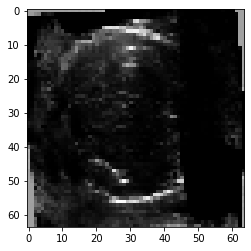

[576/1000] G_loss: 4.237929821014404, D_loss: 0.49258285760879517
[577/1000][0/13]	Loss_D: 0.4859	Loss_G: 4.1100	D(x): 0.8189	D(G(z)): 0.0416 / 0.0210


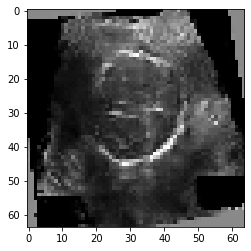

[577/1000] G_loss: 4.132047653198242, D_loss: 0.47722136974334717
[578/1000][0/13]	Loss_D: 1.2876	Loss_G: 8.7243	D(x): 0.9879	D(G(z)): 0.4108 / 0.0003


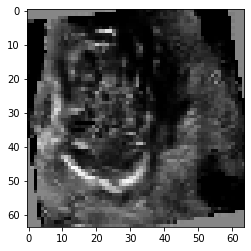

[578/1000] G_loss: 5.232187747955322, D_loss: 2.2927916049957275
[579/1000][0/13]	Loss_D: 2.1659	Loss_G: 1.6804	D(x): 0.3633	D(G(z)): 0.1281 / 0.4410


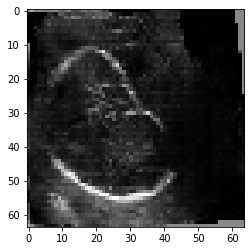

[579/1000] G_loss: 4.041354656219482, D_loss: 1.338283658027649
Saving checkpoint at epoch :  579
[580/1000][0/13]	Loss_D: 0.8535	Loss_G: 4.4405	D(x): 0.7949	D(G(z)): 0.2290 / 0.0209


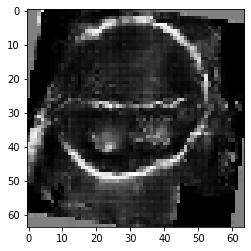

[580/1000] G_loss: 4.0128889083862305, D_loss: 0.8005561232566833
[581/1000][0/13]	Loss_D: 0.9253	Loss_G: 6.4187	D(x): 0.8754	D(G(z)): 0.2958 / 0.0020


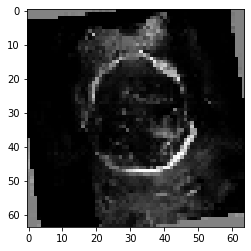

[581/1000] G_loss: 4.013365745544434, D_loss: 0.6817585825920105
[582/1000][0/13]	Loss_D: 0.5926	Loss_G: 4.2471	D(x): 0.8877	D(G(z)): 0.1468 / 0.0129


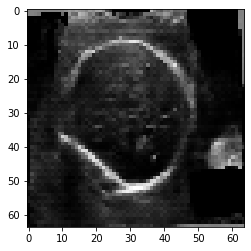

[582/1000] G_loss: 3.9477522373199463, D_loss: 0.6511996388435364
[583/1000][0/13]	Loss_D: 0.6925	Loss_G: 3.9018	D(x): 0.6586	D(G(z)): 0.0402 / 0.0265


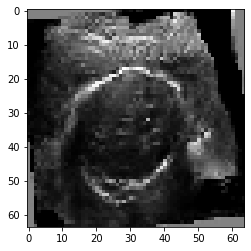

[583/1000] G_loss: 3.6738929748535156, D_loss: 0.5856167674064636
[584/1000][0/13]	Loss_D: 0.5758	Loss_G: 3.8489	D(x): 0.8472	D(G(z)): 0.1229 / 0.0201


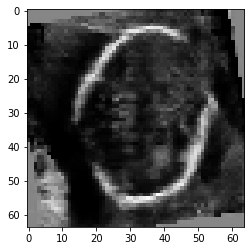

[584/1000] G_loss: 3.854330539703369, D_loss: 0.615141749382019
Saving checkpoint at epoch :  584
[585/1000][0/13]	Loss_D: 0.7611	Loss_G: 4.7919	D(x): 0.9365	D(G(z)): 0.2245 / 0.0088


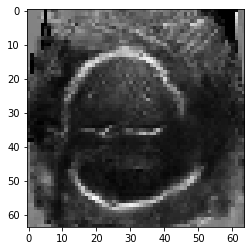

[585/1000] G_loss: 3.8353655338287354, D_loss: 0.6292805075645447
[586/1000][0/13]	Loss_D: 0.9973	Loss_G: 6.9342	D(x): 0.9681	D(G(z)): 0.3667 / 0.0015


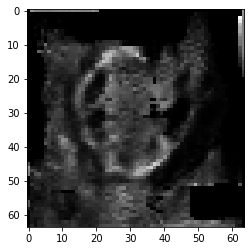

[586/1000] G_loss: 3.966916561126709, D_loss: 0.5984250903129578
[587/1000][0/13]	Loss_D: 0.5327	Loss_G: 3.9025	D(x): 0.8354	D(G(z)): 0.0813 / 0.0214


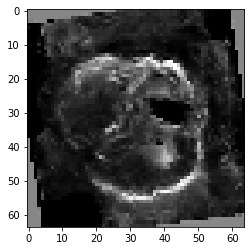

[587/1000] G_loss: 3.784414529800415, D_loss: 0.5360982418060303
[588/1000][0/13]	Loss_D: 0.4355	Loss_G: 4.1442	D(x): 0.8466	D(G(z)): 0.0369 / 0.0157


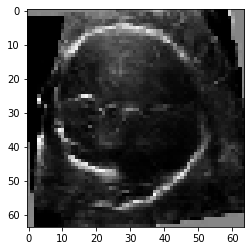

[588/1000] G_loss: 3.782623529434204, D_loss: 0.507896363735199
[589/1000][0/13]	Loss_D: 0.4901	Loss_G: 3.9277	D(x): 0.8740	D(G(z)): 0.0729 / 0.0217


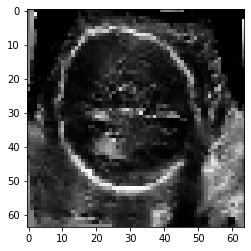

[589/1000] G_loss: 3.7343106269836426, D_loss: 0.49386170506477356
Saving checkpoint at epoch :  589
[590/1000][0/13]	Loss_D: 0.4340	Loss_G: 5.0916	D(x): 0.9198	D(G(z)): 0.0427 / 0.0067


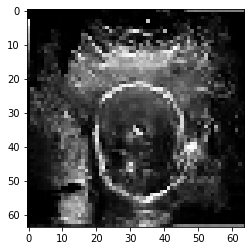

[590/1000] G_loss: 3.7388036251068115, D_loss: 0.5154237151145935
[591/1000][0/13]	Loss_D: 0.4653	Loss_G: 3.9306	D(x): 0.8599	D(G(z)): 0.0683 / 0.0203


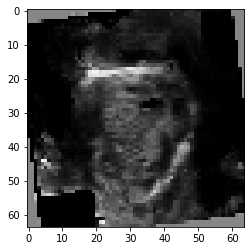

[591/1000] G_loss: 3.809955358505249, D_loss: 0.49633219838142395
[592/1000][0/13]	Loss_D: 0.5899	Loss_G: 3.9340	D(x): 0.9350	D(G(z)): 0.1440 / 0.0192


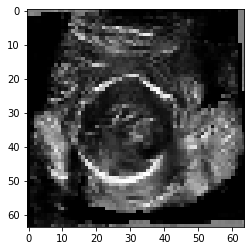

[592/1000] G_loss: 4.110766887664795, D_loss: 0.506196916103363
[593/1000][0/13]	Loss_D: 0.4826	Loss_G: 4.1444	D(x): 0.7786	D(G(z)): 0.0253 / 0.0193


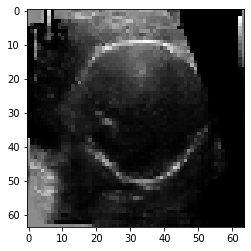

[593/1000] G_loss: 3.914552927017212, D_loss: 0.49755585193634033
[594/1000][0/13]	Loss_D: 0.4565	Loss_G: 4.4028	D(x): 0.8476	D(G(z)): 0.0493 / 0.0126


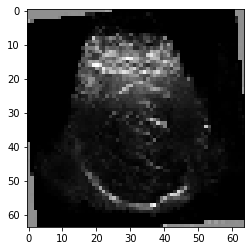

[594/1000] G_loss: 3.9235637187957764, D_loss: 0.4690409004688263
Saving checkpoint at epoch :  594
[595/1000][0/13]	Loss_D: 0.4730	Loss_G: 4.5663	D(x): 0.9137	D(G(z)): 0.0680 / 0.0116


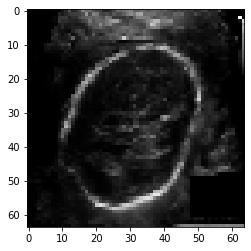

[595/1000] G_loss: 3.936361789703369, D_loss: 0.4513966739177704
[596/1000][0/13]	Loss_D: 0.4845	Loss_G: 4.0535	D(x): 0.9260	D(G(z)): 0.0916 / 0.0162


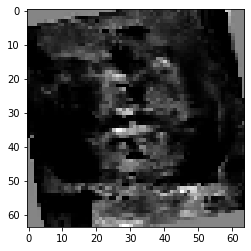

[596/1000] G_loss: 4.004652976989746, D_loss: 0.4948105216026306
[597/1000][0/13]	Loss_D: 0.4477	Loss_G: 4.1911	D(x): 0.9213	D(G(z)): 0.0698 / 0.0132


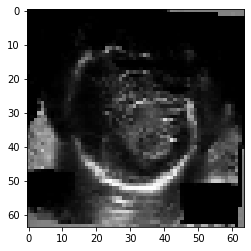

[597/1000] G_loss: 3.8132264614105225, D_loss: 0.46638646721839905
[598/1000][0/13]	Loss_D: 0.5074	Loss_G: 5.6568	D(x): 0.9387	D(G(z)): 0.1125 / 0.0029


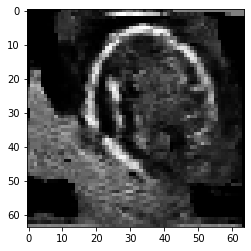

[598/1000] G_loss: 4.2320170402526855, D_loss: 0.4675511121749878
[599/1000][0/13]	Loss_D: 0.4939	Loss_G: 3.6626	D(x): 0.8046	D(G(z)): 0.0493 / 0.0276


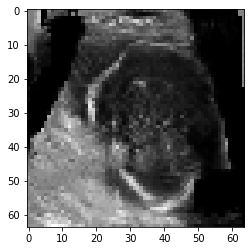

[599/1000] G_loss: 3.8914408683776855, D_loss: 0.46974053978919983
Saving checkpoint at epoch :  599
[600/1000][0/13]	Loss_D: 0.5216	Loss_G: 4.7596	D(x): 0.9349	D(G(z)): 0.1078 / 0.0067


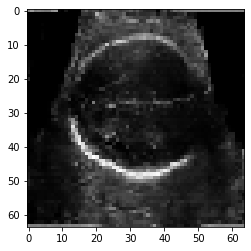

[600/1000] G_loss: 4.227917194366455, D_loss: 0.4683687388896942
[601/1000][0/13]	Loss_D: 0.4570	Loss_G: 3.9346	D(x): 0.8029	D(G(z)): 0.0153 / 0.0259


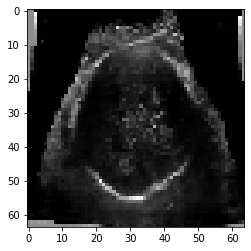

[601/1000] G_loss: 4.027394771575928, D_loss: 0.4413164258003235
[602/1000][0/13]	Loss_D: 0.4460	Loss_G: 4.4139	D(x): 0.9390	D(G(z)): 0.0440 / 0.0125


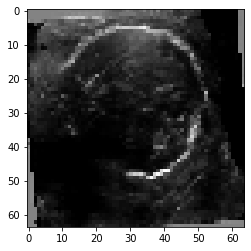

[602/1000] G_loss: 4.4533467292785645, D_loss: 0.4882216453552246
[603/1000][0/13]	Loss_D: 0.4614	Loss_G: 3.7302	D(x): 0.8308	D(G(z)): 0.0428 / 0.0249


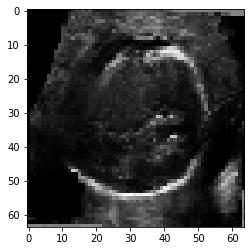

[603/1000] G_loss: 3.9825785160064697, D_loss: 0.44585955142974854
[604/1000][0/13]	Loss_D: 0.5706	Loss_G: 4.6745	D(x): 0.9596	D(G(z)): 0.1108 / 0.0074


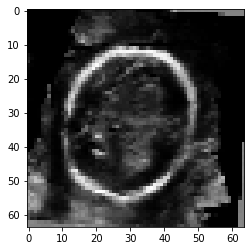

[604/1000] G_loss: 3.9930496215820312, D_loss: 0.4744238257408142
Saving checkpoint at epoch :  604
[605/1000][0/13]	Loss_D: 0.8429	Loss_G: 6.4902	D(x): 0.9872	D(G(z)): 0.2515 / 0.0013


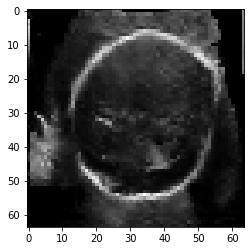

[605/1000] G_loss: 4.256944179534912, D_loss: 0.4832795262336731
[606/1000][0/13]	Loss_D: 0.5008	Loss_G: 2.9118	D(x): 0.7305	D(G(z)): 0.0168 / 0.0658


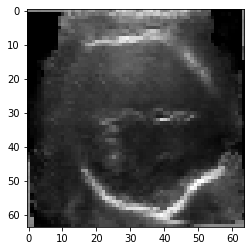

[606/1000] G_loss: 4.164334297180176, D_loss: 0.4833420515060425
[607/1000][0/13]	Loss_D: 0.4594	Loss_G: 3.8408	D(x): 0.8075	D(G(z)): 0.0291 / 0.0209


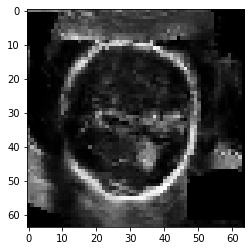

[607/1000] G_loss: 4.147468090057373, D_loss: 0.45254194736480713
[608/1000][0/13]	Loss_D: 0.4185	Loss_G: 4.5404	D(x): 0.9118	D(G(z)): 0.0345 / 0.0116


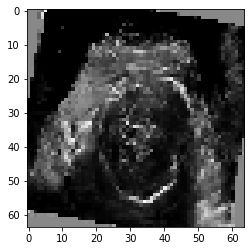

[608/1000] G_loss: 4.129408836364746, D_loss: 0.46942922472953796
[609/1000][0/13]	Loss_D: 0.4883	Loss_G: 5.4866	D(x): 0.9201	D(G(z)): 0.0821 / 0.0037


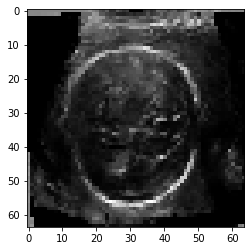

[609/1000] G_loss: 4.30088996887207, D_loss: 0.45131951570510864
Saving checkpoint at epoch :  609
[610/1000][0/13]	Loss_D: 0.4205	Loss_G: 4.1561	D(x): 0.8088	D(G(z)): 0.0239 / 0.0213


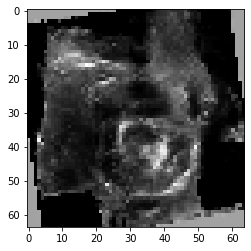

[610/1000] G_loss: 4.0106000900268555, D_loss: 0.44673866033554077
[611/1000][0/13]	Loss_D: 0.4863	Loss_G: 4.5785	D(x): 0.9391	D(G(z)): 0.0876 / 0.0103


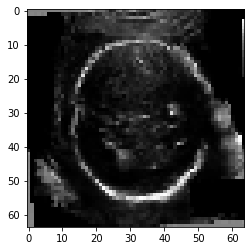

[611/1000] G_loss: 4.339690208435059, D_loss: 0.471896231174469
[612/1000][0/13]	Loss_D: 0.4236	Loss_G: 4.2724	D(x): 0.8798	D(G(z)): 0.0495 / 0.0136


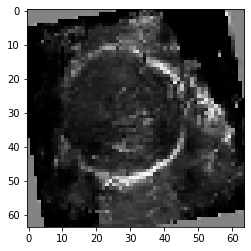

[612/1000] G_loss: 4.237303733825684, D_loss: 0.45599523186683655
[613/1000][0/13]	Loss_D: 0.4273	Loss_G: 4.6463	D(x): 0.8655	D(G(z)): 0.0392 / 0.0109


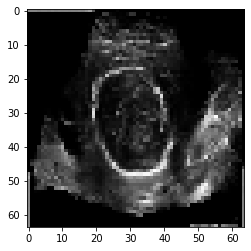

[613/1000] G_loss: 4.0045928955078125, D_loss: 0.48379576206207275
[614/1000][0/13]	Loss_D: 0.7217	Loss_G: 5.6232	D(x): 0.9312	D(G(z)): 0.1763 / 0.0031


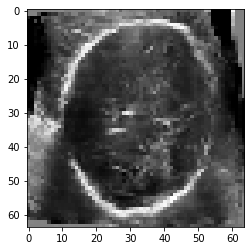

[614/1000] G_loss: 4.629966735839844, D_loss: 0.6609860062599182
Saving checkpoint at epoch :  614
[615/1000][0/13]	Loss_D: 0.5033	Loss_G: 4.3549	D(x): 0.8898	D(G(z)): 0.0723 / 0.0134


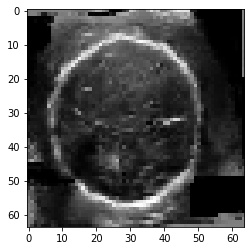

[615/1000] G_loss: 3.873155355453491, D_loss: 0.48338860273361206
[616/1000][0/13]	Loss_D: 1.2531	Loss_G: 9.3574	D(x): 0.9898	D(G(z)): 0.4033 / 0.0002


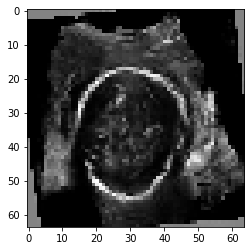

[616/1000] G_loss: 4.7881999015808105, D_loss: 0.6300760507583618
[617/1000][0/13]	Loss_D: 0.4815	Loss_G: 3.2600	D(x): 0.7699	D(G(z)): 0.0265 / 0.0450


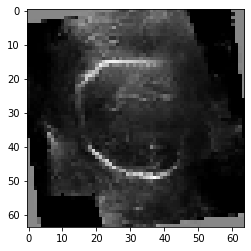

[617/1000] G_loss: 4.079522132873535, D_loss: 0.47484394907951355
[618/1000][0/13]	Loss_D: 0.4469	Loss_G: 4.1582	D(x): 0.9052	D(G(z)): 0.0601 / 0.0171


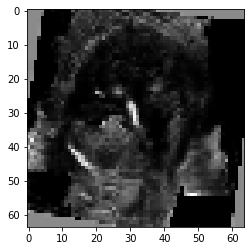

[618/1000] G_loss: 4.193594455718994, D_loss: 0.47176215052604675
[619/1000][0/13]	Loss_D: 0.5197	Loss_G: 3.2035	D(x): 0.7451	D(G(z)): 0.0172 / 0.0497


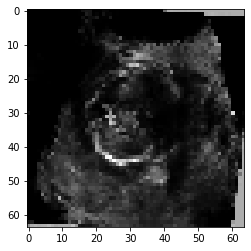

[619/1000] G_loss: 4.219161510467529, D_loss: 0.48337677121162415
Saving checkpoint at epoch :  619
[620/1000][0/13]	Loss_D: 0.4524	Loss_G: 4.0755	D(x): 0.8603	D(G(z)): 0.0698 / 0.0149


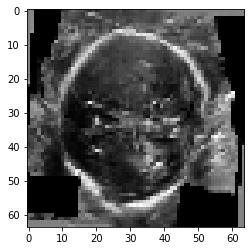

[620/1000] G_loss: 4.3607707023620605, D_loss: 0.593018651008606
[621/1000][0/13]	Loss_D: 0.4779	Loss_G: 5.0964	D(x): 0.8787	D(G(z)): 0.0532 / 0.0068


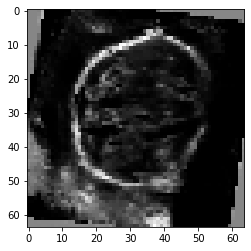

[621/1000] G_loss: 4.192237854003906, D_loss: 0.48918020725250244
[622/1000][0/13]	Loss_D: 0.5106	Loss_G: 3.4548	D(x): 0.7576	D(G(z)): 0.0270 / 0.0373


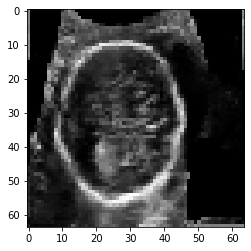

[622/1000] G_loss: 4.059130668640137, D_loss: 0.4503236413002014
[623/1000][0/13]	Loss_D: 0.4628	Loss_G: 3.9303	D(x): 0.8571	D(G(z)): 0.0605 / 0.0204


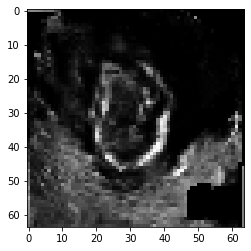

[623/1000] G_loss: 4.036031246185303, D_loss: 0.45556771755218506
[624/1000][0/13]	Loss_D: 0.4158	Loss_G: 4.1986	D(x): 0.8896	D(G(z)): 0.0317 / 0.0158


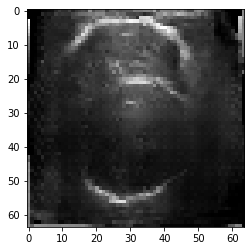

[624/1000] G_loss: 4.171229839324951, D_loss: 0.46250516176223755
Saving checkpoint at epoch :  624
[625/1000][0/13]	Loss_D: 0.4644	Loss_G: 4.1880	D(x): 0.9415	D(G(z)): 0.0516 / 0.0148


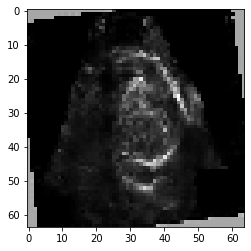

[625/1000] G_loss: 4.068357467651367, D_loss: 0.5034498572349548
[626/1000][0/13]	Loss_D: 0.7466	Loss_G: 5.2156	D(x): 0.9653	D(G(z)): 0.2013 / 0.0070


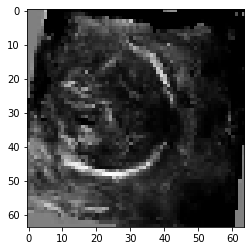

[626/1000] G_loss: 4.47318696975708, D_loss: 0.5290704965591431
[627/1000][0/13]	Loss_D: 0.5125	Loss_G: 3.4156	D(x): 0.7385	D(G(z)): 0.0226 / 0.0404


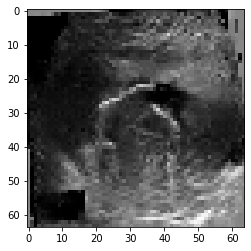

[627/1000] G_loss: 4.073146343231201, D_loss: 0.46870627999305725
[628/1000][0/13]	Loss_D: 0.4348	Loss_G: 4.5426	D(x): 0.8906	D(G(z)): 0.0385 / 0.0135


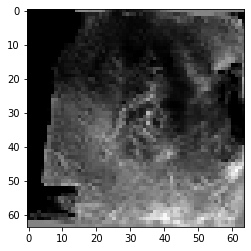

[628/1000] G_loss: 4.121350288391113, D_loss: 0.473326176404953
[629/1000][0/13]	Loss_D: 0.4266	Loss_G: 4.9599	D(x): 0.9350	D(G(z)): 0.0370 / 0.0063


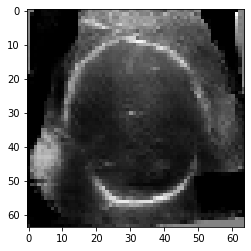

[629/1000] G_loss: 4.224978923797607, D_loss: 0.45615154504776
Saving checkpoint at epoch :  629
[630/1000][0/13]	Loss_D: 0.4147	Loss_G: 4.7919	D(x): 0.8237	D(G(z)): 0.0102 / 0.0090


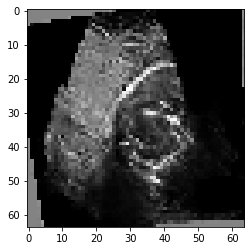

[630/1000] G_loss: 4.165069580078125, D_loss: 0.4337339997291565
[631/1000][0/13]	Loss_D: 0.4283	Loss_G: 4.0320	D(x): 0.8920	D(G(z)): 0.0466 / 0.0171


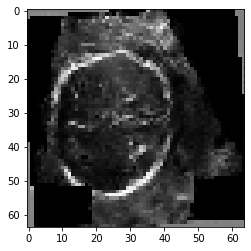

[631/1000] G_loss: 4.185011386871338, D_loss: 0.47371113300323486
[632/1000][0/13]	Loss_D: 0.5271	Loss_G: 4.9492	D(x): 0.9302	D(G(z)): 0.1053 / 0.0070


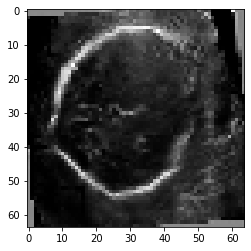

[632/1000] G_loss: 4.3305439949035645, D_loss: 0.47668901085853577
[633/1000][0/13]	Loss_D: 0.4455	Loss_G: 4.2828	D(x): 0.8644	D(G(z)): 0.0428 / 0.0149


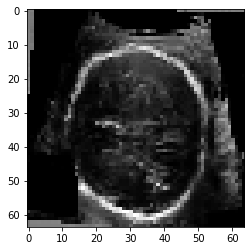

[633/1000] G_loss: 4.0866475105285645, D_loss: 0.4384014308452606
[634/1000][0/13]	Loss_D: 0.8545	Loss_G: 7.1156	D(x): 0.9600	D(G(z)): 0.2526 / 0.0008


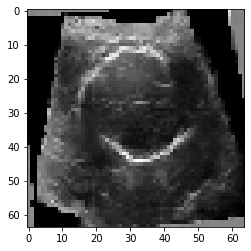

[634/1000] G_loss: 4.506254196166992, D_loss: 0.4954574406147003
Saving checkpoint at epoch :  634
[635/1000][0/13]	Loss_D: 0.4134	Loss_G: 4.1438	D(x): 0.8969	D(G(z)): 0.0353 / 0.0155


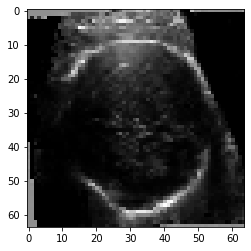

[635/1000] G_loss: 4.18212890625, D_loss: 0.4396708905696869
[636/1000][0/13]	Loss_D: 0.4491	Loss_G: 3.8271	D(x): 0.8177	D(G(z)): 0.0368 / 0.0300


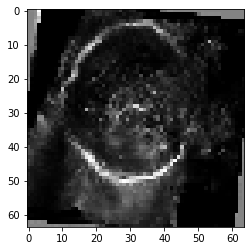

[636/1000] G_loss: 4.293911457061768, D_loss: 0.48095887899398804
[637/1000][0/13]	Loss_D: 0.4401	Loss_G: 3.7434	D(x): 0.9021	D(G(z)): 0.0459 / 0.0294


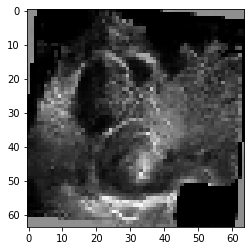

[637/1000] G_loss: 4.158098220825195, D_loss: 0.484897255897522
[638/1000][0/13]	Loss_D: 0.5360	Loss_G: 4.2769	D(x): 0.9165	D(G(z)): 0.1021 / 0.0133


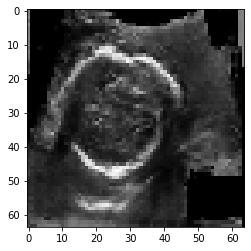

[638/1000] G_loss: 4.3668317794799805, D_loss: 0.4922935366630554
[639/1000][0/13]	Loss_D: 0.5316	Loss_G: 4.3922	D(x): 0.8907	D(G(z)): 0.1022 / 0.0132


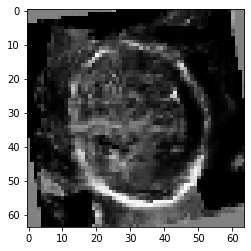

[639/1000] G_loss: 4.23146915435791, D_loss: 0.4536111056804657
Saving checkpoint at epoch :  639
[640/1000][0/13]	Loss_D: 0.4806	Loss_G: 5.0804	D(x): 0.9324	D(G(z)): 0.0838 / 0.0068


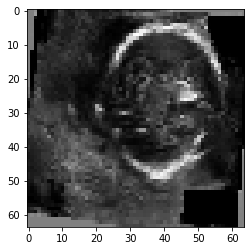

[640/1000] G_loss: 4.313050270080566, D_loss: 0.4574284255504608
[641/1000][0/13]	Loss_D: 0.4193	Loss_G: 4.9222	D(x): 0.8817	D(G(z)): 0.0371 / 0.0075


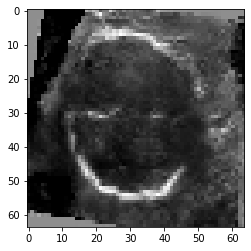

[641/1000] G_loss: 4.150910377502441, D_loss: 0.4328863322734833
[642/1000][0/13]	Loss_D: 0.4739	Loss_G: 5.0294	D(x): 0.9415	D(G(z)): 0.0760 / 0.0056


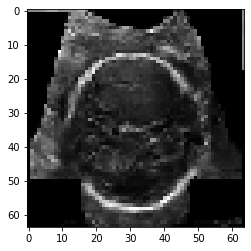

[642/1000] G_loss: 4.399692058563232, D_loss: 0.5261721611022949
[643/1000][0/13]	Loss_D: 0.4589	Loss_G: 3.8225	D(x): 0.8191	D(G(z)): 0.0296 / 0.0303


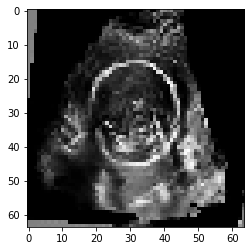

[643/1000] G_loss: 4.104745864868164, D_loss: 0.45618945360183716
[644/1000][0/13]	Loss_D: 0.4628	Loss_G: 4.1700	D(x): 0.9268	D(G(z)): 0.0418 / 0.0142


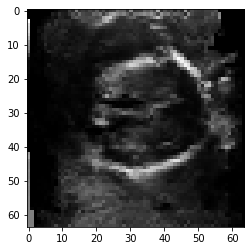

[644/1000] G_loss: 4.310362339019775, D_loss: 0.4997509717941284
Saving checkpoint at epoch :  644
[645/1000][0/13]	Loss_D: 0.4718	Loss_G: 3.5156	D(x): 0.8057	D(G(z)): 0.0231 / 0.0476


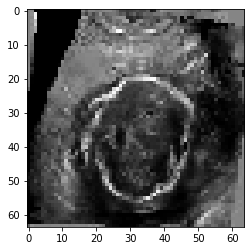

[645/1000] G_loss: 4.3787994384765625, D_loss: 0.44335025548934937
[646/1000][0/13]	Loss_D: 0.4803	Loss_G: 3.5807	D(x): 0.7694	D(G(z)): 0.0164 / 0.0336


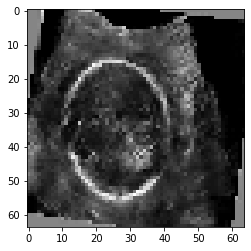

[646/1000] G_loss: 4.163937568664551, D_loss: 0.4640413820743561
[647/1000][0/13]	Loss_D: 0.4482	Loss_G: 4.2322	D(x): 0.8627	D(G(z)): 0.0413 / 0.0143


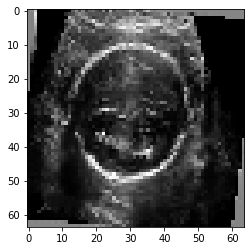

[647/1000] G_loss: 4.294318675994873, D_loss: 0.439022958278656
[648/1000][0/13]	Loss_D: 0.4429	Loss_G: 4.8055	D(x): 0.9110	D(G(z)): 0.0498 / 0.0071


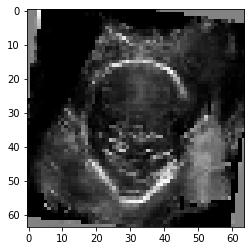

[648/1000] G_loss: 4.189598560333252, D_loss: 0.522170901298523
[649/1000][0/13]	Loss_D: 1.2093	Loss_G: 8.0309	D(x): 0.9877	D(G(z)): 0.3198 / 0.0005


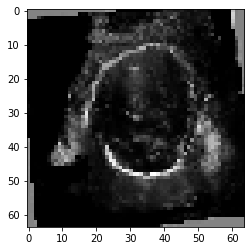

[649/1000] G_loss: 4.741714954376221, D_loss: 0.795272946357727
Saving checkpoint at epoch :  649
[650/1000][0/13]	Loss_D: 0.4982	Loss_G: 4.8791	D(x): 0.8470	D(G(z)): 0.0361 / 0.0088


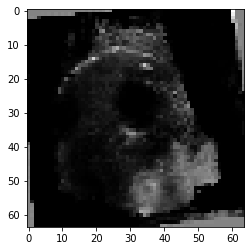

[650/1000] G_loss: 4.279919624328613, D_loss: 0.5441069006919861
[651/1000][0/13]	Loss_D: 0.5364	Loss_G: 5.2512	D(x): 0.9167	D(G(z)): 0.0871 / 0.0064


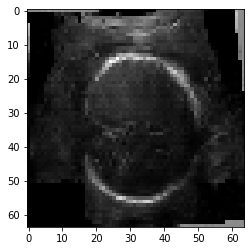

[651/1000] G_loss: 4.49090576171875, D_loss: 0.615233838558197
[652/1000][0/13]	Loss_D: 0.4962	Loss_G: 5.2987	D(x): 0.9037	D(G(z)): 0.0560 / 0.0070


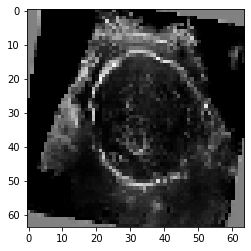

[652/1000] G_loss: 4.160343170166016, D_loss: 0.5040072798728943
[653/1000][0/13]	Loss_D: 0.6381	Loss_G: 4.7891	D(x): 0.9248	D(G(z)): 0.1477 / 0.0097


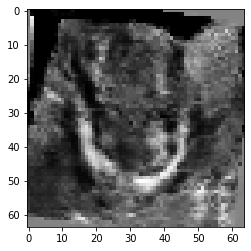

[653/1000] G_loss: 4.1595048904418945, D_loss: 0.49298062920570374
[654/1000][0/13]	Loss_D: 0.5902	Loss_G: 4.9150	D(x): 0.9724	D(G(z)): 0.1318 / 0.0062


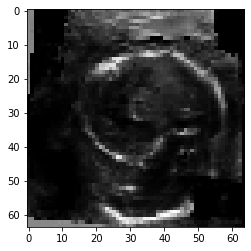

[654/1000] G_loss: 4.467513561248779, D_loss: 0.5273095369338989
Saving checkpoint at epoch :  654
[655/1000][0/13]	Loss_D: 0.4719	Loss_G: 5.5041	D(x): 0.8065	D(G(z)): 0.0192 / 0.0079


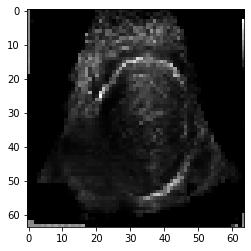

[655/1000] G_loss: 4.213221073150635, D_loss: 0.48076945543289185
[656/1000][0/13]	Loss_D: 0.4775	Loss_G: 4.9046	D(x): 0.9258	D(G(z)): 0.0657 / 0.0073


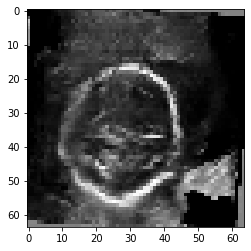

[656/1000] G_loss: 4.3353400230407715, D_loss: 0.49110543727874756
[657/1000][0/13]	Loss_D: 0.4178	Loss_G: 4.3087	D(x): 0.8822	D(G(z)): 0.0163 / 0.0216


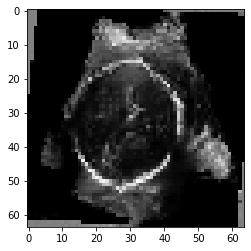

[657/1000] G_loss: 4.180915355682373, D_loss: 0.4619368016719818
[658/1000][0/13]	Loss_D: 0.4534	Loss_G: 3.6578	D(x): 0.7749	D(G(z)): 0.0214 / 0.0319


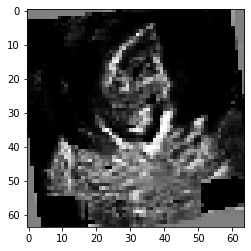

[658/1000] G_loss: 4.287836074829102, D_loss: 0.45223453640937805
[659/1000][0/13]	Loss_D: 0.4387	Loss_G: 4.1603	D(x): 0.7838	D(G(z)): 0.0133 / 0.0246


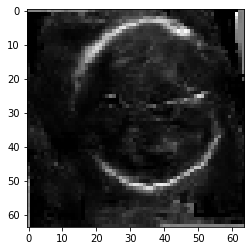

[659/1000] G_loss: 4.245969772338867, D_loss: 0.43823546171188354
Saving checkpoint at epoch :  659
[660/1000][0/13]	Loss_D: 0.4673	Loss_G: 3.6965	D(x): 0.8064	D(G(z)): 0.0403 / 0.0290


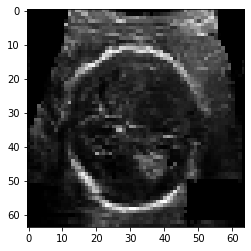

[660/1000] G_loss: 4.291329383850098, D_loss: 0.4408918619155884
[661/1000][0/13]	Loss_D: 0.4227	Loss_G: 3.8782	D(x): 0.8109	D(G(z)): 0.0122 / 0.0220


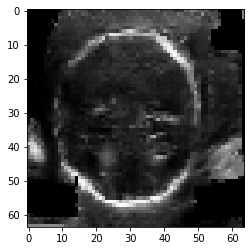

[661/1000] G_loss: 4.149021625518799, D_loss: 0.44880202412605286
[662/1000][0/13]	Loss_D: 0.5188	Loss_G: 5.0237	D(x): 0.9070	D(G(z)): 0.1061 / 0.0051


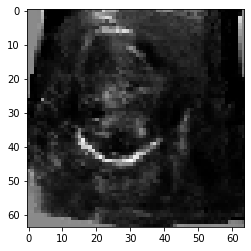

[662/1000] G_loss: 4.304986000061035, D_loss: 0.450458824634552
[663/1000][0/13]	Loss_D: 0.4195	Loss_G: 4.3770	D(x): 0.8590	D(G(z)): 0.0317 / 0.0120


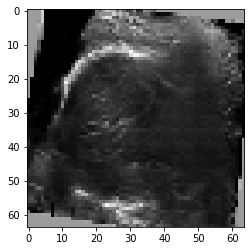

[663/1000] G_loss: 4.219902038574219, D_loss: 0.42369815707206726
[664/1000][0/13]	Loss_D: 0.4357	Loss_G: 4.4876	D(x): 0.8834	D(G(z)): 0.0428 / 0.0097


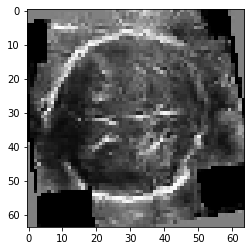

[664/1000] G_loss: 4.285665035247803, D_loss: 0.462711364030838
Saving checkpoint at epoch :  664
[665/1000][0/13]	Loss_D: 0.4707	Loss_G: 3.2685	D(x): 0.7540	D(G(z)): 0.0229 / 0.0497


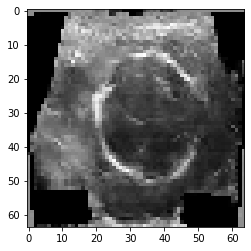

[665/1000] G_loss: 4.475137710571289, D_loss: 0.4650381803512573
[666/1000][0/13]	Loss_D: 0.7085	Loss_G: 2.1611	D(x): 0.6010	D(G(z)): 0.0082 / 0.1496


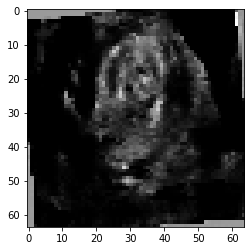

[666/1000] G_loss: 4.223292350769043, D_loss: 0.5161240100860596
[667/1000][0/13]	Loss_D: 0.4760	Loss_G: 3.5588	D(x): 0.7716	D(G(z)): 0.0106 / 0.0360


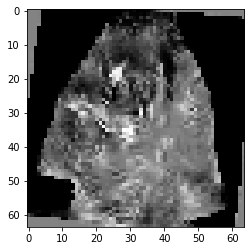

[667/1000] G_loss: 4.232102394104004, D_loss: 0.4758495092391968
[668/1000][0/13]	Loss_D: 0.5389	Loss_G: 4.4500	D(x): 0.9247	D(G(z)): 0.1123 / 0.0116


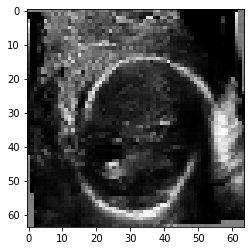

[668/1000] G_loss: 4.378422737121582, D_loss: 0.4712628722190857
[669/1000][0/13]	Loss_D: 0.4125	Loss_G: 4.3596	D(x): 0.8904	D(G(z)): 0.0375 / 0.0139


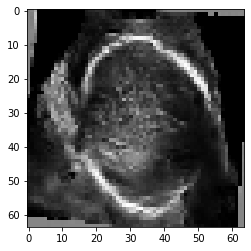

[669/1000] G_loss: 4.284708499908447, D_loss: 0.44754740595817566
Saving checkpoint at epoch :  669
[670/1000][0/13]	Loss_D: 0.5371	Loss_G: 3.3173	D(x): 0.7168	D(G(z)): 0.0168 / 0.0553


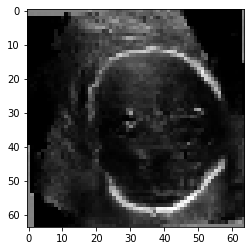

[670/1000] G_loss: 4.310665607452393, D_loss: 0.4602629244327545
[671/1000][0/13]	Loss_D: 0.4377	Loss_G: 4.7042	D(x): 0.8793	D(G(z)): 0.0325 / 0.0105


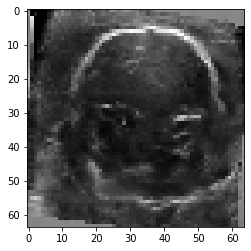

[671/1000] G_loss: 4.266488552093506, D_loss: 0.4366473853588104
[672/1000][0/13]	Loss_D: 0.4080	Loss_G: 5.1371	D(x): 0.9233	D(G(z)): 0.0396 / 0.0054


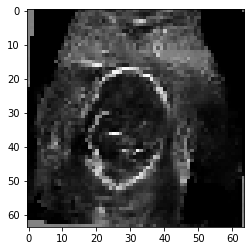

[672/1000] G_loss: 4.328819274902344, D_loss: 0.44513991475105286
[673/1000][0/13]	Loss_D: 0.4844	Loss_G: 5.2355	D(x): 0.9259	D(G(z)): 0.0854 / 0.0062


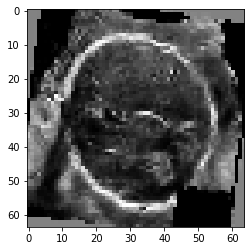

[673/1000] G_loss: 4.278195858001709, D_loss: 0.4474290609359741
[674/1000][0/13]	Loss_D: 0.6312	Loss_G: 5.3631	D(x): 0.9760	D(G(z)): 0.1398 / 0.0049


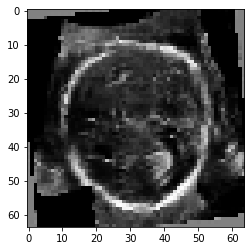

[674/1000] G_loss: 4.438836097717285, D_loss: 0.4815993010997772
Saving checkpoint at epoch :  674
[675/1000][0/13]	Loss_D: 0.4546	Loss_G: 4.4380	D(x): 0.9319	D(G(z)): 0.0575 / 0.0120


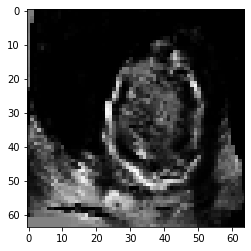

[675/1000] G_loss: 4.34586763381958, D_loss: 0.44837358593940735
[676/1000][0/13]	Loss_D: 0.4082	Loss_G: 5.0116	D(x): 0.9003	D(G(z)): 0.0345 / 0.0066


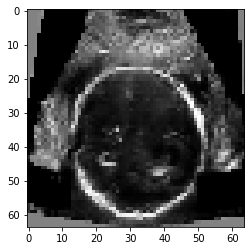

[676/1000] G_loss: 4.305323600769043, D_loss: 0.43453142046928406
[677/1000][0/13]	Loss_D: 0.4468	Loss_G: 4.2115	D(x): 0.9055	D(G(z)): 0.0506 / 0.0189


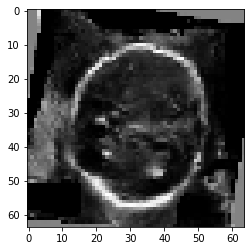

[677/1000] G_loss: 4.474512100219727, D_loss: 0.4963822662830353
[678/1000][0/13]	Loss_D: 0.4837	Loss_G: 4.6227	D(x): 0.9053	D(G(z)): 0.0705 / 0.0102


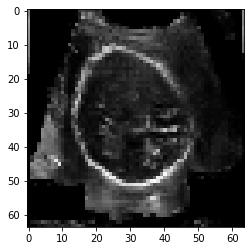

[678/1000] G_loss: 4.42303991317749, D_loss: 0.4867139160633087
[679/1000][0/13]	Loss_D: 0.4818	Loss_G: 3.8441	D(x): 0.8515	D(G(z)): 0.0475 / 0.0251


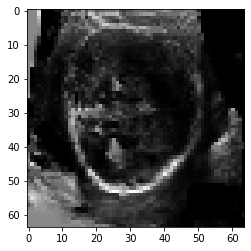

[679/1000] G_loss: 4.58675479888916, D_loss: 0.4769766628742218
Saving checkpoint at epoch :  679
[680/1000][0/13]	Loss_D: 0.4303	Loss_G: 3.7482	D(x): 0.8481	D(G(z)): 0.0296 / 0.0254


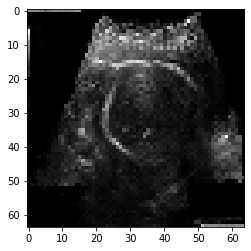

[680/1000] G_loss: 4.317895412445068, D_loss: 0.4475213289260864
[681/1000][0/13]	Loss_D: 0.5816	Loss_G: 3.0714	D(x): 0.6933	D(G(z)): 0.0107 / 0.0626


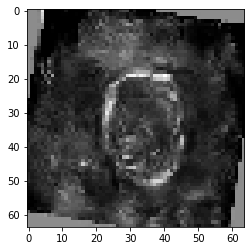

[681/1000] G_loss: 4.199395179748535, D_loss: 0.4702470004558563
[682/1000][0/13]	Loss_D: 0.4220	Loss_G: 3.8826	D(x): 0.8862	D(G(z)): 0.0294 / 0.0222


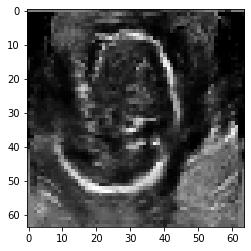

[682/1000] G_loss: 4.469056129455566, D_loss: 0.4465477168560028
[683/1000][0/13]	Loss_D: 0.4076	Loss_G: 3.9955	D(x): 0.8279	D(G(z)): 0.0138 / 0.0224


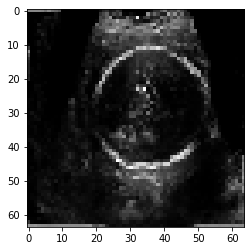

[683/1000] G_loss: 4.32506799697876, D_loss: 0.42999267578125
[684/1000][0/13]	Loss_D: 0.4513	Loss_G: 3.3888	D(x): 0.7792	D(G(z)): 0.0121 / 0.0408


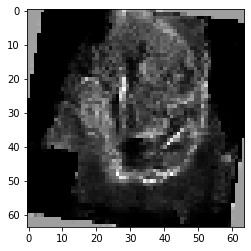

[684/1000] G_loss: 4.346592903137207, D_loss: 0.47447851300239563
Saving checkpoint at epoch :  684
[685/1000][0/13]	Loss_D: 0.4575	Loss_G: 4.5119	D(x): 0.8232	D(G(z)): 0.0260 / 0.0124


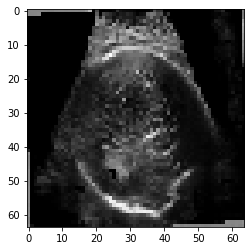

[685/1000] G_loss: 4.283989429473877, D_loss: 0.46448224782943726
[686/1000][0/13]	Loss_D: 0.4302	Loss_G: 4.1913	D(x): 0.9007	D(G(z)): 0.0244 / 0.0145


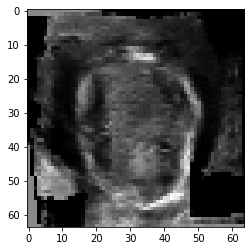

[686/1000] G_loss: 4.334660530090332, D_loss: 0.4645766615867615
[687/1000][0/13]	Loss_D: 0.3975	Loss_G: 4.8235	D(x): 0.8304	D(G(z)): 0.0097 / 0.0091


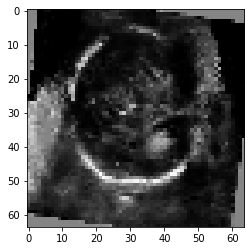

[687/1000] G_loss: 4.288989067077637, D_loss: 0.4550599455833435
[688/1000][0/13]	Loss_D: 0.4426	Loss_G: 3.9616	D(x): 0.8172	D(G(z)): 0.0140 / 0.0231


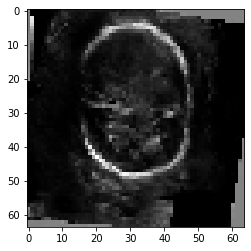

[688/1000] G_loss: 4.217597961425781, D_loss: 0.4294726550579071
[689/1000][0/13]	Loss_D: 0.4188	Loss_G: 4.1132	D(x): 0.8682	D(G(z)): 0.0362 / 0.0141


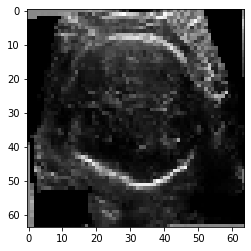

[689/1000] G_loss: 4.198068618774414, D_loss: 0.4935067594051361
Saving checkpoint at epoch :  689
[690/1000][0/13]	Loss_D: 0.4264	Loss_G: 4.1343	D(x): 0.9120	D(G(z)): 0.0429 / 0.0173


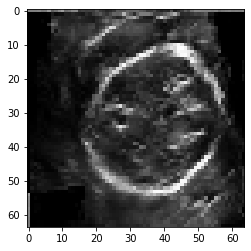

[690/1000] G_loss: 4.287742614746094, D_loss: 0.46523231267929077
[691/1000][0/13]	Loss_D: 0.4928	Loss_G: 4.6523	D(x): 0.9186	D(G(z)): 0.0743 / 0.0093


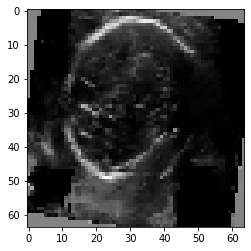

[691/1000] G_loss: 4.3830885887146, D_loss: 0.48018962144851685
[692/1000][0/13]	Loss_D: 0.4651	Loss_G: 5.1906	D(x): 0.9247	D(G(z)): 0.0613 / 0.0051


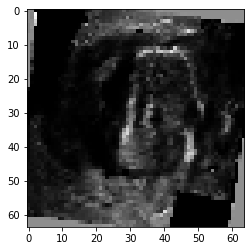

[692/1000] G_loss: 4.338964462280273, D_loss: 0.46992027759552
[693/1000][0/13]	Loss_D: 0.4035	Loss_G: 4.2511	D(x): 0.8884	D(G(z)): 0.0385 / 0.0134


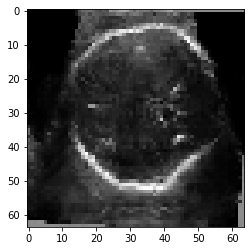

[693/1000] G_loss: 4.256561279296875, D_loss: 0.5075119733810425
[694/1000][0/13]	Loss_D: 0.9061	Loss_G: 7.2867	D(x): 0.9811	D(G(z)): 0.2527 / 0.0013


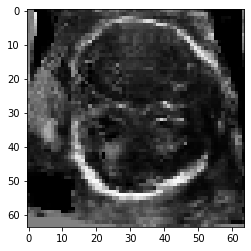

[694/1000] G_loss: 4.851576328277588, D_loss: 0.5629299879074097
Saving checkpoint at epoch :  694
[695/1000][0/13]	Loss_D: 0.5369	Loss_G: 5.0854	D(x): 0.8249	D(G(z)): 0.0708 / 0.0092


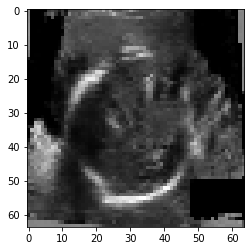

[695/1000] G_loss: 4.301616191864014, D_loss: 0.4938310980796814
[696/1000][0/13]	Loss_D: 0.7069	Loss_G: 5.7267	D(x): 0.9754	D(G(z)): 0.1640 / 0.0041


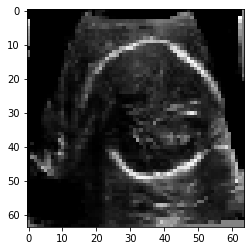

[696/1000] G_loss: 4.5641093254089355, D_loss: 0.4939098656177521
[697/1000][0/13]	Loss_D: 0.5340	Loss_G: 3.6401	D(x): 0.8273	D(G(z)): 0.0427 / 0.0340


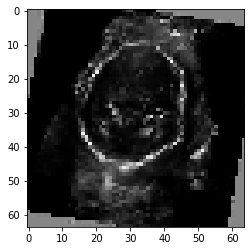

[697/1000] G_loss: 4.514922618865967, D_loss: 0.6025622487068176
[698/1000][0/13]	Loss_D: 0.6991	Loss_G: 5.2679	D(x): 0.9478	D(G(z)): 0.1471 / 0.0071


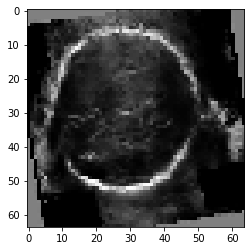

[698/1000] G_loss: 4.696371078491211, D_loss: 0.6302840113639832
[699/1000][0/13]	Loss_D: 0.5437	Loss_G: 4.4493	D(x): 0.9164	D(G(z)): 0.0949 / 0.0108


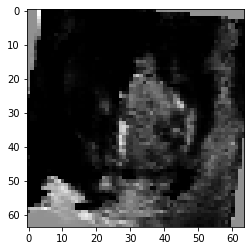

[699/1000] G_loss: 4.411837577819824, D_loss: 0.5294892191886902
Saving checkpoint at epoch :  699
[700/1000][0/13]	Loss_D: 0.4784	Loss_G: 4.8873	D(x): 0.9404	D(G(z)): 0.0579 / 0.0068


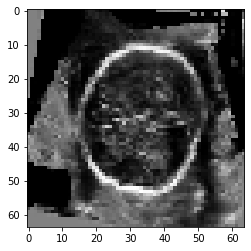

[700/1000] G_loss: 4.275982856750488, D_loss: 0.4960971176624298
[701/1000][0/13]	Loss_D: 0.4990	Loss_G: 3.2982	D(x): 0.7673	D(G(z)): 0.0214 / 0.0499


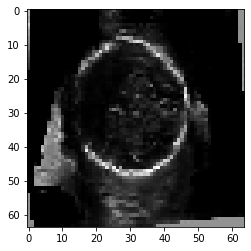

[701/1000] G_loss: 4.216391563415527, D_loss: 0.46688127517700195
[702/1000][0/13]	Loss_D: 0.4704	Loss_G: 4.8458	D(x): 0.8781	D(G(z)): 0.0762 / 0.0070


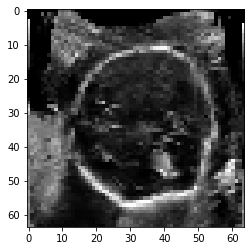

[702/1000] G_loss: 4.402213096618652, D_loss: 0.47460687160491943
[703/1000][0/13]	Loss_D: 0.5968	Loss_G: 3.4235	D(x): 0.6840	D(G(z)): 0.0113 / 0.0563


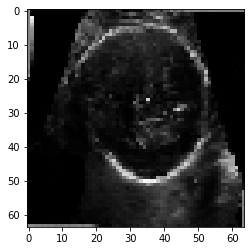

[703/1000] G_loss: 4.269021034240723, D_loss: 0.46704360842704773
[704/1000][0/13]	Loss_D: 0.4457	Loss_G: 4.1822	D(x): 0.8810	D(G(z)): 0.0483 / 0.0136


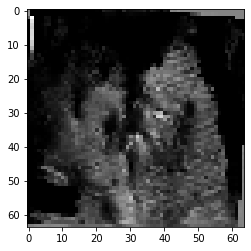

[704/1000] G_loss: 4.318355560302734, D_loss: 0.5179805159568787
Saving checkpoint at epoch :  704
[705/1000][0/13]	Loss_D: 0.4587	Loss_G: 6.2210	D(x): 0.7766	D(G(z)): 0.0067 / 0.0038


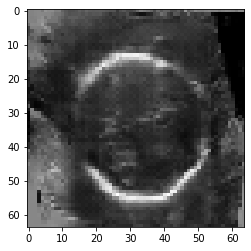

[705/1000] G_loss: 4.437199592590332, D_loss: 0.574730634689331
[706/1000][0/13]	Loss_D: 0.5195	Loss_G: 3.6100	D(x): 0.7296	D(G(z)): 0.0233 / 0.0363


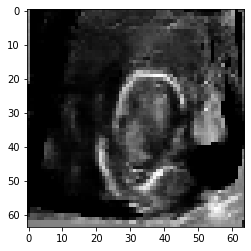

[706/1000] G_loss: 4.42439603805542, D_loss: 0.5250957012176514
[707/1000][0/13]	Loss_D: 0.4567	Loss_G: 4.1297	D(x): 0.8855	D(G(z)): 0.0306 / 0.0228


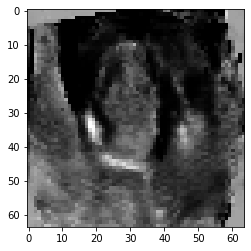

[707/1000] G_loss: 4.362130165100098, D_loss: 0.4844962954521179
[708/1000][0/13]	Loss_D: 0.6956	Loss_G: 2.3105	D(x): 0.6155	D(G(z)): 0.0280 / 0.1393


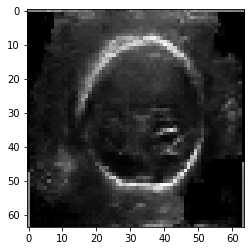

[708/1000] G_loss: 4.337630748748779, D_loss: 0.5175939202308655
[709/1000][0/13]	Loss_D: 0.4729	Loss_G: 3.8535	D(x): 0.7584	D(G(z)): 0.0144 / 0.0261


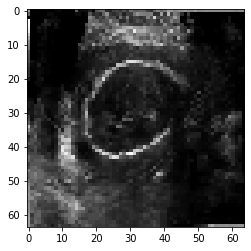

[709/1000] G_loss: 4.425774097442627, D_loss: 0.5003474354743958
Saving checkpoint at epoch :  709
[710/1000][0/13]	Loss_D: 0.5351	Loss_G: 3.8036	D(x): 0.7297	D(G(z)): 0.0132 / 0.0353


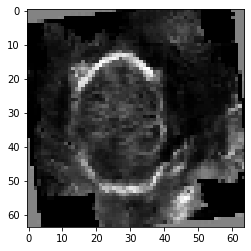

[710/1000] G_loss: 4.257781982421875, D_loss: 0.4686165452003479
[711/1000][0/13]	Loss_D: 0.4463	Loss_G: 3.5915	D(x): 0.8408	D(G(z)): 0.0314 / 0.0266


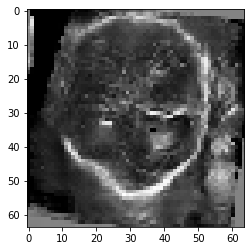

[711/1000] G_loss: 4.158909320831299, D_loss: 0.44913390278816223
[712/1000][0/13]	Loss_D: 0.4985	Loss_G: 4.9789	D(x): 0.9685	D(G(z)): 0.0639 / 0.0064


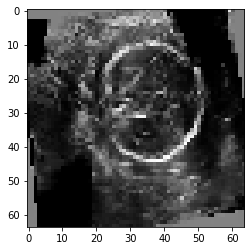

[712/1000] G_loss: 4.287930488586426, D_loss: 0.46185970306396484
[713/1000][0/13]	Loss_D: 0.5049	Loss_G: 4.7059	D(x): 0.9358	D(G(z)): 0.0861 / 0.0079


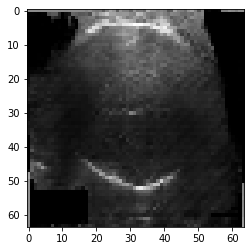

[713/1000] G_loss: 4.432922840118408, D_loss: 0.4694085121154785
[714/1000][0/13]	Loss_D: 0.4343	Loss_G: 4.8301	D(x): 0.8586	D(G(z)): 0.0261 / 0.0087


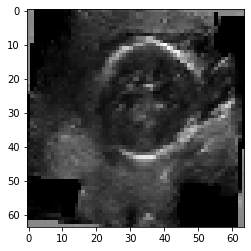

[714/1000] G_loss: 4.379274845123291, D_loss: 0.4429793357849121
Saving checkpoint at epoch :  714
[715/1000][0/13]	Loss_D: 0.4733	Loss_G: 3.4457	D(x): 0.7952	D(G(z)): 0.0382 / 0.0358


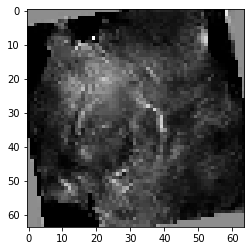

[715/1000] G_loss: 4.325031280517578, D_loss: 0.4388226270675659
[716/1000][0/13]	Loss_D: 0.4475	Loss_G: 3.8731	D(x): 0.8288	D(G(z)): 0.0275 / 0.0273


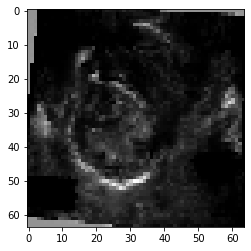

[716/1000] G_loss: 4.329006671905518, D_loss: 0.46764659881591797
[717/1000][0/13]	Loss_D: 0.4105	Loss_G: 5.7397	D(x): 0.9438	D(G(z)): 0.0212 / 0.0038


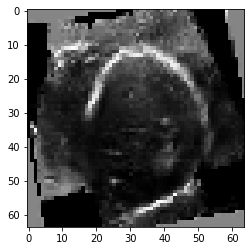

[717/1000] G_loss: 4.304203510284424, D_loss: 0.4371589124202728
[718/1000][0/13]	Loss_D: 0.4149	Loss_G: 4.7447	D(x): 0.8854	D(G(z)): 0.0306 / 0.0101


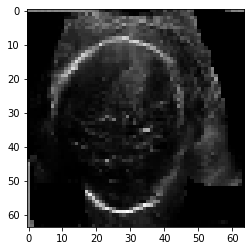

[718/1000] G_loss: 4.433713436126709, D_loss: 0.5156941413879395
[719/1000][0/13]	Loss_D: 0.4667	Loss_G: 5.4856	D(x): 0.9312	D(G(z)): 0.0703 / 0.0039


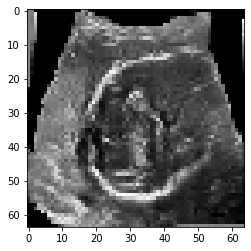

[719/1000] G_loss: 4.56520938873291, D_loss: 0.48907798528671265
Saving checkpoint at epoch :  719
[720/1000][0/13]	Loss_D: 0.7399	Loss_G: 2.1831	D(x): 0.5721	D(G(z)): 0.0068 / 0.1831


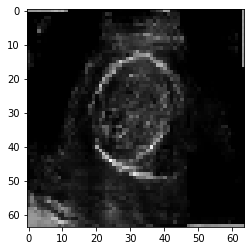

[720/1000] G_loss: 4.446900844573975, D_loss: 0.5082197785377502
[721/1000][0/13]	Loss_D: 0.5044	Loss_G: 3.1602	D(x): 0.7299	D(G(z)): 0.0104 / 0.0682


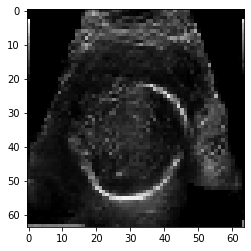

[721/1000] G_loss: 4.2853193283081055, D_loss: 0.4720330536365509
[722/1000][0/13]	Loss_D: 0.5163	Loss_G: 3.8021	D(x): 0.7653	D(G(z)): 0.0227 / 0.0253


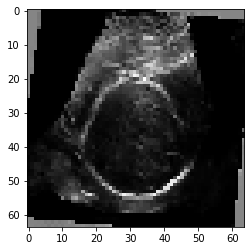

[722/1000] G_loss: 4.274783611297607, D_loss: 0.45093977451324463
[723/1000][0/13]	Loss_D: 0.4714	Loss_G: 3.0312	D(x): 0.7733	D(G(z)): 0.0151 / 0.0649


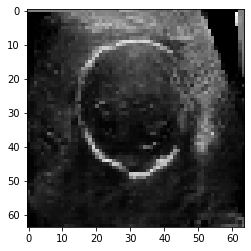

[723/1000] G_loss: 4.330533027648926, D_loss: 0.4480817914009094
[724/1000][0/13]	Loss_D: 0.4267	Loss_G: 4.3148	D(x): 0.8842	D(G(z)): 0.0377 / 0.0139


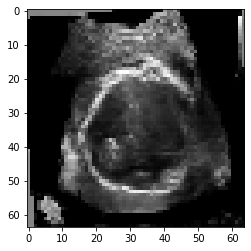

[724/1000] G_loss: 4.281991004943848, D_loss: 0.46967771649360657
Saving checkpoint at epoch :  724
[725/1000][0/13]	Loss_D: 0.5482	Loss_G: 5.1613	D(x): 0.9524	D(G(z)): 0.1087 / 0.0053


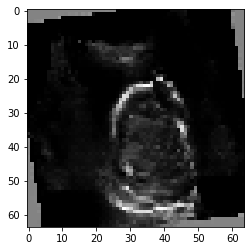

[725/1000] G_loss: 4.3961873054504395, D_loss: 0.48921653628349304
[726/1000][0/13]	Loss_D: 0.4666	Loss_G: 4.0935	D(x): 0.8301	D(G(z)): 0.0444 / 0.0211


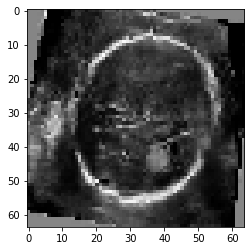

[726/1000] G_loss: 4.3881635665893555, D_loss: 0.4626006782054901
[727/1000][0/13]	Loss_D: 0.4149	Loss_G: 4.0468	D(x): 0.8481	D(G(z)): 0.0167 / 0.0197


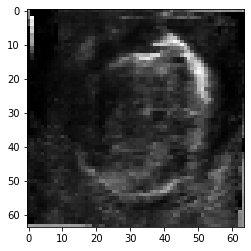

[727/1000] G_loss: 4.261838912963867, D_loss: 0.4819263815879822
[728/1000][0/13]	Loss_D: 0.6735	Loss_G: 1.9255	D(x): 0.6250	D(G(z)): 0.0112 / 0.2190


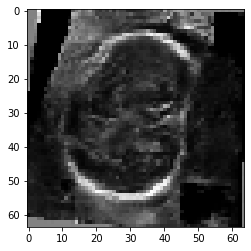

[728/1000] G_loss: 4.524899482727051, D_loss: 0.6128854155540466
[729/1000][0/13]	Loss_D: 0.4664	Loss_G: 3.8762	D(x): 0.8799	D(G(z)): 0.0492 / 0.0237


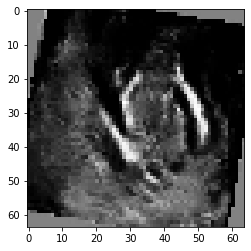

[729/1000] G_loss: 4.415043830871582, D_loss: 0.5015277862548828
Saving checkpoint at epoch :  729
[730/1000][0/13]	Loss_D: 0.4440	Loss_G: 3.9965	D(x): 0.8444	D(G(z)): 0.0301 / 0.0208


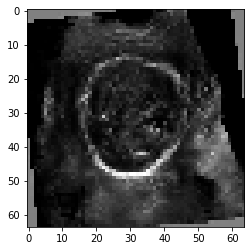

[730/1000] G_loss: 4.475493907928467, D_loss: 0.5059639811515808
[731/1000][0/13]	Loss_D: 0.4517	Loss_G: 3.6673	D(x): 0.8227	D(G(z)): 0.0266 / 0.0297


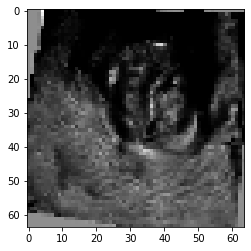

[731/1000] G_loss: 4.325623512268066, D_loss: 0.48354941606521606
[732/1000][0/13]	Loss_D: 0.4694	Loss_G: 4.1631	D(x): 0.7736	D(G(z)): 0.0227 / 0.0259


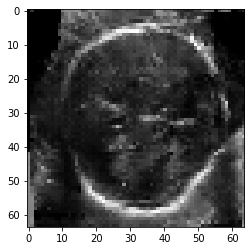

[732/1000] G_loss: 4.269700050354004, D_loss: 0.4540928602218628
[733/1000][0/13]	Loss_D: 0.4539	Loss_G: 3.2973	D(x): 0.7791	D(G(z)): 0.0194 / 0.0508


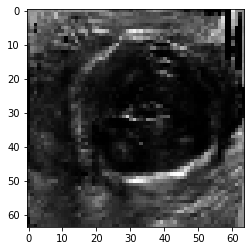

[733/1000] G_loss: 4.29061222076416, D_loss: 0.45023614168167114
[734/1000][0/13]	Loss_D: 0.4892	Loss_G: 4.7270	D(x): 0.9146	D(G(z)): 0.0779 / 0.0072


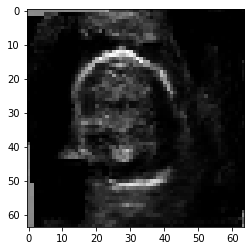

[734/1000] G_loss: 4.287234306335449, D_loss: 0.45377179980278015
Saving checkpoint at epoch :  734
[735/1000][0/13]	Loss_D: 0.5269	Loss_G: 5.0443	D(x): 0.9540	D(G(z)): 0.0846 / 0.0054


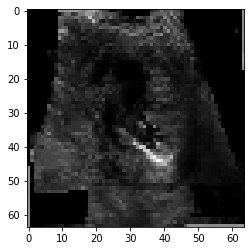

[735/1000] G_loss: 4.62246561050415, D_loss: 0.46157944202423096
[736/1000][0/13]	Loss_D: 0.4735	Loss_G: 4.0184	D(x): 0.7562	D(G(z)): 0.0089 / 0.0207


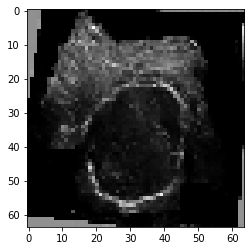

[736/1000] G_loss: 4.286959171295166, D_loss: 0.4519752264022827
[737/1000][0/13]	Loss_D: 0.4181	Loss_G: 4.7258	D(x): 0.9047	D(G(z)): 0.0338 / 0.0087


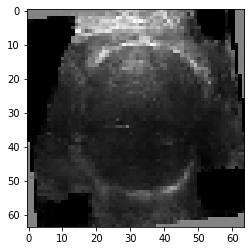

[737/1000] G_loss: 4.338810443878174, D_loss: 0.43302375078201294
[738/1000][0/13]	Loss_D: 0.4679	Loss_G: 4.4437	D(x): 0.9383	D(G(z)): 0.0623 / 0.0104


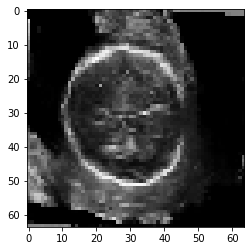

[738/1000] G_loss: 4.326925277709961, D_loss: 0.442082941532135
[739/1000][0/13]	Loss_D: 0.4073	Loss_G: 5.0715	D(x): 0.8490	D(G(z)): 0.0146 / 0.0070


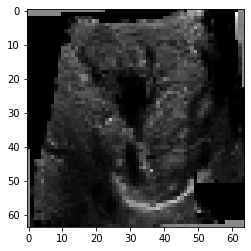

[739/1000] G_loss: 4.304696083068848, D_loss: 0.4960077404975891
Saving checkpoint at epoch :  739
[740/1000][0/13]	Loss_D: 0.3948	Loss_G: 5.2322	D(x): 0.8941	D(G(z)): 0.0215 / 0.0066


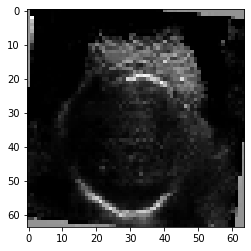

[740/1000] G_loss: 4.256640434265137, D_loss: 0.5047664046287537
[741/1000][0/13]	Loss_D: 0.5124	Loss_G: 5.5439	D(x): 0.8999	D(G(z)): 0.0801 / 0.0050


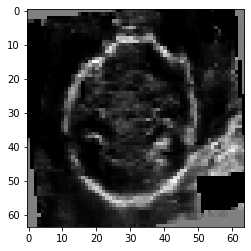

[741/1000] G_loss: 4.601253986358643, D_loss: 0.49351051449775696
[742/1000][0/13]	Loss_D: 0.4588	Loss_G: 4.1004	D(x): 0.9187	D(G(z)): 0.0455 / 0.0172


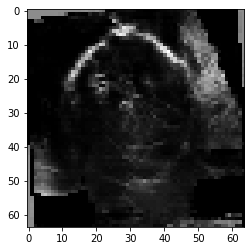

[742/1000] G_loss: 4.381364822387695, D_loss: 0.5211803913116455
[743/1000][0/13]	Loss_D: 0.5309	Loss_G: 4.0338	D(x): 0.7056	D(G(z)): 0.0128 / 0.0271


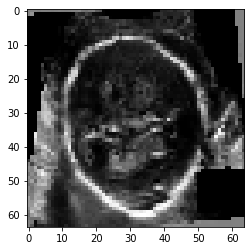

[743/1000] G_loss: 4.269739151000977, D_loss: 0.45004382729530334
[744/1000][0/13]	Loss_D: 0.4959	Loss_G: 4.9913	D(x): 0.9565	D(G(z)): 0.0826 / 0.0068


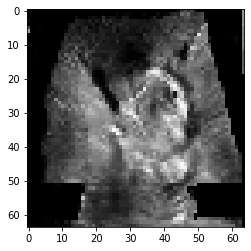

[744/1000] G_loss: 4.655611991882324, D_loss: 0.6257711052894592
Saving checkpoint at epoch :  744
[745/1000][0/13]	Loss_D: 0.8389	Loss_G: 1.4523	D(x): 0.5842	D(G(z)): 0.0226 / 0.3233


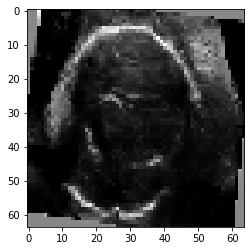

[745/1000] G_loss: 4.581988334655762, D_loss: 0.654261589050293
[746/1000][0/13]	Loss_D: 0.5022	Loss_G: 4.1926	D(x): 0.7795	D(G(z)): 0.0301 / 0.0201


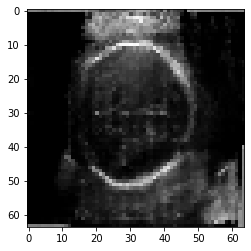

[746/1000] G_loss: 4.5732808113098145, D_loss: 0.5542447566986084
[747/1000][0/13]	Loss_D: 0.5202	Loss_G: 5.7795	D(x): 0.9158	D(G(z)): 0.0806 / 0.0037


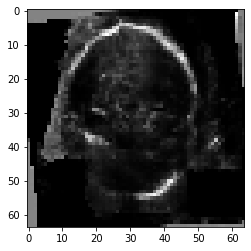

[747/1000] G_loss: 4.6096906661987305, D_loss: 0.5090438723564148
[748/1000][0/13]	Loss_D: 0.4680	Loss_G: 4.6570	D(x): 0.8216	D(G(z)): 0.0372 / 0.0098


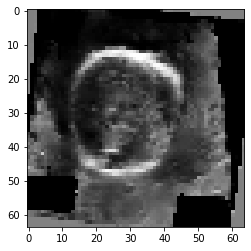

[748/1000] G_loss: 4.380276679992676, D_loss: 0.4591589570045471
[749/1000][0/13]	Loss_D: 0.5275	Loss_G: 3.7618	D(x): 0.7363	D(G(z)): 0.0087 / 0.0301


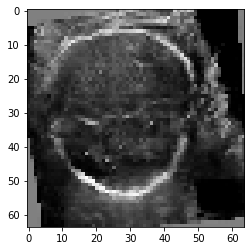

[749/1000] G_loss: 4.336966514587402, D_loss: 0.49787792563438416
Saving checkpoint at epoch :  749
[750/1000][0/13]	Loss_D: 0.4168	Loss_G: 4.7754	D(x): 0.8887	D(G(z)): 0.0244 / 0.0083


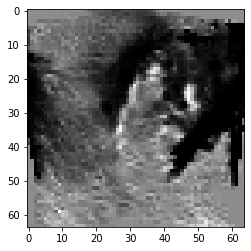

[750/1000] G_loss: 4.508613109588623, D_loss: 0.4780174791812897
[751/1000][0/13]	Loss_D: 0.4413	Loss_G: 4.7997	D(x): 0.8030	D(G(z)): 0.0094 / 0.0106


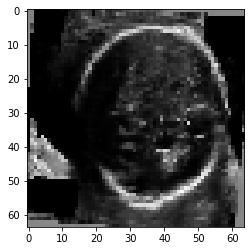

[751/1000] G_loss: 4.231683254241943, D_loss: 0.44854021072387695
[752/1000][0/13]	Loss_D: 0.4420	Loss_G: 4.5333	D(x): 0.9191	D(G(z)): 0.0505 / 0.0095


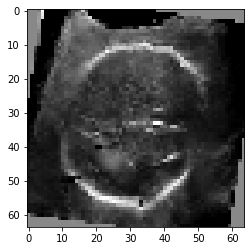

[752/1000] G_loss: 4.4058756828308105, D_loss: 0.4744707942008972
[753/1000][0/13]	Loss_D: 0.4405	Loss_G: 4.7933	D(x): 0.9361	D(G(z)): 0.0525 / 0.0077


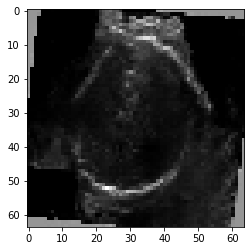

[753/1000] G_loss: 4.231896877288818, D_loss: 0.4465877413749695
[754/1000][0/13]	Loss_D: 0.4982	Loss_G: 4.6171	D(x): 0.9273	D(G(z)): 0.0858 / 0.0090


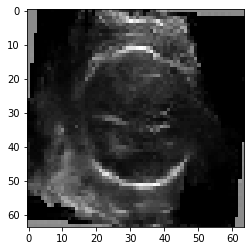

[754/1000] G_loss: 4.486541271209717, D_loss: 0.4804811477661133
Saving checkpoint at epoch :  754
[755/1000][0/13]	Loss_D: 0.4324	Loss_G: 5.5218	D(x): 0.8627	D(G(z)): 0.0296 / 0.0050


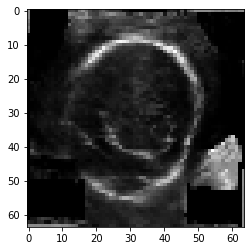

[755/1000] G_loss: 4.3747735023498535, D_loss: 0.4806070625782013
[756/1000][0/13]	Loss_D: 0.4083	Loss_G: 4.6634	D(x): 0.9068	D(G(z)): 0.0340 / 0.0094


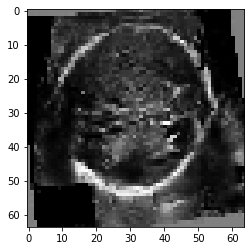

[756/1000] G_loss: 4.252874374389648, D_loss: 0.45760199427604675
[757/1000][0/13]	Loss_D: 0.4181	Loss_G: 4.9187	D(x): 0.8607	D(G(z)): 0.0195 / 0.0070


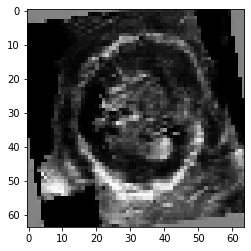

[757/1000] G_loss: 4.331532001495361, D_loss: 0.4532146155834198
[758/1000][0/13]	Loss_D: 0.4057	Loss_G: 4.8276	D(x): 0.9197	D(G(z)): 0.0306 / 0.0084


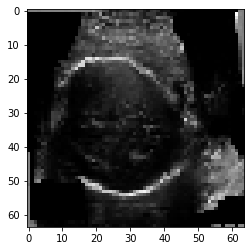

[758/1000] G_loss: 4.361292839050293, D_loss: 0.49438315629959106
[759/1000][0/13]	Loss_D: 0.4544	Loss_G: 4.7039	D(x): 0.8190	D(G(z)): 0.0220 / 0.0130


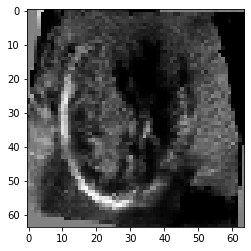

[759/1000] G_loss: 4.323629379272461, D_loss: 0.4436890482902527
Saving checkpoint at epoch :  759
[760/1000][0/13]	Loss_D: 0.5322	Loss_G: 4.7595	D(x): 0.9486	D(G(z)): 0.0951 / 0.0065


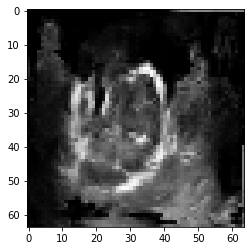

[760/1000] G_loss: 4.363127708435059, D_loss: 0.45412614941596985
[761/1000][0/13]	Loss_D: 0.4305	Loss_G: 4.2735	D(x): 0.8731	D(G(z)): 0.0341 / 0.0134


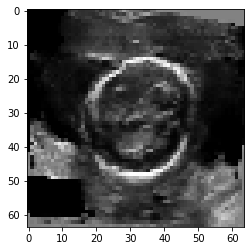

[761/1000] G_loss: 4.233143329620361, D_loss: 0.43015366792678833
[762/1000][0/13]	Loss_D: 0.4717	Loss_G: 5.0607	D(x): 0.9624	D(G(z)): 0.0606 / 0.0053


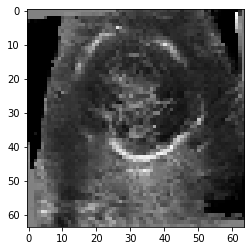

[762/1000] G_loss: 4.557575225830078, D_loss: 0.4627060890197754
[763/1000][0/13]	Loss_D: 0.4352	Loss_G: 3.8731	D(x): 0.8301	D(G(z)): 0.0126 / 0.0246


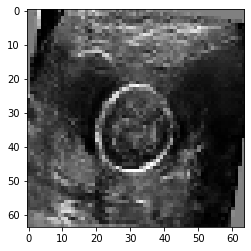

[763/1000] G_loss: 4.330143451690674, D_loss: 0.4481355845928192
[764/1000][0/13]	Loss_D: 0.4162	Loss_G: 4.1259	D(x): 0.9027	D(G(z)): 0.0348 / 0.0162


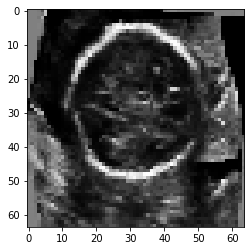

[764/1000] G_loss: 4.356010913848877, D_loss: 0.44451019167900085
Saving checkpoint at epoch :  764
[765/1000][0/13]	Loss_D: 0.4234	Loss_G: 4.1024	D(x): 0.8757	D(G(z)): 0.0326 / 0.0160


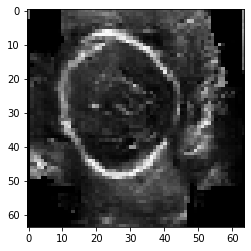

[765/1000] G_loss: 4.401194095611572, D_loss: 0.43964383006095886
[766/1000][0/13]	Loss_D: 0.4091	Loss_G: 5.4206	D(x): 0.9084	D(G(z)): 0.0342 / 0.0057


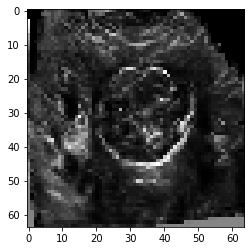

[766/1000] G_loss: 4.479622840881348, D_loss: 0.44004517793655396
[767/1000][0/13]	Loss_D: 0.4049	Loss_G: 4.8047	D(x): 0.8990	D(G(z)): 0.0193 / 0.0075


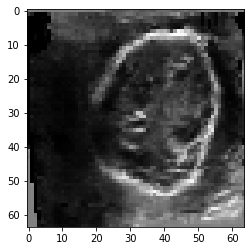

[767/1000] G_loss: 4.0609259605407715, D_loss: 0.46555471420288086
[768/1000][0/13]	Loss_D: 0.9561	Loss_G: 7.0467	D(x): 0.9923	D(G(z)): 0.2822 / 0.0007


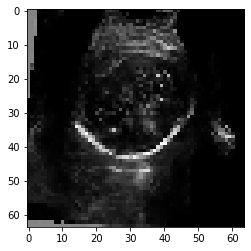

[768/1000] G_loss: 4.705833911895752, D_loss: 0.5862069725990295
[769/1000][0/13]	Loss_D: 0.5062	Loss_G: 4.8118	D(x): 0.8871	D(G(z)): 0.0652 / 0.0091


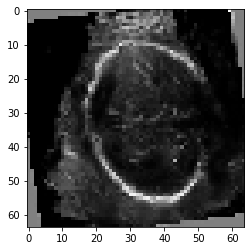

[769/1000] G_loss: 4.338708877563477, D_loss: 0.4621202051639557
Saving checkpoint at epoch :  769
[770/1000][0/13]	Loss_D: 0.4425	Loss_G: 4.0196	D(x): 0.8811	D(G(z)): 0.0448 / 0.0182


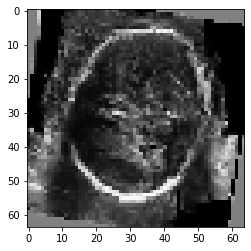

[770/1000] G_loss: 4.300134181976318, D_loss: 0.4923677444458008
[771/1000][0/13]	Loss_D: 0.4646	Loss_G: 4.4642	D(x): 0.8872	D(G(z)): 0.0501 / 0.0149


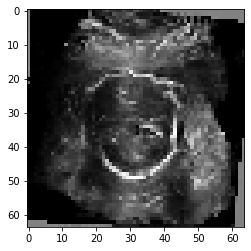

[771/1000] G_loss: 4.253692150115967, D_loss: 0.43661239743232727
[772/1000][0/13]	Loss_D: 0.4709	Loss_G: 4.5879	D(x): 0.9327	D(G(z)): 0.0743 / 0.0117


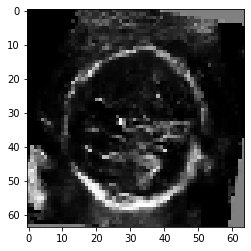

[772/1000] G_loss: 4.204291820526123, D_loss: 0.45656171441078186
[773/1000][0/13]	Loss_D: 0.4165	Loss_G: 4.8657	D(x): 0.9170	D(G(z)): 0.0367 / 0.0082


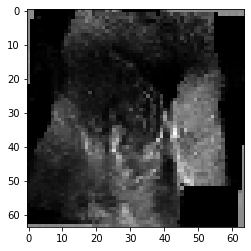

[773/1000] G_loss: 4.313246250152588, D_loss: 0.4327336847782135
[774/1000][0/13]	Loss_D: 0.4405	Loss_G: 3.9444	D(x): 0.8074	D(G(z)): 0.0163 / 0.0194


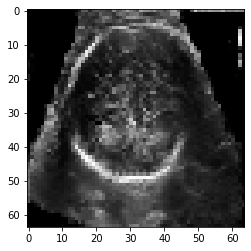

[774/1000] G_loss: 4.15061616897583, D_loss: 0.43538698554039
Saving checkpoint at epoch :  774
[775/1000][0/13]	Loss_D: 0.4226	Loss_G: 4.4501	D(x): 0.9025	D(G(z)): 0.0414 / 0.0112


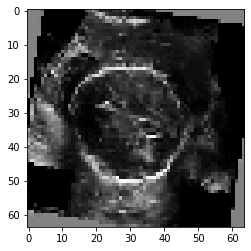

[775/1000] G_loss: 4.412089824676514, D_loss: 0.4481566548347473
[776/1000][0/13]	Loss_D: 0.4619	Loss_G: 4.3135	D(x): 0.8285	D(G(z)): 0.0278 / 0.0138


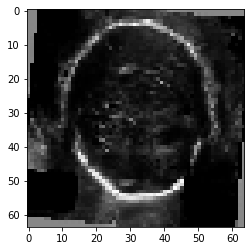

[776/1000] G_loss: 4.418083667755127, D_loss: 0.4274883270263672
[777/1000][0/13]	Loss_D: 0.4236	Loss_G: 3.9742	D(x): 0.8299	D(G(z)): 0.0216 / 0.0190


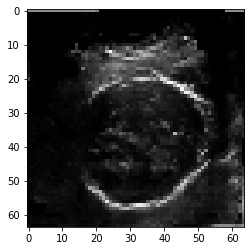

[777/1000] G_loss: 4.6496195793151855, D_loss: 0.49124079942703247
[778/1000][0/13]	Loss_D: 0.5246	Loss_G: 3.7683	D(x): 0.7294	D(G(z)): 0.0146 / 0.0346


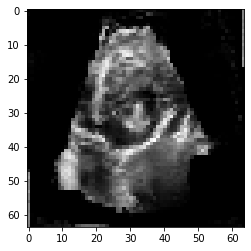

[778/1000] G_loss: 4.334409713745117, D_loss: 0.4599693715572357
[779/1000][0/13]	Loss_D: 0.3986	Loss_G: 5.2397	D(x): 0.8877	D(G(z)): 0.0156 / 0.0052


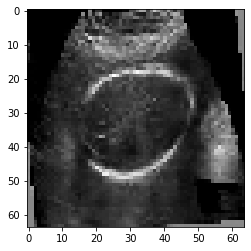

[779/1000] G_loss: 4.374896049499512, D_loss: 0.4435757100582123
Saving checkpoint at epoch :  779
[780/1000][0/13]	Loss_D: 0.4560	Loss_G: 4.5483	D(x): 0.9235	D(G(z)): 0.0763 / 0.0090


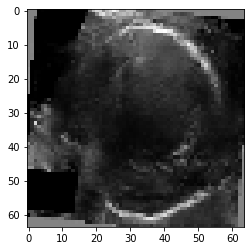

[780/1000] G_loss: 4.3793625831604, D_loss: 0.42758890986442566
[781/1000][0/13]	Loss_D: 0.4727	Loss_G: 4.5623	D(x): 0.9025	D(G(z)): 0.0381 / 0.0112


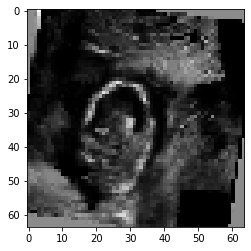

[781/1000] G_loss: 4.4379658699035645, D_loss: 0.4409545361995697
[782/1000][0/13]	Loss_D: 0.4104	Loss_G: 4.8066	D(x): 0.8473	D(G(z)): 0.0105 / 0.0075


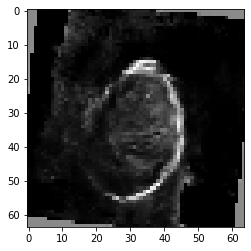

[782/1000] G_loss: 4.324146747589111, D_loss: 0.4321155250072479
[783/1000][0/13]	Loss_D: 0.4040	Loss_G: 4.8544	D(x): 0.9023	D(G(z)): 0.0326 / 0.0069


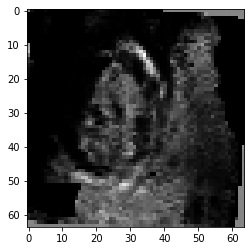

[783/1000] G_loss: 4.3470611572265625, D_loss: 0.41542699933052063
[784/1000][0/13]	Loss_D: 0.5619	Loss_G: 2.8528	D(x): 0.6754	D(G(z)): 0.0075 / 0.0711


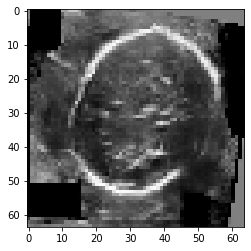

[784/1000] G_loss: 4.424055099487305, D_loss: 0.4938117265701294
Saving checkpoint at epoch :  784
[785/1000][0/13]	Loss_D: 0.5975	Loss_G: 5.4028	D(x): 0.9637	D(G(z)): 0.1363 / 0.0031


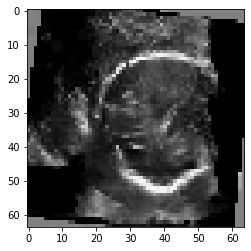

[785/1000] G_loss: 4.458779335021973, D_loss: 0.45636817812919617
[786/1000][0/13]	Loss_D: 0.5765	Loss_G: 5.0632	D(x): 0.9425	D(G(z)): 0.1206 / 0.0081


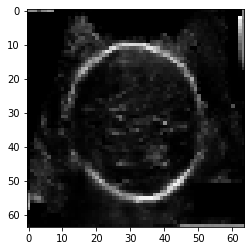

[786/1000] G_loss: 4.46405029296875, D_loss: 0.5044122934341431
[787/1000][0/13]	Loss_D: 0.4851	Loss_G: 4.3017	D(x): 0.9044	D(G(z)): 0.0677 / 0.0118


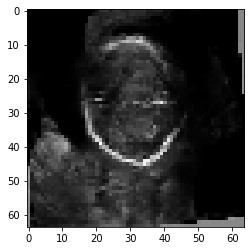

[787/1000] G_loss: 4.252027988433838, D_loss: 0.44857996702194214
[788/1000][0/13]	Loss_D: 0.4643	Loss_G: 4.3622	D(x): 0.9226	D(G(z)): 0.0606 / 0.0120


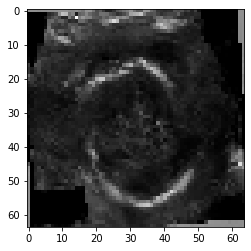

[788/1000] G_loss: 4.455324172973633, D_loss: 0.4338819086551666
[789/1000][0/13]	Loss_D: 0.4690	Loss_G: 3.5251	D(x): 0.7747	D(G(z)): 0.0177 / 0.0397


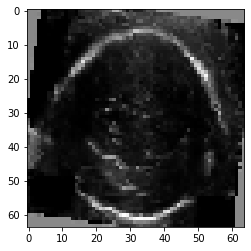

[789/1000] G_loss: 4.46492338180542, D_loss: 0.49559932947158813
Saving checkpoint at epoch :  789
[790/1000][0/13]	Loss_D: 0.7524	Loss_G: 5.9226	D(x): 0.9759	D(G(z)): 0.1650 / 0.0025


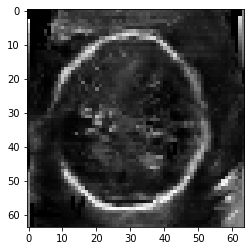

[790/1000] G_loss: 4.711028099060059, D_loss: 0.6202689409255981
[791/1000][0/13]	Loss_D: 1.2803	Loss_G: 7.9897	D(x): 0.9957	D(G(z)): 0.3286 / 0.0003


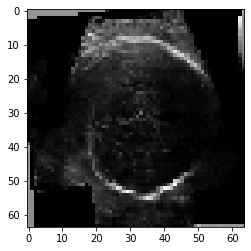

[791/1000] G_loss: 4.746660232543945, D_loss: 0.5719050168991089
[792/1000][0/13]	Loss_D: 0.6210	Loss_G: 5.9751	D(x): 0.9525	D(G(z)): 0.1307 / 0.0020


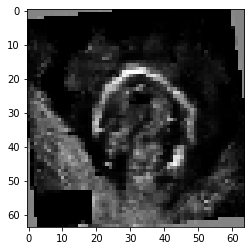

[792/1000] G_loss: 4.376112937927246, D_loss: 0.5027756094932556
[793/1000][0/13]	Loss_D: 0.5738	Loss_G: 5.1899	D(x): 0.9413	D(G(z)): 0.1277 / 0.0054


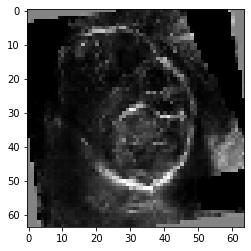

[793/1000] G_loss: 4.587512493133545, D_loss: 0.4657600522041321
[794/1000][0/13]	Loss_D: 0.5068	Loss_G: 3.4468	D(x): 0.7322	D(G(z)): 0.0149 / 0.0426


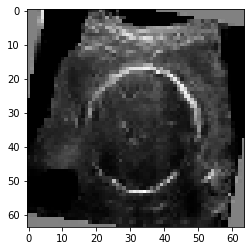

[794/1000] G_loss: 4.4164137840271, D_loss: 0.47383004426956177
Saving checkpoint at epoch :  794
[795/1000][0/13]	Loss_D: 0.4574	Loss_G: 4.4767	D(x): 0.8908	D(G(z)): 0.0332 / 0.0141


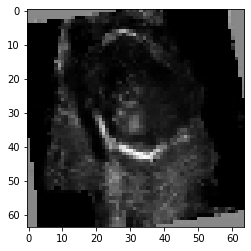

[795/1000] G_loss: 4.327419757843018, D_loss: 0.475910484790802
[796/1000][0/13]	Loss_D: 0.4879	Loss_G: 4.7442	D(x): 0.8117	D(G(z)): 0.0349 / 0.0114


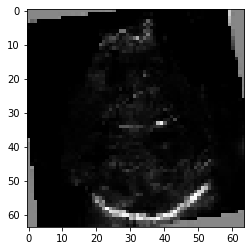

[796/1000] G_loss: 4.340043067932129, D_loss: 0.5031267404556274
[797/1000][0/13]	Loss_D: 0.4866	Loss_G: 4.9776	D(x): 0.9605	D(G(z)): 0.0651 / 0.0059


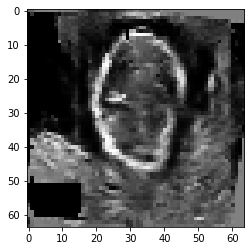

[797/1000] G_loss: 4.224576473236084, D_loss: 0.4755513370037079
[798/1000][0/13]	Loss_D: 0.4754	Loss_G: 4.2078	D(x): 0.8581	D(G(z)): 0.0591 / 0.0184


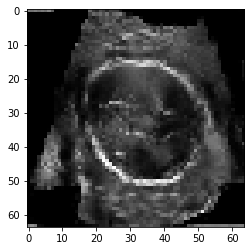

[798/1000] G_loss: 4.285696983337402, D_loss: 0.4458620250225067
[799/1000][0/13]	Loss_D: 0.4281	Loss_G: 4.0245	D(x): 0.8454	D(G(z)): 0.0326 / 0.0218


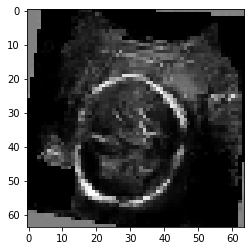

[799/1000] G_loss: 4.146673202514648, D_loss: 0.4454600214958191
Saving checkpoint at epoch :  799
Saving checkpoint at epoch :  799
[800/1000][0/13]	Loss_D: 0.4837	Loss_G: 4.3636	D(x): 0.9408	D(G(z)): 0.0896 / 0.0104


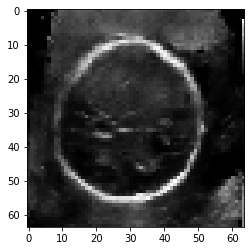

[800/1000] G_loss: 4.370724678039551, D_loss: 0.46277230978012085
[801/1000][0/13]	Loss_D: 0.4672	Loss_G: 3.7703	D(x): 0.8453	D(G(z)): 0.0328 / 0.0279


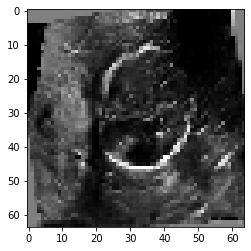

[801/1000] G_loss: 4.293021202087402, D_loss: 0.4423060119152069
[802/1000][0/13]	Loss_D: 0.3979	Loss_G: 4.9800	D(x): 0.8905	D(G(z)): 0.0285 / 0.0067


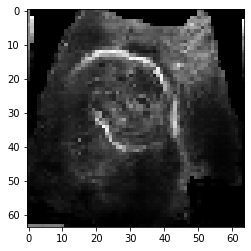

[802/1000] G_loss: 4.54890251159668, D_loss: 0.5334711670875549
[803/1000][0/13]	Loss_D: 0.5226	Loss_G: 4.8884	D(x): 0.9326	D(G(z)): 0.0827 / 0.0084


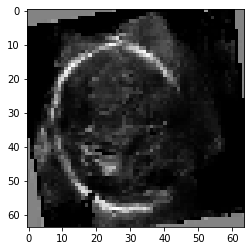

[803/1000] G_loss: 4.378875255584717, D_loss: 0.47944509983062744
[804/1000][0/13]	Loss_D: 0.6075	Loss_G: 5.2406	D(x): 0.9735	D(G(z)): 0.1176 / 0.0055


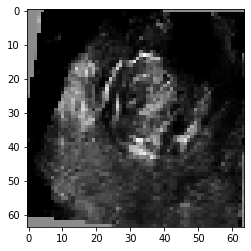

[804/1000] G_loss: 4.615161895751953, D_loss: 0.4646415114402771
Saving checkpoint at epoch :  804
[805/1000][0/13]	Loss_D: 0.4238	Loss_G: 5.1278	D(x): 0.9350	D(G(z)): 0.0255 / 0.0056


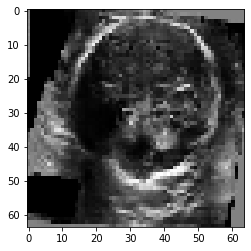

[805/1000] G_loss: 4.448803424835205, D_loss: 0.4258105158805847
[806/1000][0/13]	Loss_D: 0.4147	Loss_G: 4.9544	D(x): 0.8647	D(G(z)): 0.0260 / 0.0093


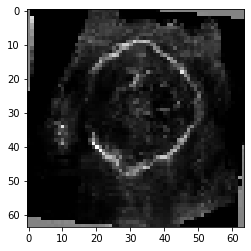

[806/1000] G_loss: 4.513740062713623, D_loss: 0.4500484764575958
[807/1000][0/13]	Loss_D: 0.4071	Loss_G: 4.5539	D(x): 0.8518	D(G(z)): 0.0120 / 0.0138


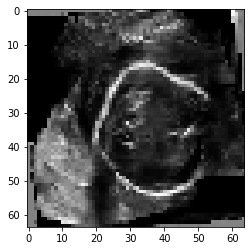

[807/1000] G_loss: 4.416876792907715, D_loss: 0.44019076228141785
[808/1000][0/13]	Loss_D: 0.4418	Loss_G: 4.0272	D(x): 0.9219	D(G(z)): 0.0402 / 0.0167


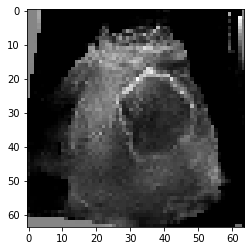

[808/1000] G_loss: 4.5185394287109375, D_loss: 0.44421878457069397
[809/1000][0/13]	Loss_D: 0.4204	Loss_G: 4.1385	D(x): 0.8440	D(G(z)): 0.0162 / 0.0187


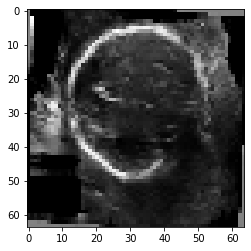

[809/1000] G_loss: 4.412525653839111, D_loss: 0.453494131565094
Saving checkpoint at epoch :  809
[810/1000][0/13]	Loss_D: 0.4527	Loss_G: 3.9117	D(x): 0.8048	D(G(z)): 0.0097 / 0.0219


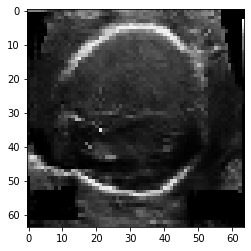

[810/1000] G_loss: 4.214798927307129, D_loss: 0.461015909910202
[811/1000][0/13]	Loss_D: 0.4701	Loss_G: 4.2888	D(x): 0.8971	D(G(z)): 0.0483 / 0.0155


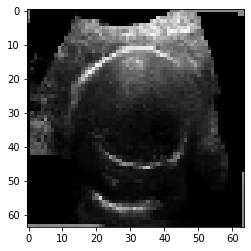

[811/1000] G_loss: 4.338301181793213, D_loss: 0.44208747148513794
[812/1000][0/13]	Loss_D: 0.4529	Loss_G: 3.6251	D(x): 0.7928	D(G(z)): 0.0235 / 0.0351


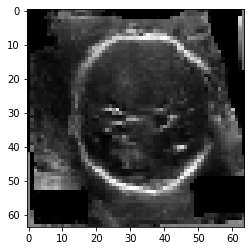

[812/1000] G_loss: 4.469542026519775, D_loss: 0.5716171264648438
[813/1000][0/13]	Loss_D: 0.4492	Loss_G: 3.6340	D(x): 0.8277	D(G(z)): 0.0317 / 0.0339


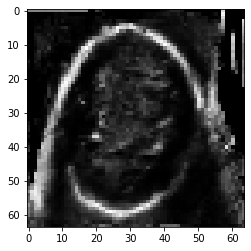

[813/1000] G_loss: 4.4403486251831055, D_loss: 0.5274660587310791
[814/1000][0/13]	Loss_D: 0.5781	Loss_G: 5.3401	D(x): 0.9635	D(G(z)): 0.0904 / 0.0043


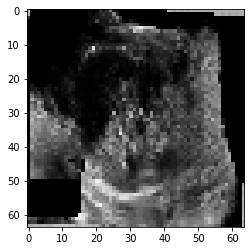

[814/1000] G_loss: 4.115848064422607, D_loss: 0.5022338628768921
Saving checkpoint at epoch :  814
[815/1000][0/13]	Loss_D: 1.5123	Loss_G: 10.0179	D(x): 0.9907	D(G(z)): 0.4976 / 0.0001


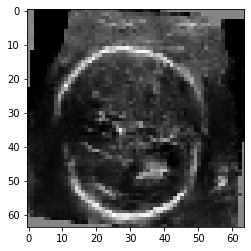

[815/1000] G_loss: 5.211740970611572, D_loss: 0.8739016056060791
[816/1000][0/13]	Loss_D: 0.5719	Loss_G: 3.8873	D(x): 0.8059	D(G(z)): 0.0701 / 0.0223


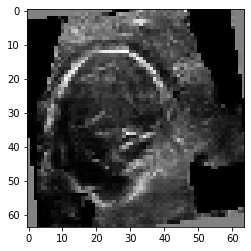

[816/1000] G_loss: 4.273393630981445, D_loss: 0.539313554763794
[817/1000][0/13]	Loss_D: 0.5332	Loss_G: 5.7239	D(x): 0.9227	D(G(z)): 0.1171 / 0.0032


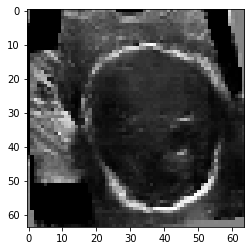

[817/1000] G_loss: 4.521444320678711, D_loss: 0.5129884481430054
[818/1000][0/13]	Loss_D: 0.4939	Loss_G: 4.3415	D(x): 0.8987	D(G(z)): 0.0471 / 0.0162


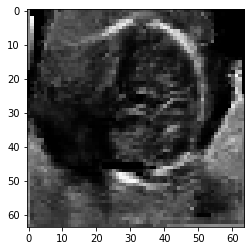

[818/1000] G_loss: 4.426357746124268, D_loss: 0.5612908601760864
[819/1000][0/13]	Loss_D: 0.5914	Loss_G: 4.7684	D(x): 0.9456	D(G(z)): 0.1225 / 0.0078


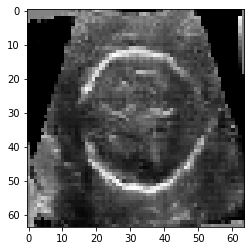

[819/1000] G_loss: 4.367109298706055, D_loss: 0.4893392324447632
Saving checkpoint at epoch :  819
[820/1000][0/13]	Loss_D: 0.4543	Loss_G: 4.8490	D(x): 0.8854	D(G(z)): 0.0435 / 0.0078


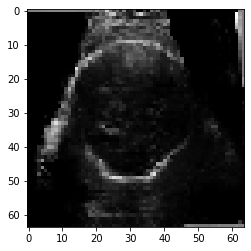

[820/1000] G_loss: 4.22023344039917, D_loss: 0.4703126549720764
[821/1000][0/13]	Loss_D: 0.4148	Loss_G: 4.3193	D(x): 0.9173	D(G(z)): 0.0362 / 0.0119


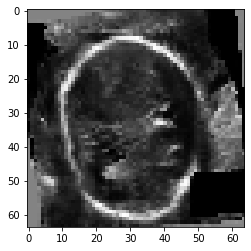

[821/1000] G_loss: 4.112292289733887, D_loss: 0.48092228174209595
[822/1000][0/13]	Loss_D: 0.7552	Loss_G: 6.5319	D(x): 0.9631	D(G(z)): 0.2266 / 0.0013


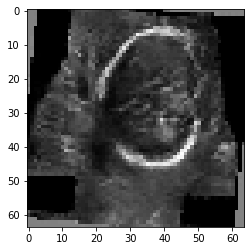

[822/1000] G_loss: 4.631779193878174, D_loss: 0.46945345401763916
[823/1000][0/13]	Loss_D: 0.4336	Loss_G: 4.3992	D(x): 0.8913	D(G(z)): 0.0277 / 0.0138


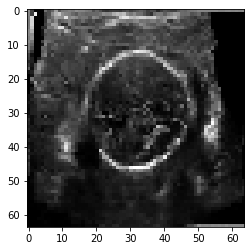

[823/1000] G_loss: 4.1692304611206055, D_loss: 0.4757634997367859
[824/1000][0/13]	Loss_D: 0.4316	Loss_G: 4.5364	D(x): 0.8077	D(G(z)): 0.0137 / 0.0141


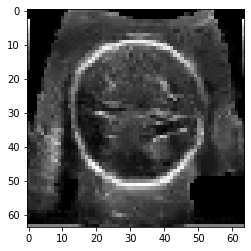

[824/1000] G_loss: 4.3737874031066895, D_loss: 0.45617273449897766
Saving checkpoint at epoch :  824
[825/1000][0/13]	Loss_D: 0.5844	Loss_G: 5.7372	D(x): 0.9508	D(G(z)): 0.1301 / 0.0032


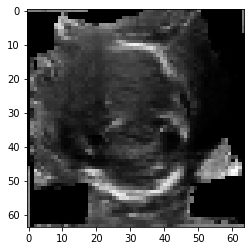

[825/1000] G_loss: 4.36945915222168, D_loss: 0.4799674153327942
[826/1000][0/13]	Loss_D: 0.4788	Loss_G: 3.8902	D(x): 0.8008	D(G(z)): 0.0287 / 0.0257


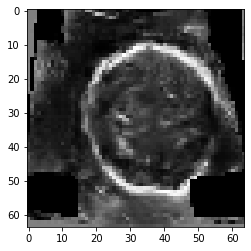

[826/1000] G_loss: 4.35520601272583, D_loss: 0.4847329556941986
[827/1000][0/13]	Loss_D: 0.4954	Loss_G: 4.4504	D(x): 0.7589	D(G(z)): 0.0116 / 0.0191


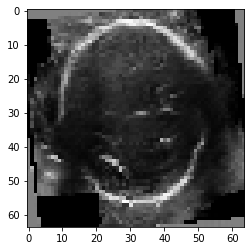

[827/1000] G_loss: 4.437535762786865, D_loss: 0.44613948464393616
[828/1000][0/13]	Loss_D: 0.6338	Loss_G: 2.6098	D(x): 0.6197	D(G(z)): 0.0093 / 0.1167


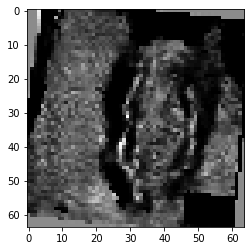

[828/1000] G_loss: 4.181717395782471, D_loss: 0.48032766580581665
[829/1000][0/13]	Loss_D: 0.4509	Loss_G: 3.9842	D(x): 0.8104	D(G(z)): 0.0133 / 0.0242


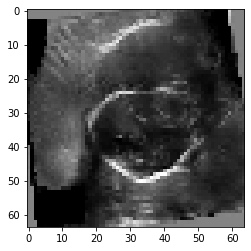

[829/1000] G_loss: 4.3684983253479, D_loss: 0.4669831097126007
Saving checkpoint at epoch :  829
[830/1000][0/13]	Loss_D: 0.4396	Loss_G: 4.4481	D(x): 0.9056	D(G(z)): 0.0430 / 0.0119


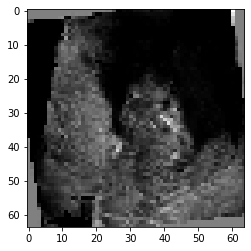

[830/1000] G_loss: 4.323896884918213, D_loss: 0.43766161799430847
[831/1000][0/13]	Loss_D: 0.4190	Loss_G: 4.5528	D(x): 0.8984	D(G(z)): 0.0255 / 0.0118


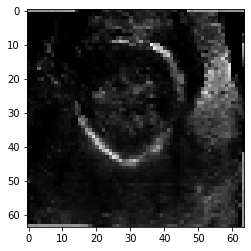

[831/1000] G_loss: 4.368683338165283, D_loss: 0.44672995805740356
[832/1000][0/13]	Loss_D: 0.4228	Loss_G: 4.6523	D(x): 0.9391	D(G(z)): 0.0358 / 0.0090


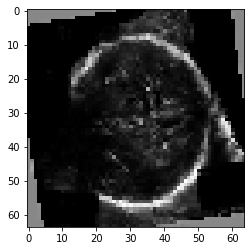

[832/1000] G_loss: 4.216343879699707, D_loss: 0.43133214116096497
[833/1000][0/13]	Loss_D: 0.5086	Loss_G: 5.2767	D(x): 0.9307	D(G(z)): 0.0879 / 0.0047


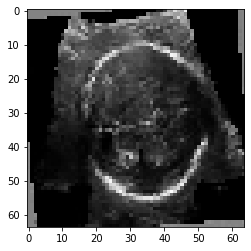

[833/1000] G_loss: 4.4327712059021, D_loss: 0.46786022186279297
[834/1000][0/13]	Loss_D: 0.4395	Loss_G: 4.6403	D(x): 0.9172	D(G(z)): 0.0578 / 0.0111


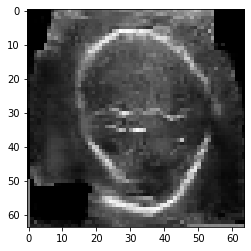

[834/1000] G_loss: 4.521998882293701, D_loss: 0.4728645980358124
Saving checkpoint at epoch :  834
[835/1000][0/13]	Loss_D: 0.4107	Loss_G: 4.6177	D(x): 0.9037	D(G(z)): 0.0181 / 0.0109


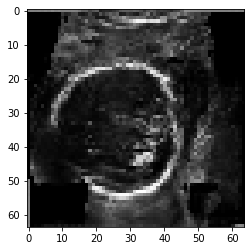

[835/1000] G_loss: 4.277782917022705, D_loss: 0.4469341039657593
[836/1000][0/13]	Loss_D: 0.4056	Loss_G: 4.9419	D(x): 0.9145	D(G(z)): 0.0330 / 0.0068


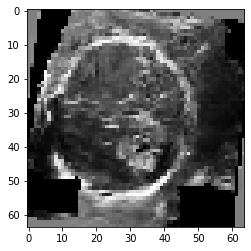

[836/1000] G_loss: 4.418318748474121, D_loss: 0.4503781497478485
[837/1000][0/13]	Loss_D: 0.3967	Loss_G: 4.5878	D(x): 0.9073	D(G(z)): 0.0229 / 0.0100


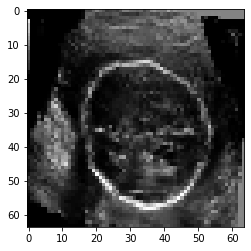

[837/1000] G_loss: 4.354813098907471, D_loss: 0.41836240887641907
[838/1000][0/13]	Loss_D: 0.4468	Loss_G: 4.4624	D(x): 0.9023	D(G(z)): 0.0509 / 0.0111


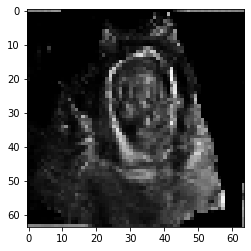

[838/1000] G_loss: 4.394089221954346, D_loss: 0.4950568377971649
[839/1000][0/13]	Loss_D: 0.4974	Loss_G: 5.8994	D(x): 0.9467	D(G(z)): 0.0582 / 0.0030


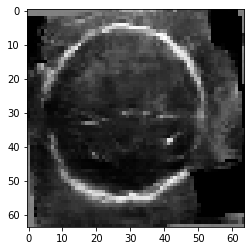

[839/1000] G_loss: 4.434257984161377, D_loss: 0.4636812210083008
Saving checkpoint at epoch :  839
[840/1000][0/13]	Loss_D: 0.4276	Loss_G: 4.6012	D(x): 0.8929	D(G(z)): 0.0308 / 0.0099


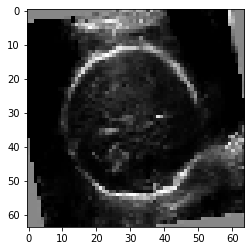

[840/1000] G_loss: 4.284083843231201, D_loss: 0.42747262120246887
[841/1000][0/13]	Loss_D: 0.4086	Loss_G: 5.0771	D(x): 0.9368	D(G(z)): 0.0196 / 0.0056


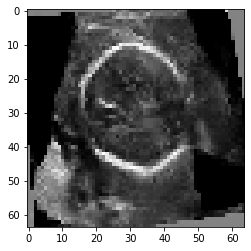

[841/1000] G_loss: 4.156224727630615, D_loss: 0.43321144580841064
[842/1000][0/13]	Loss_D: 0.5528	Loss_G: 4.9066	D(x): 0.9455	D(G(z)): 0.1163 / 0.0106


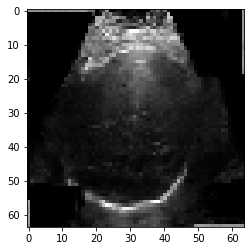

[842/1000] G_loss: 4.530323505401611, D_loss: 0.4613705277442932
[843/1000][0/13]	Loss_D: 0.4278	Loss_G: 5.1093	D(x): 0.8787	D(G(z)): 0.0266 / 0.0056


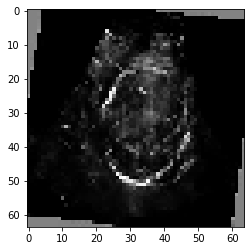

[843/1000] G_loss: 4.50631046295166, D_loss: 0.4189434349536896
[844/1000][0/13]	Loss_D: 0.4164	Loss_G: 4.9398	D(x): 0.9270	D(G(z)): 0.0269 / 0.0060


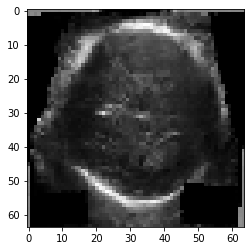

[844/1000] G_loss: 4.207049369812012, D_loss: 0.45403268933296204
Saving checkpoint at epoch :  844
[845/1000][0/13]	Loss_D: 0.5965	Loss_G: 4.8662	D(x): 0.9825	D(G(z)): 0.0958 / 0.0059


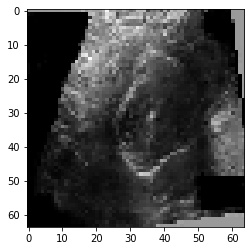

[845/1000] G_loss: 4.59303092956543, D_loss: 0.5003038048744202
[846/1000][0/13]	Loss_D: 0.4395	Loss_G: 3.6601	D(x): 0.8683	D(G(z)): 0.0409 / 0.0287


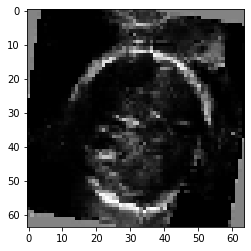

[846/1000] G_loss: 4.423328876495361, D_loss: 0.46143829822540283
[847/1000][0/13]	Loss_D: 0.4330	Loss_G: 4.0736	D(x): 0.8510	D(G(z)): 0.0268 / 0.0207


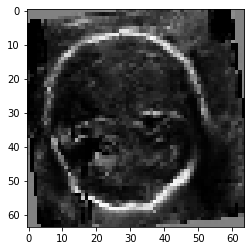

[847/1000] G_loss: 4.282959461212158, D_loss: 0.42453426122665405
[848/1000][0/13]	Loss_D: 0.3886	Loss_G: 4.4109	D(x): 0.9110	D(G(z)): 0.0292 / 0.0116


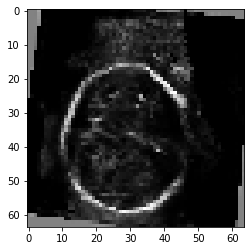

[848/1000] G_loss: 4.314601421356201, D_loss: 0.4176250100135803
[849/1000][0/13]	Loss_D: 0.4502	Loss_G: 3.3125	D(x): 0.7904	D(G(z)): 0.0111 / 0.0473


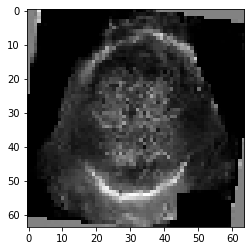

[849/1000] G_loss: 4.482609748840332, D_loss: 0.49921733140945435
Saving checkpoint at epoch :  849
[850/1000][0/13]	Loss_D: 0.4320	Loss_G: 5.1244	D(x): 0.8880	D(G(z)): 0.0211 / 0.0059


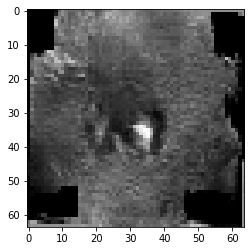

[850/1000] G_loss: 4.324954509735107, D_loss: 0.4432266056537628
[851/1000][0/13]	Loss_D: 0.5020	Loss_G: 4.5801	D(x): 0.9296	D(G(z)): 0.0639 / 0.0084


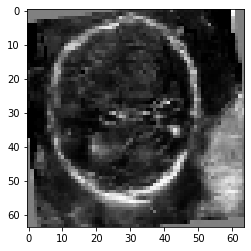

[851/1000] G_loss: 4.307711601257324, D_loss: 0.4553540050983429
[852/1000][0/13]	Loss_D: 0.4738	Loss_G: 4.0711	D(x): 0.8610	D(G(z)): 0.0507 / 0.0165


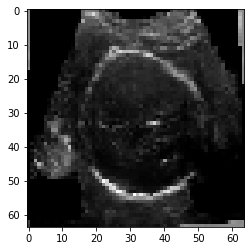

[852/1000] G_loss: 4.391790390014648, D_loss: 0.44312840700149536
[853/1000][0/13]	Loss_D: 0.5765	Loss_G: 5.0281	D(x): 0.9719	D(G(z)): 0.0977 / 0.0068


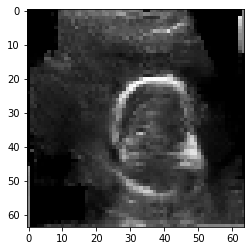

[853/1000] G_loss: 4.459969997406006, D_loss: 0.4489808678627014
[854/1000][0/13]	Loss_D: 0.4407	Loss_G: 4.0225	D(x): 0.8558	D(G(z)): 0.0250 / 0.0194


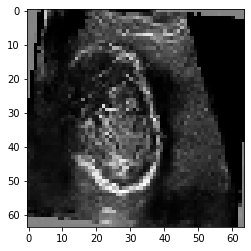

[854/1000] G_loss: 4.516810417175293, D_loss: 0.5567017793655396
Saving checkpoint at epoch :  854
[855/1000][0/13]	Loss_D: 0.5098	Loss_G: 4.2799	D(x): 0.9431	D(G(z)): 0.0576 / 0.0175


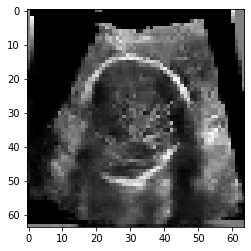

[855/1000] G_loss: 4.351964473724365, D_loss: 0.49160459637641907
[856/1000][0/13]	Loss_D: 0.4228	Loss_G: 4.3497	D(x): 0.8621	D(G(z)): 0.0218 / 0.0135


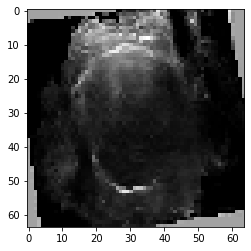

[856/1000] G_loss: 4.434903621673584, D_loss: 0.47204744815826416
[857/1000][0/13]	Loss_D: 0.5143	Loss_G: 3.9216	D(x): 0.7276	D(G(z)): 0.0056 / 0.0237


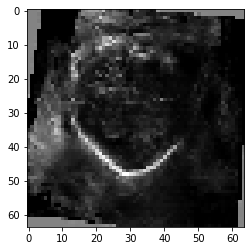

[857/1000] G_loss: 4.298085689544678, D_loss: 0.45034852623939514
[858/1000][0/13]	Loss_D: 0.4370	Loss_G: 4.5987	D(x): 0.8685	D(G(z)): 0.0390 / 0.0104


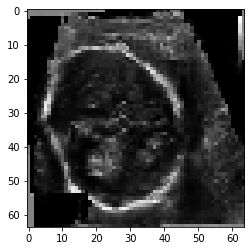

[858/1000] G_loss: 4.453342914581299, D_loss: 0.4604964554309845
[859/1000][0/13]	Loss_D: 0.4586	Loss_G: 4.7020	D(x): 0.9522	D(G(z)): 0.0614 / 0.0101


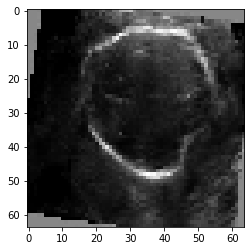

[859/1000] G_loss: 4.489380836486816, D_loss: 0.4622456729412079
Saving checkpoint at epoch :  859
[860/1000][0/13]	Loss_D: 0.4150	Loss_G: 4.6286	D(x): 0.8597	D(G(z)): 0.0159 / 0.0110


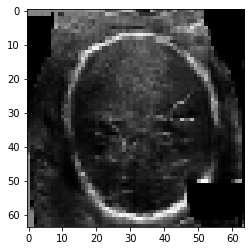

[860/1000] G_loss: 4.250645637512207, D_loss: 0.43502917885780334
[861/1000][0/13]	Loss_D: 0.3958	Loss_G: 4.8452	D(x): 0.8987	D(G(z)): 0.0239 / 0.0067


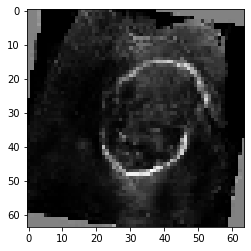

[861/1000] G_loss: 4.332568168640137, D_loss: 0.43730756640434265
[862/1000][0/13]	Loss_D: 0.4266	Loss_G: 4.8765	D(x): 0.9216	D(G(z)): 0.0390 / 0.0071


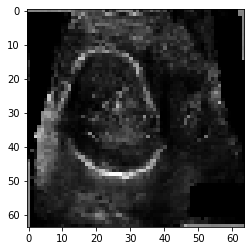

[862/1000] G_loss: 4.293008804321289, D_loss: 0.4290233850479126
[863/1000][0/13]	Loss_D: 0.4195	Loss_G: 5.1518	D(x): 0.9061	D(G(z)): 0.0208 / 0.0052


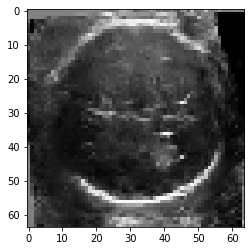

[863/1000] G_loss: 4.382188320159912, D_loss: 0.4740754961967468
[864/1000][0/13]	Loss_D: 0.4729	Loss_G: 4.7662	D(x): 0.9446	D(G(z)): 0.0450 / 0.0102


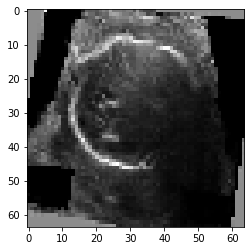

[864/1000] G_loss: 4.422093391418457, D_loss: 0.4295010268688202
Saving checkpoint at epoch :  864
[865/1000][0/13]	Loss_D: 0.4398	Loss_G: 4.1834	D(x): 0.8761	D(G(z)): 0.0416 / 0.0139


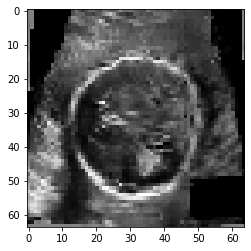

[865/1000] G_loss: 4.413493633270264, D_loss: 0.448320209980011
[866/1000][0/13]	Loss_D: 0.4314	Loss_G: 5.2745	D(x): 0.9164	D(G(z)): 0.0336 / 0.0049


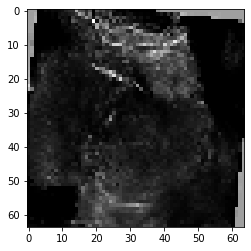

[866/1000] G_loss: 4.273249626159668, D_loss: 0.4611172676086426
[867/1000][0/13]	Loss_D: 0.5808	Loss_G: 4.5602	D(x): 0.9545	D(G(z)): 0.1182 / 0.0085


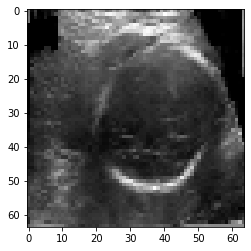

[867/1000] G_loss: 4.933555603027344, D_loss: 0.9476878643035889
[868/1000][0/13]	Loss_D: 0.5655	Loss_G: 5.7891	D(x): 0.9128	D(G(z)): 0.0954 / 0.0030


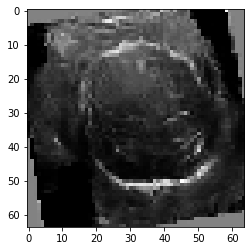

[868/1000] G_loss: 4.805100440979004, D_loss: 0.6970642805099487
[869/1000][0/13]	Loss_D: 0.6110	Loss_G: 4.5802	D(x): 0.8517	D(G(z)): 0.1014 / 0.0122


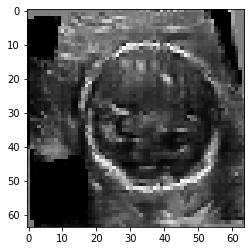

[869/1000] G_loss: 4.422519683837891, D_loss: 0.5212034583091736
Saving checkpoint at epoch :  869
[870/1000][0/13]	Loss_D: 0.4861	Loss_G: 4.0824	D(x): 0.8516	D(G(z)): 0.0630 / 0.0181


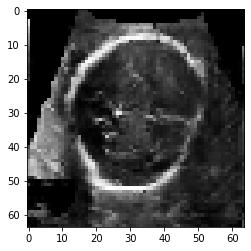

[870/1000] G_loss: 4.383584022521973, D_loss: 0.5045843124389648
[871/1000][0/13]	Loss_D: 0.5174	Loss_G: 5.3068	D(x): 0.9046	D(G(z)): 0.0974 / 0.0063


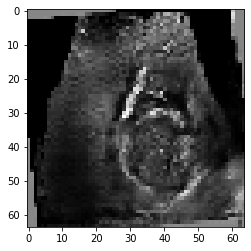

[871/1000] G_loss: 4.437996864318848, D_loss: 0.5158395171165466
[872/1000][0/13]	Loss_D: 0.5227	Loss_G: 3.7121	D(x): 0.7301	D(G(z)): 0.0122 / 0.0395


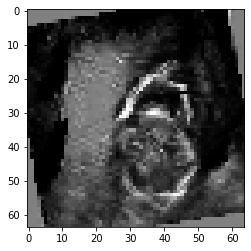

[872/1000] G_loss: 4.243231773376465, D_loss: 0.4893040657043457
[873/1000][0/13]	Loss_D: 0.4861	Loss_G: 4.7246	D(x): 0.8944	D(G(z)): 0.0477 / 0.0100


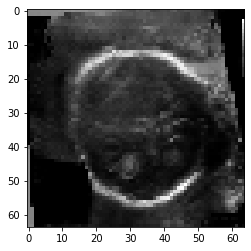

[873/1000] G_loss: 4.322919845581055, D_loss: 0.4713437259197235
[874/1000][0/13]	Loss_D: 0.5242	Loss_G: 4.7065	D(x): 0.9484	D(G(z)): 0.0876 / 0.0084


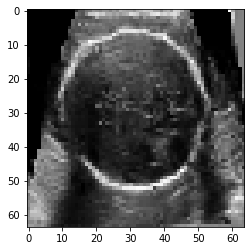

[874/1000] G_loss: 4.436577320098877, D_loss: 0.5087393522262573
Saving checkpoint at epoch :  874
[875/1000][0/13]	Loss_D: 0.5336	Loss_G: 3.7859	D(x): 0.7086	D(G(z)): 0.0109 / 0.0293


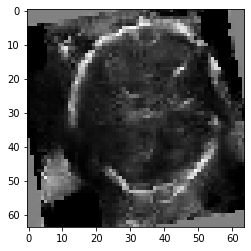

[875/1000] G_loss: 4.205345153808594, D_loss: 0.45209360122680664
[876/1000][0/13]	Loss_D: 0.4108	Loss_G: 4.7972	D(x): 0.9059	D(G(z)): 0.0252 / 0.0089


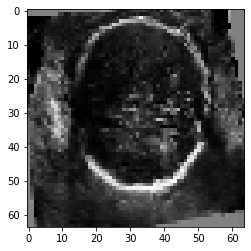

[876/1000] G_loss: 4.252547740936279, D_loss: 0.43574443459510803
[877/1000][0/13]	Loss_D: 0.3986	Loss_G: 4.5935	D(x): 0.8616	D(G(z)): 0.0164 / 0.0104


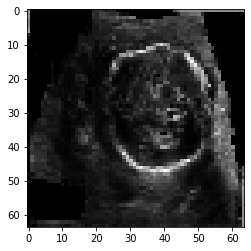

[877/1000] G_loss: 4.311598300933838, D_loss: 0.4536672830581665
[878/1000][0/13]	Loss_D: 0.4404	Loss_G: 4.6273	D(x): 0.8344	D(G(z)): 0.0231 / 0.0106


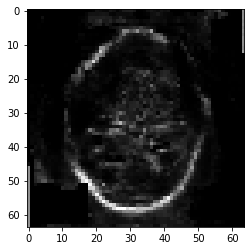

[878/1000] G_loss: 4.368492603302002, D_loss: 0.4399643540382385
[879/1000][0/13]	Loss_D: 0.4822	Loss_G: 4.6015	D(x): 0.9499	D(G(z)): 0.0783 / 0.0088


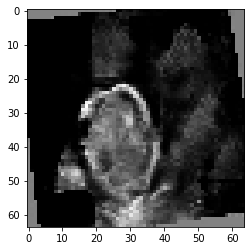

[879/1000] G_loss: 4.245939254760742, D_loss: 0.4435979723930359
Saving checkpoint at epoch :  879
[880/1000][0/13]	Loss_D: 0.4207	Loss_G: 4.6754	D(x): 0.9030	D(G(z)): 0.0486 / 0.0079


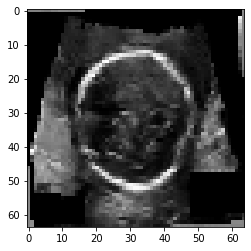

[880/1000] G_loss: 4.325414657592773, D_loss: 0.44064944982528687
[881/1000][0/13]	Loss_D: 0.3983	Loss_G: 4.8078	D(x): 0.9004	D(G(z)): 0.0113 / 0.0077


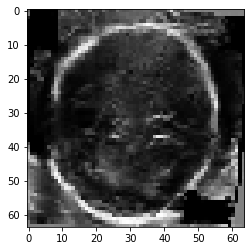

[881/1000] G_loss: 4.217841148376465, D_loss: 0.43376511335372925
[882/1000][0/13]	Loss_D: 0.4270	Loss_G: 4.3997	D(x): 0.8903	D(G(z)): 0.0369 / 0.0105


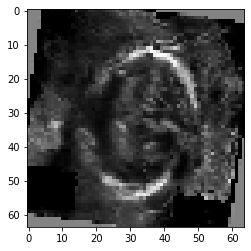

[882/1000] G_loss: 4.233974933624268, D_loss: 0.42701455950737
[883/1000][0/13]	Loss_D: 0.4158	Loss_G: 4.8940	D(x): 0.9314	D(G(z)): 0.0329 / 0.0077


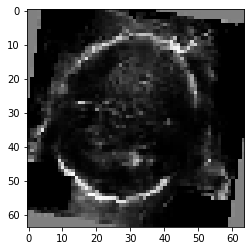

[883/1000] G_loss: 4.345126152038574, D_loss: 0.4283948540687561
[884/1000][0/13]	Loss_D: 0.4198	Loss_G: 4.8125	D(x): 0.9003	D(G(z)): 0.0386 / 0.0092


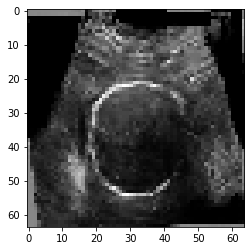

[884/1000] G_loss: 4.285974502563477, D_loss: 0.4269862473011017
Saving checkpoint at epoch :  884
[885/1000][0/13]	Loss_D: 0.3940	Loss_G: 4.9449	D(x): 0.8971	D(G(z)): 0.0106 / 0.0065


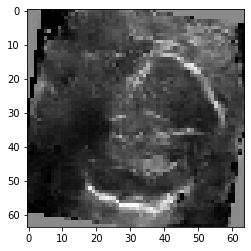

[885/1000] G_loss: 4.269720077514648, D_loss: 0.4522283971309662
[886/1000][0/13]	Loss_D: 0.4215	Loss_G: 4.6817	D(x): 0.9346	D(G(z)): 0.0445 / 0.0077


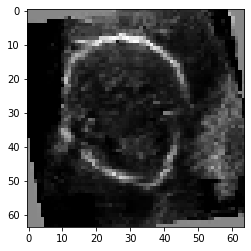

[886/1000] G_loss: 4.43870210647583, D_loss: 0.5017749071121216
[887/1000][0/13]	Loss_D: 0.5496	Loss_G: 6.3331	D(x): 0.9708	D(G(z)): 0.0740 / 0.0020


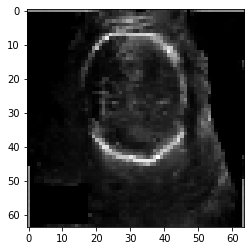

[887/1000] G_loss: 4.559887886047363, D_loss: 0.5696102976799011
[888/1000][0/13]	Loss_D: 0.4415	Loss_G: 4.3283	D(x): 0.8601	D(G(z)): 0.0307 / 0.0131


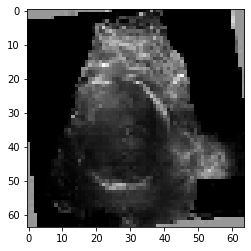

[888/1000] G_loss: 4.293282985687256, D_loss: 0.44744426012039185
[889/1000][0/13]	Loss_D: 0.4976	Loss_G: 3.6708	D(x): 0.7580	D(G(z)): 0.0089 / 0.0331


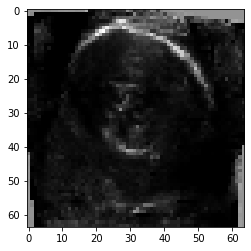

[889/1000] G_loss: 4.303462505340576, D_loss: 0.44027772545814514
Saving checkpoint at epoch :  889
[890/1000][0/13]	Loss_D: 0.4360	Loss_G: 4.3525	D(x): 0.8208	D(G(z)): 0.0219 / 0.0134


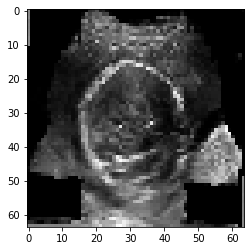

[890/1000] G_loss: 4.2498087882995605, D_loss: 0.42499998211860657
[891/1000][0/13]	Loss_D: 0.4699	Loss_G: 2.7430	D(x): 0.7687	D(G(z)): 0.0231 / 0.0689


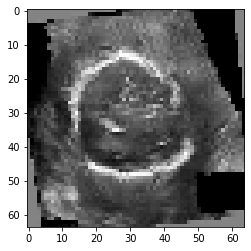

[891/1000] G_loss: 4.278946876525879, D_loss: 0.42985862493515015
[892/1000][0/13]	Loss_D: 0.4323	Loss_G: 4.7197	D(x): 0.9398	D(G(z)): 0.0426 / 0.0085


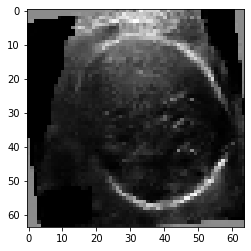

[892/1000] G_loss: 4.447073936462402, D_loss: 0.43842613697052
[893/1000][0/13]	Loss_D: 0.4034	Loss_G: 4.5740	D(x): 0.8278	D(G(z)): 0.0133 / 0.0103


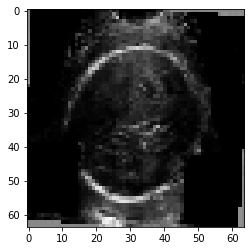

[893/1000] G_loss: 4.2163567543029785, D_loss: 0.42423301935195923
[894/1000][0/13]	Loss_D: 0.3925	Loss_G: 4.6719	D(x): 0.8747	D(G(z)): 0.0138 / 0.0108


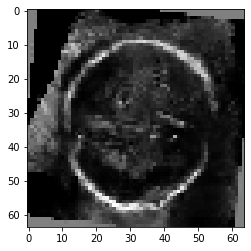

[894/1000] G_loss: 4.364020347595215, D_loss: 0.4154081642627716
Saving checkpoint at epoch :  894
[895/1000][0/13]	Loss_D: 0.4252	Loss_G: 4.7261	D(x): 0.9166	D(G(z)): 0.0318 / 0.0089


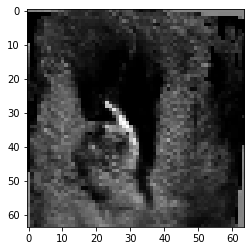

[895/1000] G_loss: 4.265531063079834, D_loss: 0.43305885791778564
[896/1000][0/13]	Loss_D: 0.6303	Loss_G: 5.6237	D(x): 0.9765	D(G(z)): 0.1449 / 0.0031


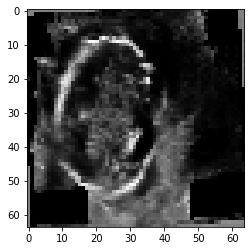

[896/1000] G_loss: 4.504397869110107, D_loss: 0.43855154514312744
[897/1000][0/13]	Loss_D: 0.4056	Loss_G: 5.2446	D(x): 0.9219	D(G(z)): 0.0222 / 0.0051


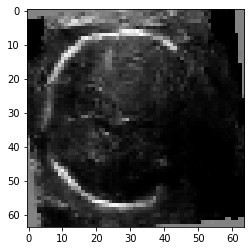

[897/1000] G_loss: 4.331487655639648, D_loss: 0.42400118708610535
[898/1000][0/13]	Loss_D: 0.4134	Loss_G: 5.0236	D(x): 0.9290	D(G(z)): 0.0292 / 0.0059


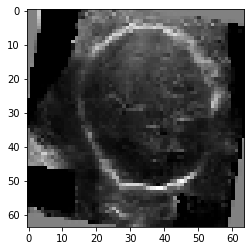

[898/1000] G_loss: 4.316035747528076, D_loss: 0.41371873021125793
[899/1000][0/13]	Loss_D: 0.4021	Loss_G: 4.5871	D(x): 0.8954	D(G(z)): 0.0261 / 0.0091


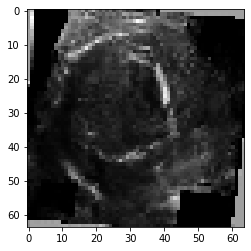

[899/1000] G_loss: 4.3393874168396, D_loss: 0.4345379173755646
Saving checkpoint at epoch :  899
[900/1000][0/13]	Loss_D: 0.4540	Loss_G: 4.7347	D(x): 0.9561	D(G(z)): 0.0479 / 0.0080


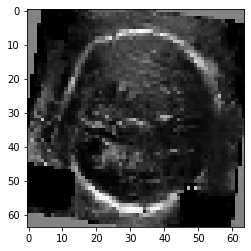

[900/1000] G_loss: 4.439612865447998, D_loss: 0.41920438408851624
[901/1000][0/13]	Loss_D: 0.5218	Loss_G: 4.2349	D(x): 0.8783	D(G(z)): 0.0950 / 0.0139


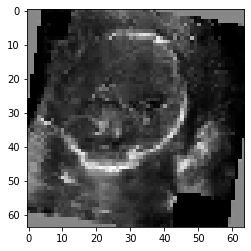

[901/1000] G_loss: 4.55049467086792, D_loss: 0.423585444688797
[902/1000][0/13]	Loss_D: 0.4574	Loss_G: 4.3133	D(x): 0.9151	D(G(z)): 0.0593 / 0.0121


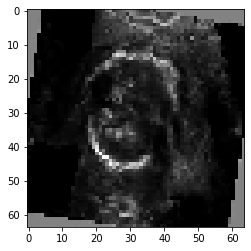

[902/1000] G_loss: 4.407516956329346, D_loss: 0.4069007635116577
[903/1000][0/13]	Loss_D: 0.3846	Loss_G: 4.5682	D(x): 0.8802	D(G(z)): 0.0171 / 0.0099


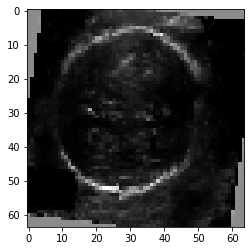

[903/1000] G_loss: 4.447328567504883, D_loss: 0.39153602719306946
[904/1000][0/13]	Loss_D: 0.3681	Loss_G: 4.6329	D(x): 0.8747	D(G(z)): 0.0095 / 0.0102


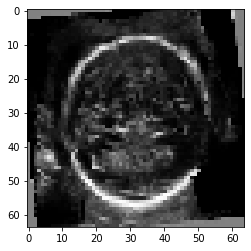

[904/1000] G_loss: 4.385515213012695, D_loss: 0.43624356389045715
Saving checkpoint at epoch :  904
[905/1000][0/13]	Loss_D: 0.3949	Loss_G: 5.0907	D(x): 0.8603	D(G(z)): 0.0174 / 0.0087


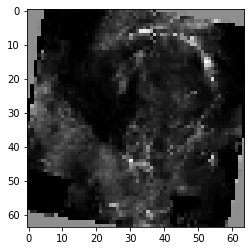

[905/1000] G_loss: 4.671422958374023, D_loss: 0.456869900226593
[906/1000][0/13]	Loss_D: 0.4801	Loss_G: 5.7716	D(x): 0.8300	D(G(z)): 0.0169 / 0.0053


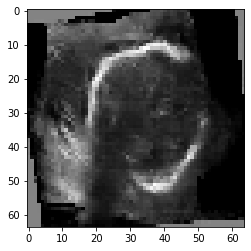

[906/1000] G_loss: 4.425323009490967, D_loss: 0.43897488713264465
[907/1000][0/13]	Loss_D: 0.4542	Loss_G: 4.8654	D(x): 0.9590	D(G(z)): 0.0406 / 0.0067


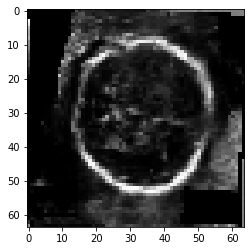

[907/1000] G_loss: 4.739684581756592, D_loss: 0.6410548686981201
[908/1000][0/13]	Loss_D: 0.4496	Loss_G: 4.8364	D(x): 0.9040	D(G(z)): 0.0435 / 0.0088


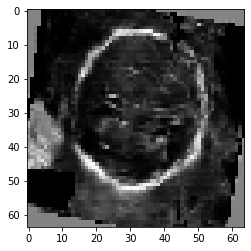

[908/1000] G_loss: 4.373464584350586, D_loss: 0.47225651144981384
[909/1000][0/13]	Loss_D: 0.4220	Loss_G: 4.4132	D(x): 0.9223	D(G(z)): 0.0260 / 0.0118


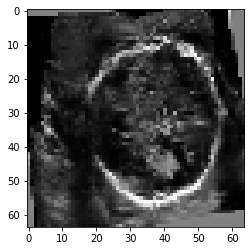

[909/1000] G_loss: 4.482101917266846, D_loss: 0.4635765254497528
Saving checkpoint at epoch :  909
[910/1000][0/13]	Loss_D: 0.4432	Loss_G: 5.1771	D(x): 0.9329	D(G(z)): 0.0359 / 0.0059


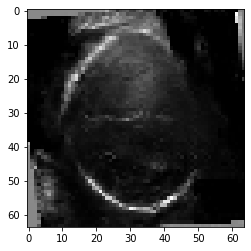

[910/1000] G_loss: 4.518453598022461, D_loss: 0.43397441506385803
[911/1000][0/13]	Loss_D: 0.3999	Loss_G: 4.2895	D(x): 0.8329	D(G(z)): 0.0172 / 0.0152


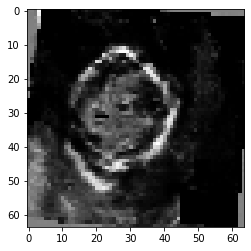

[911/1000] G_loss: 4.23774528503418, D_loss: 0.42699214816093445
[912/1000][0/13]	Loss_D: 0.6486	Loss_G: 5.4925	D(x): 0.9820	D(G(z)): 0.1414 / 0.0035


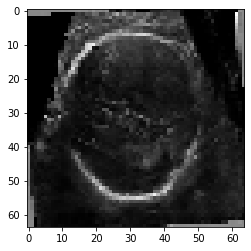

[912/1000] G_loss: 4.626734256744385, D_loss: 0.5222686529159546
[913/1000][0/13]	Loss_D: 0.4922	Loss_G: 4.8178	D(x): 0.8423	D(G(z)): 0.0483 / 0.0083


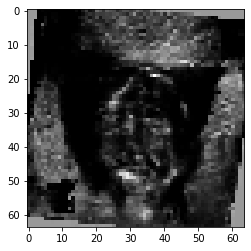

[913/1000] G_loss: 4.35536003112793, D_loss: 0.45080649852752686
[914/1000][0/13]	Loss_D: 0.3953	Loss_G: 4.9709	D(x): 0.9048	D(G(z)): 0.0215 / 0.0073


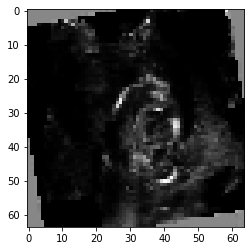

[914/1000] G_loss: 4.2898736000061035, D_loss: 0.41243642568588257
Saving checkpoint at epoch :  914
[915/1000][0/13]	Loss_D: 0.5208	Loss_G: 5.7232	D(x): 0.9550	D(G(z)): 0.0919 / 0.0034


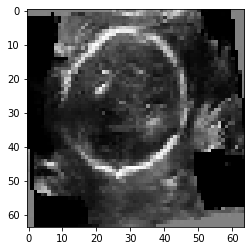

[915/1000] G_loss: 4.5174174308776855, D_loss: 0.4285424053668976
[916/1000][0/13]	Loss_D: 0.4849	Loss_G: 4.6553	D(x): 0.9318	D(G(z)): 0.0712 / 0.0081


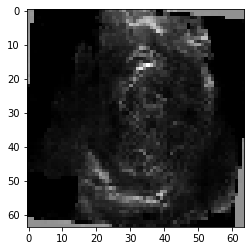

[916/1000] G_loss: 4.653926372528076, D_loss: 0.4725973308086395
[917/1000][0/13]	Loss_D: 0.4299	Loss_G: 4.2885	D(x): 0.8861	D(G(z)): 0.0337 / 0.0123


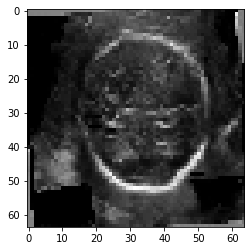

[917/1000] G_loss: 4.350499629974365, D_loss: 0.424770325422287
[918/1000][0/13]	Loss_D: 0.3915	Loss_G: 5.4449	D(x): 0.9125	D(G(z)): 0.0163 / 0.0040


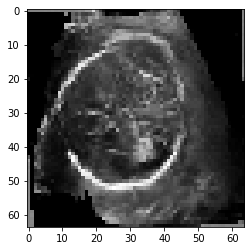

[918/1000] G_loss: 4.4733686447143555, D_loss: 0.4242900013923645
[919/1000][0/13]	Loss_D: 0.4322	Loss_G: 4.6160	D(x): 0.9496	D(G(z)): 0.0401 / 0.0098


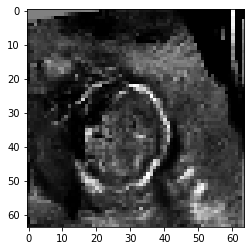

[919/1000] G_loss: 4.515552997589111, D_loss: 0.46811002492904663
Saving checkpoint at epoch :  919
[920/1000][0/13]	Loss_D: 0.4628	Loss_G: 3.8253	D(x): 0.8071	D(G(z)): 0.0131 / 0.0288


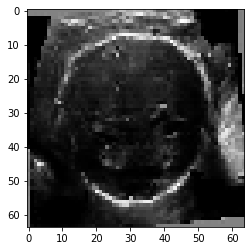

[920/1000] G_loss: 4.4049763679504395, D_loss: 0.42411237955093384
[921/1000][0/13]	Loss_D: 0.4584	Loss_G: 3.8219	D(x): 0.8701	D(G(z)): 0.0595 / 0.0221


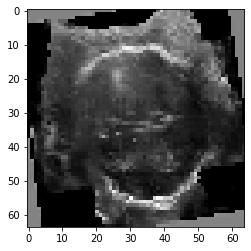

[921/1000] G_loss: 4.382532596588135, D_loss: 0.4342382252216339
[922/1000][0/13]	Loss_D: 0.4018	Loss_G: 4.5150	D(x): 0.9129	D(G(z)): 0.0235 / 0.0100


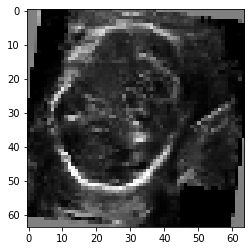

[922/1000] G_loss: 4.522858619689941, D_loss: 0.41260308027267456
[923/1000][0/13]	Loss_D: 0.4492	Loss_G: 4.3608	D(x): 0.7863	D(G(z)): 0.0054 / 0.0144


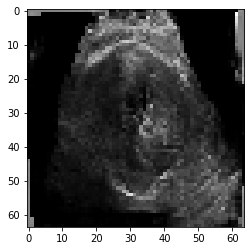

[923/1000] G_loss: 4.302405834197998, D_loss: 0.4397316575050354
[924/1000][0/13]	Loss_D: 0.4184	Loss_G: 5.1456	D(x): 0.8714	D(G(z)): 0.0152 / 0.0054


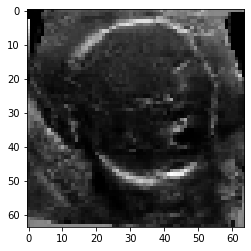

[924/1000] G_loss: 4.478822708129883, D_loss: 0.4239625334739685
Saving checkpoint at epoch :  924
[925/1000][0/13]	Loss_D: 0.4196	Loss_G: 4.5168	D(x): 0.9059	D(G(z)): 0.0345 / 0.0100


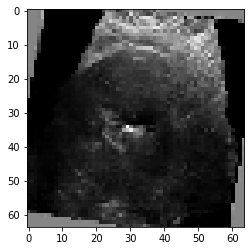

[925/1000] G_loss: 4.3198676109313965, D_loss: 0.463580459356308
[926/1000][0/13]	Loss_D: 0.4772	Loss_G: 5.9037	D(x): 0.8837	D(G(z)): 0.0574 / 0.0034


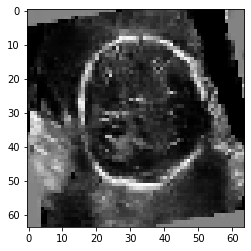

[926/1000] G_loss: 4.448903560638428, D_loss: 0.47827866673469543
[927/1000][0/13]	Loss_D: 0.4141	Loss_G: 5.0779	D(x): 0.9121	D(G(z)): 0.0226 / 0.0058


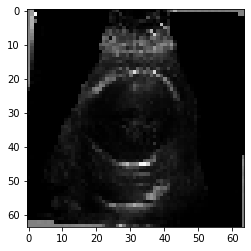

[927/1000] G_loss: 4.335628032684326, D_loss: 0.4255768358707428
[928/1000][0/13]	Loss_D: 0.4509	Loss_G: 4.7500	D(x): 0.9538	D(G(z)): 0.0469 / 0.0075


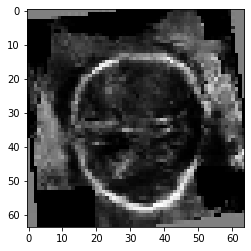

[928/1000] G_loss: 4.40693998336792, D_loss: 0.420057088136673
[929/1000][0/13]	Loss_D: 0.4336	Loss_G: 4.2257	D(x): 0.9267	D(G(z)): 0.0532 / 0.0147


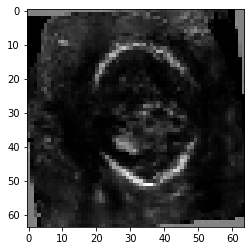

[929/1000] G_loss: 4.431763172149658, D_loss: 0.4248741567134857
Saving checkpoint at epoch :  929
[930/1000][0/13]	Loss_D: 0.4381	Loss_G: 3.6628	D(x): 0.8433	D(G(z)): 0.0289 / 0.0314


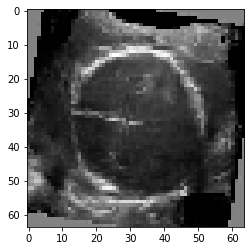

[930/1000] G_loss: 4.426848411560059, D_loss: 0.428811252117157
[931/1000][0/13]	Loss_D: 0.4044	Loss_G: 3.9535	D(x): 0.8456	D(G(z)): 0.0183 / 0.0212


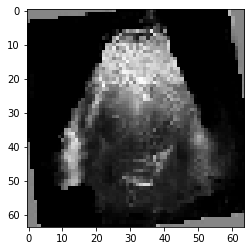

[931/1000] G_loss: 4.34333610534668, D_loss: 0.4344846308231354
[932/1000][0/13]	Loss_D: 0.4132	Loss_G: 4.7582	D(x): 0.8949	D(G(z)): 0.0241 / 0.0099


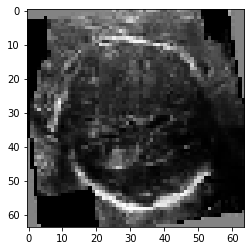

[932/1000] G_loss: 4.545505046844482, D_loss: 0.42180654406547546
[933/1000][0/13]	Loss_D: 0.4751	Loss_G: 3.3606	D(x): 0.7486	D(G(z)): 0.0092 / 0.0357


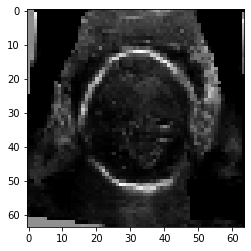

[933/1000] G_loss: 4.22888708114624, D_loss: 0.45539939403533936
[934/1000][0/13]	Loss_D: 1.0676	Loss_G: 8.1503	D(x): 0.9887	D(G(z)): 0.3395 / 0.0004


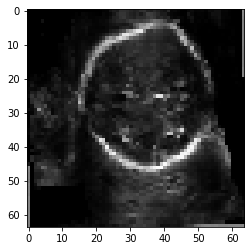

[934/1000] G_loss: 4.7762956619262695, D_loss: 0.6628614068031311
Saving checkpoint at epoch :  934
[935/1000][0/13]	Loss_D: 0.8080	Loss_G: 6.3005	D(x): 0.9736	D(G(z)): 0.2021 / 0.0021


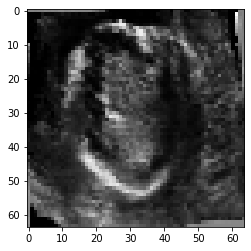

[935/1000] G_loss: 4.62013578414917, D_loss: 0.5315130949020386
[936/1000][0/13]	Loss_D: 0.4523	Loss_G: 4.3379	D(x): 0.9351	D(G(z)): 0.0519 / 0.0130


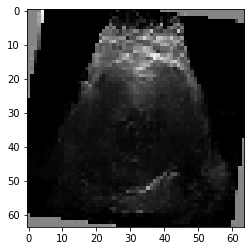

[936/1000] G_loss: 4.402187824249268, D_loss: 0.46194955706596375
[937/1000][0/13]	Loss_D: 0.4359	Loss_G: 4.4622	D(x): 0.8414	D(G(z)): 0.0213 / 0.0139


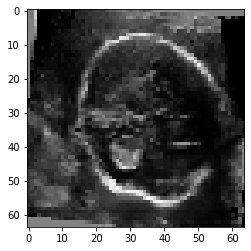

[937/1000] G_loss: 4.4154863357543945, D_loss: 0.4925925135612488
[938/1000][0/13]	Loss_D: 0.4277	Loss_G: 4.8549	D(x): 0.8984	D(G(z)): 0.0436 / 0.0093


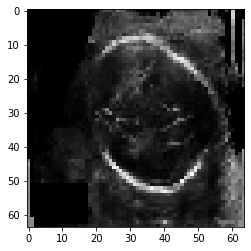

[938/1000] G_loss: 4.429936408996582, D_loss: 0.432893306016922
[939/1000][0/13]	Loss_D: 0.5315	Loss_G: 3.0056	D(x): 0.7199	D(G(z)): 0.0090 / 0.0629


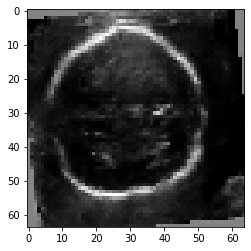

[939/1000] G_loss: 4.441643238067627, D_loss: 0.4677007794380188
Saving checkpoint at epoch :  939
[940/1000][0/13]	Loss_D: 0.4090	Loss_G: 3.9650	D(x): 0.8923	D(G(z)): 0.0321 / 0.0196


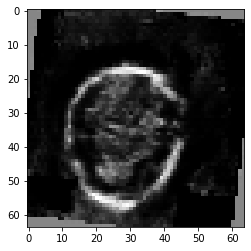

[940/1000] G_loss: 4.378510475158691, D_loss: 0.42249393463134766
[941/1000][0/13]	Loss_D: 0.4269	Loss_G: 4.1823	D(x): 0.8721	D(G(z)): 0.0216 / 0.0142


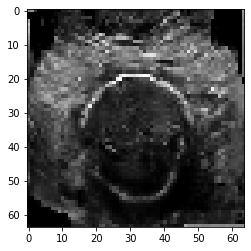

[941/1000] G_loss: 4.338598251342773, D_loss: 0.43224093317985535
[942/1000][0/13]	Loss_D: 0.4222	Loss_G: 4.7725	D(x): 0.9099	D(G(z)): 0.0346 / 0.0077


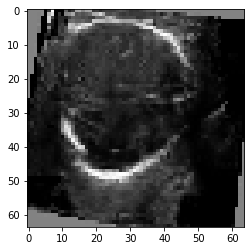

[942/1000] G_loss: 4.539186477661133, D_loss: 0.4321390688419342
[943/1000][0/13]	Loss_D: 0.5060	Loss_G: 3.1577	D(x): 0.7335	D(G(z)): 0.0078 / 0.0504


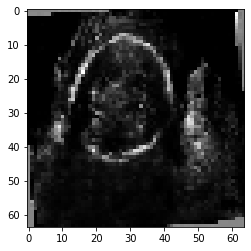

[943/1000] G_loss: 4.299454689025879, D_loss: 0.44559022784233093
[944/1000][0/13]	Loss_D: 0.4623	Loss_G: 3.1943	D(x): 0.7898	D(G(z)): 0.0184 / 0.0435


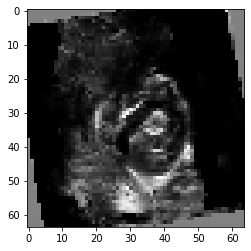

[944/1000] G_loss: 4.100160598754883, D_loss: 0.450677752494812
Saving checkpoint at epoch :  944
[945/1000][0/13]	Loss_D: 0.8919	Loss_G: 6.2875	D(x): 0.9691	D(G(z)): 0.2276 / 0.0023


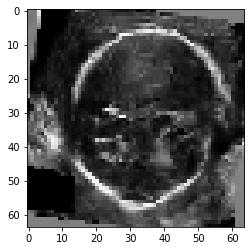

[945/1000] G_loss: 4.583049774169922, D_loss: 0.4928610622882843
[946/1000][0/13]	Loss_D: 0.4287	Loss_G: 4.1903	D(x): 0.8642	D(G(z)): 0.0196 / 0.0134


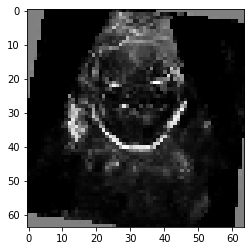

[946/1000] G_loss: 4.385993957519531, D_loss: 0.4411117136478424
[947/1000][0/13]	Loss_D: 0.4490	Loss_G: 3.4870	D(x): 0.8145	D(G(z)): 0.0209 / 0.0369


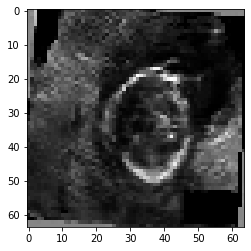

[947/1000] G_loss: 4.411951065063477, D_loss: 0.43660494685173035
[948/1000][0/13]	Loss_D: 0.4013	Loss_G: 3.8834	D(x): 0.8856	D(G(z)): 0.0355 / 0.0201


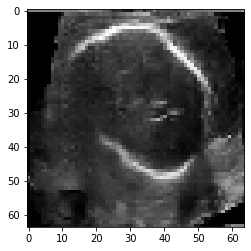

[948/1000] G_loss: 4.149866104125977, D_loss: 0.42978566884994507
[949/1000][0/13]	Loss_D: 0.6142	Loss_G: 5.2338	D(x): 0.9772	D(G(z)): 0.1346 / 0.0050


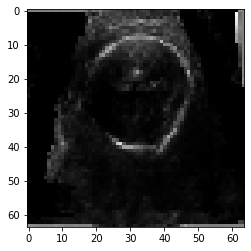

[949/1000] G_loss: 4.5475640296936035, D_loss: 0.47602811455726624
Saving checkpoint at epoch :  949
[950/1000][0/13]	Loss_D: 0.4173	Loss_G: 4.5234	D(x): 0.8928	D(G(z)): 0.0209 / 0.0110


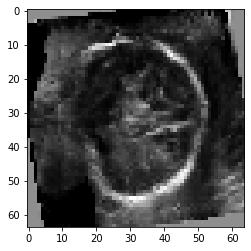

[950/1000] G_loss: 4.331303596496582, D_loss: 0.4265029728412628
[951/1000][0/13]	Loss_D: 0.4258	Loss_G: 4.4043	D(x): 0.8776	D(G(z)): 0.0495 / 0.0121


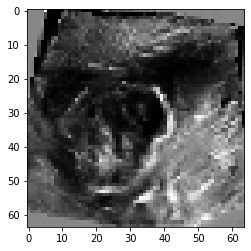

[951/1000] G_loss: 4.413389682769775, D_loss: 0.45270097255706787
[952/1000][0/13]	Loss_D: 0.4025	Loss_G: 4.6403	D(x): 0.8974	D(G(z)): 0.0251 / 0.0101


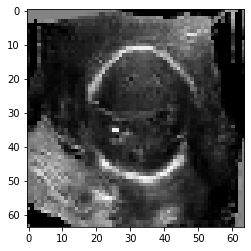

[952/1000] G_loss: 4.509425163269043, D_loss: 0.4150165915489197
[953/1000][0/13]	Loss_D: 0.3972	Loss_G: 4.2393	D(x): 0.8624	D(G(z)): 0.0223 / 0.0144


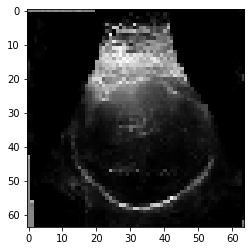

[953/1000] G_loss: 4.349249362945557, D_loss: 0.4339126944541931
[954/1000][0/13]	Loss_D: 0.4612	Loss_G: 4.6244	D(x): 0.9318	D(G(z)): 0.0433 / 0.0090


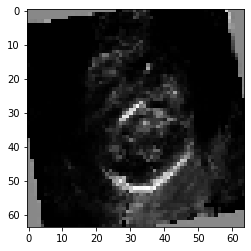

[954/1000] G_loss: 4.421417713165283, D_loss: 0.4288110136985779
Saving checkpoint at epoch :  954
[955/1000][0/13]	Loss_D: 0.4871	Loss_G: 4.8607	D(x): 0.9641	D(G(z)): 0.0635 / 0.0074


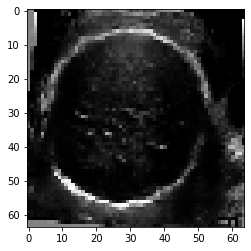

[955/1000] G_loss: 4.667026042938232, D_loss: 0.44339925050735474
[956/1000][0/13]	Loss_D: 0.3956	Loss_G: 4.3773	D(x): 0.8841	D(G(z)): 0.0141 / 0.0117


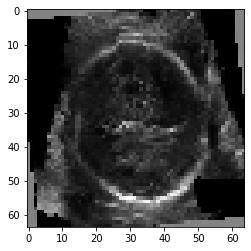

[956/1000] G_loss: 4.337366580963135, D_loss: 0.42056673765182495
[957/1000][0/13]	Loss_D: 0.4533	Loss_G: 5.4273	D(x): 0.9657	D(G(z)): 0.0346 / 0.0041


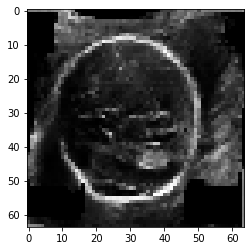

[957/1000] G_loss: 4.474337577819824, D_loss: 0.41738393902778625
[958/1000][0/13]	Loss_D: 0.4495	Loss_G: 4.7811	D(x): 0.9394	D(G(z)): 0.0440 / 0.0072


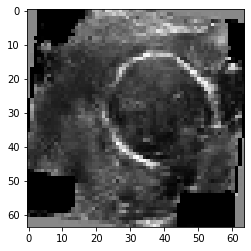

[958/1000] G_loss: 4.384707927703857, D_loss: 0.4135143458843231
[959/1000][0/13]	Loss_D: 0.5240	Loss_G: 5.0772	D(x): 0.9712	D(G(z)): 0.0806 / 0.0048


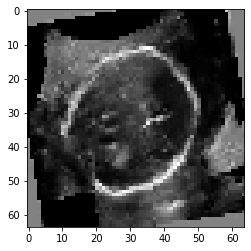

[959/1000] G_loss: 4.4103288650512695, D_loss: 0.4443272352218628
Saving checkpoint at epoch :  959
[960/1000][0/13]	Loss_D: 0.4755	Loss_G: 4.6452	D(x): 0.9487	D(G(z)): 0.0654 / 0.0073


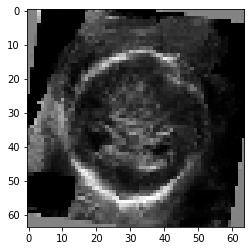

[960/1000] G_loss: 4.573239803314209, D_loss: 0.4470351040363312
[961/1000][0/13]	Loss_D: 0.4287	Loss_G: 4.0869	D(x): 0.8457	D(G(z)): 0.0123 / 0.0196


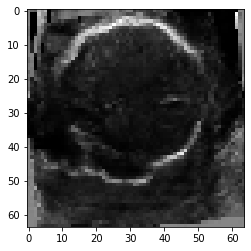

[961/1000] G_loss: 4.290310382843018, D_loss: 0.42477691173553467
[962/1000][0/13]	Loss_D: 0.3927	Loss_G: 4.4314	D(x): 0.9017	D(G(z)): 0.0172 / 0.0113


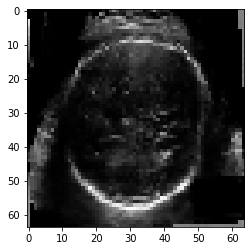

[962/1000] G_loss: 4.430577754974365, D_loss: 0.4088367223739624
[963/1000][0/13]	Loss_D: 0.4344	Loss_G: 3.9285	D(x): 0.7854	D(G(z)): 0.0087 / 0.0205


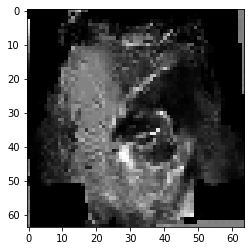

[963/1000] G_loss: 4.371603012084961, D_loss: 0.4139455556869507
[964/1000][0/13]	Loss_D: 0.3967	Loss_G: 4.4664	D(x): 0.8682	D(G(z)): 0.0229 / 0.0133


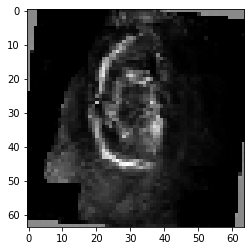

[964/1000] G_loss: 4.591189861297607, D_loss: 0.4378075897693634
Saving checkpoint at epoch :  964
[965/1000][0/13]	Loss_D: 0.4420	Loss_G: 4.3873	D(x): 0.8286	D(G(z)): 0.0147 / 0.0139


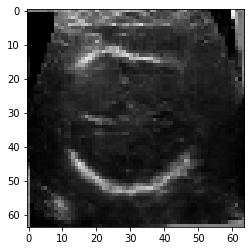

[965/1000] G_loss: 4.414060592651367, D_loss: 0.44971945881843567
[966/1000][0/13]	Loss_D: 0.4248	Loss_G: 4.9375	D(x): 0.9428	D(G(z)): 0.0323 / 0.0068


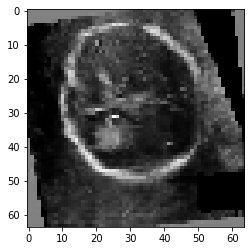

[966/1000] G_loss: 4.566540718078613, D_loss: 0.4754454493522644
[967/1000][0/13]	Loss_D: 0.4392	Loss_G: 3.9815	D(x): 0.8224	D(G(z)): 0.0153 / 0.0255


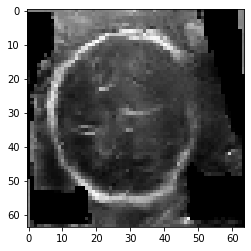

[967/1000] G_loss: 4.450745582580566, D_loss: 0.42267078161239624
[968/1000][0/13]	Loss_D: 0.4610	Loss_G: 5.0170	D(x): 0.9468	D(G(z)): 0.0450 / 0.0052


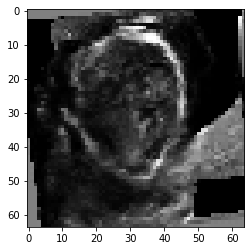

[968/1000] G_loss: 4.399180889129639, D_loss: 0.4409931004047394
[969/1000][0/13]	Loss_D: 0.4178	Loss_G: 3.9042	D(x): 0.8541	D(G(z)): 0.0238 / 0.0178


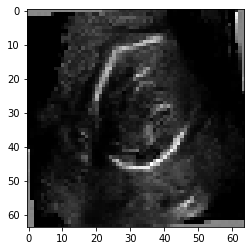

[969/1000] G_loss: 4.344616889953613, D_loss: 0.4172048270702362
Saving checkpoint at epoch :  969
[970/1000][0/13]	Loss_D: 0.5068	Loss_G: 5.3111	D(x): 0.9688	D(G(z)): 0.0708 / 0.0040


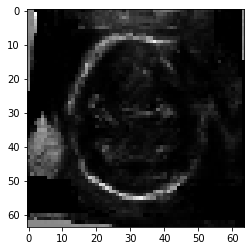

[970/1000] G_loss: 4.5015764236450195, D_loss: 0.43054690957069397
[971/1000][0/13]	Loss_D: 0.4198	Loss_G: 4.8741	D(x): 0.9584	D(G(z)): 0.0281 / 0.0078


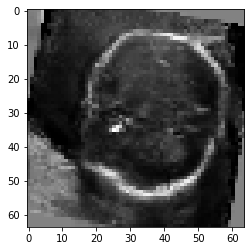

[971/1000] G_loss: 4.600219249725342, D_loss: 0.5088096857070923
[972/1000][0/13]	Loss_D: 0.5245	Loss_G: 5.2304	D(x): 0.9695	D(G(z)): 0.0788 / 0.0059


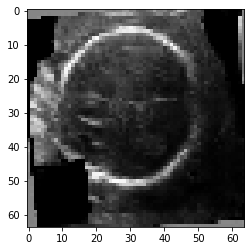

[972/1000] G_loss: 4.612921714782715, D_loss: 0.45180845260620117
[973/1000][0/13]	Loss_D: 0.3996	Loss_G: 4.4851	D(x): 0.8634	D(G(z)): 0.0137 / 0.0140


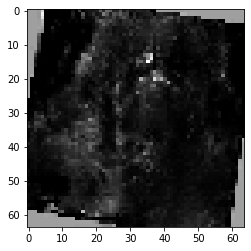

[973/1000] G_loss: 4.421898365020752, D_loss: 0.42562371492385864
[974/1000][0/13]	Loss_D: 0.4106	Loss_G: 4.0425	D(x): 0.8819	D(G(z)): 0.0266 / 0.0176


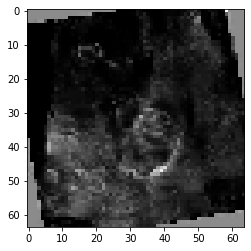

[974/1000] G_loss: 4.509873867034912, D_loss: 0.4367484748363495
Saving checkpoint at epoch :  974
[975/1000][0/13]	Loss_D: 0.4658	Loss_G: 5.4287	D(x): 0.8966	D(G(z)): 0.0393 / 0.0041


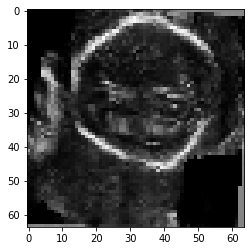

[975/1000] G_loss: 4.6424336433410645, D_loss: 0.45142605900764465
[976/1000][0/13]	Loss_D: 0.3893	Loss_G: 4.7844	D(x): 0.8897	D(G(z)): 0.0162 / 0.0087


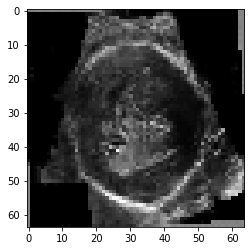

[976/1000] G_loss: 4.318282127380371, D_loss: 0.42513036727905273
[977/1000][0/13]	Loss_D: 0.4337	Loss_G: 4.4806	D(x): 0.9220	D(G(z)): 0.0309 / 0.0107


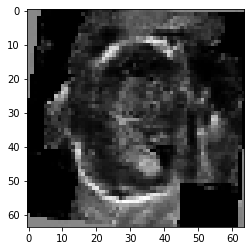

[977/1000] G_loss: 4.525601387023926, D_loss: 0.4548729658126831
[978/1000][0/13]	Loss_D: 0.4487	Loss_G: 3.0735	D(x): 0.8039	D(G(z)): 0.0318 / 0.0624


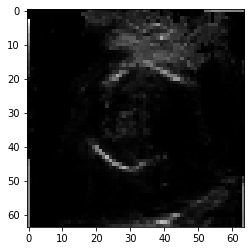

[978/1000] G_loss: 4.465543746948242, D_loss: 0.4308416545391083
[979/1000][0/13]	Loss_D: 0.4144	Loss_G: 4.3380	D(x): 0.8408	D(G(z)): 0.0156 / 0.0129


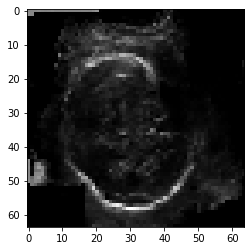

[979/1000] G_loss: 4.250673770904541, D_loss: 0.4196169674396515
Saving checkpoint at epoch :  979
[980/1000][0/13]	Loss_D: 0.4381	Loss_G: 4.4533	D(x): 0.9279	D(G(z)): 0.0488 / 0.0105


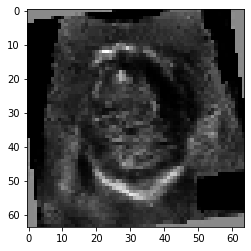

[980/1000] G_loss: 4.513335227966309, D_loss: 0.41555243730545044
[981/1000][0/13]	Loss_D: 0.3977	Loss_G: 4.5599	D(x): 0.8792	D(G(z)): 0.0279 / 0.0100


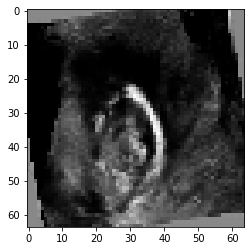

[981/1000] G_loss: 4.343108654022217, D_loss: 0.416887104511261
[982/1000][0/13]	Loss_D: 0.5829	Loss_G: 5.1753	D(x): 0.9715	D(G(z)): 0.1132 / 0.0046


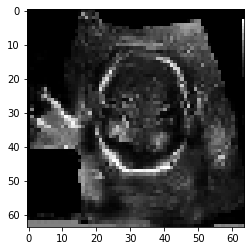

[982/1000] G_loss: 4.525307655334473, D_loss: 0.42072194814682007
[983/1000][0/13]	Loss_D: 0.4036	Loss_G: 4.7029	D(x): 0.9312	D(G(z)): 0.0319 / 0.0090


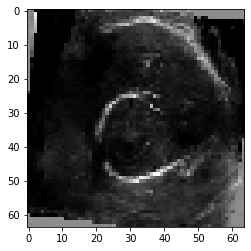

[983/1000] G_loss: 4.504550933837891, D_loss: 0.39939436316490173
[984/1000][0/13]	Loss_D: 0.4220	Loss_G: 3.9988	D(x): 0.8142	D(G(z)): 0.0221 / 0.0206


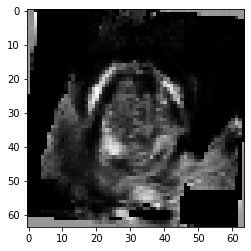

[984/1000] G_loss: 4.422989368438721, D_loss: 0.40680593252182007
Saving checkpoint at epoch :  984
[985/1000][0/13]	Loss_D: 0.4288	Loss_G: 4.4060	D(x): 0.9329	D(G(z)): 0.0462 / 0.0113


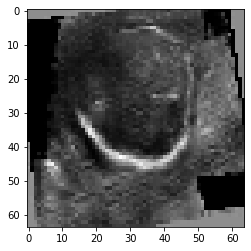

[985/1000] G_loss: 4.4683661460876465, D_loss: 0.43357017636299133
[986/1000][0/13]	Loss_D: 0.4436	Loss_G: 6.3710	D(x): 0.9509	D(G(z)): 0.0435 / 0.0015


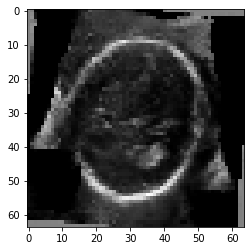

[986/1000] G_loss: 4.746246814727783, D_loss: 0.5235322117805481
[987/1000][0/13]	Loss_D: 0.4634	Loss_G: 4.8153	D(x): 0.9250	D(G(z)): 0.0424 / 0.0074


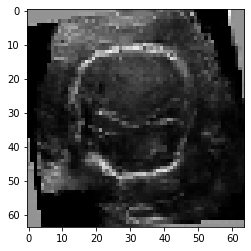

[987/1000] G_loss: 4.515773296356201, D_loss: 0.4764214754104614
[988/1000][0/13]	Loss_D: 0.9086	Loss_G: 2.5359	D(x): 0.5350	D(G(z)): 0.0031 / 0.0994


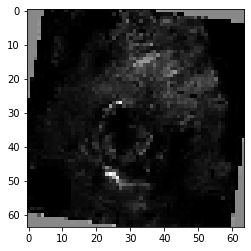

[988/1000] G_loss: 4.560458660125732, D_loss: 0.6472235321998596
[989/1000][0/13]	Loss_D: 0.5625	Loss_G: 4.6757	D(x): 0.9247	D(G(z)): 0.0375 / 0.0090


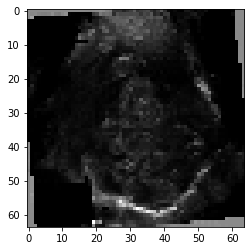

[989/1000] G_loss: 4.468962669372559, D_loss: 0.5266937613487244
Saving checkpoint at epoch :  989
[990/1000][0/13]	Loss_D: 0.5189	Loss_G: 3.7343	D(x): 0.7513	D(G(z)): 0.0124 / 0.0276


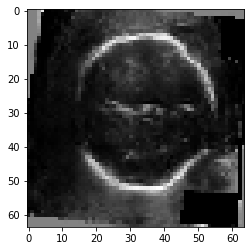

[990/1000] G_loss: 4.179396152496338, D_loss: 0.473516583442688
[991/1000][0/13]	Loss_D: 0.5621	Loss_G: 4.7776	D(x): 0.9551	D(G(z)): 0.1039 / 0.0088


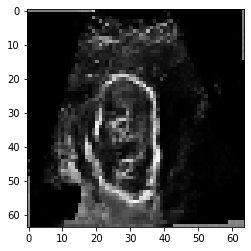

[991/1000] G_loss: 4.539809703826904, D_loss: 0.4590015709400177
[992/1000][0/13]	Loss_D: 0.4474	Loss_G: 3.8516	D(x): 0.8102	D(G(z)): 0.0141 / 0.0262


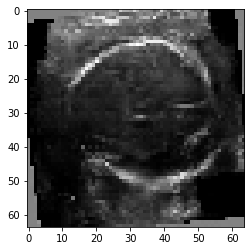

[992/1000] G_loss: 4.472258567810059, D_loss: 0.4572065472602844
[993/1000][0/13]	Loss_D: 0.4708	Loss_G: 3.3695	D(x): 0.7629	D(G(z)): 0.0149 / 0.0401


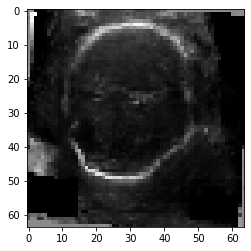

[993/1000] G_loss: 4.328032970428467, D_loss: 0.43390196561813354
[994/1000][0/13]	Loss_D: 0.4220	Loss_G: 4.2206	D(x): 0.8615	D(G(z)): 0.0267 / 0.0159


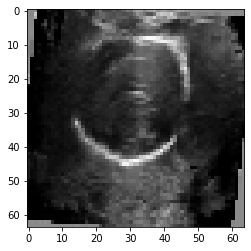

[994/1000] G_loss: 4.522426128387451, D_loss: 0.4294562339782715
Saving checkpoint at epoch :  994
[995/1000][0/13]	Loss_D: 0.4303	Loss_G: 4.1841	D(x): 0.8567	D(G(z)): 0.0203 / 0.0177


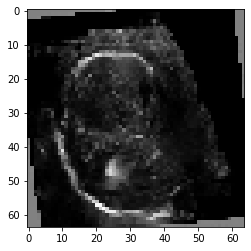

[995/1000] G_loss: 4.32719612121582, D_loss: 0.451663076877594
[996/1000][0/13]	Loss_D: 0.5911	Loss_G: 4.6987	D(x): 0.9711	D(G(z)): 0.1007 / 0.0080


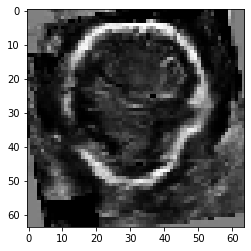

[996/1000] G_loss: 4.568603038787842, D_loss: 0.46688157320022583
[997/1000][0/13]	Loss_D: 0.5381	Loss_G: 3.0788	D(x): 0.7004	D(G(z)): 0.0071 / 0.0604


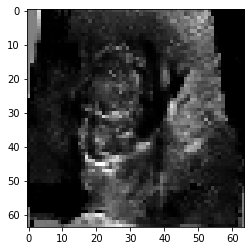

[997/1000] G_loss: 4.405961990356445, D_loss: 0.4460994005203247
[998/1000][0/13]	Loss_D: 0.4102	Loss_G: 3.7411	D(x): 0.8552	D(G(z)): 0.0304 / 0.0241


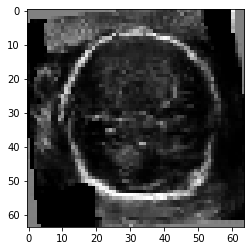

In [ ]:
from PIL import Image
# Training Loop
last_epoch = 0
load_checkpoint = False

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
D_acc_real = []
D_acc_gen = []


if load_checkpoint:
    print(f"loading checkpoint {checkpoint_path}")
    checkpoint = torch.load(checkpoint_path)
    last_epoch = checkpoint['epoch']
    netG.load_state_dict(checkpoint['modelG_state_dict'])
    netD.load_state_dict(checkpoint['modelD_state_dict'])
    optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])
    optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])
    G_losses = checkpoint['G_losses']
    D_losses = checkpoint['D_loss']
    D_acc_real = checkpoint['D_acc_real']
    D_acc_gen = checkpoint['D_acc_gen']

netG.train()
netD.train()

iters = 0
accuracy = Accuracy().to(device)
print("Starting Training Loop...")
# For each epoch
for epoch in range(last_epoch,num_epochs):
    # For each batch in the dataloader
    G_losses_tmp = []
    D_losses_tmp = []
    d_acc_real_tmp = []
    d_acc_gen_tmp = []
    

    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate accuracy on all-real batch
        label_tmp = label.int()
        d_acc_real_tmp.append(accuracy(output, label_tmp))
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Compute accuracy on fake images
        d_acc_gen_tmp.append(accuracy(output, label.int()))
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            with torch.no_grad():
#                 noise  = torch.randn(num_batches,64).to(device)
                generated_data = netG(noise).cpu().view(b_size, 64,64)
                for x in generated_data:
                    plt.imshow(x.detach().numpy(), interpolation='nearest',cmap='gray')
                    plt.show()
                    plt.savefig("/")
                    break

        # Save Losses and FID for plotting later
        G_losses_tmp.append(errG.item())
        D_losses_tmp.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

    
    # Save accuracy of discriminator
    D_acc_real.append(torch.mean(torch.Tensor(d_acc_real_tmp)))
    D_acc_gen.append(torch.mean(torch.Tensor(d_acc_gen_tmp)))
    
    # Save Losses for plotting later
    G_losses.append(torch.mean(torch.Tensor(G_losses_tmp)))
    D_losses.append(torch.mean(torch.Tensor(D_losses_tmp)))

    print(f'[{epoch}/{num_epochs}] G_loss: {G_losses[-1]}, D_loss: {D_losses[-1]}')

    # save checkpoint
    if (epoch+1) % 5 == 0:
        checkpoint = {
          'epoch': epoch+1,
          'modelG_state_dict': netG.state_dict(),
          'modelD_state_dict': netD.state_dict(),
          'optimizerG_state_dict': optimizerG.state_dict(),
          'optimizerD_state_dict': optimizerD.state_dict(),
          'G_losses': G_losses,
          'D_loss': D_losses,
          'D_acc_real': D_acc_real,
          'D_acc_gen': D_acc_gen
        }
        save_checkpoint(checkpoint, checkpoint_path)
        if epoch+1 in [300, 500, 800, 1000]:
            checkpoint_filename = f'../DCGAN64/org_params/800_train_subset_{epoch+1}_epochs.pt'
            save_checkpoint(checkpoint, checkpoint_filename)


## Generating images from pre-trained models

In [ ]:
train_size = [100, 300, 500, 800, 999]
num_epochs = [300, 500, 800, 1000]

num_images_generate = 800

b_size = 1
nz = 100

In [ ]:
for train in train_size:
  for epochs in num_epochs:
    # Initialise generator
    netG = Generator(ngpu).to(device)

    # Handle multi-gpu if desired
    if (device.type == 'cuda') and (ngpu > 1):
      netG = nn.DataParallel(netG, list(range(ngpu)))

    netG.apply(weights_init)

    # Load model
    checkpoint_file = f'../DCGAN64/org_params/{train}_train_subset_{epochs}_epochs.pt'
    checkpoint = torch.load(checkpoint_file)
    netG.load_state_dict(checkpoint['modelG_state_dict'])
    G_loss = checkpoint['G_losses'][-1]
    D_loss = checkpoint['D_loss'][-1]
    print(f'Train size: {train}, epochs: {epochs}, G_loss: {G_loss}, D_loss: {D_loss}')

    # for n in range(num_images_generate):
    with torch.no_grad():
      # create random z variable
      noise = torch.randn(num_images_generate, nz, 1, 1, device=device)

      # generate synthetic image
      gen_images = netG(noise)
      grid = vutils.make_grid(gen_images.detach().cpu(), nrow=6, padding=2, normalize=True)

      # save image to file
      for i in range(gen_images.shape[0]):
        image_filename = f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs/{i}_gen_img.png'
        vutils.save_image(gen_images[i], image_filename, normalize=True)

      grid_filename = f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs_grid.png'
      vutils.save_image(grid, grid_filename)




Train size: 100, epochs: 300, G_loss: 3.9170479774475098, D_loss: 0.7274648547172546
Train size: 100, epochs: 500, G_loss: 4.14565896987915, D_loss: 0.5206023454666138
Train size: 100, epochs: 800, G_loss: 4.089112758636475, D_loss: 0.4225255846977234
Train size: 100, epochs: 1000, G_loss: 4.57837438583374, D_loss: 0.5022327303886414
Train size: 300, epochs: 300, G_loss: 3.5707592964172363, D_loss: 0.6086101531982422
Train size: 300, epochs: 500, G_loss: 4.0449934005737305, D_loss: 0.4795719087123871
Train size: 300, epochs: 800, G_loss: 4.264107704162598, D_loss: 0.46481361985206604
Train size: 300, epochs: 1000, G_loss: 4.397589683532715, D_loss: 0.4454311430454254
Train size: 500, epochs: 300, G_loss: 3.3844072818756104, D_loss: 0.7066841125488281
Train size: 500, epochs: 500, G_loss: 4.235694408416748, D_loss: 0.48843616247177124
Train size: 500, epochs: 800, G_loss: 4.706021308898926, D_loss: 0.6719717979431152
Train size: 500, epochs: 1000, G_loss: 4.391010284423828, D_loss: 0.42

In [ ]:
train_size = [100, 300, 500, 800, 999]
num_epochs = [300, 500, 800, 1000]

num_images_generate = 30

b_size = 1
nz = 100

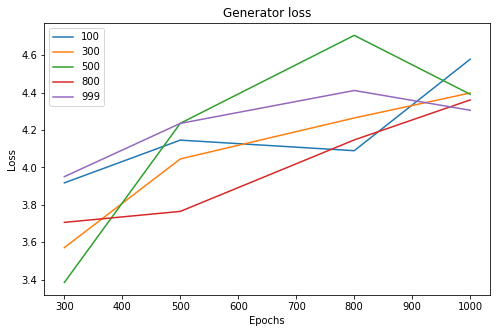

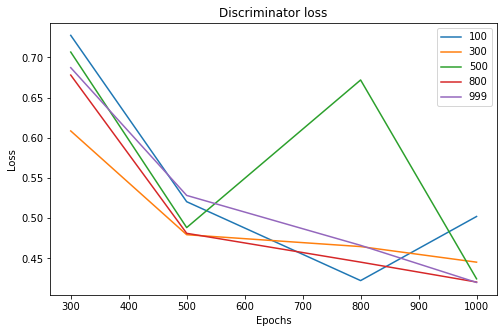

In [ ]:
train_size_loss_gen = np.ones((5,4))
train_size_loss_dis = np.ones((5,4))
for idx, train in enumerate(train_size):
  G_loss_epoch = []
  D_loss_epoch=[]
  for epochs in num_epochs:
    # Load model
    checkpoint_file = f'../DCGAN64/org_params/{train}_train_subset_{epochs}_epochs.pt'
    checkpoint = torch.load(checkpoint_file)
    G_loss_epoch.append(checkpoint['G_losses'][-1])
    D_loss_epoch.append(checkpoint['D_loss'][-1])

  
  train_size_loss_gen[idx] = np.array(G_loss_epoch)
  train_size_loss_dis[idx] = np.array(D_loss_epoch)


titles = ["100", "300", "500", "800", "999"]

plt.figure(figsize=(8,5))
for i in range(5):
  plt.plot(num_epochs, train_size_loss_gen[i])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Generator loss')
plt.legend(titles)


plt.figure(figsize=(8,5))
for i in range(5):
  plt.plot(num_epochs, train_size_loss_dis[i])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Discriminator loss')
plt.legend(titles)


## Graphing loss 

In [ ]:
train_size = [100, 300, 500, 800, 999]
num_epochs = [300, 500, 800, 1000]

num_images_generate = 30

b_size = 1
nz = 100

Text(0.5, 1.0, 'Discriminator loss')

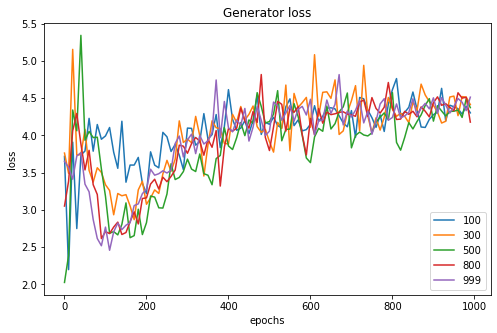

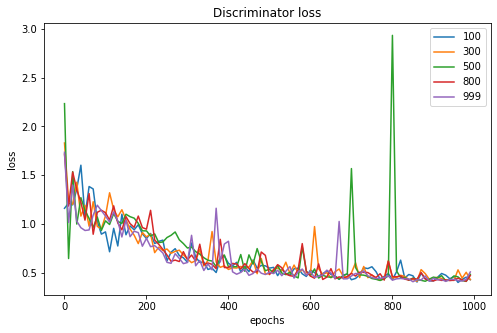

In [ ]:
train_size_loss_gen = np.ones((5,1000))
train_size_loss_dis = np.ones((5,1000))


fig1 = plt.figure(1,figsize=(8,5))
fig1 = plt.figure(2,figsize=(8,5))
for idx, train in enumerate(train_size):
  # Load model
  checkpoint_file = f'../DCGAN64/org_params/{train}_train_subset_1000_epochs.pt'
  checkpoint = torch.load(checkpoint_file)
  G_loss = np.array(checkpoint['G_losses'])
  D_loss = np.array(checkpoint['D_loss'])

  plt.figure(1)
  plt.plot(np.arange(0,1000,10), G_loss[np.arange(0,1000,10)], label=str(train))
  plt.figure(2)
  plt.plot(np.arange(0,1000,10), D_loss[np.arange(0,1000,10)], label=str(train))

plt.figure(1)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.title('Generator loss')
plt.figure(2)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.title('Discriminator loss')

## Calculate FID

In [ ]:
# install dependencies
!pip install pytorch-fid

In [ ]:
!unzip '../head_cirumference.zip'

In [ ]:
!rm -rf '/content/test_head_cirumference'
!mkdir '/content/test_head_cirumference'

In [ ]:
# take 800 random images from '/content/head_cirumference'
from os import listdir
import random
from PIL import Image

num_images_generate = 800
source_dir = '/content/head_cirumference/training_set/'
target_dir = '/content/test_head_cirumference/'

image_list = listdir(source_dir)

random_files = random.sample(image_list, num_images_generate)

for rand_file in random_files:
  image = Image.open(source_dir+rand_file)
  image = image.resize((64,64),Image.ANTIALIAS) #synthetic and real images have to be the same size
  image.save(fp=target_dir+rand_file)

print(len(listdir(target_dir)))

Print FID for each set of images

In [ ]:
%%shell
for train in {100,300,500,800,999}
do
  for epochs in {300,500,800,1000}
  do
  echo "------------Train: $train Epochs: $epochs-------------"
  python -m pytorch_fid "../DCGAN64/org_params/${train}_train_images/${epochs}_epochs"  --device cuda:0
  done
done

Text(0.5, 1.0, 'FID scores for DCGAN64')

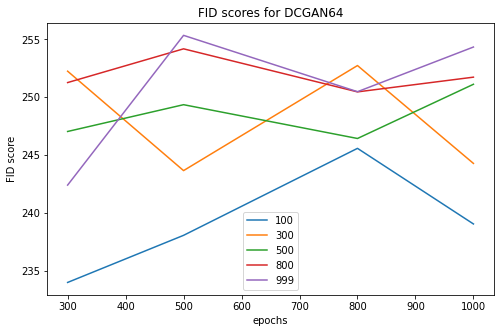

In [ ]:
# plotting FID
train_size = [100, 300, 500, 800, 999]
num_epochs = [300, 500, 800, 1000]

# results from above cell
FID_scores = {100:[233.9837526,238.056693,245.5770374,239.040312],
              300:[252.2480144,243.652638,252.7360358,244.274656],
              500:[247.0357406,249.351961,246.4298585,251.116685],
              800:[251.2641894,254.18128,250.4588947,251.731672],
              1000:[242.3996757,255.346145,250.4748361,254.336808]}

plt.figure(figsize=(8,5))
for idx, key in enumerate(FID_scores.keys()):
  plt.plot(num_epochs,FID_scores[key], label=str(train_size[idx]))

plt.legend()
plt.xlabel('epochs')
plt.ylabel('FID score')
plt.title('FID scores for DCGAN64')


## Calculating PSNR

In [ ]:
from os import listdir
import math
import cv2

def PSNR(org, gen):
  mse = np.mean((org - gen) ** 2)
  return 10*math.log10((((2**8)-1)**2)/mse)

train_size = [100, 300, 500, 800, 999]
num_epochs = [300, 500, 800, 1000]
num_images_for_calc = 800

image_list_org = listdir('/content/test_head_cirumference/')

train_psnr = np.ones((5,4))
train_psnr_std = np.ones((5,4))

for idx, train in enumerate(train_size):
  epochs_psnr = []
  epochs_psnr_std = []

  for epochs in num_epochs:
    print(f'----{train}/{epochs}------')

    img_dir = f'../results/DCGAN64/org_params/{train}_train_images/{epochs}_epochs/'
    image_list = listdir(img_dir)
    # get filenames for number of images
    random_files = random.sample(image_list, num_images_for_calc-1)

    mean_psnr = []
    for file in random_files:
      # get random file from original data
      rand_idx = random.randint(0,len(image_list_org)-1)
      org_file = image_list_org[rand_idx]
      
      # get images
      org = cv2.imread(f'/content/test_head_cirumference/{org_file}', 0)
      gen = cv2.imread(f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs/{file}', 0)
      if org is None:
        continue
      if gen is None:
        continue
      # get PSNR value
      psnr = PSNR(org,gen)
      mean_psnr.append(psnr)
    
    epochs_psnr_std.append(np.std(mean_psnr))
    mean_psnr = np.mean(mean_psnr)
    epochs_psnr.append(mean_psnr)

  train_psnr[idx] = epochs_psnr
  train_psnr_std[idx] = epochs_psnr_std


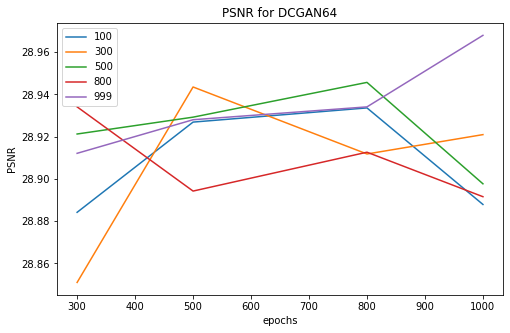

In [ ]:
plt.figure(figsize=(8,5))
for i in range(5):
  plt.plot(num_epochs,train_psnr[i], label=str(train_size[i]))

plt.xlabel('epochs')
plt.ylabel('PSNR')
plt.title('PSNR for DCGAN64')
plt.legend()

In [ ]:
import pandas as pd
pd.DataFrame(train_psnr)

,0,1,2,3
0,28.884165,28.926852,28.933563,28.887883
1,28.850991,28.943465,28.911768,28.920927
2,28.921218,28.929188,28.945634,28.897657
3,28.934059,28.894221,28.912603,28.891557
4,28.912079,28.927969,28.934053,28.967888


In [ ]:
pd.DataFrame(train_psnr_std)

,0,1,2,3
0,0.787050,0.823437,0.859183,0.803105
1,0.791940,0.816789,0.814446,0.823155
2,0.839509,0.830570,0.823020,0.840930
3,0.840044,0.809210,0.792913,0.784855
4,0.774905,0.814193,0.805141,0.866763


## Calculating MI

In [ ]:
def mutual_information(hgram):
  """ Mutual information for joint histogram
  """
  # Convert bins counts to probability values
  pxy = hgram / float(np.sum(hgram))
  px = np.sum(pxy, axis=1) # marginal for x over y
  py = np.sum(pxy, axis=0) # marginal for y over x
  px_py = px[:, None] * py[None, :] # Broadcast to multiply marginals
  # Now we can do the calculation using the pxy, px_py 2D arrays
  nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
  return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))


num_images_generate = 800
image_list_org = listdir('/content/test_head_cirumference/')

train_mi = np.ones((5,4))
train_mi_std = np.ones((5,4))

for idx, train in enumerate(train_size):
  epochs_mi = []
  epochs_mi_std = []

  for epochs in num_epochs:
    print(f'----{train}/{epochs}------')

    img_dir = f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs/'
    image_list = listdir(img_dir)
    # get filenames for number of images
    random_files = random.sample(image_list, num_images_generate)

    mean_mi = []
    for file in random_files:
      # get random file from original data
      rand_idx = random.randint(0,len(image_list_org)-1)
      org_file = image_list_org[rand_idx]
      
      # get images
      org = cv2.imread(f'/content/test_head_cirumference/{org_file}', 0)
      gen = cv2.imread(f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs/{file}', 0)
      if org is None:
        continue
      if gen is None:
        continue
      hist_2d, x_edges, y_edges = np.histogram2d(
        org.ravel(),
        gen.ravel(),
        bins=20)

      mi = mutual_information(hist_2d)
      mean_mi.append(mi)
    
    epochs_mi_std.append(np.std(mean_mi))
    mean_mi = np.mean(mean_mi)
    epochs_mi.append(mean_mi)

  train_mi[idx] = epochs_mi
  train_mi_std[idx] = epochs_mi_std

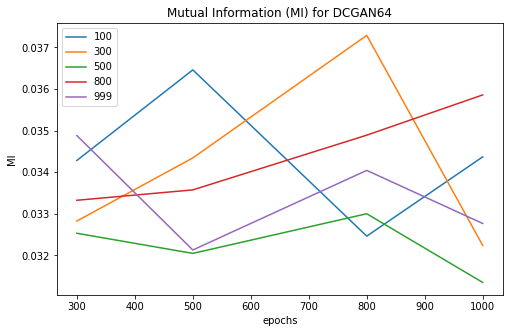

In [ ]:
plt.figure(figsize=(8,5))
for i in range(5):
  plt.plot(num_epochs,train_mi[i], label=str(train_size[i]))

plt.xlabel('epochs')
plt.ylabel('MI')
plt.title('Mutual Information (MI) for DCGAN64')
plt.legend()

In [ ]:
import pandas as pd
pd.DataFrame(train_mi)

,0,1,2,3
0,0.034284,0.036461,0.032464,0.034370
1,0.032828,0.034345,0.037292,0.032243
2,0.032533,0.032050,0.033003,0.031351
3,0.033327,0.033576,0.034892,0.035860
4,0.034882,0.032131,0.034045,0.032769


In [ ]:
pd.DataFrame(train_mi_std)

,0,1,2,3
0,0.012000,0.015779,0.012785,0.014504
1,0.012127,0.013515,0.013717,0.013968
2,0.013599,0.013041,0.014709,0.015269
3,0.014067,0.013767,0.013093,0.014567
4,0.014332,0.014636,0.013448,0.012443


## Calculating LBP vector

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


def get_pixel(img, center, x, y):
	
	new_value = 0
	
	try:
		# If local neighbourhood pixel
		# value is greater than or equal
		# to center pixel values then
		# set it to 1
		if img[x][y] >= center:
			new_value = 1
			
	except:
		# Exception is required when
		# neighbourhood value of a center
		# pixel value is null i.e. values
		# present at boundaries.
		pass
	
	return new_value

# Function for calculating LBP
def lbp_calculated_pixel(img, x, y):

	center = img[x][y]

	val_ar = []
	
	# top_left
	val_ar.append(get_pixel(img, center, x-1, y-1))
	
	# top
	val_ar.append(get_pixel(img, center, x-1, y))
	
	# top_right
	val_ar.append(get_pixel(img, center, x-1, y + 1))
	
	# right
	val_ar.append(get_pixel(img, center, x, y + 1))
	
	# bottom_right
	val_ar.append(get_pixel(img, center, x + 1, y + 1))
	
	# bottom
	val_ar.append(get_pixel(img, center, x + 1, y))
	
	# bottom_left
	val_ar.append(get_pixel(img, center, x + 1, y-1))
	
	# left
	val_ar.append(get_pixel(img, center, x, y-1))
	
	# Now, we need to convert binary
	# values to decimal
	power_val = [1, 2, 4, 8, 16, 32, 64, 128]

	val = 0
	
	for i in range(len(val_ar)):
		val += val_ar[i] * power_val[i]
		
	return val

def lbp(image_file):
	img_bgr = cv2.imread(image_file,0)
	if img_bgr is None:
		return None
	height, width = img_bgr.shape

	# Create a numpy array as the same height and width of RGB image
	img_lbp = np.zeros((height, width), np.uint8)
  
	for i in range(0, height):
		for j in range(0, width):
			img_lbp[i, j] = lbp_calculated_pixel(img_bgr, i, j)
  
	return img_lbp

def lbp_vector(img_lbp):
	n_bins = int(256)
	hist, _ = np.histogram(img_lbp.ravel(), n_bins)
	# plt.hist(img_lbp.ravel(), density=True, bins=n_bins, range=(0, n_bins), facecolor='0.5')
	return [hist[7], hist[14], hist[19], hist[127], hist[134], hist[142], hist[239], hist[247]]



#----------------------------------------------------------------------------------------------
train_size = [100, 300, 500, 800, 999]
num_epochs = [300, 500, 800, 1000]
num_images_for_calc = 300

image_list_org = listdir('/content/test_head_cirumference/')

train_lbpv = np.zeros((5,4,8))
train_lbpv_std = np.zeros((5,4,8))
for idx, train in enumerate(train_size):
	epochs_lbpv = []
	epochs_lbpv_std = []
	for i, epochs in enumerate(num_epochs):
		print(f'----{train}/{epochs}------')
		img_dir = f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs/'
		image_list = listdir(img_dir)
		# get filenames for number of images
		random_files = random.sample(image_list, num_images_for_calc-1)

		sum_V = np.zeros((1,8))
		v1 = []
		v2 = []
		v3 = []
		v4 = []
		v5 = []
		v6 = []
		v7 = []
		v8 = []
		n=0
		for f in random_files:
			fname = f'../DCGAN64/org_params/{train}_train_images/{epochs}_epochs/{f}'
			img_lbp = lbp(fname)
			if img_lbp is None:
				continue
			V = lbp_vector(img_lbp)
			sum_V = np.add(sum_V, V)
			v1.append(V[0])
			v2.append(V[1])
			v3.append(V[2])
			v4.append(V[3])
			v5.append(V[4])
			v6.append(V[5])
			v7.append(V[6])
			v8.append(V[7])
			n += 1
		
		mean_V = sum_V/n
		std_V = np.array([np.std(v1), np.std(v2), np.std(v3), np.std(v4), np.std(v5), np.std(v6), np.std(v7), np.std(v8)])
		for v in range(mean_V.shape[1]):
			train_lbpv[idx,i,v] = mean_V[0][v]
			train_lbpv_std[idx,i,v] = std_V[v]



In [ ]:
# get reference vector
num_images_for_calc = 800

ref_img_dir = '/content/test_head_cirumference/'
image_list_org = listdir('/content/test_head_cirumference/')
# get filenames for number of images
random_files = random.sample(image_list_org, num_images_for_calc-1)

sum_V = np.zeros((1,8))
n=0
for f in random_files:
  img_lbp = lbp(ref_img_dir+f)
  if img_lbp is None:
    continue
  V = lbp_vector(img_lbp)
  sum_V = np.add(sum_V, V)
  n += 1

ref_mean_V = sum_V/n

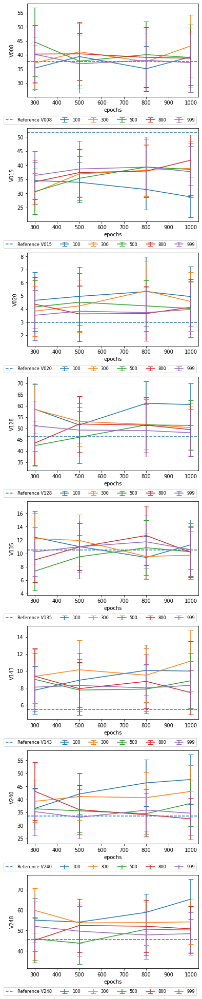

In [ ]:
# plotting results
train_size = [100,300,500,800,999]
num_epochs = [300,500,800,1000]
vector_label = ['V008','V015','V020','V128','V135','V143','V240','V248']

plt.figure(figsize=(6,35))
for v in range(8):
  ax = plt.subplot(8,1,v+1)
  # plot reference
  plt.axhline(y=ref_mean_V[0][v], linestyle='--',label=f'Reference {vector_label[v]}')
  for idx, train in enumerate(train_size):
    plt.errorbar(num_epochs,train_lbpv[idx,:,v],yerr=train_lbpv_std[idx,:,v],label=str(train), capsize=5)
  box = ax.get_position()
  ax.set_position([box.x0, box.y0 + box.height * 0.1,
                 box.width, box.height * 0.9])
  plt.xlabel('epochs')
  plt.ylabel(vector_label[v])
  plt.legend(loc='upper right', fontsize='small',bbox_to_anchor=(1, -0.18), ncol=6)